In [1]:
%load_ext pycodestyle_magic
%flake8_on
%load_ext autoreload

In [2]:
%autoreload 2

In [334]:
"""Python code to classify X-ray sources by color.

Functionalities needed.

1. Line, step, scatter and histogram and kde plots
2. Plot net counts, bg/net and S/N ratio
3. Process detectors seperately and combine colors only optional
4. Cross-match 4XMM and CSC sources.
5. Compare with Haley et al. sources.
"""


import copy
import os
import glob2
import warnings
import xspec
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
from scipy.ndimage import median_filter


# Plot functions
def set_plotparams(plottype):
    """Set plot parameters."""
    if plottype == 'notebook':
        plt.rcParams["figure.figsize"] = (20, 15)
        plt.rcParams["axes.titlesize"] = 24
        plt.rcParams["axes.labelsize"] = 24
        plt.rcParams["lines.linewidth"] = 3
        plt.rcParams["lines.markersize"] = 15
        plt.rcParams["xtick.labelsize"] = 20
        plt.rcParams["ytick.labelsize"] = 20
        plt.rcParams["legend.fontsize"] = 20
        plt.rcParams['xtick.major.size'] = 16
        plt.rcParams['xtick.minor.size'] = 8
        plt.rcParams['ytick.major.size'] = 16
        plt.rcParams['ytick.minor.size'] = 8
        plt.rcParams['xtick.top'] = True
        plt.rcParams['ytick.right'] = True
        plt.rcParams['xtick.direction'] = 'inout'
        plt.rcParams['ytick.direction'] = 'inout'
    elif plottype == 'presentation':
        plt.rcParams["figure.figsize"] = (8, 6)
        plt.rcParams["axes.titlesize"] = 16
        plt.rcParams["axes.labelsize"] = 14
        plt.rcParams["lines.linewidth"] = 3
        plt.rcParams["lines.markersize"] = 5
        plt.rcParams["xtick.labelsize"] = 12
        plt.rcParams["ytick.labelsize"] = 12
        plt.rcParams["legend.fontsize"] = 12
        plt.rcParams['xtick.major.size'] = 8
        plt.rcParams['xtick.minor.size'] = 4
        plt.rcParams['ytick.major.size'] = 8
        plt.rcParams['ytick.minor.size'] = 4
        plt.rcParams['xtick.top'] = True
        plt.rcParams['ytick.right'] = True
        plt.rcParams['xtick.direction'] = 'inout'
        plt.rcParams['ytick.direction'] = 'inout'
    elif plottype == 'paper1':
        plt.rcParams["figure.figsize"] = (4, 3)
        plt.rcParams["axes.titlesize"] = 14
        plt.rcParams["axes.labelsize"] = 12
        plt.rcParams["lines.linewidth"] = 2
        plt.rcParams["lines.markersize"] = 2
        plt.rcParams["xtick.labelsize"] = 10
        plt.rcParams["ytick.labelsize"] = 10
        plt.rcParams["legend.fontsize"] = 10
        plt.rcParams['xtick.major.size'] = 6
        plt.rcParams['xtick.minor.size'] = 3
        plt.rcParams['ytick.major.size'] = 6
        plt.rcParams['ytick.minor.size'] = 3
        plt.rcParams['xtick.top'] = True
        plt.rcParams['ytick.right'] = True
        plt.rcParams['xtick.direction'] = 'in'
        plt.rcParams['ytick.direction'] = 'in'
    elif plottype == 'paper2':
        plt.rcParams["figure.figsize"] = (8, 6)
        plt.rcParams["axes.titlesize"] = 20
        plt.rcParams["axes.labelsize"] = 12
        plt.rcParams["lines.linewidth"] = 2
        plt.rcParams["lines.markersize"] = 2
        plt.rcParams["xtick.labelsize"] = 10
        plt.rcParams["ytick.labelsize"] = 10
        plt.rcParams["legend.fontsize"] = 10
        plt.rcParams['xtick.major.size'] = 6
        plt.rcParams['xtick.minor.size'] = 3
        plt.rcParams['ytick.major.size'] = 6
        plt.rcParams['ytick.minor.size'] = 3
        plt.rcParams['xtick.top'] = True
        plt.rcParams['ytick.right'] = True
        plt.rcParams['xtick.direction'] = 'in'
        plt.rcParams['ytick.direction'] = 'in'


def plotline_scatter(xdatas, ydatas,
                     pl_types=None, axs=None, xlabel=None,
                     ylabel=None, pl_labels=None, styles=None, colors=None,
                     yscale='linear', title=None, ylim=None, figsize=None,
                     cmap='coolwarm_r', zdatas=None, zdata_label=None,
                     plot_cbar=True, cbar_ax=None):
    """Plot line, step and scatter plots."""
    if zdatas is None:
        zdatas = [None]*len(ydatas)
    if pl_types is None:
        pl_types = ['line']*len(ydatas)
    if axs is None:
        fig, axs = plt.subplots(figsize=figsize)
    if pl_labels is None:
        pl_labels = [None]*len(ydatas)
    if styles is None:
        styles = ['-']*len(ydatas)
    if colors is None:
        if len(ydatas) <= 4:
            colors = ['#004488', '#ddaa33', '#bb5566', '#000000']
        elif len(ydatas) <= 9:
            colors = ['#000000', '#00287c', '#89003e', '#6e5700', '#008f75',
                      'b57de9', 'ff9468', '9cee81', '00d2ff']
        else:
            warnings.warn('Too many plot elements. Colors will be repeated.')
            colors = (['#000000', '#00287c', '#89003e', '#6e5700', '#008f75',
                      '#b57de9', '#ff9468', '#9cee81', '#00d2ff'] *
                      (int(len(ydatas/9)+1)))

    axs.set_title(title)
    if ylim is not None:
        axs.set_ylim(ylim[0], ylim[1])
    axs.set_xlabel(xlabel)
    axs.set_xscale('log')
    axs.set_yscale(yscale)
    axs.set_ylabel(ylabel)
    for i, pl_type in enumerate(pl_types):
        if pl_type == 'line':
            axs.plot(xdatas[i], ydatas[i], linestyle=styles[i],
                     label=pl_labels[i], color=colors[i])
        elif pl_type == 'scatter':
            if styles[i] == '-':
                styles[i] = '.'
            if zdatas[i] is not None:
                
                sc_plot = axs.scatter(
                    xdatas[i], ydatas[i], c=zdatas[i], marker=styles[i],
                    label=pl_labels[i], cmap=cmap,
                    norm=Normalize(-3, 15, True))
                if plot_cbar and cbar_ax is None:
                    cbar = plt.colorbar(mappable=sc_plot, ax=axs,
                                        label=zdata_label)
                elif plot_cbar:
                    cbar = plt.colorbar(mappable=sc_plot, cax=cbar_ax,
                                        label=zdata_label)
            else:
                axs.scatter(xdatas[i], ydatas[i], marker=styles[i],
                            label=pl_labels[i], color=colors[i])
        elif pl_type == 'step':
            ydatas[i] = np.append(ydatas[i], ydatas[i].copy()[-1])
            axs.step(xdatas[i], ydatas[i], where='post', linestyle=styles[i],
                     label=pl_labels[i], color=colors[i])
        else:
            print(pl_types)
            raise ValueError("pl_type can only be 'line' or 'scatter'. Got " +
                             pl_type)
    axs.legend()
    return axs


def plothist(data_arr, data2=None, axs=None, bins=None, xlabel=None,
             ylabel=None, pl_labels=None, pl_type=None, cbar_label=None,
             colors=None):
    """Plot 1D and 2D histograms."""
    if axs is None:
        fig, axs = plt.subplots()
    if pl_type is None:
        pl_type = 'withoutkde'
    if pl_labels is None and isinstance(data_arr[0], (list, np.ndarray)):
        pl_labels = [None]*len(data_arr)
    if colors is None:
        if len(data_arr) <= 4:
            colors = ['#004488', '#ddaa33', '#bb5566', '#000000']
        elif len(data_arr) <= 9:
            colors = ['#000000', '#00287c', '#89003e', '#6e5700', '#008f75',
                      'b57de9', 'ff9468', '9cee81', '00d2ff']
        else:
            warnings.warn('Too many plot elements. Colors will be repeated.')
            colors = (['#000000', '#00287c', '#89003e', '#6e5700', '#008f75',
                      '#b57de9', '#ff9468', '#9cee81', '#00d2ff'] *
                      (int(len(data_arr/9)+1)))
    if colors is None and data2 is not None:
        colors = 'plasma_r'
    axs.set_xlabel(xlabel)
    if data2 is None:
        if pl_type == 'withkde':
            if ylabel is None:
                ylabel = 'Density per bin'
            axs.set_ylabel(ylabel)
            axs.hist(data_arr, bins=bins, density=True, label=pl_labels,
                     color=colors[:len(data_arr)])[:-1]
            if not isinstance(data_arr[0], (list, np.ndarray)):
                data_arr = [data_arr]
            for i, data in enumerate(data_arr):
                if pl_labels[i] is not None:
                    sns.kdeplot(x=data, label=pl_labels[i]+'_kde', ax=axs,
                                color=colors[i])
                else:
                    sns.kdeplot(x=data, ax=axs)
            axs.legend()
        else:
            if ylabel is None:
                ylabel = '# per bin'
            axs.set_ylabel(ylabel)
            axs.hist(data_arr, bins=bins, label=pl_labels,
                     color=colors[:len(data_arr)])[:-1]
            axs.legend()
    else:
        # 2D hist
        axs.set_ylabel(ylabel)
        if bins is None:
            bins = 10
        if pl_type == 'withkde':
            histplot = axs.hist2d(data_arr, data2, bins=bins, density=True,
                                  cmap=colors)[-1]
            sns.kdeplot(x=data_arr, y=data2, ax=axs)
            cbar = plt.colorbar(mappable=histplot, ax=axs, color='k')
            if cbar_label is None:
                cbar_label = 'Density per bin'
            cbar.set_label(cbar_label)
        else:
            histplot = axs.hist2d(data_arr, data2)[-1]
            cbar = plt.colorbar(mappable=histplot, ax=axs)
            if cbar_label is None:
                cbar_label = '# per bin'
            cbar.set_label(cbar_label)
    return axs


def plot_subplots(numrows, numcols, xdatas_arr, ydatas_arr, title=None,
                  subp_types_arr=None, pl_types_arr=None, xlabel_arr=None,
                  ylabel_arr=None, pl_labels_arr=None, styles_arr=None,
                  bins_arr=None, cbar_labels=None, yscale_arr=None,
                  ylim_arr=None, colors_arr=None, zdatas_arr=None,
                  zdata_labels=None, common_cbar=False):
    """Plot subplots"""
    if subp_types_arr is None:
        subp_types_arr = [['linescatter']*numcols]*numrows
    if pl_types_arr is None:
        pl_types_arr = [[None]*numcols]*numrows
    if pl_labels_arr is None:
        pl_labels_arr = [[None]*numcols]*numrows
    if xlabel_arr is None:
        xlabel_arr = [[None]*numcols]*numrows
    if ylabel_arr is None:
        ylabel_arr = [[None]*numcols]*numrows
    if styles_arr is None:
        styles_arr = [[None]*numcols]*numrows
    if bins_arr is None:
        bins_arr = [[None]*numcols]*numrows
    if cbar_labels is None:
        cbar_labels = [[None]*numcols]*numrows
    if yscale_arr is None:
        yscale_arr = [['linear']*numcols]*numrows
    if ylim_arr is None:
        ylim_arr = [[None]*numcols]*numrows
    if colors_arr is None:
        colors_arr = [[None]*numcols]*numrows
    if zdatas_arr is None:
        zdatas_arr = [[None]*numcols]*numrows
    if zdata_labels is None:
        zdata_labels = [[None]*numcols]*numrows

    # Checking if all the arrays are 2D
    if not isinstance(subp_types_arr[0], list):
        subp_types_arr = list(map(list, zip(*[subp_types_arr])))
    if not isinstance(pl_labels_arr[0], list):
        pl_labels_arr = list(map(list, zip(*[pl_labels_arr])))
    if not isinstance(xlabel_arr[0], list):
        xlabel_arr = list(map(list, zip(*[xlabel_arr])))
    if not isinstance(ylabel_arr[0], list):
        ylabel_arr = list(map(list, zip(*[ylabel_arr])))

    # Calling the figure and axes
    fig, axes = plt.subplots(numrows, numcols)
    fig.suptitle(title)
    if numrows > 1 or numcols > 1:
        axes = axes.reshape(numrows, numcols)
    else:
        axes = [[axes]]
    plt.rcParams["legend.fontsize"] = (
        float(plt.rcParams["legend.fontsize"]) - 4*(numcols-1))
    print(plt.rcParams["legend.fontsize"])
    if numrows == 1 and numcols == 1:
        initial_figsize = plt.rcParams["figure.figsize"]
        plt.rcParams["figure.figsize"] = (12, 9)
    if common_cbar:
        fig.subplots_adjust(right=0.9)
        cbar_ax = fig.add_axes([0.95, 0.07, 0.02, 0.9])
    else:
        cbar_ax = None
    for i in range(numrows):
        for j in range(numcols):
            if subp_types_arr[i][j] == 'linescatter':
                plotline_scatter(
                    xdatas_arr[i][j], ydatas_arr[i][j], pl_types_arr[i][j],
                    axs=axes[i][j], xlabel=xlabel_arr[i][j],
                    ylabel=ylabel_arr[i][j], pl_labels=pl_labels_arr[i][j],
                    styles=styles_arr[i][j], yscale=yscale_arr[i][j],
                    ylim=ylim_arr[i][j], colors=colors_arr[i][j],
                    zdatas=zdatas_arr[i][j], zdata_label=zdata_labels[i][j],
                    cbar_ax=cbar_ax, plot_cbar=True)
            elif subp_types_arr[i][j] == 'hist':
                plothist(xdatas_arr[i][j], ydatas_arr[i][j], axs=axes[i][j],
                         bins=bins_arr[i][j], xlabel=xlabel_arr[i][j],
                         ylabel=ylabel_arr[i][j],
                         pl_labels=pl_labels_arr[i][j],
                         pl_type=pl_types_arr[i][j],
                         cbar_label=cbar_labels[i][j], colors=colors_arr[i][j])
            else:
                print('subplot type can be linescatter or hist')
    if cbar_ax is None:
        plt.tight_layout()
    else:
        plt.tight_layout(rect=[0, 0, 0.95, 1.0])
        pass
    plt.rcParams["legend.fontsize"] = (
        float(plt.rcParams["legend.fontsize"]) + 4*(numcols-1))
    if numrows == 1 and numcols == 1:
        plt.rcParams["figure.figsize"] = initial_figsize
    return fig, axes


def filter_specs(net_counts, bg_counts, min_netcounts=None, maxbg_ratio=None,
                 det_mask=None):
    """Filter specs."""
    bgratio = bg_counts/net_counts
    filter_mask = det_mask.copy()
    if det_mask is None:
        det_mask = np.ones(len(net_counts), dtype=bool)
    if min_netcounts is not None:
        filter_mask[net_counts < min_netcounts] = False
    if maxbg_ratio is not None:
        filter_mask[bgratio > maxbg_ratio] = False
    return filter_mask


def load_sim_xmmspec(folder, background=False, numsim=20000, basename=None):
    """Load simulated XMM MOS and PN spectra."""
    if basename is None:
        basename = ''
    pn_specs = np.zeros((numsim, 4096), dtype=np.float64)
    pn_bgspecs = np.zeros((numsim, 4096), dtype=np.float64)
    mos_specs = np.zeros((numsim, 2400), dtype=np.float64)
    mos_bgspecs = np.zeros((numsim, 2400), dtype=np.float64)
    pn_mask = np.zeros(numsim, dtype=bool)
    mos_mask = np.zeros(numsim, dtype=bool)
    for i in range(numsim):
        pnfile = folder + basename + str(i) + '_PN.fak'
        mosfile = folder + basename + str(i) + '_MOS.fak'
        if os.path.isfile(pnfile):
            pn_mask[i] = True
            spec_data = fits.open(pnfile)
            pn_specs[i] = spec_data[1].data['counts']
            if background:
                bgfile = pnfile[:-4] + '_bkg.fak'
                bgspec_data = fits.open(bgfile)
                pn_bgspecs[i] = bgspec_data[1].data['counts']*(
                    spec_data[1].header['backscal'] /
                    bgspec_data[1].header['backscal'])
        if os.path.isfile(mosfile):
            mos_mask[i] = True
            spec_data = fits.open(mosfile)
            mos_specs[i] = spec_data[1].data['counts']
            if background:
                bgfile = mosfile[:-4] + '_bkg.fak'
                bgspec_data = fits.open(bgfile)
                mos_bgspecs[i] = bgspec_data[1].data['counts']*(
                    spec_data[1].header['backscal'] /
                    bgspec_data[1].header['backscal'])
    return ([pn_mask, mos_mask], [pn_specs, mos_specs],
            [pn_bgspecs, mos_bgspecs])


def load_xmmspec_observed(folder, background=False):
    """Load Observed XMM spec."""
    pn_specfiles = glob2.glob(folder + '*PN_combined_src_grp.ds')
    print('# PN files init:', len(pn_specfiles))
    mos_specfiles = glob2.glob(folder + '*MOS_combined_src_grp.ds')
    print('# PN files init:', len(pn_specfiles))
    num_combined = len(glob2.glob(folder + '*PN_MOS_combined_src.png'))
    num_sources = len(pn_specfiles) + len(mos_specfiles) - num_combined
    pn_specs = np.zeros((num_sources, 4096), dtype=float)
    pn_mask = np.zeros(num_sources, dtype=bool)
    mos_specs = np.zeros((num_sources, 2400), dtype=float)
    mos_mask = np.zeros(num_sources, dtype=bool)
    pn_bgspecs = np.zeros((num_sources, 4096), dtype=float)
    mos_bgspecs = np.zeros((num_sources, 2400), dtype=float)
    source_nums = np.zeros(num_sources, dtype=object)
    for i in range(num_sources):
        if i < len(pn_specfiles):
            pn_mask[i] = True
            source_nums[i] = pn_specfiles[i].split('/')[-1].split('_')[0]
            spec_data = fits.open(pn_specfiles[i])
            pn_specs[i] = spec_data[1].data['counts']
            if background:
                bgfile = pn_specfiles[i][:-10] + 'bkg_grp.ds'
                bg_data = fits.open(bgfile)
                pn_bgspecs[i] = bg_data[1].data['counts']*(
                    spec_data[1].header['backscal'] /
                    bg_data[1].header['backscal'])
            if os.path.isfile(folder + source_nums[i] +
                              '_MOS_combined_src_grp.ds'):
                mosfile = folder + source_nums[i] + '_MOS_combined_src_grp.ds'
                spec_data = fits.open(mosfile)
                mos_mask[i] = True
                mos_specfiles.remove(mosfile)
                mos_specs[i] = spec_data[1].data['counts']
                if background:
                    bgfile = mosfile[:-10] + 'bkg_grp.ds'
                    bg_data = fits.open(bgfile)
                    mos_bgspecs[i] = bg_data[1].data['counts']*(
                        spec_data[1].header['backscal'] /
                        bg_data[1].header['backscal'])
        else:
            mos_mask[i] = True
            source_nums[i] = (
                mos_specfiles[i-len(pn_bgspecs)].split('/')[-1].split('_')[0])
            spec_data = fits.open(mos_specfiles[i-len(pn_bgspecs)])
            mos_specs[i] = spec_data[1].data['counts']
            if background:
                bgfile = mosfile[:-10] + 'bkg_grp.ds'
                bg_data = fits.open(bgfile)
                mos_bgspecs[i] = bg_data[1].data['counts']*(
                    spec_data[1].header['backscal'] /
                    bg_data[1].header['backscal'])
    return (source_nums, [pn_mask, pn_specs, pn_bgspecs],
            [mos_mask, mos_specs, mos_bgspecs])


def load_chandraspec_sim(folder, background=False, num_sim=10000,
                         basename=None):
    """Load Chandra simulate spectra."""
    if basename is None:
        basename = ''
    specs = np.zeros((num_sim, 1024), dtype=float)
    bg_specs = np.zeros((num_sim, 1024), dtype=float)
    for i in range(num_sim):
        spec_file = folder + basename + str(i) + '.fak'
        spec_data = fits.open(spec_file)
        specs[i] = spec_data[1].data['counts']
        if background:
            bgspec_file = folder + basename + str(i) + '_bkg.fak'
            bg_data = fits.open(bgspec_file)
            bg_specs[i] = bg_data[1].data['counts'] * (
                spec_data[1].header['backscal']/bg_data[1].header['backscal'])
    return specs, bg_specs


def load_chandraspec_obs(folder, background=True):
    spec_files = glob2.glob(folder + '/*/*_combined_src.pi')
    spec_names = np.zeros(len(spec_files), dtype=object)
    specs = np.zeros((len(spec_files), 1024), dtype=float)
    bgspecs = np.zeros((len(spec_files), 1024), dtype=float)
    for i, spec_file in enumerate(spec_files):
        spec_file_base = os.path.basename(spec_file)
        spec_names[i] = spec_file_base.split('_')[0]
        spec_data = fits.open(spec_file)
        specs[i] = spec_data[1].data['counts']
        if background:
            bg_file = spec_file[:-6] + 'bkg.pi'
            bg_data = fits.open(bg_file)
            bgspecs[i] = bg_data[1].data['counts'] * (
                spec_data[1].header['backscal']/bg_data[1].header['backscal'])
    return spec_names, specs, bgspecs


def get_counts_enrange(spec, en_range, ebin_channels, floor_counts=None):
    """Get counts in the given energy range."""
    elow_index = np.where(ebin_channels >= en_range[0])[0][0]
    ehigh_index = np.where(ebin_channels <= en_range[1])[0][-1]
    if len(spec.shape) == 1:
        counts_enrange = np.sum(spec[elow_index:ehigh_index])
    else:
        counts_enrange = np.sum(spec[:, elow_index:ehigh_index], axis=1)
    if floor_counts is not None:
        if len(spec.shape) == 1:
            if counts_enrange < floor_counts:
                counts_enrange = floor_counts
        else:
            counts_enrange[counts_enrange < floor_counts] = floor_counts
    return counts_enrange, elow_index, ehigh_index


def get_counts_enrange2(spec, en_range, ebin_channels, floor_counts=None):
    """Another method to get counts"""
    en_mask = np.logical_and(ebin_channels >= en_range[0],
                             ebin_channels <= en_range[1])
    elow_index = np.where(en_mask)[0][0]
    ehigh_index = np.where(en_mask)[0][-1]
    if len(spec.shape) == 1:
        counts_enrange = np.sum(spec[en_mask])
    else:
        counts_enrange = np.sum(spec[:, en_mask], axis=1)
    if floor_counts is not None:
        if len(spec.shape) == 1:
            if counts_enrange < floor_counts:
                floor_counts = 0
        else:
            counts_enrange[counts_enrange < floor_counts] = 0
    return counts_enrange, elow_index, ehigh_index


def get_summary_det(src_spec, bg_spec, ebins, en_range=None,
                    det_mask=None, src_sig=None):
    """Get summary of the spectra for given detector."""
    if en_range is None:
        en_range = [0.2, 10.0]
    net_spec = src_spec - bg_spec
    net_counts, en_lowindex, en_highindex = get_counts_enrange(
        net_spec, en_range, ebins)
    if det_mask is None:
        det_mask = np.ones(len(src_spec), dtype=bool)
    det_mask[net_counts < 1] = False
    net_spec = net_spec[:, en_lowindex:en_highindex]
    bg_counts = get_counts_enrange(bg_spec, en_range, ebins)[0]
    norm_spec = (net_spec.transpose()/net_counts).transpose()
    bg_counts[bg_counts/net_counts < 1.0E-6] = 1.0E-6
    if src_sig is not None:
        det_mask[net_counts < src_sig*bg_counts**0.5] = False
    return (norm_spec, net_counts, bg_counts, det_mask, en_lowindex,
            en_highindex)


def join_lists_3d(list1_2d, list2_2d, list3_2d=None):
    """Join 2 lists along another dimention."""
    joined_list = []
    for i, row in enumerate(list1_2d):
        if list3_2d is None:
            joined_list.append([row, list2_2d[i]])
        else:
            joined_list.append([row, list2_2d[i], list3_2d[i]])
    return joined_list


def join_string_lists(list1_1d, list2_1d):
    """Outer product like addition of 2 strings"""
    joined_list = []
    join_list_row = None
    for string2 in list2_1d:
        for string1 in list1_1d:
            if join_list_row is None:
                join_list_row = [string1 + ' [' + string2 + ']']
            else:
                join_list_row.append(string1 + ' [' + string2 + ']')
        joined_list.append(copy.copy(join_list_row))
        join_list_row = None
    return joined_list


def plot_spec_summary(sim_src_spec_arr, sim_bg_spec_arr, obs_src_spec_arr,
                      obs_bg_spec_arr, ebins_arr, det_names=None, e_range=None,
                      plot=True, det_mask_sim_arr=None, det_mask_obs_arr=None):
    """Plot spec summary.

    1. Mean normalized spectra (also add error fn.)
    2. Net count, Net count/Bg counts, signal-to-noise ratio plots for
       each det.
    """
    norm_specs = []
    netcounts = []
    bgcounts = []
    ebins_lowhigh_indices = []
    if plot:
        ebins_refined = []
        norm_specs_forplot = []
        netcounts_forplot = []
        bg_net_ratio_forplot = []
        s_to_n_ratio_forplot = []
    if det_mask_sim_arr is None:
        det_mask_sim_arr = [None]*len(sim_src_spec_arr)
    if det_mask_obs_arr is None:
        det_mask_obs_arr = [None]*len(obs_src_spec_arr)
    if det_names is None:
        det_names = ['']*len(sim_src_spec_arr)

    for i, sim_src_specs in enumerate(sim_src_spec_arr):
        (sim_norm_spec, sim_netcounts, sim_bgcounts, sim_detmask,
         en_lowindex, en_highindex) = get_summary_det(
            sim_src_specs, sim_bg_spec_arr[i], ebins_arr[i], e_range,
            copy.copy(det_mask_sim_arr[i]), 3.0)
        (obs_norm_spec, obs_netcounts, obs_bgcounts,
         obs_detmask) = get_summary_det(
            obs_src_spec_arr[i], obs_bg_spec_arr[i], ebins_arr[i], e_range,
            copy.copy(det_mask_obs_arr[i]), 3.0)[:4]
        norm_specs.append([sim_norm_spec, obs_norm_spec])
        netcounts.append([sim_netcounts, obs_netcounts])
        bgcounts.append([sim_bgcounts, obs_bgcounts])
        ebins_lowhigh_indices.append([en_lowindex, en_highindex])
        det_mask_sim_arr[i] = sim_detmask
        det_mask_obs_arr[i] = obs_detmask
        if plot:
            ebins_refined.append(ebins_arr[i][en_lowindex:en_highindex])
            filter_size = int(0.2/(ebins_arr[i][en_lowindex+1] -
                                   ebins_arr[i][en_lowindex]))
            norm_specs_forplot.append([
                median_filter(np.mean(sim_norm_spec[sim_detmask], axis=0),
                              size=filter_size),
                median_filter(np.mean(obs_norm_spec[obs_detmask], axis=0),
                              size=filter_size)])
            netcounts_forplot.append([np.log10(sim_netcounts[sim_detmask]),
                                      np.log10(obs_netcounts[obs_detmask])])
            bg_net_ratio_forplot.append([
                np.log10((sim_bgcounts/sim_netcounts)[sim_detmask]),
                np.log10((obs_bgcounts/obs_netcounts)[obs_detmask])])
            s_to_n_ratio_forplot.append([
                np.log10((sim_netcounts /
                         (sim_netcounts+sim_bgcounts)**0.5)[sim_detmask]),
                np.log10((obs_netcounts /
                         (obs_netcounts+obs_bgcounts)**0.5)[obs_detmask])]
            )

    if plot is False:
        return (norm_specs, netcounts, bgcounts, ebins_lowhigh_indices,
                det_mask_sim_arr, det_mask_obs_arr)

    for i, norm_spec_sim_obs in enumerate(norm_specs_forplot):
        plotline_scatter([ebins_refined[i], ebins_refined[i]],
                         norm_spec_sim_obs, xlabel='Energy (keV)',
                         ylabel='Smoothed mean normalized spectra',
                         pl_labels=['Sim. ' + det_names[i] + ' spectra',
                                    'Obs. ' + det_names[i] + ' spectra'],
                         figsize=(12, 9))

    hist1D_joined_list = join_lists_3d(netcounts_forplot,
                                       bg_net_ratio_forplot,
                                       s_to_n_ratio_forplot)
    plot_subplots(
        len(norm_specs_forplot), 3, hist1D_joined_list,
        [[None]*3]*len(norm_specs_forplot),
        xlabel_arr=join_string_lists(
            ['log (Net counts)', 'log (Bg counts/Net counts)',
             'Signal-to-Noise Ratio'], det_names),
        ylabel_arr=[['# density per bin']*3]*len(norm_specs_forplot),
        subp_types_arr=[['hist']*3]*3,
        pl_types_arr=[['withkde']*3]*3,
        pl_labels_arr=[
            [['Simulated MSPs', 'Observed sources']]*3]*len(norm_specs_forplot)
    )

    return (norm_specs, netcounts, bgcounts, ebins_lowhigh_indices,
            det_mask_sim_arr, det_mask_obs_arr)


def get_enbins_centres(resp_file):
    """Get Energy bins and centres."""
    response = fits.open(resp_file)
    energy_bins = response[2].data
    emin = energy_bins['E_MIN']
    emax = energy_bins['E_MAX']
    e_centres = 0.5*(emin + emax)
    return np.append(emin, emax[-1]), e_centres


def get_line_cont_counts(src_spec, bg_spec, ebins, net_spec=None,
                         range_fe=None, cont1_range=None, cont2_range=None):
    """Get line and continuum counts"""
    if net_spec is None:
        net_spec = src_spec - bg_spec
    if range_fe is None:
        range_fe = [6.2, 7.2]
    if cont1_range is None:
        cont1_range = [5.8, 6.2]
    if cont2_range is None:
        cont2_range = [7.2, 7.6]
    sim_fe_net = get_counts_enrange(net_spec, range_fe, ebins,
                                    floor_counts=None)[0]
    sim_fe_src = get_counts_enrange(src_spec, range_fe, ebins,
                                    floor_counts=None)[0]
    sim_fe_bg = get_counts_enrange(bg_spec, range_fe, ebins,
                                   floor_counts=None)[0]

    sim_cont1_net = get_counts_enrange(net_spec, cont1_range, ebins,
                                       floor_counts=0)[0]
    sim_cont1_src = get_counts_enrange(src_spec, cont1_range, ebins,
                                       floor_counts=0)[0]
    sim_cont1_bg = get_counts_enrange(bg_spec, cont1_range, ebins,
                                      floor_counts=0)[0]

    sim_cont2_net = get_counts_enrange(net_spec, cont2_range, ebins,
                                       floor_counts=0)[0]
    sim_cont2_src = get_counts_enrange(src_spec, cont2_range, ebins,
                                       floor_counts=0)[0]
    sim_cont2_bg = get_counts_enrange(bg_spec, cont2_range, ebins,
                                      floor_counts=0)[0]
    return ([sim_fe_net, sim_fe_src, sim_fe_bg],
            [sim_cont1_net, sim_cont1_src, sim_cont1_bg],
            [sim_cont2_net, sim_cont2_src, sim_cont2_bg])


def get_colors_basic(counts_line_net, counts_cont1_net, counts_cont2_net,
                     mask=None):
    """Get colors."""
    if mask is None:
        mask = np.ones(len(counts_line_net), dtype=bool)
    colors = counts_line_net/(counts_cont1_net + counts_cont2_net)
    colors[~mask] = np.nan
    return colors


def get_colors_binned(colors, src_prop, srcprop_bins, mask=None):
    """Get expected color for given bins."""
    mean_colors = np.zeros(len(srcprop_bins)-1)
    median_colors = np.zeros(len(srcprop_bins)-1)
    colors_std = np.zeros(len(srcprop_bins)-1)
    for i, bin_edge in enumerate(srcprop_bins[:-1]):
        mean_colors[i], median_colors[i], colors_std[i] = get_colors_perbin(
            colors, src_prop, [bin_edge, srcprop_bins[i+1]])
    return mean_colors, colors_std, median_colors


def get_colors_perbin(colors, src_prop, bin_edges):
    """Get expected color for each bin"""
    mask = np.where(np.logical_and(np.logical_and(src_prop >= bin_edges[0],
                                                  src_prop < bin_edges[1]),
                                   np.isfinite(colors)))
    bin_colors = colors[mask]
    # return np.mean(bin_colors), np.median(bin_colors), np.std(bin_colors)
    return sigma_clipped_stats(bin_colors, sigma=5)


def bin_colors_withprop(colors, prop_list, prop_listnames, obs_colors,
                        obs_props, prop_binslist=None, plot=True, plot_det=''):
    """Bin colors with properties."""
    mean_colors_withprop = []
    median_colors_withprop = []
    std_colors_withprop = []
    if prop_binslist is None:
        prop_binslist = []
        no_given_bins = True
    else:
        no_given_bins = False
    for i in range(len(prop_list)):
        print('Calaculating mean and standard deviation in colors vs. ' +
              prop_listnames[i])
        if no_given_bins:
            prop_bins = 10**np.linspace(
                np.log10(max(0.00001, np.min(prop_list[i]))),
                np.log10(min(1.0E+5, np.max(prop_list[i]))), 21)
            prop_binslist.append(prop_bins)
        mean_colors, colors_std, median_colors = get_colors_binned(
            colors, prop_list[i], prop_binslist[i])
        mean_colors_withprop.append(mean_colors)
        std_colors_withprop.append(colors_std)
        median_colors_withprop.append(median_colors)
        if plot:
            plot_subplots(
                1, 2, [[[prop_list[i], get_bincenters(prop_binslist[i]),
                        get_bincenters(prop_binslist[i])],
                       [obs_props[i], get_bincenters(prop_binslist[i]),
                        get_bincenters(prop_binslist[i])]]],
                [[[colors, mean_colors + 2*colors_std,
                  mean_colors - 2*colors_std],
                 [obs_colors, mean_colors + 2*colors_std,
                  mean_colors - 2*colors_std]]],
                subp_types_arr=[['linescatter', 'linescatter']],
                pl_types_arr=[[['scatter', 'step', 'step'],
                              ['scatter', 'step', 'step']]],
                xlabel_arr=[[prop_listnames[i], prop_listnames[i]]],
                ylabel_arr=[['Simulated source colors',
                            'Observed source colors']],
                pl_labels_arr=[[['Colors', 'Mean + 2.0std', 'Mean - 2.0std'],
                                ['Colors', 'Mean + 2.0std', 'Mean - 2.0std']]],
                title='Color vs ' + prop_listnames[i] + ' for ' + plot_det,
                ylim_arr=[[(0, 5), (0, 5)], [(0, 5), (0, 5)]])
    return (prop_binslist, mean_colors_withprop, std_colors_withprop,
            median_colors_withprop)


def load_alldata(response_paths, sim_spec_paths, obs_spec_paths, range_fe=None,
                 range_cont1=None, range_cont2=None, en_range=None,
                 both_sims=False, sim_basename='msp_highNH_',
                 obs_basename='ip_'):
    """Main function to process the entire dataset."""
    det_enbins_arr = []
    det_ecenters_arr = []
    sim_srcspec_arr = []
    sim_bgspec_arr = []
    sim_mask_arr = []
    obs_srcspec_arr = []
    obs_bgspec_arr = []
    obs_mask_arr = []
    obs_src_nums = []
    det_names = ['PN', 'MOS', 'ACIS']
    if range_fe is None:
        range_fe = [6.2, 7.2]
    if range_cont1 is None:
        range_fe = [5.8, 6.2]
    if range_cont2 is None:
        range_fe = [7.2, 7.6]
    if en_range is None:
        en_range = [2, 10]
    for i, response in enumerate(response_paths):
        # Load energy bins
        det_ebins, det_ecenters = get_enbins_centres(response)
        det_enbins_arr.append(det_ebins)
        det_ecenters_arr.append(det_ecenters)
        # Load spectra
        if i == 0:
            ([sim1_mask, sim2_mask], [sim1_specs, sim2_specs],
             [sim1_bgs, sim2_bgs]) = load_sim_xmmspec(
                sim_spec_paths[i], background=True, basename=sim_basename)
            if both_sims:
                ([obs1_mask, obs2_mask], [obs1_specs, obs2_specs],
                 [obs1_bgs, obs2_bgs]) = load_sim_xmmspec(
                    obs_spec_paths[i], background=True, basename=obs_basename)
                source_nums = np.arange(len(obs1_mask))
            else:
                (source_nums, [obs1_mask, obs1_specs, obs1_bgs],
                 [obs2_mask, obs2_specs, obs2_bgs]) = load_xmmspec_observed(
                    obs_spec_paths[i], background=True)
            sim_srcspec_arr.append(sim1_specs)
            sim_srcspec_arr.append(sim2_specs)
            sim_bgspec_arr.append(sim1_bgs)
            sim_bgspec_arr.append(sim2_bgs)
            sim_mask_arr.append(sim1_mask)
            sim_mask_arr.append(sim2_mask)
            obs_srcspec_arr.append(obs1_specs)
            obs_srcspec_arr.append(obs2_specs)
            obs_bgspec_arr.append(obs1_bgs)
            obs_bgspec_arr.append(obs2_bgs)
            obs_mask_arr.append(obs1_mask)
            obs_mask_arr.append(obs2_mask)
            obs_src_nums.append(source_nums)
        elif i == 2:
            sim_specs, sim_bgs = load_chandraspec_sim(
                sim_spec_paths[i], background=True, num_sim=10000,
                basename=sim_basename)
            if both_sims:
                obs_specs, obs_bgs = load_chandraspec_sim(
                    obs_spec_paths[i], background=True, num_sim=10000,
                    basename=obs_basename)
                src_names = np.arange(len(obs_specs))
            else:
                src_names, obs_specs, obs_bgs = load_chandraspec_obs(
                    obs_spec_paths[i])
            sim_mask = np.ones(len(sim_specs), dtype=bool)
            obs_mask = np.ones(len(obs_specs), dtype=bool)
            sim_srcspec_arr.append(sim_specs)
            sim_bgspec_arr.append(sim_bgs)
            sim_mask_arr.append(sim_mask)
            obs_srcspec_arr.append(obs_specs)
            obs_bgspec_arr.append(obs_bgs)
            obs_mask_arr.append(obs_mask)
            obs_src_nums.append(src_names)
        else:
            pass
    # Plot spec summary
    (norm_specs, netcounts, bgcounts, ebins_lowhigh_indices, det_mask_sim,
     det_mask_obs) = plot_spec_summary(
        sim_srcspec_arr, sim_bgspec_arr, obs_srcspec_arr, obs_bgspec_arr,
        det_enbins_arr, det_names, en_range, True, sim_mask_arr, obs_mask_arr)
    spec_summary = {'ebins': [det_enbins_arr, det_ecenters_arr],
                    'elowhigh': ebins_lowhigh_indices,
                    'specs': [sim_srcspec_arr, sim_bgspec_arr, obs_srcspec_arr,
                              obs_bgspec_arr],
                    'spec_masks': [det_mask_sim, det_mask_obs],
                    'src_nums': obs_src_nums,
                    'norm_specs': norm_specs,
                    'counts': [netcounts, bgcounts]}
    return spec_summary


def getcolor_prop_singledet(det_ebins, det_srcspecs, det_bgspecs,
                            det_netcounts, det_bgcounts, det_obs_srcspecs,
                            det_obs_bgspecs, det_obsnetcounts, det_obsbgcounts,
                            range_fe=None, netcounts_lowhigh=None,
                            bgratio_lowhigh=None, snr_lowhigh=None,
                            det_name=None, plot=False):
    """Process single detector.

    Values may include nan. Will have to be masked later for plotting. Else
    submit already masked values
    """
    print(len(det_srcspecs), len(det_bgspecs), len(det_bgcounts), len(det_netcounts))
    print(len(det_obs_srcspecs), len(det_obs_bgspecs), len(det_obsbgcounts), len(det_obsnetcounts))
    bg_net_ratio = det_bgcounts/det_netcounts
    obs_bgnet_ratio = det_obsbgcounts/det_obsnetcounts
    sim_snr = det_netcounts/(det_netcounts + det_bgcounts)**0.5
    obs_snr = det_obsnetcounts/(det_obsnetcounts + det_obsbgcounts)**0.5
    ([fe_net, fe_src, fe_bg], [cont1_net, cont1_src, cont1_bg],
     [cont2_net, cont2_src, cont2_bg]) = get_line_cont_counts(
        det_srcspecs, det_bgspecs, det_ebins, range_fe=range_fe)
    ([obs_fe_net, obs_fe_src, obs_fe_bg],
     [obs_cont1_net, obs_cont1_src, obs_cont1_bg],
     [obs_cont2_net, obs_cont2_src, obs_cont2_bg]) = get_line_cont_counts(
        det_obs_srcspecs, det_obs_bgspecs, det_ebins, range_fe=range_fe)
    det_colors = get_colors_basic(fe_net, cont1_net, cont2_net)
    obs_det_colors = get_colors_basic(obs_fe_net, obs_cont1_net, obs_cont2_net)
    if netcounts_lowhigh is None:
        netcount_bins = 10**(np.linspace(1, 5, 21))
    else:
        netcount_bins = 10**(np.linspace(np.log10(netcounts_lowhigh[0]),
                                         np.log10(netcounts_lowhigh[1]), 21))
    if bgratio_lowhigh is None:
        bg_net_ratio_bins = 10**(np.linspace(-2, 1, 21))
    else:
        bg_net_ratio_bins = 10**(np.linspace(np.log10(bgratio_lowhigh[0]),
                                             np.log10(bgratio_lowhigh[1]), 21))
    if snr_lowhigh is None:
        snr_bins = 10**(np.linspace(0, 3, 21))
    else:
        snr_bins = 10**(np.linspace(np.log10(snr_lowhigh[0]),
                                    np.log10(snr_lowhigh[1]), 21))
    (mean_colors_withprop, std_colors_withprop,
     median_colors_withprop) = bin_colors_withprop(
        det_colors, [det_netcounts, bg_net_ratio, sim_snr],
        ['Net counts', 'Bg/net ratio', 'Signal-to-Noise Ratio'],
        obs_det_colors, [det_obsnetcounts, obs_bgnet_ratio, obs_snr],
        [netcount_bins, bg_net_ratio_bins, snr_bins], plot=plot,
        plot_det=det_name)[1:]
    sim_colors_dict = {'prop_list': [det_netcounts, bg_net_ratio, sim_snr],
                       'prop_bins': [netcount_bins, bg_net_ratio_bins,
                                     snr_bins],
                       'fe_cont_counts': [fe_net, cont1_net, cont2_net],
                       'fe_cont_bgcounts': [fe_bg, cont1_bg, cont2_bg],
                       'colors': det_colors,
                       'color_stat': [mean_colors_withprop,
                                      median_colors_withprop,
                                      std_colors_withprop]}
    obs_colors_dict = {'prop_list': [det_obsnetcounts, obs_bgnet_ratio,
                                     obs_snr],
                       'fe_cont_counts': [obs_fe_net, obs_cont1_net,
                                          obs_cont2_net],
                       'fe_cont_bgcounts': [obs_fe_bg, obs_cont1_bg,
                                            obs_cont2_bg],
                       'colors': obs_det_colors}
    return sim_colors_dict, obs_colors_dict


def get_bincenters(bins):
    """Get center of bins."""
    return bins


def getcolor_prop_alldet(spec_summary, compare_det=False,
                         int_args=None, candidate_args=None,
                         delta_cstat=None):
    """Get colors in all detectors and plot relevant figure."""
    if delta_cstat is None:
        delta_cstat = [None]*3
    ebins_arr = spec_summary['ebins'][0]
    specs = spec_summary['specs']
    spec_masks = spec_summary['spec_masks']
    counts = spec_summary['counts']
    det_names = ['PN', 'MOS', 'ACIS']
    sim_colors_dict_arr = []
    obs_colors_dict_arr = []
    prop_names = ['Net counts', 'Bg/net ratio', 'Signal-to-Noise Ratio']
    plot_det = not compare_det
    for i, ebins in enumerate(ebins_arr):
        sim_colors_dict, obs_colors_dict = getcolor_prop_singledet(
            ebins, specs[0][i][spec_masks[0][i]],
            specs[1][i][spec_masks[0][i]], counts[0][i][0][spec_masks[0][i]],
            counts[1][i][0][spec_masks[0][i]], specs[2][i][spec_masks[1][i]],
            specs[3][i][spec_masks[1][i]], counts[0][i][1][spec_masks[1][i]],
            counts[1][i][1][spec_masks[1][i]], det_name=det_names[i],
            plot=plot_det)
        sim_colors_dict_arr.append(sim_colors_dict)
        obs_colors_dict_arr.append(obs_colors_dict)
    if compare_det:
        for i in range(3):
            int_mask = [np.zeros(len(obs_colors_dict_arr[0]['colors']),
                                 dtype=bool),
                        np.zeros(len(obs_colors_dict_arr[1]['colors']),
                                 dtype=bool),
                        np.zeros(len(obs_colors_dict_arr[2]['colors']),
                                 dtype=bool)]

            if int_args is not None:
                int_mask[0][int_args[0]] = True
                int_mask[1][int_args[1]] = True
                int_mask[2][int_args[2]] = True

            not_int_prop = [
                obs_colors_dict_arr[0]['prop_list'][i][~int_mask[0]],
                obs_colors_dict_arr[1]['prop_list'][i][~int_mask[1]],
                obs_colors_dict_arr[2]['prop_list'][i][~int_mask[2]]]
            not_int_colors = [
                obs_colors_dict_arr[0]['colors'][~int_mask[0]],
                obs_colors_dict_arr[1]['colors'][~int_mask[1]],
                obs_colors_dict_arr[2]['colors'][~int_mask[2]]]
            
            cand_mask = [np.zeros(len(int_args[0]), dtype=bool),
                         np.zeros(len(int_args[1]), dtype=bool),
                         np.zeros(len(int_args[2]), dtype=bool)]

            if candidate_args is not None:
                int_mask[0][int_args[0][candidate_args[0]]] = False
                int_mask[1][int_args[1][candidate_args[1]]] = False
                int_mask[2][int_args[2][candidate_args[2]]] = False
                cand_mask[0][candidate_args[0]] = True
                cand_mask[1][candidate_args[1]] = True
                cand_mask[2][candidate_args[2]] = True

            int_prop = [
                obs_colors_dict_arr[0]['prop_list'][i][int_mask[0]],
                obs_colors_dict_arr[1]['prop_list'][i][int_mask[1]],
                obs_colors_dict_arr[2]['prop_list'][i][int_mask[2]]]
            int_colors = [obs_colors_dict_arr[0]['colors'][int_mask[0]],
                          obs_colors_dict_arr[1]['colors'][int_mask[1]],
                          obs_colors_dict_arr[2]['colors'][int_mask[2]]]
            delta_cstat_int = [delta_cstat[0][~cand_mask[0]],
                               delta_cstat[1][~cand_mask[1]],
                               delta_cstat[2][~cand_mask[2]]]
            delta_cstat_cand = [delta_cstat[0][cand_mask[0]],
                                delta_cstat[1][cand_mask[1]],
                                delta_cstat[2][cand_mask[2]]]
            cand_prop = [
                obs_colors_dict_arr[0]['prop_list'][i][
                    int_args[0][cand_mask[0]]],
                obs_colors_dict_arr[1]['prop_list'][i][
                    int_args[1][cand_mask[1]]],
                obs_colors_dict_arr[2]['prop_list'][i][
                    int_args[2][cand_mask[2]]]]
            cand_colors = [
                obs_colors_dict_arr[0]['colors'][int_args[0][cand_mask[0]]],
                obs_colors_dict_arr[1]['colors'][int_args[1][cand_mask[1]]],
                obs_colors_dict_arr[2]['colors'][int_args[2][cand_mask[2]]]]

            plot_subplots(
                3, 2,
                [[[
                    sim_colors_dict_arr[0]['prop_list'][i],
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i])], [
                    not_int_prop[0], int_prop[0], cand_prop[0],
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i])]],
                 [[
                    sim_colors_dict_arr[1]['prop_list'][i],
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i])], [
                    not_int_prop[1], int_prop[1], cand_prop[1],
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i])]],
                 [[
                    sim_colors_dict_arr[2]['prop_list'][i],
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i])], [
                    not_int_prop[2], int_prop[2], cand_prop[2],
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i])]]],
                [[[
                    sim_colors_dict_arr[0]['colors'],
                    (sim_colors_dict_arr[0]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[0]['color_stat'][2][i]),
                    (sim_colors_dict_arr[0]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[0]['color_stat'][2][i])], [
                    not_int_colors[0], int_colors[0], cand_colors[0],
                    (sim_colors_dict_arr[0]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[0]['color_stat'][2][i]),
                    (sim_colors_dict_arr[0]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[0]['color_stat'][2][i])]],
                 [[
                    sim_colors_dict_arr[1]['colors'],
                    (sim_colors_dict_arr[1]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[1]['color_stat'][2][i]),
                    (sim_colors_dict_arr[1]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[1]['color_stat'][2][i])], [
                    not_int_colors[1], int_colors[1], cand_colors[1],
                    (sim_colors_dict_arr[1]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[1]['color_stat'][2][i]),
                    (sim_colors_dict_arr[1]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[1]['color_stat'][2][i])]],
                 [[
                    sim_colors_dict_arr[2]['colors'],
                    (sim_colors_dict_arr[2]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[2]['color_stat'][2][i]),
                    (sim_colors_dict_arr[2]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[2]['color_stat'][2][i])], [
                    not_int_colors[2], int_colors[2], cand_colors[2],
                    (sim_colors_dict_arr[2]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[2]['color_stat'][2][i]),
                    (sim_colors_dict_arr[2]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[2]['color_stat'][2][i])]]],
                zdatas_arr = [[None, [None, delta_cstat_int[0],
                                      delta_cstat_cand[0], None, None]],
                              [None, [None, delta_cstat_int[1],
                                      delta_cstat_cand[1], None, None]],
                              [None, [None, delta_cstat_int[2],
                                      delta_cstat_cand[2], None, None]]],
                subp_types_arr=[['linescatter']*2]*3,
                pl_types_arr=[[['scatter', 'step', 'step'],
                               ['scatter', 'scatter', 'scatter',
                                'step', 'step']]]*3,
                xlabel_arr=join_string_lists(
                    ['Simulated ' + prop_names[i],
                     'Observed ' + prop_names[i]], det_names),
                ylabel_arr=[['Simulated source colors',
                             'Observed source colors']]*3,
                pl_labels_arr=[[['Sources', r'Mean + 2.0$\sigma$',
                                 r'Mean - 2.0$\sigma$'],
                                ['Sources', None, ' Candidate sources',
                                 r'Mean + 2.0$\sigma$',
                                 r'Mean - 2.0$\sigma$']]]*3,
                ylim_arr=[[(0, 5)]*2]*3, common_cbar=True,
                styles_arr=[[['.', '-', '-'], ['.', '.', '*', '-', '-']]]*3,
                colors_arr=[[['#3b4cc0ff', 'k', 'k'],
                             ['#3b4cc0ff', '#3b4cc0ff', '#3b4cc0ff',
                              'k', 'k']]]*3,
                zdata_labels=[[None, r'$\Delta$C-Statistics'],
                              [None, r'$\Delta$C-Statistics'],
                              [None, r'$\Delta$C-Statistics']])
    return sim_colors_dict_arr, obs_colors_dict_arr


def process_singledet1(det_ebins, det_srcspecs, det_bgspecs, det_mask,
                       det_name, det_obs_ebins=None, det_obs_srcspecs=None,
                       det_obs_bgspecs=None, det_obsmask=None, range_fe=None):
    """Process single detector data."""
    ([netcounts, obs_netcounts],
     [bgcounts, obs_bgcounts], lowindex, highindex) = plot_spec_summary(
        det_srcspecs, det_bgspecs, det_obs_srcspecs, det_obs_bgspecs,
        det_ebins, en_range=[2.0, 10.0], det_mask_sim=det_mask,
        det_mask_obs=det_obsmask)
    ([netcounts_aroundfe, obs_netcounts_aroundfe],
     [bgcounts_aroundfe, obs_bgcounts_aroundfe], aroundfe_lowindex,
     aroundfe_highindex) = plot_spec_summary(
        det_srcspecs, det_bgspecs, det_obs_srcspecs, det_obs_bgspecs,
        det_ebins, en_range=[5.8, 7.6], det_mask_sim=det_mask,
        det_mask_obs=det_obsmask, det=det_name)
    bg_net_ratio = bgcounts/netcounts
    obs_bg_netratio = obs_bgcounts/obs_netcounts
    bg_net_ratio_aroundfe = bgcounts_aroundfe/netcounts_aroundfe
    obs_bg_netratio_aroundfe = obs_bgcounts_aroundfe/obs_netcounts_aroundfe
    ([fe_net, fe_src, fe_bg], [cont1_net, cont1_src, cont1_bg],
     [cont2_net, cont2_src, cont2_bg]) = get_line_cont_counts(
        det_srcspecs, det_bgspecs, det_ebins, range_fe=range_fe)
    ([obs_fe_net, obs_fe_src, obs_fe_bg],
     [obs_cont1_net, obs_cont1_src, obs_cont1_bg],
     [obs_cont2_net, obs_cont2_src, obs_cont2_bg]) = get_line_cont_counts(
        det_obs_srcspecs, det_obs_bgspecs, det_obs_ebins, range_fe=range_fe)
    det_colors = get_colors_basic(fe_net, cont1_net, cont2_net, mask=det_mask)
    obs_det_colors = get_colors_basic(obs_fe_net, obs_cont1_net, obs_cont2_net)
    netcount_bins = 10**(np.linspace(1, 5, 21))
    netcount_aroundfe_bins = 10**(np.linspace(0, 4, 21))
    bg_net_ratio_bins = 10**(np.linspace(-2, 1, 21))
    bg_net_ratio_aroundfe_bins = 10**(np.linspace(-2, 1, 21))
    (mean_colors_withprop, std_colors_withprop,
     median_colors_withprop) = bin_colors_withprop(
        det_colors, [netcounts, netcounts_aroundfe, bg_net_ratio,
                     bg_net_ratio_aroundfe],
        ['Net counts (2-10 keV)', 'Net counts (5.8-7.6 keV)',
         'Bg/net ratio (2-10 keV)', 'Bg/net ratio (5.8-7.6 keV)'],
        obs_det_colors, [obs_netcounts, obs_netcounts_aroundfe,
                         obs_bg_netratio, obs_bg_netratio_aroundfe],
        [netcount_bins, netcount_aroundfe_bins, bg_net_ratio_bins,
         bg_net_ratio_aroundfe_bins], plot=True, plot_det=det_name)[1:]
    sim_det_dict = {'counts_2_10': [netcounts, bgcounts],
                    'counts_aroundfe': [netcounts_aroundfe, bgcounts],
                    'lowhigh_indices': [lowindex, highindex,
                                        aroundfe_lowindex, aroundfe_highindex],
                    'fe_cont_netcounts': [fe_net, cont1_net, cont2_net],
                    'fe_cont_bgcounts': [fe_bg, cont1_bg, cont2_bg],
                    'fe_cont_srccounts': [fe_src, cont1_src, cont2_src],
                    'prop_bins': [netcount_bins, netcount_aroundfe_bins,
                                  bg_net_ratio_bins,
                                  bg_net_ratio_aroundfe_bins],
                    'mean_std_colors_withprop': [
                        mean_colors_withprop, std_colors_withprop,
                        median_colors_withprop]}
    obs_det_dict = {'counts_2_10': [obs_netcounts, obs_bgcounts],
                    'counts_aroundfe': [obs_netcounts_aroundfe,
                                        obs_bgcounts_aroundfe],
                    'lowhigh_indices': [lowindex, highindex,
                                        aroundfe_lowindex, aroundfe_highindex],
                    'fe_cont_netcounts': [obs_fe_net, obs_cont1_net,
                                          obs_cont2_net],
                    'fe_cont_bgcounts': [obs_fe_bg, obs_cont1_bg,
                                         obs_cont2_bg],
                    'fe_cont_srccounts': [obs_fe_src, obs_cont1_src,
                                          obs_cont2_src]}
    return sim_det_dict, obs_det_dict


def combine_pn_mos_prop(pn_prop, mos_prop, pn_mask, mos_mask):
    """Combine PN and MOS properties."""
    combined_prop = np.zeros_like(pn_prop)
    combined_prop[np.logical_and(
        pn_mask, ~mos_mask)] = pn_prop[np.logical_and(pn_mask, ~mos_mask)]
    combined_prop[np.logical_and(
        ~pn_mask, mos_mask)] = mos_prop[np.logical_and(~pn_mask, mos_mask)]
    combined_prop[np.logical_and(
        pn_mask, mos_mask)] = (pn_prop + mos_prop)[
            np.logical_and(pn_mask, mos_mask)]
    return combined_prop


def combine_wantedprops(pn_dict, mos_dict, pn_mask, mos_mask):
    """Combine the counts from PN and MOS detectors."""
    net_counts = combine_pn_mos_prop(
        pn_dict['counts_2_10'][0], mos_dict['counts_2_10'][0], pn_mask,
        mos_mask)
    bg_counts = combine_pn_mos_prop(
        pn_dict['counts_2_10'][1], mos_dict['counts_2_10'][1], pn_mask,
        mos_mask)
    net_counts_aroundfe = combine_pn_mos_prop(
        pn_dict['counts_aroundfe'][0], mos_dict['counts_aroundfe'][0], pn_mask,
        mos_mask)
    bg_counts_aroundfe = combine_pn_mos_prop(
        pn_dict['counts_aroundfe'][1], mos_dict['counts_aroundfe'][1], pn_mask,
        mos_mask)
    combined_fe_net = combine_pn_mos_prop(
        pn_dict['fe_cont_netcounts'][0], mos_dict['fe_cont_netcounts'][0],
        pn_mask, mos_mask)
    combined_cont1_net = combine_pn_mos_prop(
        pn_dict['fe_cont_netcounts'][1], mos_dict['fe_cont_netcounts'][1],
        pn_mask, mos_mask)
    combined_cont2_net = combine_pn_mos_prop(
        pn_dict['fe_cont_netcounts'][2], mos_dict['fe_cont_netcounts'][2],
        pn_mask, mos_mask)
    combined_colors = get_colors_basic(combined_fe_net, combined_cont1_net,
                                       combined_cont2_net)
    return (net_counts, bg_counts/net_counts, net_counts_aroundfe,
            bg_counts_aroundfe/net_counts_aroundfe, combined_colors)


143:1: W293 blank line contains whitespace
152:21: F841 local variable 'cbar' is assigned to but never used
883:80: E501 line too long (85 > 79 characters)
884:80: E501 line too long (99 > 79 characters)
991:1: W293 blank line contains whitespace
1085:27: E251 unexpected spaces around keyword / parameter equals
1085:29: E251 unexpected spaces around keyword / parameter equals


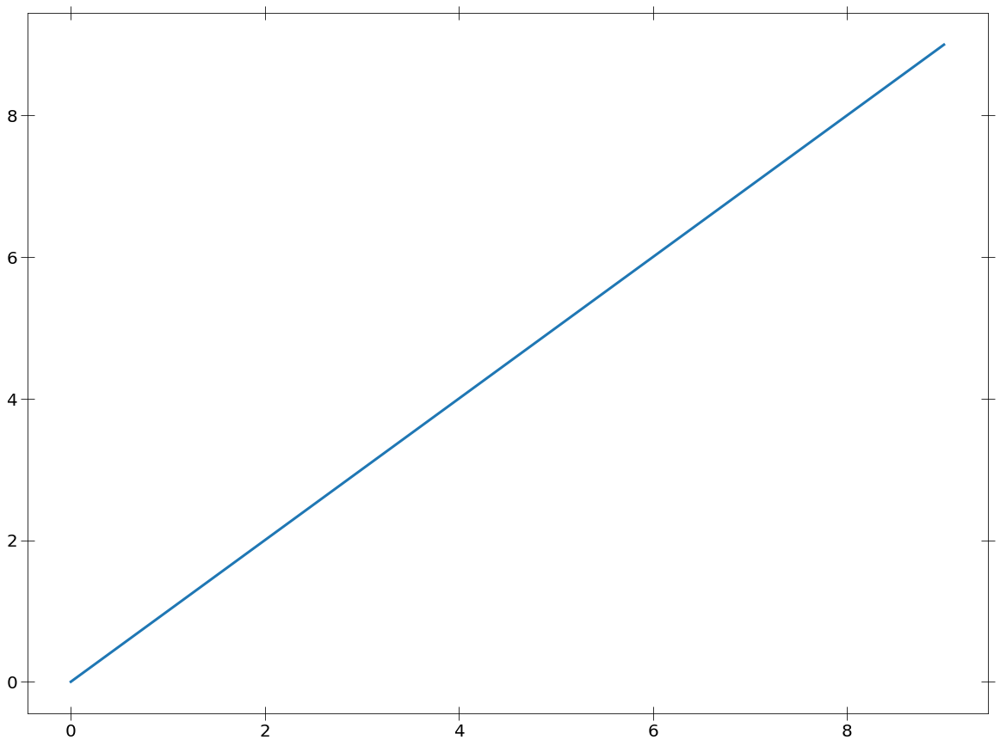

In [332]:
set_plotparams('notebook')
plt.plot(np.arange(10))

# Loading Data

In [6]:
chandra_response_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/chandra_obs_hard07/2CXOJ174334.1-291117/2CXOJ174334.1-291117_combined_src.rmf'
pn_response_path = '/Volumes/Pavan_Work_SSD/Backup/GalacticBulge_Xrayclassify/XMM_responses/PN/epn_bu23_dY9.rmf.gz'
mos_response_path = '/Volumes/Pavan_Work_SSD/Backup/GalacticBulge_Xrayclassify/XMM_responses/MOS_5eV/m1_e10_im_p0_c.rmf'
chandra_sim_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/chandra_simspecs/'
chandra_sim_cvs = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_twice_ew_chandra/sim_ips_highnh_twice_ew_chandra/'
xmm_sim_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/xmm_pn_mos_simspecs_1/'
xmm_sim_cvs = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_xu2016_twice_ew/'
xmm_sim_cvs2 = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_craig/'
xmm_sim_path2 = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/xmm_pn_mos_simspecs_2/'
chandra_sim_cvs2 = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_craig_chandra/'
chandra_obs_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/chandra_obs_hard07/'
xmm_obs_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/xmm_combined_copy/'

1:80: E501 line too long (159 > 79 characters)
2:80: E501 line too long (115 > 79 characters)
3:80: E501 line too long (120 > 79 characters)
4:80: E501 line too long (94 > 79 characters)
5:80: E501 line too long (140 > 79 characters)
6:80: E501 line too long (95 > 79 characters)
7:80: E501 line too long (103 > 79 characters)
8:80: E501 line too long (94 > 79 characters)
9:80: E501 line too long (96 > 79 characters)
10:80: E501 line too long (106 > 79 characters)
11:80: E501 line too long (96 > 79 characters)


## MSP simulations vs. observed sources

# PN files init: 853
# PN files init: 853


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:495: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:496: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:582: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:583: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:586: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:586: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:588: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ip

12.0


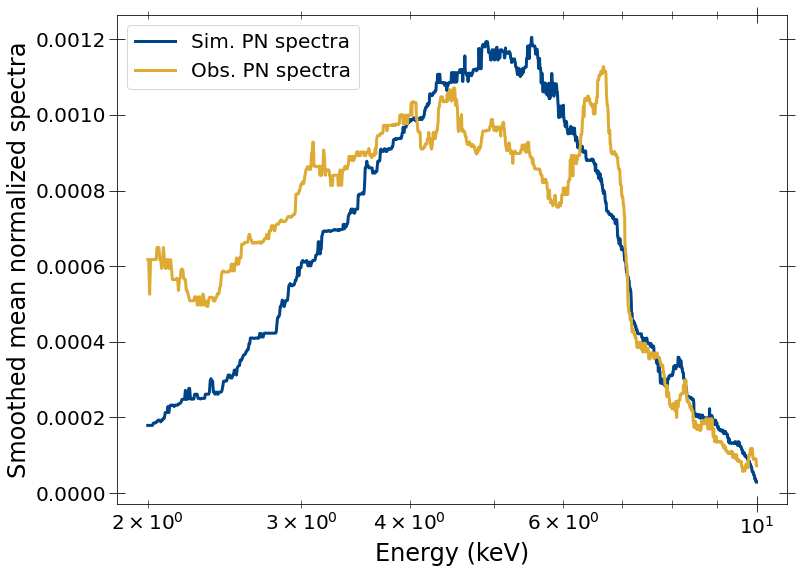

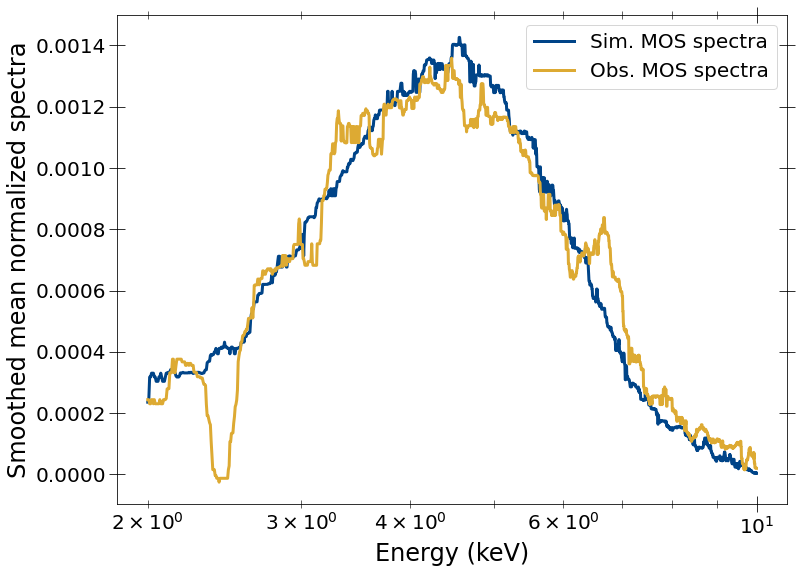

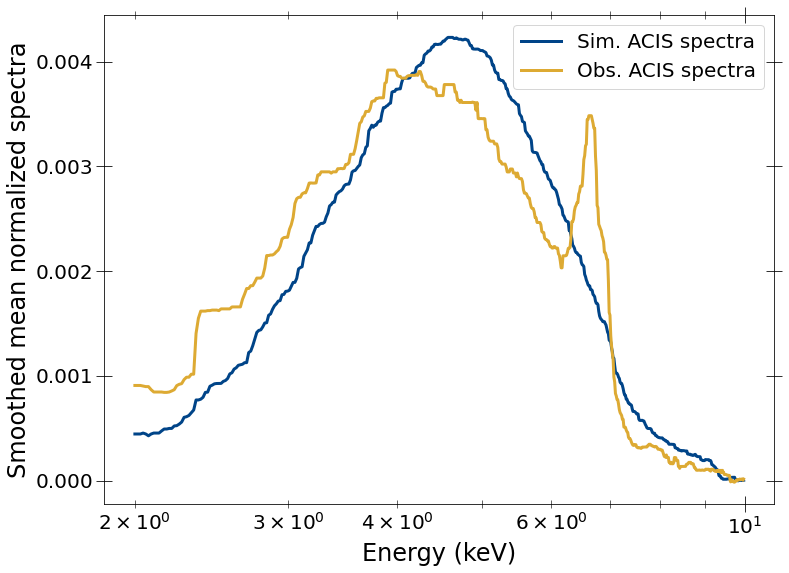

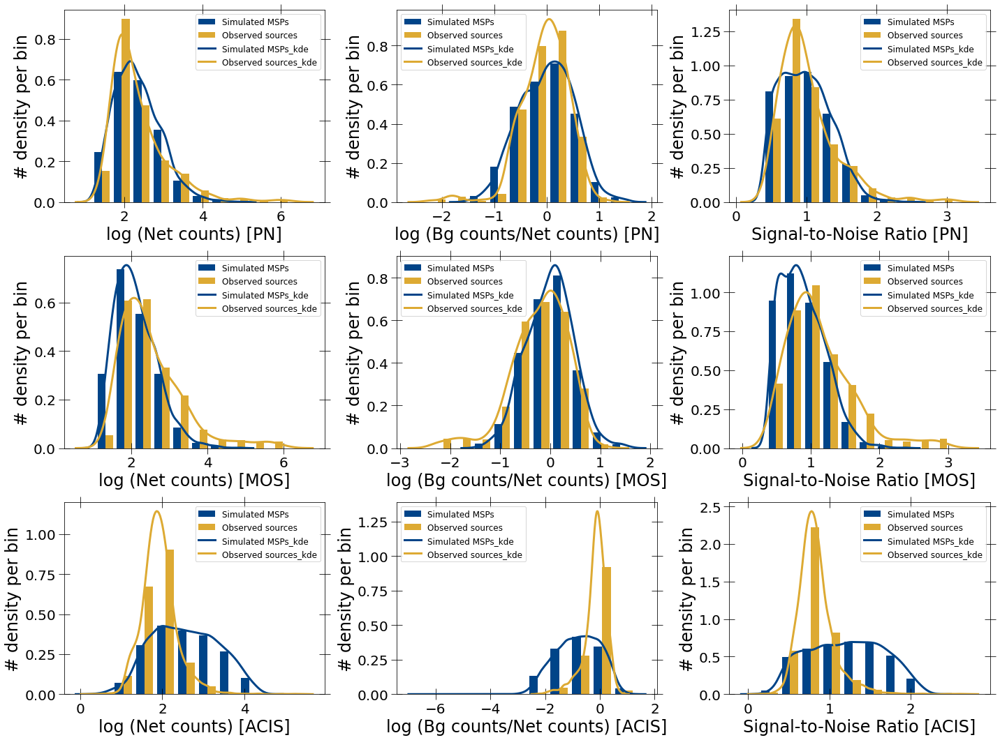

In [7]:
spec_summary_msps = load_alldata(
     [pn_response_path, mos_response_path, chandra_response_path],
     [xmm_sim_path, xmm_sim_path, chandra_sim_path],
     [xmm_obs_path, xmm_obs_path, chandra_obs_path], en_range=[2, 10])

In [8]:
len(spec_summary_msps['specs'][0][2])

10000

## MSP vs. IP simulations

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:495: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:496: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:582: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:583: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:586: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:586: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:588: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ip

12.0


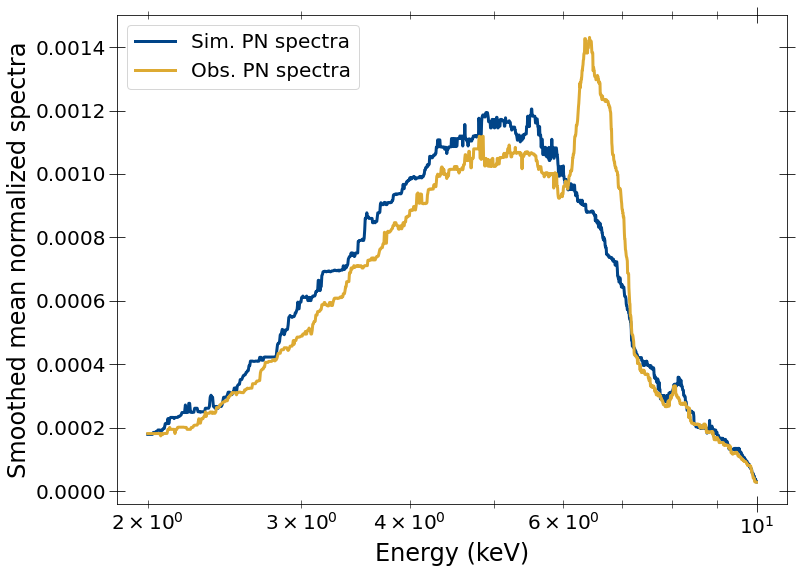

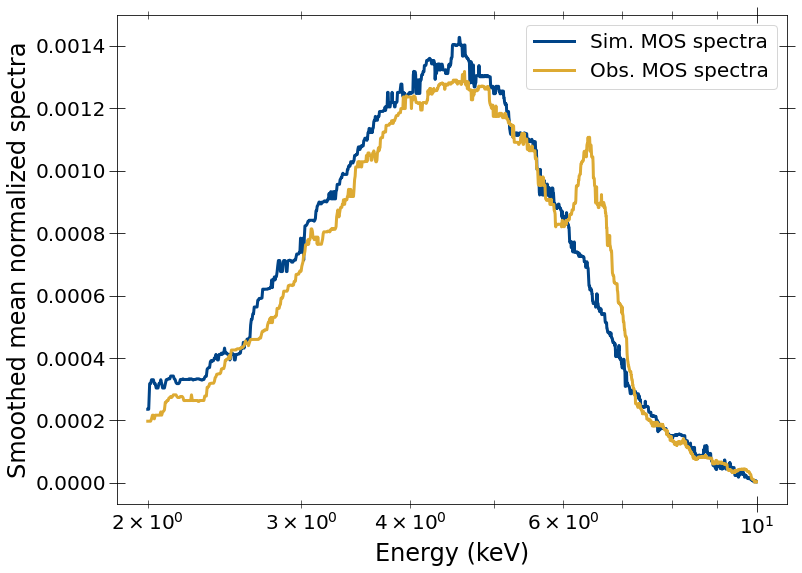

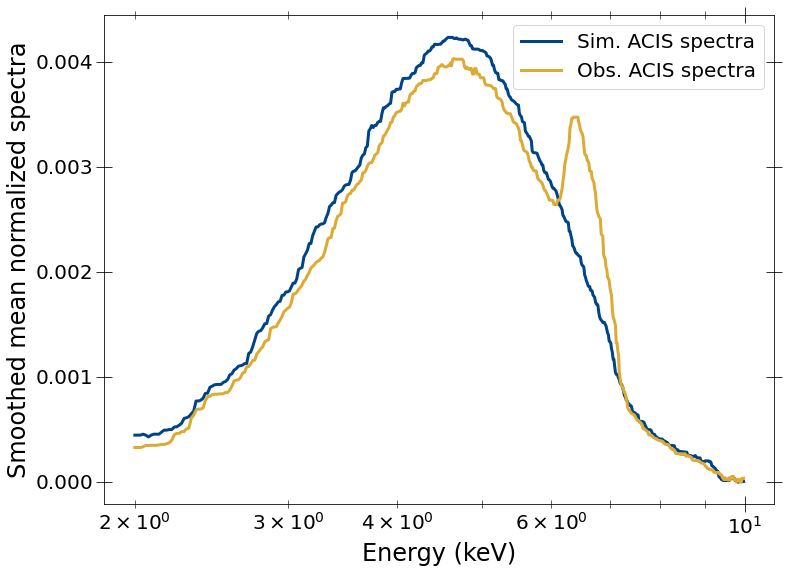

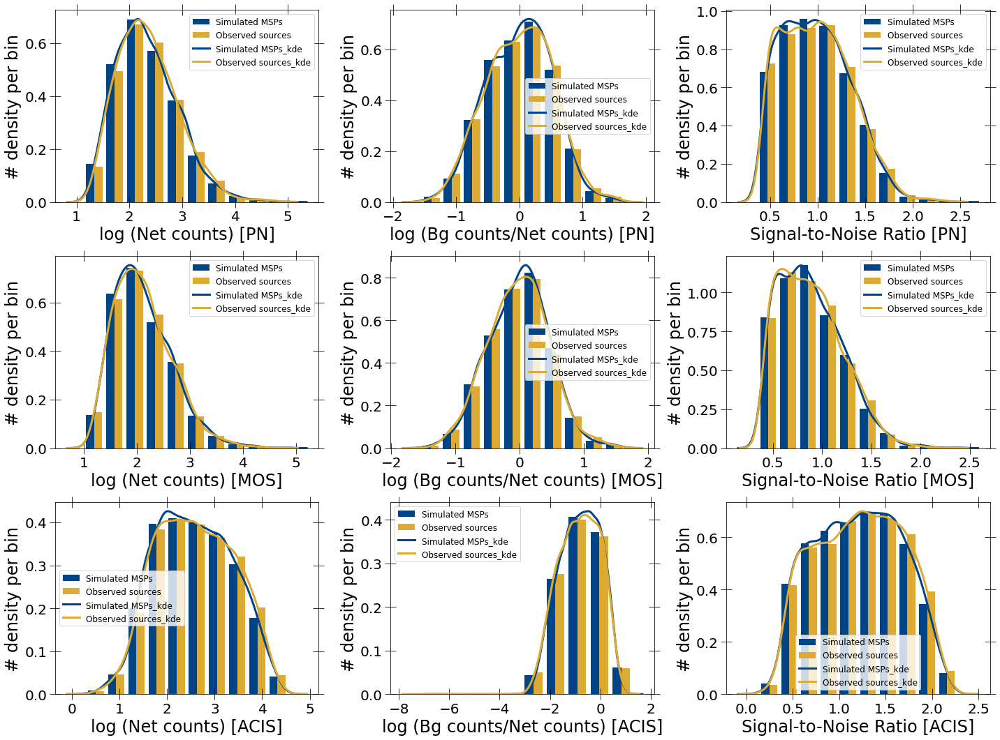

In [42]:
spec_summary_msp_cvs = load_alldata(
     [pn_response_path, mos_response_path, chandra_response_path],
     [xmm_sim_path, xmm_sim_path, chandra_sim_path],
     [xmm_sim_cvs, xmm_sim_cvs, chandra_sim_cvs], en_range=[2, 10],
     both_sims=True)

## IP simulations vs observed sources

# PN files init: 853
# PN files init: 853


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:489: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:490: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:576: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:577: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:580: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:580: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:582: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ip

12.0


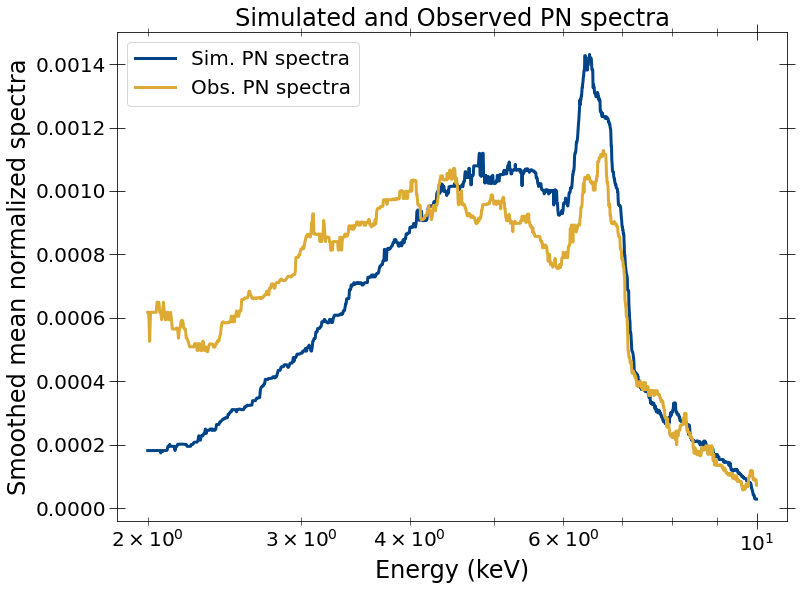

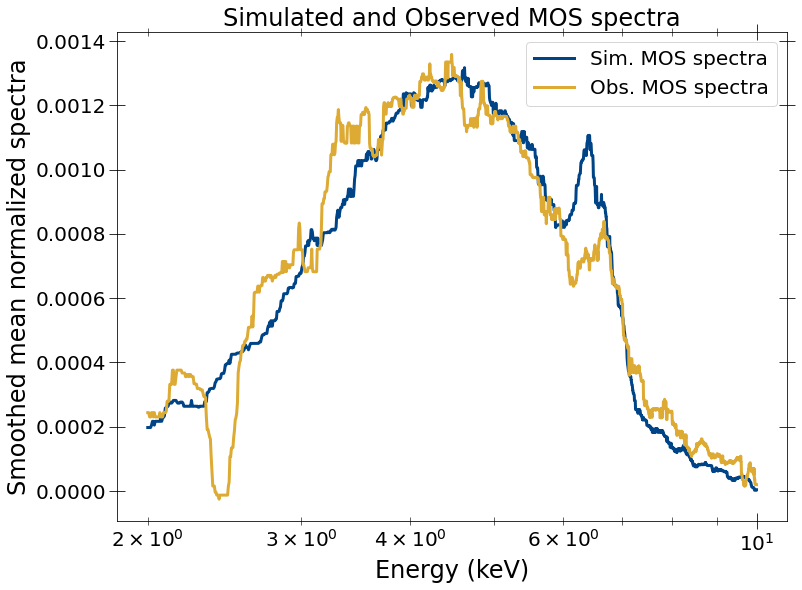

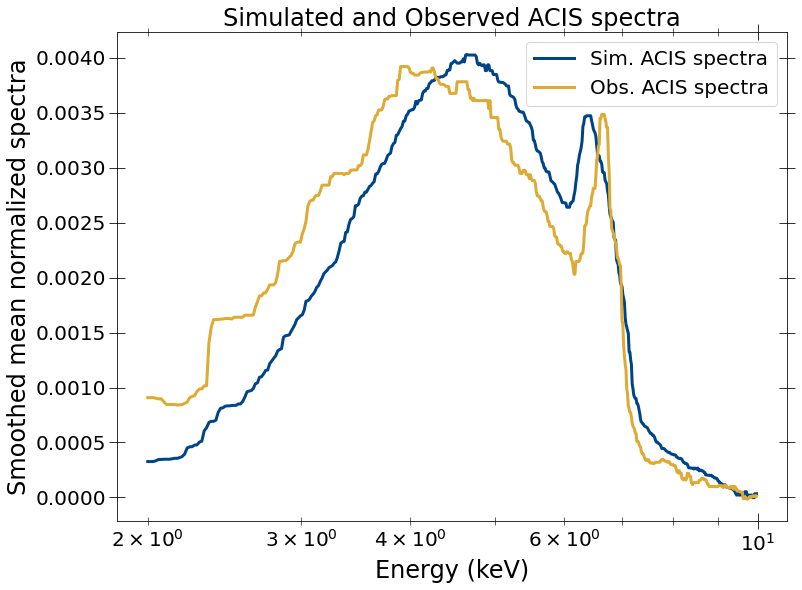

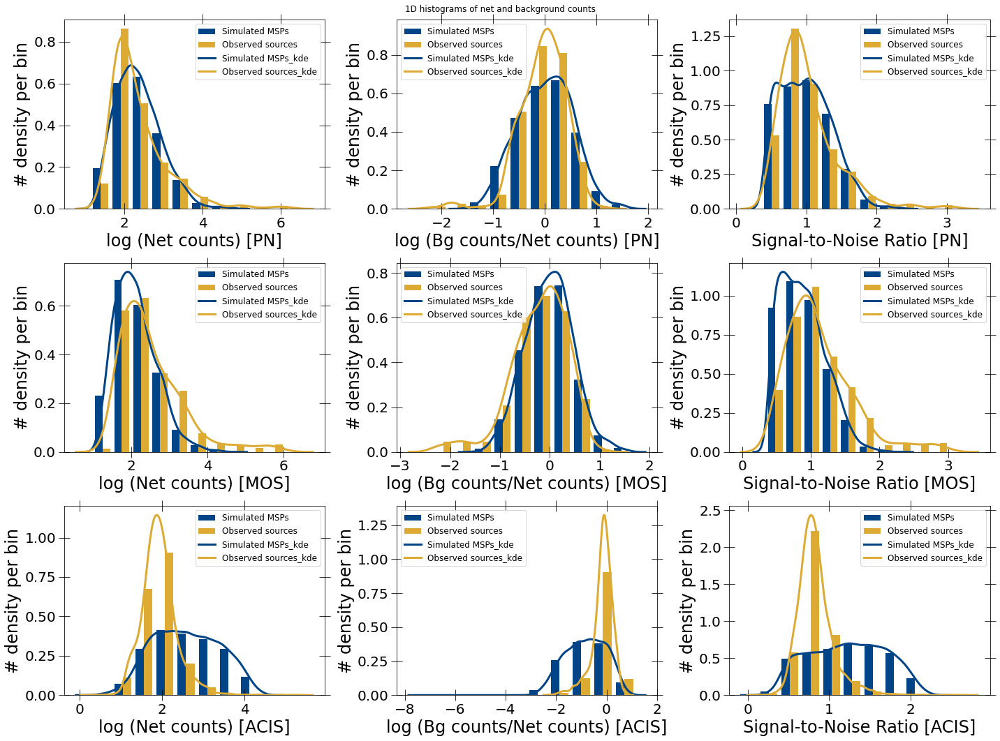

In [9]:
spec_summary_cvs = load_alldata(
     [pn_response_path, mos_response_path, chandra_response_path],
     [xmm_sim_cvs, xmm_sim_cvs, chandra_sim_cvs],
     [xmm_obs_path, xmm_obs_path, chandra_obs_path], en_range=[2, 10],
     both_sims=False, sim_basename='ip_')

# Comparing colors

## Simulated MSPs vs observed_sources

In [231]:
len(obs_color_dict_arr[0]['colors'])

741

In [311]:
len(delta_cstat1)

178

2772 2772 2772 2772
741 741 741 741
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
1937 1937 1937 1937
445 445 445 445


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:704: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:704: RuntimeWarning: divide by zero encountered in true_divide


Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
7873 7873 7873 7873
2670 2670 2670 2670
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:704: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:704: RuntimeWarning: invalid value encountered in true_divide


16.0


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:323: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


16.0
16.0


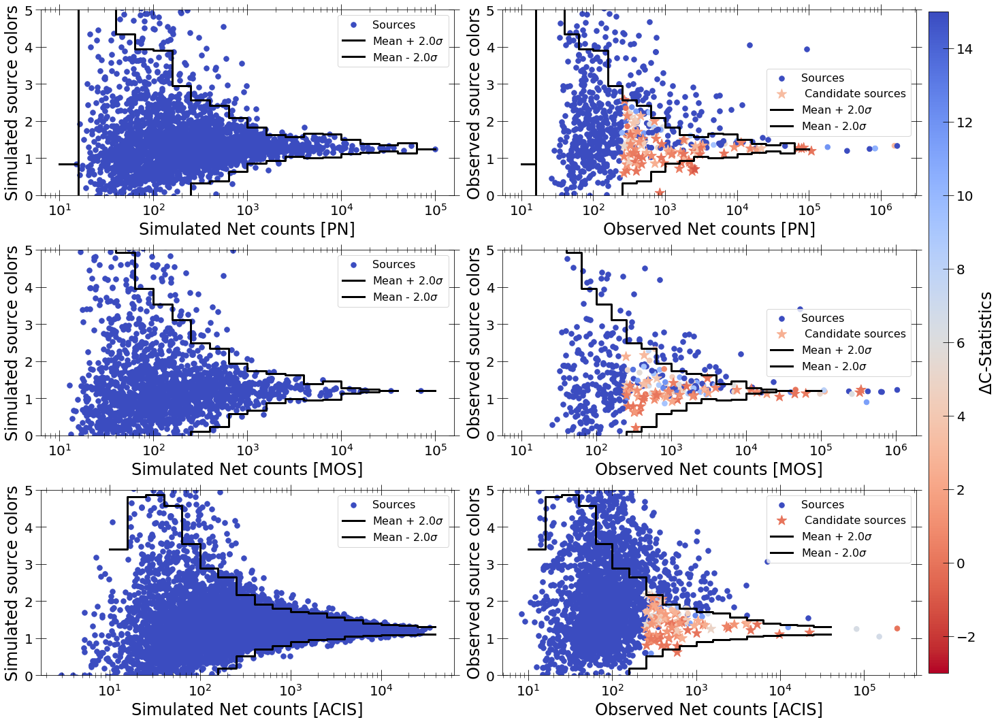

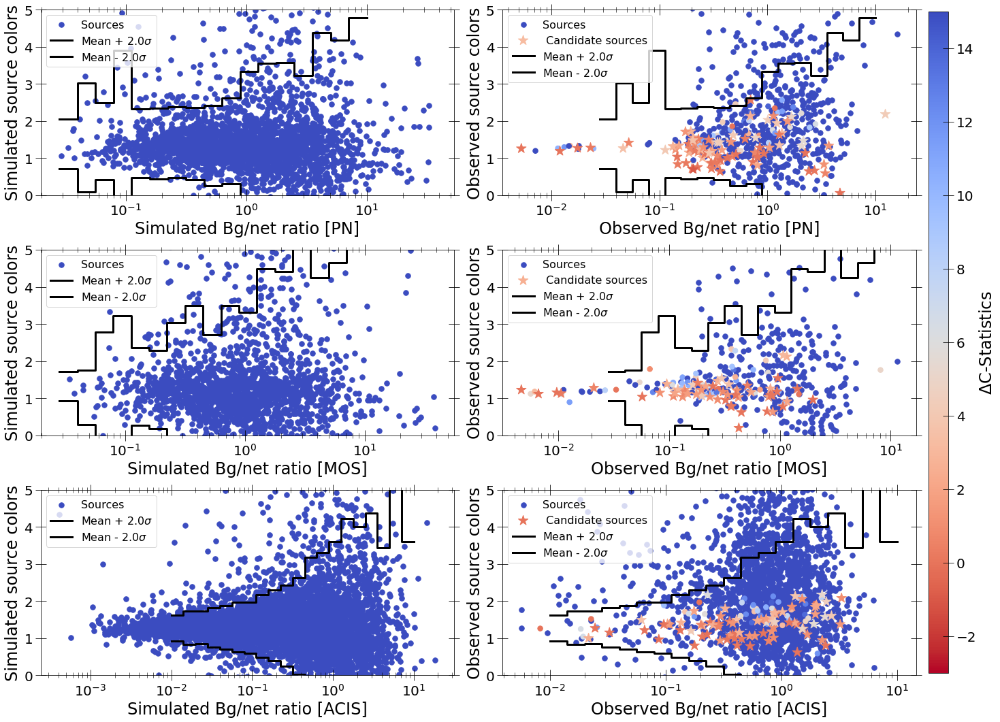

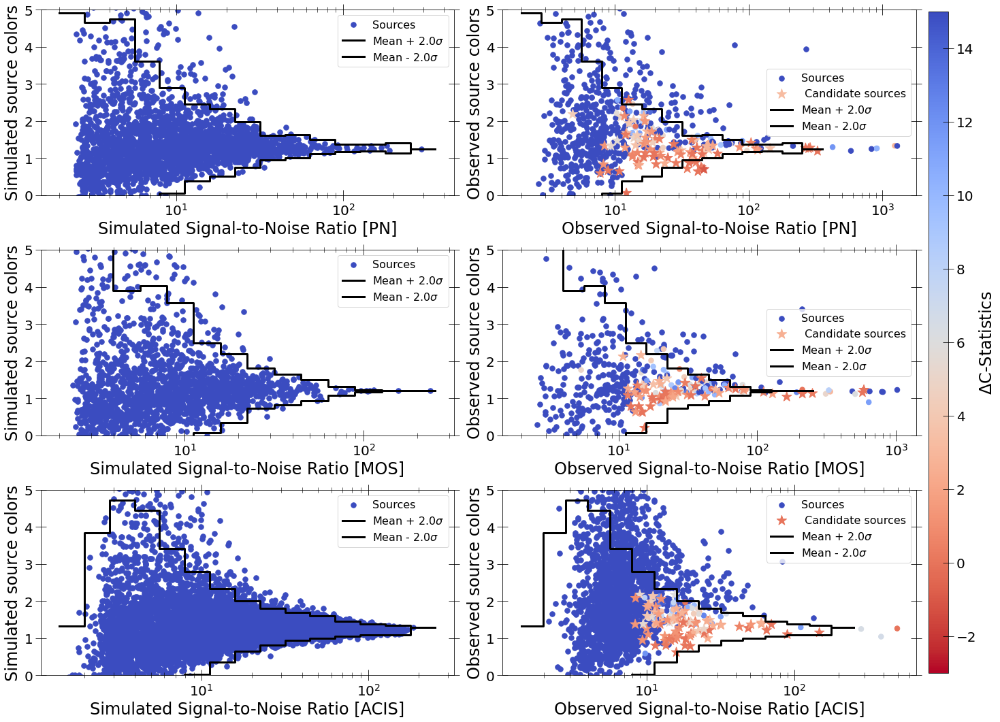

In [335]:
delta_cstat1 = (np.array(pn_fit_stats_table_pl)[:, 1].astype(float) -
                np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float))
delta_cstat2 = (np.array(mos_fit_stats_table_pl)[:, 1].astype(float) -
                np.array(mos_fit_stats_table_pl_g2)[:, 1].astype(float))
delta_cstat3 = (np.array(acis_fit_stats_table_pl)[:, 1].astype(float) -
                np.array(acis_fit_stats_table_pl_g2)[:, 1].astype(float))
sim_msps_color_dict_arr, obs_color_dict_arr = getcolor_prop_alldet(
    spec_summary_msps, compare_det=True, int_args=interested_msp_args_alldet,
    delta_cstat=[delta_cstat1, delta_cstat2, delta_cstat3],
    candidate_args=[candidadate_msps_pn_args,
                    candidadate_msps_mos_args,
                    candidadate_msps_acis_args])

2772 2772 2772 2772
741 741 741 741


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:703: RuntimeWarning: divide by zero encountered in true_divide


Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
1937 1937 1937 1937
445 445 445 445
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:703: RuntimeWarning: divide by zero encountered in true_divide


7873 7873 7873 7873
2670 2670 2670 2670
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:703: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:703: RuntimeWarning: invalid value encountered in true_divide


16.0
16.0
16.0


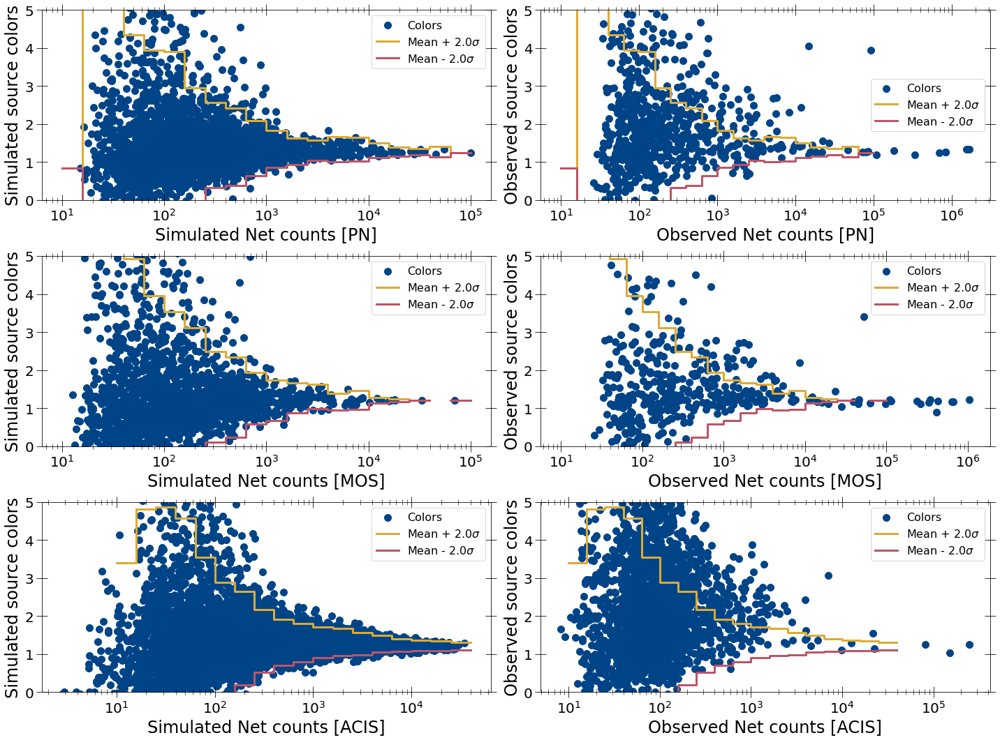

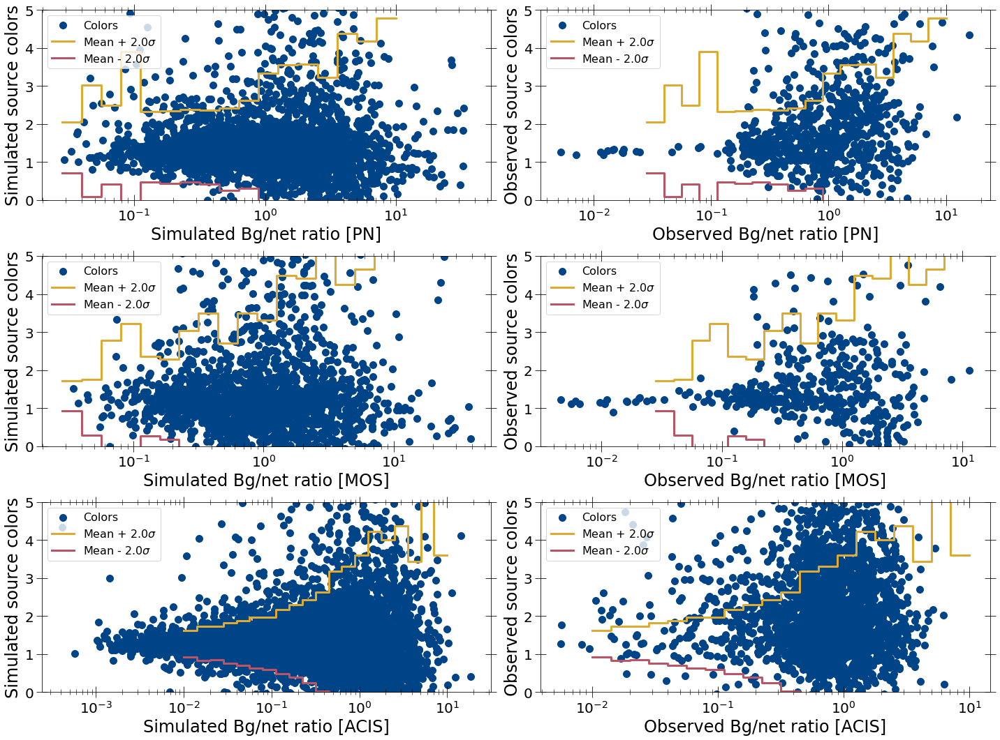

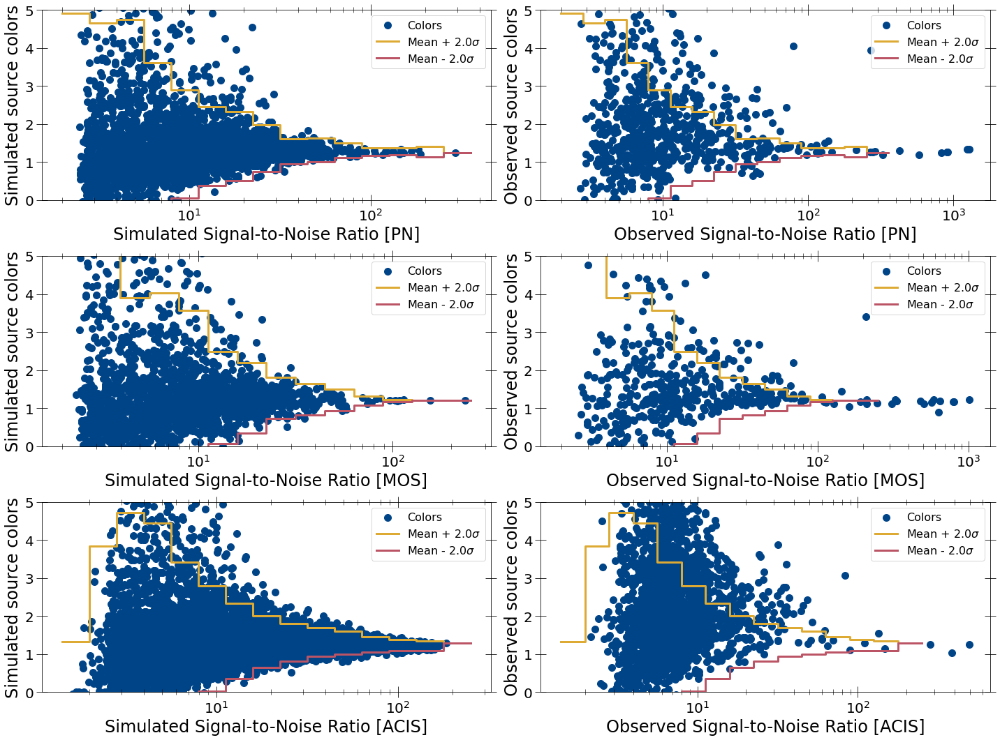

In [200]:
sim_msps_color_dict_arr, obs_color_dict_arr = getcolor_prop_alldet(
    spec_summary_msps, compare_det=True)

## Simulated MSPs vs. CVs

2772 2772 2772 2772
4419 4419 4419 4419


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:674: RuntimeWarning: divide by zero encountered in true_divide


Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
1937 1937 1937 1937
3625 3625 3625 3625
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:674: RuntimeWarning: divide by zero encountered in true_divide


7873 7873 7873 7873
8132 8132 8132 8132


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:674: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:674: RuntimeWarning: invalid value encountered in true_divide


Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
16.0
16.0
16.0


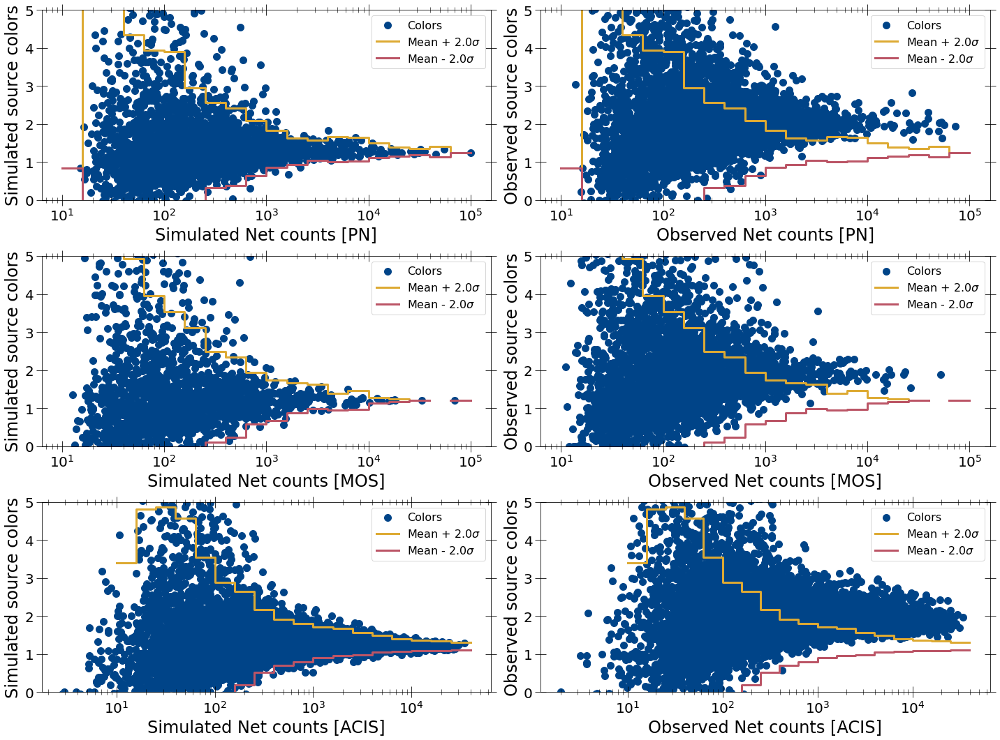

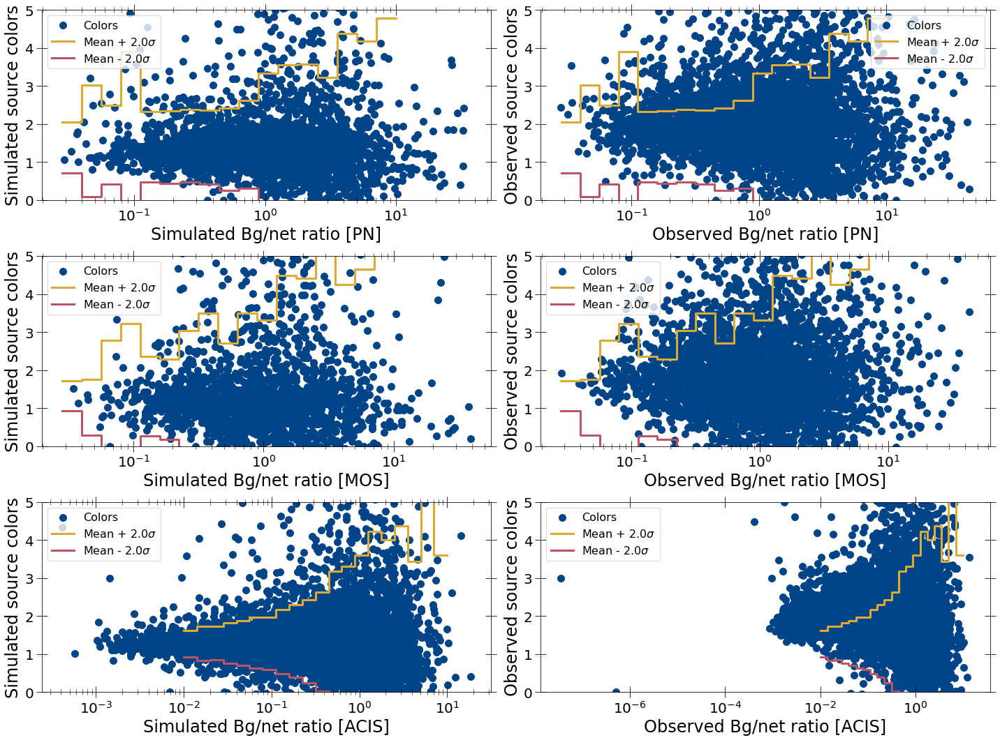

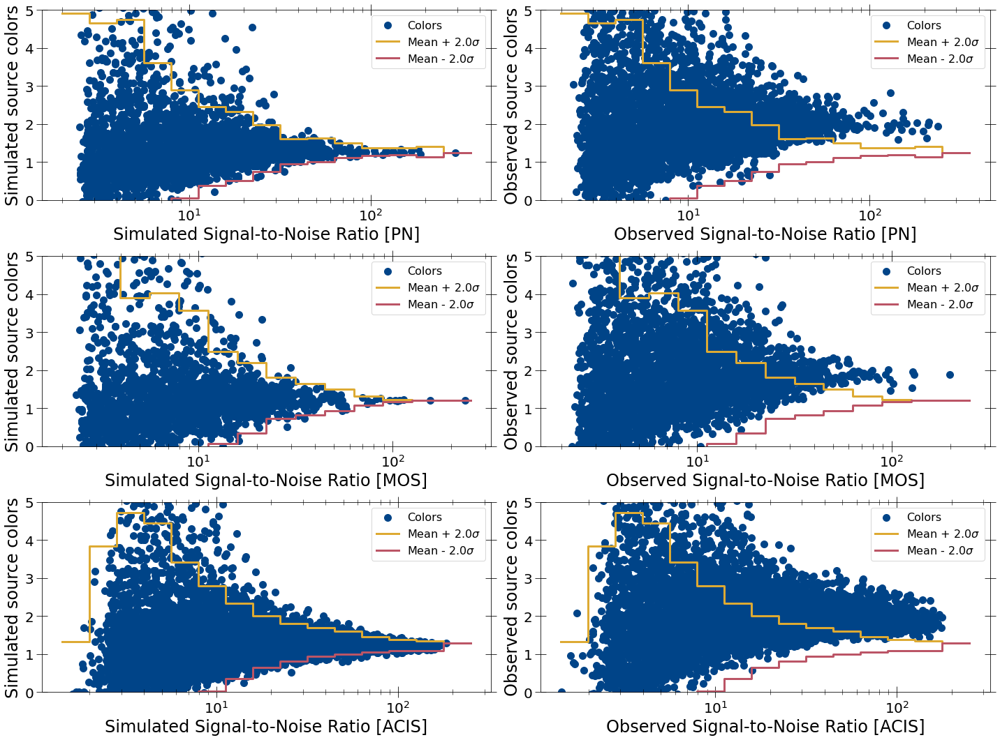

In [43]:
sim_msps2_color_dict_arr, sim_ips_color_dict_arr = getcolor_prop_alldet(
    spec_summary_msp_cvs, compare_det=True)

## Simulated CVs vs observed sources

4419 4419 4419 4419
741 741 741 741
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:671: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:671: RuntimeWarning: divide by zero encountered in true_divide


3625 3625 3625 3625
445 445 445 445
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
8132 8132 8132 8132
2670 2670 2670 2670
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:671: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:671: RuntimeWarning: invalid value encountered in true_divide


16.0
16.0
16.0


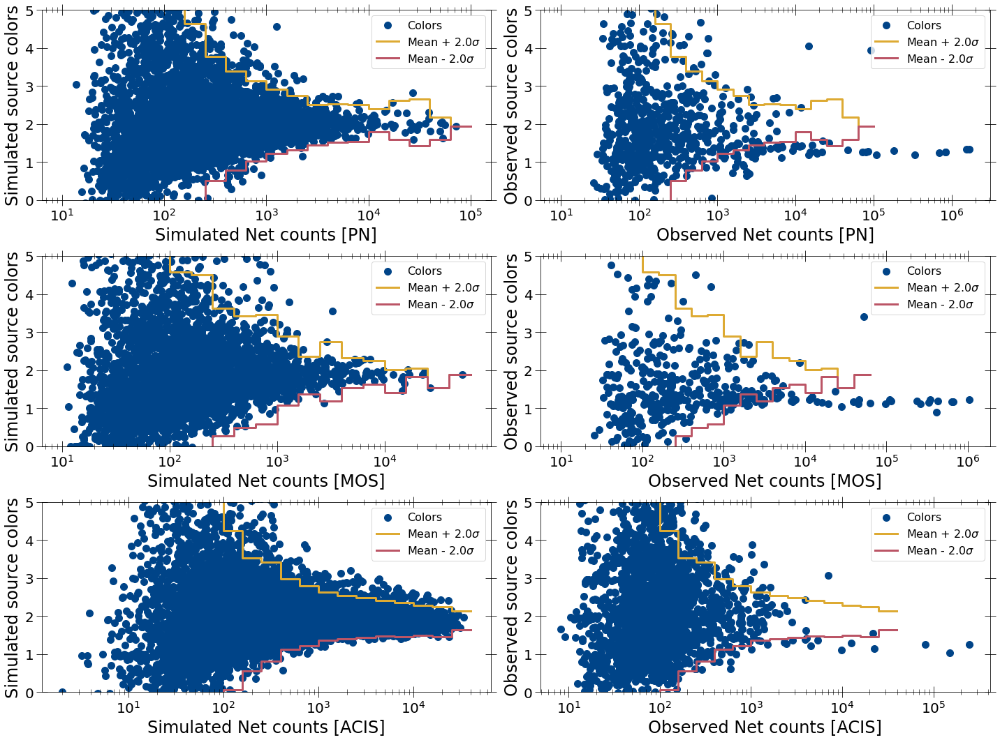

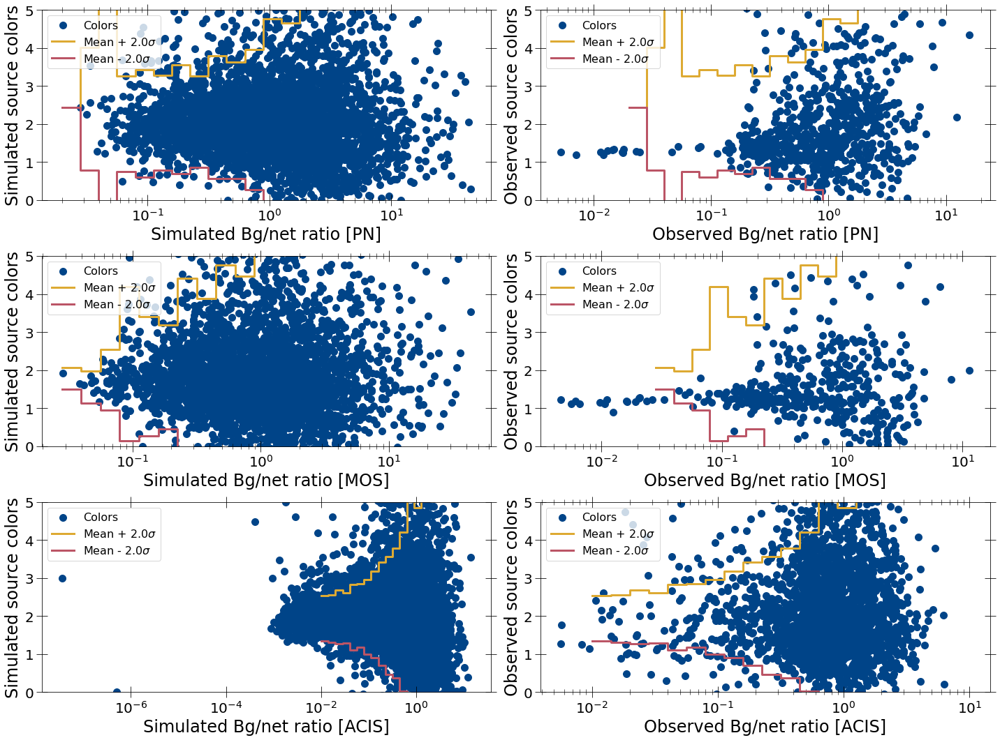

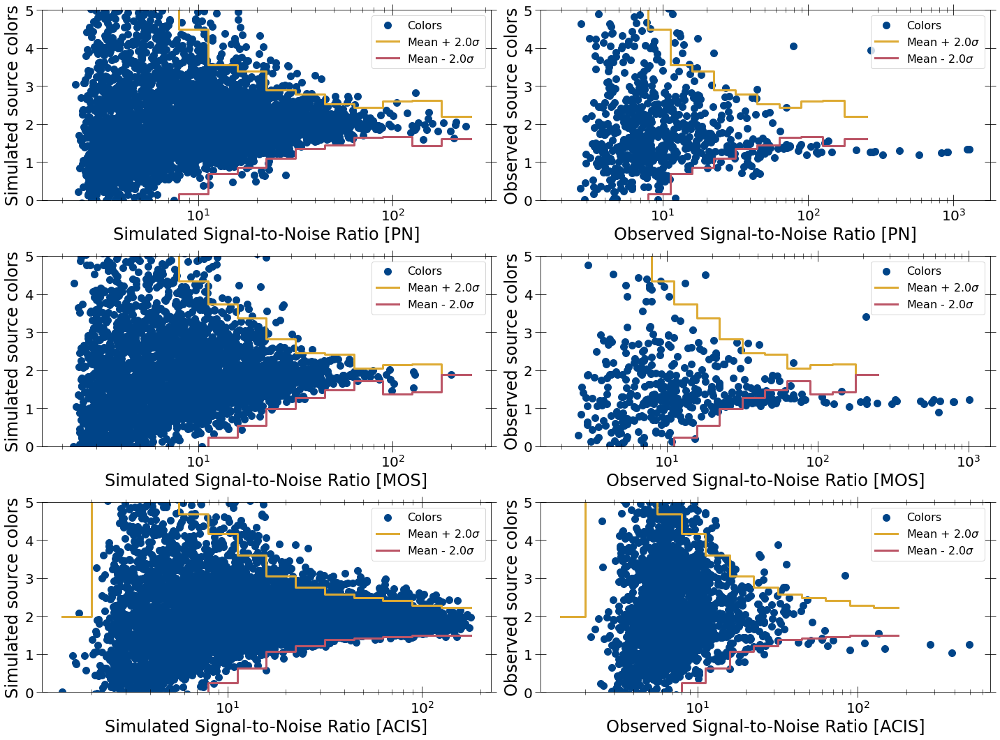

In [12]:
test = getcolor_prop_alldet(spec_summary_cvs, compare_det=True)

# MSP analysis

## Getting sources consistent with MSP colors

In [10]:
def get_candidate_src_nums_det(obs_src_nums, obs_det_mask, sim_color_dict,
                               obs_color_dict, min_counts, min_counts2=None):
    """Get src nums of quiescent sources for given detector"""
    #print(min_counts2)
    obs_netcounts = obs_color_dict['prop_list'][0]
    netcount_bins = sim_color_dict['prop_bins'][0]
    obs_colors = obs_color_dict['colors']
    color_median = sim_color_dict['color_stat'][0][0]
    color_std = sim_color_dict['color_stat'][2][0]
    print(netcount_bins)
    print(color_median)
    print(color_std)
    interested_args = None
    for i, lower_bin in enumerate(netcount_bins):
        if lower_bin < min_counts:
            continue
        if i == len(netcount_bins) - 1:
            upper_bin = np.max(obs_netcounts) + 10
            if not np.isnan(color_median[-1]):
                median_color = color_median[-1]
            if not np.isnan(color_std[-1]):
                std_color = color_std[-1]
            std_color = max(std_color, 0.05)
        else:
            upper_bin = netcount_bins[i+1]
            if not np.isnan(color_median[i]):
                median_color = color_median[i]
            if not np.isnan(color_std[i]):
                std_color = color_std[i]
            std_color = max(std_color, 0.05)
        if min_counts2 is not None:
            if lower_bin < min_counts2 and min_counts2 < upper_bin:
                if ((min_counts2 - lower_bin) > (upper_bin - min_counts2)):
                    lower_bin = min_counts2
                    median_color = color_median[i+1]
                    std_color = color_std[i+1]
                else:
                    lower_bin = min_counts2
        #print(min_counts2)
        print(lower_bin, median_color, std_color)
        if (np.isnan(median_color) or np.isnan(std_color) or std_color==0):
            print('HELLO')
            int_args = np.where(np.logical_and(
                obs_netcounts >= lower_bin, obs_netcounts < upper_bin))
        else:
        
            int_args = np.where(np.logical_and(
                np.logical_and(obs_netcounts >= lower_bin,
                               obs_netcounts < upper_bin),
                obs_colors < median_color + 2*std_color))[0]
        '''
        int_args = np.where(np.logical_and(
                np.logical_and(obs_netcounts >= lower_bin,
                               obs_netcounts < upper_bin),
                obs_colors < median_color + 2*std_color))[0]
        '''
        print(len(int_args))
        if interested_args is None:
            interested_args = int_args.copy()
        else:
            interested_args = np.append(interested_args.copy(), int_args)
    return interested_args, obs_src_nums[obs_det_mask][interested_args]


def get_candidate_src_nums_alldet(spec_summary, sim_color_dict_arr,
                                  obs_color_dict_arr, min_count_arr=None,
                                  min_counts2=None):
    """Get source nums for all detectors."""
    interested_args_alldet = []
    interested_sources_alldet = []
    if min_count_arr is None:
        min_count_arr = [700, 700, 250]
    for i, obs_color_dict in enumerate(obs_color_dict_arr):
        if i > 0:
            interested_args, interested_srcs = get_candidate_src_nums_det(
                spec_summary['src_nums'][i-1], spec_summary['spec_masks'][1][i],
                sim_color_dict_arr[i], obs_color_dict, min_count_arr[i],
                min_counts2)
        else:
            interested_args, interested_srcs = get_candidate_src_nums_det(
                spec_summary['src_nums'][i], spec_summary['spec_masks'][1][i],
                sim_color_dict_arr[i], obs_color_dict, min_count_arr[i],
                min_counts2)
        interested_args_alldet.append(interested_args)
        interested_sources_alldet.append(interested_srcs)
    return interested_args_alldet, interested_sources_alldet


4:5: E265 block comment should start with '# '
39:9: E265 block comment should start with '# '
41:71: E225 missing whitespace around operator
46:1: W293 blank line contains whitespace
76:80: E501 line too long (80 > 79 characters)


In [11]:
(interested_msp_args_alldet,
 interested_msp_srcs_alldet) = get_candidate_src_nums_alldet(
    spec_summary_msps, sim_msps_color_dict_arr, obs_color_dict_arr,
    min_count_arr=[150, 150, 150], min_counts2=250)

[1.00000000e+01 1.58489319e+01 2.51188643e+01 3.98107171e+01
 6.30957344e+01 1.00000000e+02 1.58489319e+02 2.51188643e+02
 3.98107171e+02 6.30957344e+02 1.00000000e+03 1.58489319e+03
 2.51188643e+03 3.98107171e+03 6.30957344e+03 1.00000000e+04
 1.58489319e+04 2.51188643e+04 3.98107171e+04 6.30957344e+04
 1.00000000e+05]
[0.8405164  2.03621255 1.63305682 1.56743663 1.5736705  1.66320801
 1.4331601  1.44713313 1.39609846 1.36984926 1.35086023 1.27893642
 1.31590127 1.33564778 1.334838   1.30071855 1.27144028 1.27383281
 1.26917868 1.24506393]
[0.         2.58517276 1.72972337 1.38681819 1.18129716 1.11575665
 0.75540094 0.56022382 0.51077116 0.36126324 0.24291962 0.17375792
 0.13254254 0.16428213 0.15864827 0.09633923 0.05725364 0.0421451
 0.0654287  0.        ]
250 1.4471331268500243 0.5602238243386048
0
251.18864315095823 1.4471331268500243 0.5602238243386048
45
398.1071705534973 1.396098460383752 0.5107711552472425
30
630.957344480193 1.3698492577015142 0.36126323889561407
22
1000.0 1

In [12]:
print('Interested PN sources: ', len(interested_msp_srcs_alldet[0]))
print('Interested MOS sources: ', len(interested_msp_srcs_alldet[1]))
print('Interested ACIS sources: ', len(interested_msp_srcs_alldet[2]))

Interested PN sources:  178
Interested MOS sources:  152
Interested ACIS sources:  130


In [341]:
def mark_interested_srcs(sim_color_dict, obs_color_dict, src_nums, obs_mask,
                         interested_srcs, prop_num=0):
    props = obs_color_dict['prop_list'][prop_num]
    colors = obs_color_dict['colors']
    interested_args = np.where(np.isin(src_nums[obs_mask], interested_srcs))
    print(len(interested_args[0]), len(interested_srcs))
    # print(len(np.unique(interested_srcs)))
    # print(interested_args)
    # print(src_nums[obs_mask][interested_args])
    # print(props[interested_args])
    # print(colors[interested_args])
    prop_bins = sim_color_dict['prop_bins'][prop_num]
    mean_color = sim_color_dict['color_stat'][0][prop_num]
    std_color = sim_color_dict['color_stat'][2][prop_num]
    print(props[interested_args])
    print(colors[interested_args])
    plotline_scatter([props, props[interested_args], prop_bins, prop_bins],
                     [colors, colors[interested_args], mean_color + 2*std_color,
                      mean_color - 2*std_color],
                     pl_types=['scatter', 'scatter', 'step', 'step'],
                     xlabel='Net counts', ylabel='Colors',
                     pl_labels=['Colors', 'Colors (candidates)',
                                r'Mean + 2$\sigma$', r'Mean + 2$\sigma$'],
                     ylim=(0, 5))
    return (colors[interested_args], props[interested_args])

18:80: E501 line too long (80 > 79 characters)


In [32]:
delta_cstat = np.array(pn_fit_stats_table_pl)[:, 1].astype(float) - np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float)

NameError: name 'pn_fit_stats_table_pl' is not defined

In [33]:
interested_msp_srcs_alldet[0][174]

'205056701010004'

In [67]:
from matplotlib.colors import Normalize

In [68]:
interested_msp_srcs_alldet[0]

array(['200305401010008', '200305401010017', '200305401015015',
       '201113501010117', '201113501010148', '201129702010029',
       '201129704010023', '201129704010026', '201129704010031',
       '201129704010049', '201129704010056', '201129707010033',
       '201129708010014', '201129712010002', '201129719010007',
       '201129721010136', '201529201015014', '202039301010054',
       '202039301010071', '204003401010008', '204003401010013',
       '205049406010031', '205100104010002', '205110002015026',
       '205110012010036', '205110012015035', '206946401010003',
       '206946404010062', '206946404010202', '206946409010022',
       '206946410010178', '206946416010014', '207242102010114',
       '208016803010003', '208024101010012', '208251401010016',
       '208441011010009', '208441011010032', '208441011010036',
       '208441011010211', '208624701010022', '208860108010001',
       '208860204010001', '208860207010007', '208938111010034',
       '201113501015161', '2011297010100

In [254]:
spec_summary_msps['counts'][0][0][1][spec_summary_msps['spec_masks'][1][0]][interested_msp_args_alldet[0]]

array([3.51929452e+02, 2.85294758e+02, 2.89900690e+02, 3.28559219e+02,
       3.11964577e+02, 3.25306748e+02, 3.44820290e+02, 2.57981436e+02,
       2.67528644e+02, 2.68595336e+02, 2.94651765e+02, 3.40981312e+02,
       2.84365253e+02, 3.19667720e+02, 2.77346210e+02, 3.28184955e+02,
       3.77918079e+02, 3.41211238e+02, 3.81976687e+02, 2.92579328e+02,
       2.92735265e+02, 2.51352123e+02, 3.87265165e+02, 2.75203084e+02,
       3.47382202e+02, 3.63066904e+02, 3.31093640e+02, 3.63586896e+02,
       2.96801156e+02, 3.14961326e+02, 3.30170412e+02, 2.71873909e+02,
       3.27073676e+02, 3.83059949e+02, 3.16385603e+02, 2.84663999e+02,
       3.59522758e+02, 2.97865164e+02, 3.93890922e+02, 3.13971935e+02,
       2.68533579e+02, 3.30838478e+02, 2.98679980e+02, 3.95459403e+02,
       3.82664952e+02, 4.55196441e+02, 5.96645536e+02, 4.85332639e+02,
       4.08206137e+02, 5.56503317e+02, 4.16713717e+02, 5.68590748e+02,
       4.40901747e+02, 4.88542554e+02, 4.05197362e+02, 5.13713407e+02,
      

In [266]:
interested_msp_

array(['200305401010008', '200305401010017', '200305401015015',
       '201113501010117', '201113501010148', '201129702010029',
       '201129704010023', '201129704010026', '201129704010031',
       '201129704010049', '201129704010056', '201129707010033',
       '201129708010014', '201129712010002', '201129719010007',
       '201129721010136', '201529201015014', '202039301010054',
       '202039301010071', '204003401010008', '204003401010013',
       '205049406010031', '205100104010002', '205110002015026',
       '205110012010036', '205110012015035', '206946401010003',
       '206946404010062', '206946404010202', '206946409010022',
       '206946410010178', '206946416010014', '207242102010114',
       '208016803010003', '208024101010012', '208251401010016',
       '208441011010009', '208441011010032', '208441011010036',
       '208441011010211', '208624701010022', '208860108010001',
       '208860204010001', '208860207010007', '208938111010034',
       '201113501015161', '2011297010100

In [268]:
(np.array(pn_fit_stats_table_pl)[-3, 1].astype(float) -
 np.array(pn_fit_stats_table_pl_g2)[-3, 1].astype(float))

0.00027632400269794744

(0.0, 5.0)

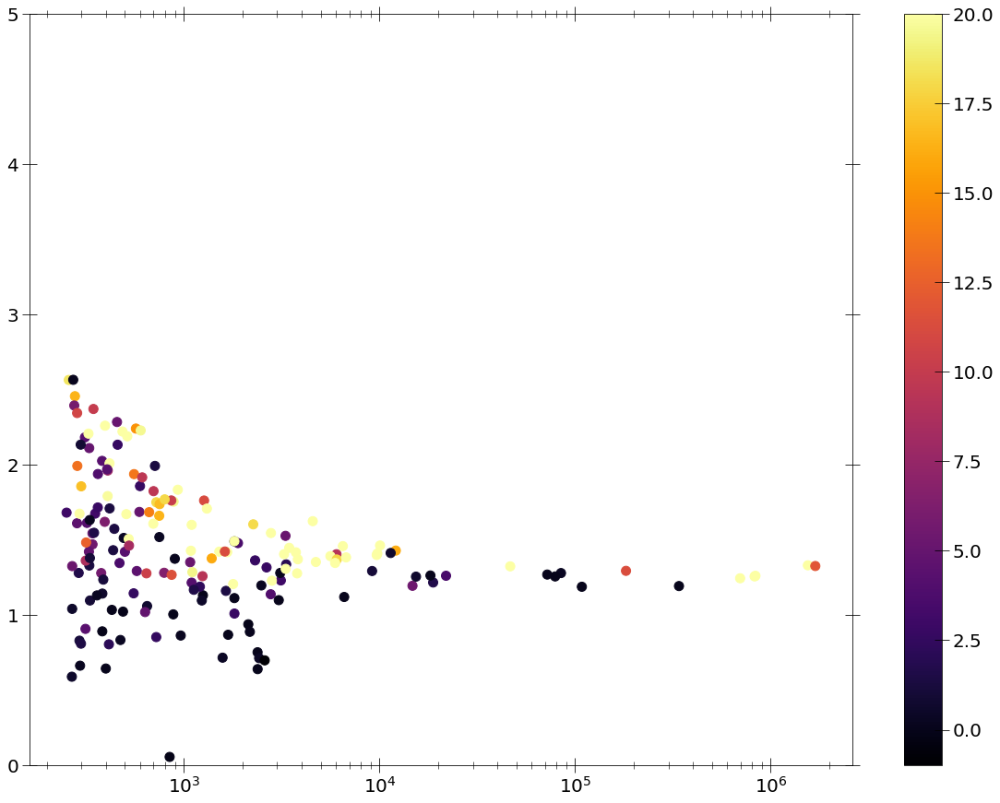

5:13: E131 continuation line unaligned for hanging indent
7:12: E131 continuation line unaligned for hanging indent


In [124]:
plt.scatter(
    spec_summary_msps['counts'][0][0][1][
        spec_summary_msps['spec_masks'][1][0]][interested_msp_args_alldet[0]],
    obs_color_dict_arr[0]['colors'][interested_msp_args_alldet[0]],
            c=(np.array(pn_fit_stats_table_pl)[:, 1].astype(float) -
               np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float)),
           cmap='inferno', norm=Normalize(-1, 20, True))
plt.colorbar()
plt.xscale('log')
plt.ylim(0, 5)

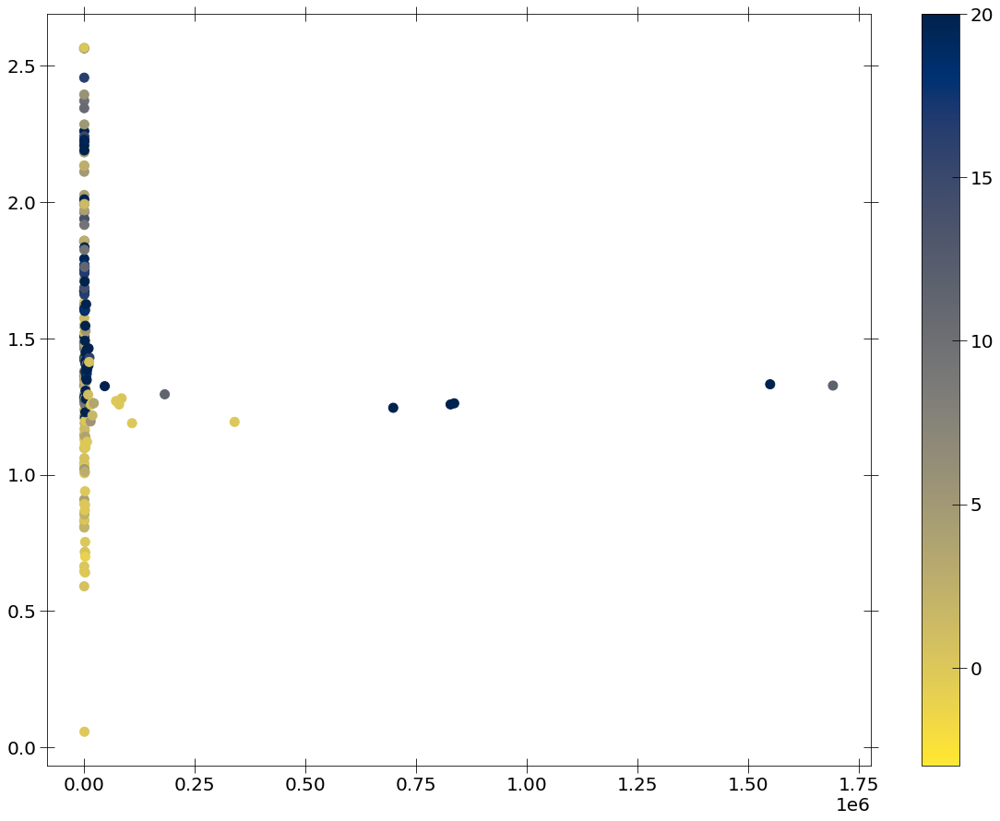

8:17: E128 continuation line under-indented for visual indent
9:17: E128 continuation line under-indented for visual indent


In [255]:
fig, axs = plt.subplots()
xdatas = spec_summary_msps['counts'][0][0][1][spec_summary_msps[
            'spec_masks'][1][0]][interested_msp_args_alldet[0]]
ydatas = obs_color_dict_arr[0]['colors'][interested_msp_args_alldet[0]]
zdatas = (np.array(pn_fit_stats_table_pl)[:, 1].astype(float) -
          np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float))
scatter_plot = axs.scatter(xdatas, ydatas, c=zdatas,
                marker='o', label=['Data'], cmap='cividis_r',
                norm=Normalize(-3, 20, True))
plt.colorbar(mappable=scatter_plot, ax=axs)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


16.0


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:322: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:38: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


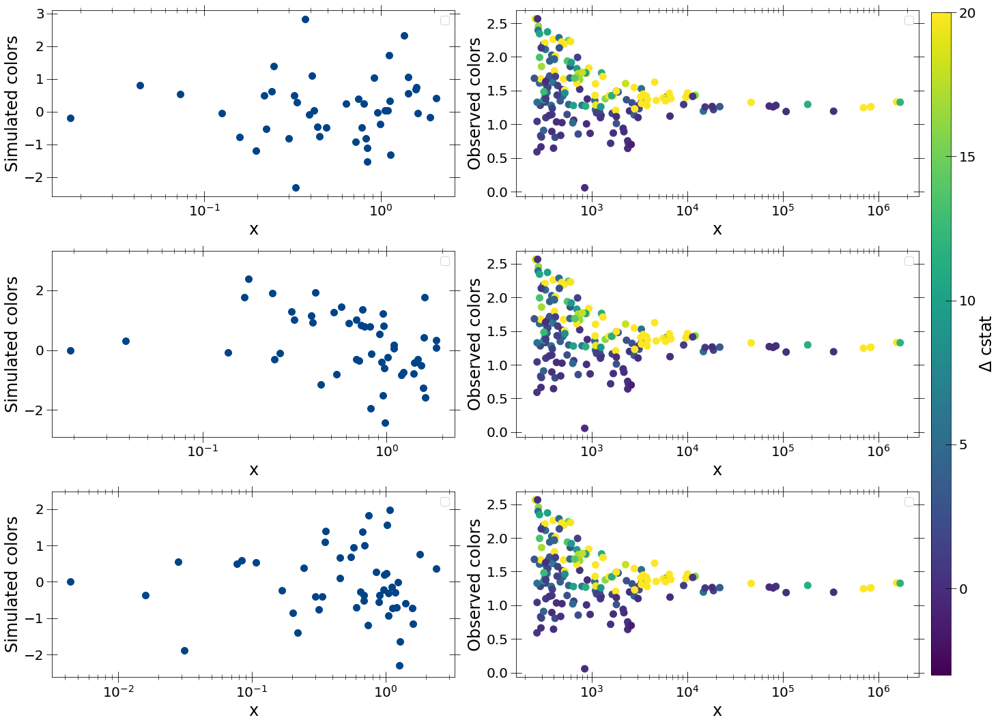

2:9: E231 missing whitespace after ','
26:9: E122 continuation line missing indentation or outdented
27:9: E122 continuation line missing indentation or outdented
29:9: E122 continuation line missing indentation or outdented
30:9: E122 continuation line missing indentation or outdented


In [214]:
plot_subplots(
    3, 2,[[[np.random.normal(size=100)],
           [spec_summary_msps['counts'][0][0][1][spec_summary_msps[
                'spec_masks'][1][0]][interested_msp_args_alldet[0]]]],
          [[np.random.normal(size=100)],
           [spec_summary_msps['counts'][0][0][1][spec_summary_msps[
                'spec_masks'][1][0]][interested_msp_args_alldet[0]]]],
          [[np.random.normal(size=100)],
           [spec_summary_msps['counts'][0][0][1][spec_summary_msps[
                'spec_masks'][1][0]][interested_msp_args_alldet[0]]]]],
    [[[np.random.normal(size=100)],
      [obs_color_dict_arr[0]['colors'][interested_msp_args_alldet[0]]]],
     [[np.random.normal(size=100)],
      [obs_color_dict_arr[0]['colors'][interested_msp_args_alldet[0]]]],
     [[np.random.normal(size=100)],
      [obs_color_dict_arr[0]['colors'][interested_msp_args_alldet[0]]]]],
    subp_types_arr=[['linescatter', 'linescatter'],
                    ['linescatter', 'linescatter'],
                    ['linescatter', 'linescatter']],
    pl_types_arr=[[['scatter'], ['scatter']], [['scatter'], ['scatter']],
                  [['scatter'], ['scatter']]],
    zdatas_arr=[[None, [(
        np.array(pn_fit_stats_table_pl)[:, 1].astype(float) -
        np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float))]],
                [None, [(
        np.array(pn_fit_stats_table_pl)[:, 1].astype(float) -
        np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float))]],
                [None, [(
        np.array(pn_fit_stats_table_pl)[:, 1].astype(float) -
        np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float))]]],
    zdata_labels=[[None, r'$\Delta$ cstat'], [None, r'$\Delta$ cstat'],
                  [None, r'$\Delta$ cstat']], common_cbar=True,
    xlabel_arr=[['x', 'x'], ['x', 'x'], ['x', 'x']],
    ylabel_arr=[['Simulated colors', 'Observed colors'],
                ['Simulated colors', 'Observed colors'],
                ['Simulated colors', 'Observed colors']]
)
plt.tight_layout(rect=[0.0, 0.0, 0.95, 1.0])

In [126]:
def mark_delta_cstat(sim_color_dict, props, colors, prop_num=0,
                     color_param=None):
    # print(len(interested_args[0]), len(interested_srcs))
    # print(len(np.unique(interested_srcs)))
    # print(interested_args)
    # print(src_nums[obs_mask][interested_args])
    # print(props[interested_args])
    # print(colors[interested_args])
    prop_bins = sim_color_dict['prop_bins'][prop_num]
    mean_color = sim_color_dict['color_stat'][0][prop_num]
    std_color = sim_color_dict['color_stat'][2][prop_num]
    plotline_scatter([props, prop_bins, prop_bins],
                     [colors, mean_color + 2*std_color,
                      mean_color - 2*std_color],
                     zdatas=[color_param, None, None],
                     pl_types=['scatter', 'step', 'step'],
                     xlabel='Net counts', ylabel='Colors',
                     pl_labels=['Colors',
                                r'Mean + 2$\sigma$', r'Mean + 2$\sigma$'],
                     ylim=(0, 5),
                     zdata_label=r'$\Delta$C-statistics')

In [239]:
np.where(interested_msp_srcs_alldet[0][174]

'201129721010005'

In [339]:
np.where(spec_summary_msps['src_nums'][1] == '2CXOJ17')

2697

5 5
[ 159.66586281  677.92326981 1127.33959596  309.98665049  276.70697482]
[3.73690051 1.42771088 2.3166538  1.41798004 3.0309139 ]


(array([3.73690051, 1.42771088, 2.3166538 , 1.41798004, 3.0309139 ]),
 array([ 159.66586281,  677.92326981, 1127.33959596,  309.98665049,
         276.70697482]))

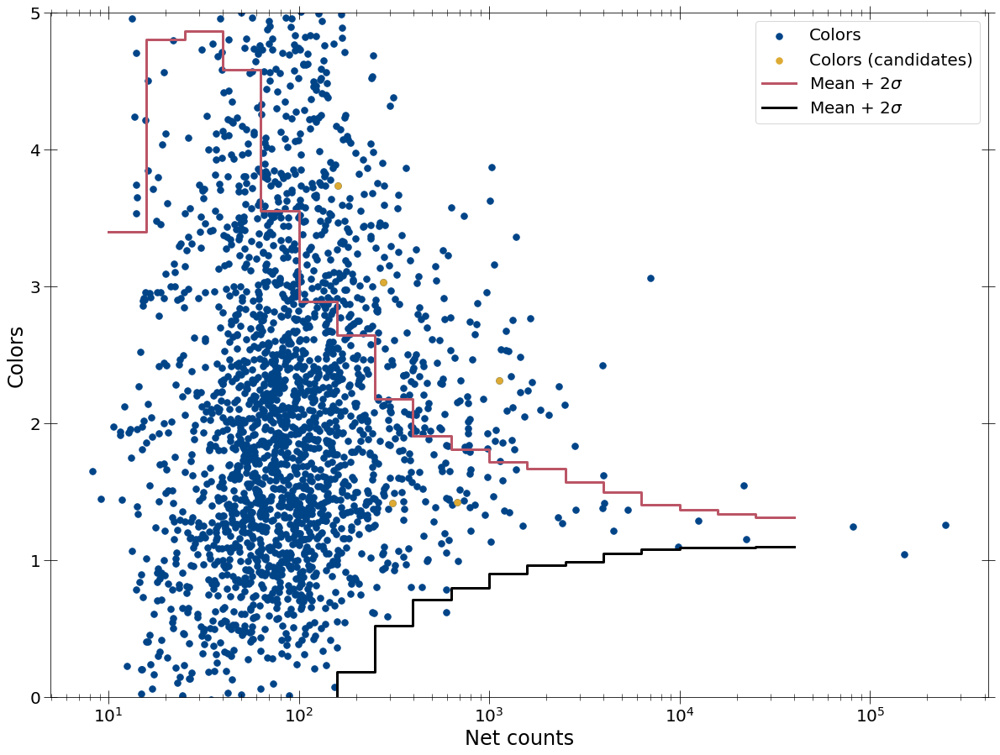

In [346]:
mark_interested_srcs(
    sim_msps_color_dict_arr[2], obs_color_dict_arr[2],
    spec_summary_msps['src_nums'][1], spec_summary_msps['spec_masks'][1][2],
    ['2CXOJ174540.4-290036', '2CXOJ174539.4-290041', '2CXOJ174539.4-290046',
     '2CXOJ174540.3-290049', '2CXOJ174539.2-290049'])

178 178
152 152
130 130


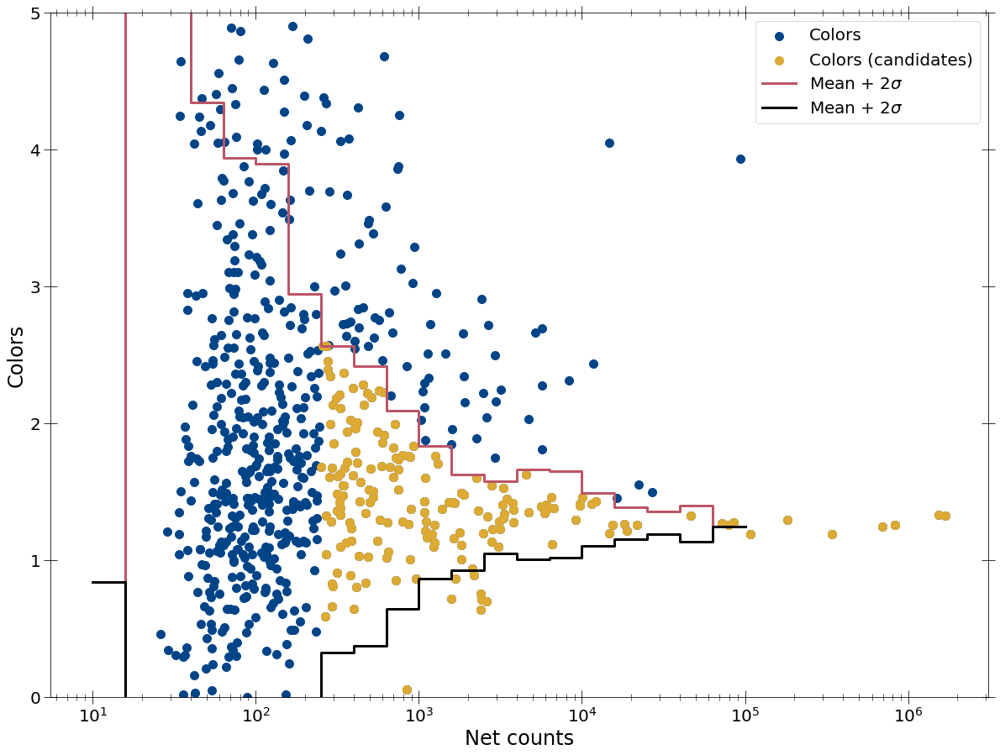

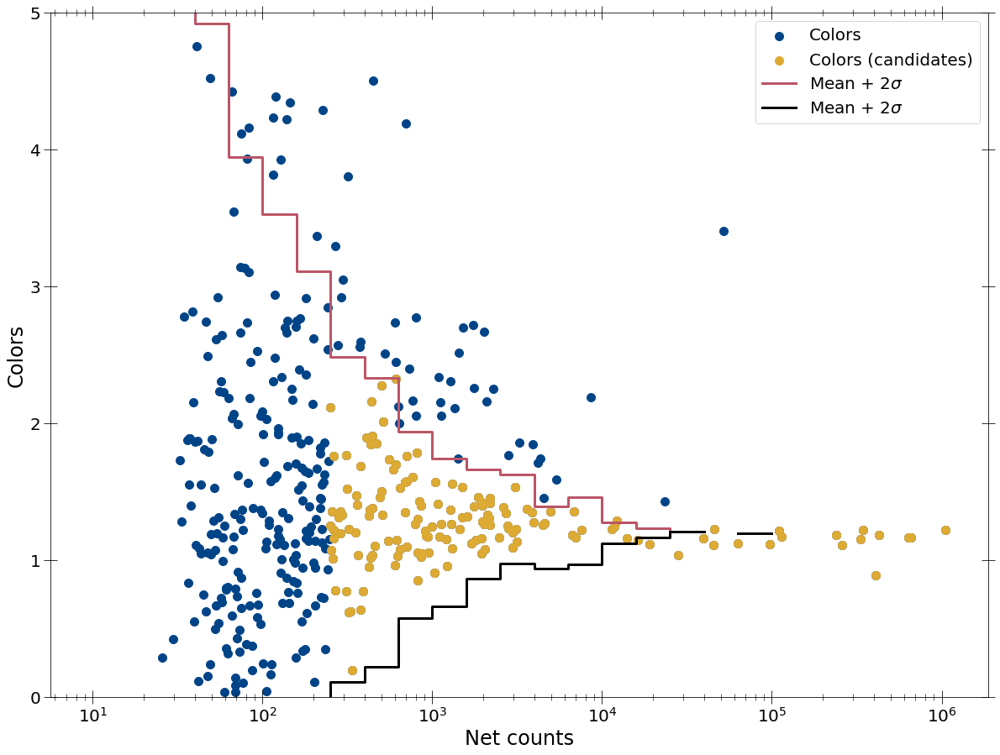

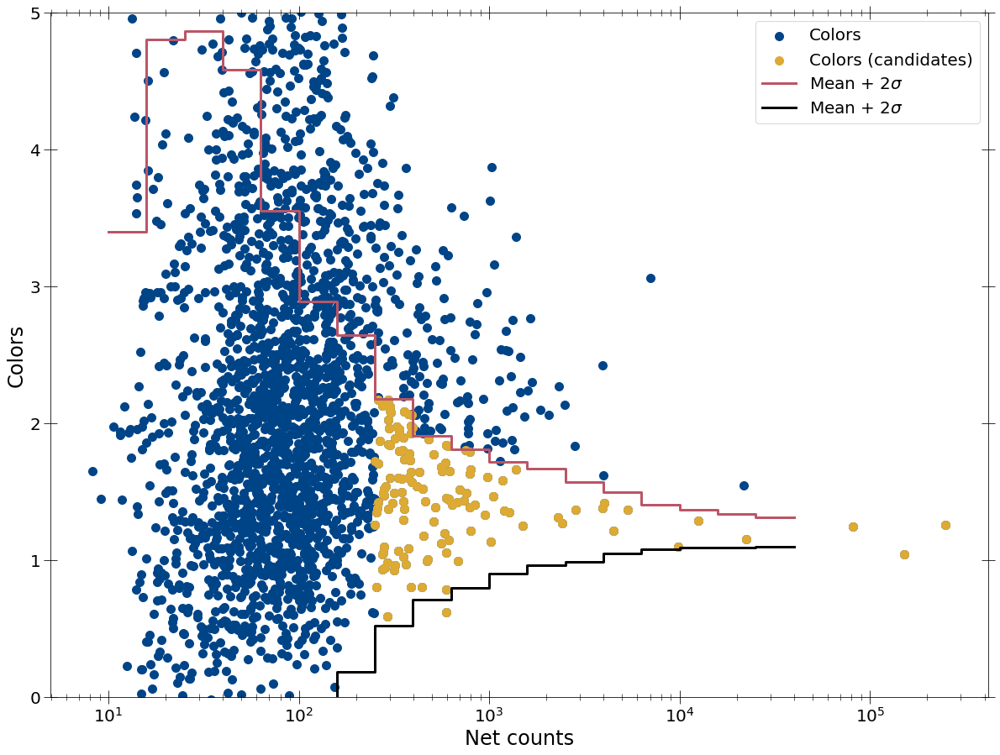

In [14]:
interested_msp_colors_pn, interested_msp_netcounts_pn = mark_interested_srcs(
    sim_msps_color_dict_arr[0], obs_color_dict_arr[0],
    spec_summary_msps['src_nums'][0], spec_summary_msps['spec_masks'][1][0],
    interested_msp_srcs_alldet[0])
interested_msp_colors_mos, interested_msp_netcounts_mos = mark_interested_srcs(
    sim_msps_color_dict_arr[1], obs_color_dict_arr[1],
    spec_summary_msps['src_nums'][0], spec_summary_msps['spec_masks'][1][1],
    interested_msp_srcs_alldet[1])
(interested_msp_colors_acis,
 interested_msp_netcounts_acis) = mark_interested_srcs(
    sim_msps_color_dict_arr[2], obs_color_dict_arr[2],
    spec_summary_msps['src_nums'][1], spec_summary_msps['spec_masks'][1][2],
    interested_msp_srcs_alldet[2])

In [15]:
interested_msps_xmm = np.array(
    list(set(interested_msp_srcs_alldet[0]) |
         set(interested_msp_srcs_alldet[1])))

In [16]:
len(interested_msps_xmm)

267

In [17]:
arr_to_str(np.array(interested_msp_srcs_alldet[2]).astype(str), telescope='Chandra')

NameError: name 'arr_to_str' is not defined

## Spectral analysis to check for lines

In [18]:
xspec.Xset.version

('2.0.4', '12.11.1')

In [19]:
def fit_src_pl(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder +
                                 str(source_num) + '_PN_combined_src_grp1*')
        spec_mosfile = glob2.glob(src_folder +
                                  str(source_num) + '_MOS_combined_src_grp1*')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        os.chdir(src_folder + '/' + source_num)
        spec_file = str(source_num) + '_combined_src_grp1.pi'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')

    model = xspec.Model('tbabs*pegpwrlw')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.perform()
    xspec.Fit.error('2.706 2')
    xspec.Fit.perform()
    # print('Calculating goodness')
    # goodness = xspec.Fit.goodness(1000)
    # print('Finished calculating goodness')
    goodness = 50.0
    print('Model params for ' + source_num +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0])
    print('Fit stats for ' + source_num + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    if telescope == 'Chandra':
        os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0]])

50:80: E501 line too long (80 > 79 characters)


In [20]:
def fit_src_pl_gauss(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder +
                                 str(source_num) + '_PN_combined_src_grp1*')
        spec_mosfile = glob2.glob(src_folder +
                                  str(source_num) + '_MOS_combined_src_grp1*')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        os.chdir(src_folder + '/' + source_num)
        spec_file = str(source_num) + '_combined_src_grp1.pi'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')
    
    model = xspec.Model('tbabs*(pegpwrlw+gauss)')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    model.pegpwrlw.eMin.values = '2.0'
    model.pegpwrlw.eMax.values = '10.0'
    model.gaussian.LineE.values = '6.7, 0.0001, 6.1, 6.1, 7.3, 7.3'
    model.gaussian.Sigma.values = '0.1 0'
    model.gaussian.norm.values = '1.0E-5, 0.001,,,,'
    
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.query = 'yes'
    xspec.Fit.perform()
    xspec.Fit.error('2.706 6')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 8')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 6')
    xspec.Fit.error('2.706 8')
    xspec.Fit.perform()
    # goodness = xspec.Fit.goodness(1000)
    goodness = 50.0
    line_pos_low = xspec.AllModels(1).gaussian.LineE.error[0]
    line_pos_high = xspec.AllModels(1).gaussian.LineE.error[1]
    line_norm_low = xspec.AllModels(1).gaussian.norm.error[0]
    line_norm_high = xspec.AllModels(1).gaussian.norm.error[1]
    print('Model params for ' + source_num +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0],
          ' Fe_pos:', xspec.AllModels(1).gaussian.LineE.values[0],
          line_pos_low, line_pos_high,
          ' Fe_norm:', xspec.AllModels(1).gaussian.norm.values[0],
          line_norm_low, line_norm_high)
    print('Fit stats for ' + source_num + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0],
             xspec.AllModels(1).gaussian.LineE.values[0], line_pos_low,
             line_pos_high,
             xspec.AllModels(1).gaussian.norm.values[0], line_norm_low,
             line_norm_high])


27:1: W293 blank line contains whitespace
36:1: W293 blank line contains whitespace
67:80: E501 line too long (80 > 79 characters)


In [21]:
def fit_src_pl_gauss2(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder +
                                 str(source_num) + '_PN_combined_src_grp1*')
        print(src_folder + str(source_num) + '_PN_combined_src_grp1*')
        spec_mosfile = glob2.glob(src_folder +
                                  str(source_num) + '_MOS_combined_src_grp1*')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        os.chdir(src_folder + '/' + source_num)
        spec_file = str(source_num) + '_combined_src_grp1.pi'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')
    
    model = xspec.Model('tbabs*(pegpwrlw+gauss+gauss+gauss)')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    model.pegpwrlw.eMin.values = '2.0'
    model.pegpwrlw.eMax.values = '10.0'
    model.gaussian.LineE.values = '6.4 0'
    model.gaussian.Sigma.values = '0.0 0'
    model.gaussian.norm.values = '1.0E-5, 0.001,,,,'
    model.gaussian_4.LineE.values = '6.7 0'
    model.gaussian_4.Sigma.values = '0.0 0'
    model.gaussian_4.norm.values = '1.0E-5, 0.001,,,,'
    model.gaussian_5.LineE.values = '7.0 0'
    model.gaussian_5.Sigma.values = '0.0 0'
    model.gaussian_5.norm.values = '1.0E-5, 0.001,,,,'
    
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.query = 'yes'
    xspec.Fit.perform()
    xspec.Fit.error('2.706 8')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 11')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 14')
    # xspec.Fit.error('2.706 8')
    # goodness = xspec.Fit.goodness(1000)
    goodness = 50.0
    line_norm1_low = xspec.AllModels(1).gaussian.norm.error[0]
    line_norm1_high = xspec.AllModels(1).gaussian.norm.error[1]
    line_norm2_low = xspec.AllModels(1).gaussian_4.norm.error[0]
    line_norm2_high = xspec.AllModels(1).gaussian_4.norm.error[1]
    line_norm3_low = xspec.AllModels(1).gaussian_5.norm.error[0]
    line_norm3_high = xspec.AllModels(1).gaussian_5.norm.error[1]
    xspec.Fit.perform()
    print('Model params for ' + source_num +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0],
          ' Fe_norms:', xspec.AllModels(1).gaussian.norm.values[0],
          line_norm1_low, line_norm1_high,
          xspec.AllModels(1).gaussian_4.norm.values[0], line_norm2_low,
          line_norm2_high, xspec.AllModels(1).gaussian_5.norm.values[0],
          line_norm3_low, line_norm3_high)
    print('Fit stats for ' + source_num + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0],
             xspec.AllModels(1).gaussian.norm.values[0],
             xspec.AllModels(1).gaussian_4.norm.values[0],
             xspec.AllModels(1).gaussian_5.norm.values[0], line_norm1_low,
             line_norm1_high, line_norm2_low, line_norm2_high, line_norm3_low,
             line_norm3_high])


28:1: W293 blank line contains whitespace
43:1: W293 blank line contains whitespace
77:80: E501 line too long (80 > 79 characters)


In [22]:
os.chdir('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/xmm_combined_copy/')
xspec.AllData.clear()
fit_src_pl(interested_msp_srcs_alldet[1][1], src_folder='./')

Model params for 206735502010052: NH =  20.679981379969558  Gamma:  3.48408630616184  norm:  0.34524272954149976
Fit stats for 206735502010052:  351.1758956136768 -7.263579248439246 50.0 363




(['206735502010052', 351.1758956136768, -7.263579248439246, 50.0, 363],
 ['206735502010052',
  20.679981379969558,
  3.48408630616184,
  0.34524272954149976])

1:80: E501 line too long (86 > 79 characters)


In [27]:
os.chdir('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/chandra_obs_hard07/')
xspec.AllData.clear()
fit_src_pl(interested_msp_srcs_alldet[2][-1], src_folder='./', telescope='Chandra')

Model params for 2CXOJ174621.1-284343: NH =  23.855978299026678  Gamma:  0.8033916998605377  norm:  188.16904496088773
Fit stats for 2CXOJ174621.1-284343:  10556.325781206386 -11.348492014279552 50.0 546




(['2CXOJ174621.1-284343', 10556.325781206386, -11.348492014279552, 50.0, 546],
 ['2CXOJ174621.1-284343',
  23.855978299026678,
  0.8033916998605377,
  188.16904496088773])

1:80: E501 line too long (87 > 79 characters)


In [23]:
pn_fit_stats_table_pl = []
pn_model_params_table_pl = []

for source_num in interested_msp_srcs_alldet[0]:
    print(source_num)
    fit_stats, model_params = fit_src_pl(source_num)
    pn_fit_stats_table_pl.append(fit_stats)
    pn_model_params_table_pl.append(model_params)

200305401010008
Model params for 200305401010008: NH =  9.34439638661711  Gamma:  0.1938138006596022  norm:  0.17775347039666198
Fit stats for 200305401010008:  502.2244657140632 -7.246649113804086 50.0 633


200305401010017
Model params for 200305401010017: NH =  18.901758728763074  Gamma:  1.9048621050490228e-05  norm:  0.15741084535160457
Fit stats for 200305401010017:  462.29348126597927 -6.728358338611993 50.0 479


200305401015015
Model params for 200305401015015: NH =  5.695919752718181  Gamma:  0.5900718310976079  norm:  0.184916221634929
Fit stats for 200305401015015:  502.5349359198197 -7.750631702416386 50.0 642


201113501010117
Model params for 201113501010117: NH =  15.04253129333029  Gamma:  0.00011190221409127837  norm:  0.15827113901941042
Fit stats for 201113501010117:  946.9606723829569 -6.335978340696642 50.0 1183


201113501010148
Model params for 201113501010148: NH =  90.3596160283502  Gamma:  1.776847759431222  norm:  0.2236002475847295
Fit stats for 20111350101

Model params for 208441011010211: NH =  3.1249634536016018  Gamma:  1.3753767510850454  norm:  0.8444880167700237
Fit stats for 208441011010211:  520.1027682345366 -4.772808369191203 50.0 607


208624701010022
Model params for 208624701010022: NH =  1.7911475819257936  Gamma:  0.0936085560574382  norm:  0.713715772519095
Fit stats for 208624701010022:  416.9263091066727 -6.0055037204039206 50.0 410


208860108010001
Model params for 208860108010001: NH =  3.0575260589008866  Gamma:  0.8402831594050981  norm:  0.6980358922780346
Fit stats for 208860108010001:  655.4662902343343 -6.564761603972271 50.0 726


208860204010001
Model params for 208860204010001: NH =  3.4004982211472936  Gamma:  0.45507316260575575  norm:  1.001420440935013
Fit stats for 208860204010001:  489.5594109593977 -5.792380113900929 50.0 537


208860207010007
Model params for 208860207010007: NH =  6.899645434456533  Gamma:  0.5581816127735532  norm:  0.7207239955123548
Fit stats for 208860207010007:  1063.0271217237

Model params for 201129704010019: NH =  29.864659268969216  Gamma:  0.6018414528332767  norm:  0.19360827900475353
Fit stats for 201129704010019:  1297.2771783005433 -6.796427163329778 50.0 1425


201129704010027
Model params for 201129704010027: NH =  41.62521980981414  Gamma:  0.8812521184821249  norm:  0.3626863600532729
Fit stats for 201129704010027:  1259.280274068988 -5.89001736677815 50.0 1576


201129707010002
Model params for 201129707010002: NH =  16.008572366704563  Gamma:  0.18894350827211082  norm:  0.19323181653137078
Fit stats for 201129707010002:  799.910755380052 -6.3528137034330925 50.0 875


201129707010012
Model params for 201129707010012: NH =  43.16468607056653  Gamma:  1.1527069589111714  norm:  0.3483553753373332
Fit stats for 201129707010012:  850.2383467199231 -8.226230440283452 50.0 1050


201129707010048
Model params for 201129707010048: NH =  12.038511152192159  Gamma:  0.3038211199132748  norm:  0.15756689294734022
Fit stats for 201129707010048:  769.70339

Model params for 207234105010019: NH =  7.02420657368111  Gamma:  0.2306636725272447  norm:  2.4012112622187742
Fit stats for 207234105010019:  3580.5865902748887 -3.606146866680753 50.0 2453


207901804010019
Model params for 207901804010019: NH =  18.172532463317598  Gamma:  5.0  norm:  8.390811881735825
Fit stats for 207901804010019:  840.9294187099805 -7.767112222703292 50.0 879


207901804010036
Model params for 207901804010036: NH =  16.92960637469386  Gamma:  5.0  norm:  9.07752800021059
Fit stats for 207901804010036:  862.8407913260966 -7.382878095950907 50.0 883


207901804010045
Model params for 207901804010045: NH =  16.921227616338765  Gamma:  4.9999999999628715  norm:  10.015190972421182
Fit stats for 207901804010045:  804.2203302789644 -7.4757359582739475 50.0 865


207901804010056
Model params for 207901804010056: NH =  19.21407507086865  Gamma:  4.999999999998158  norm:  4.832664728818938
Fit stats for 207901804010056:  802.578295481414 -7.488619143650137 50.0 845


207

Model params for 201129706010014: NH =  12.93567025687425  Gamma:  1.120137803753283  norm:  0.4230482121243671
Fit stats for 201129706010014:  3640.7329163548366 -5.7742945440288675 50.0 3170


201129721010003
Model params for 201129721010003: NH =  12.125075301356242  Gamma:  1.4198908366754894  norm:  1.5212841080584507
Fit stats for 201129721010003:  6060.841133867188 -4.498763402537974 50.0 3105


201442201010001
Model params for 201442201010001: NH =  12.220716162277512  Gamma:  1.846145991261998  norm:  5.260906855810096
Fit stats for 201442201010001:  2995.059325391424 -10.666957996544074 50.0 3064


207234103010035
Model params for 207234103010035: NH =  8.233679626065426  Gamma:  0.6957884305890676  norm:  7.775378800788057
Fit stats for 207234103010035:  1897.2594705821427 -7.691011169828984 50.0 1467


208441011010001
Model params for 208441011010001: NH =  22.213476782990924  Gamma:  1.0227157916727352  norm:  16.398661770718846
Fit stats for 208441011010001:  2720.5517770

In [24]:
pn_fit_stats_table_pl_g = []
pn_model_params_table_pl_g = []
pn_fit_stats_table_pl_g2 = []
pn_model_params_table_pl_g2 = []

for source_num in interested_msp_srcs_alldet[0]:
    print(source_num)
    fit_stats, model_params = fit_src_pl_gauss(source_num)
    fit_stats2, model_params2 = fit_src_pl_gauss2(source_num)
    pn_fit_stats_table_pl_g.append(fit_stats)
    pn_model_params_table_pl_g.append(model_params)
    pn_fit_stats_table_pl_g2.append(fit_stats2)
    pn_model_params_table_pl_g2.append(model_params2)

200305401010008
Model params for 200305401010008: NH =  9.410836668716426  Gamma:  0.31316429628305037  norm:  0.1682937324065252  Fe_pos: 6.679061382304389 0.0 0.0  Fe_norm: 4.914938239077425e-07 0.0 1.1220576072478822e-06
Fit stats for 200305401010008:  499.9877717445126 -7.381164157317857 50.0 631


./200305401010008_PN_combined_src_grp1*
Model params for 200305401010008: NH =  9.946547867151342  Gamma:  0.3908724547127917  norm:  0.16758792040410508  Fe_norms: 2.9399486915566293e-12 0.0 3.785411496372471e-07 4.063090036987953e-07 0.0 9.137043201791979e-07 2.391594001222694e-07 0.0 7.733016261669386e-07
Fit stats for 200305401010008:  499.0322629449573 -7.437809985037863 50.0 630


200305401010017
Model params for 200305401010017: NH =  14.52312604998171  Gamma:  9.021123871804771e-05  norm:  0.13152636114870503  Fe_pos: 6.750578916219702 6.666456797029645 6.833324050885356  Fe_norm: 8.014779734442652e-07 4.046797157526311e-07 1.2765232316456662e-06
Fit stats for 200305401010017:  4

Model params for 201129707010033: NH =  13.93686628682373  Gamma:  0.3679833979511906  norm:  0.13347689274906285  Fe_norms: 1.251788754989287e-07 0.0 4.570416079298775e-07 3.993436402749126e-07 7.213503594143747e-08 7.921233557793845e-07 1.304826257630878e-07 0.0 4.826977808106035e-07
Fit stats for 201129707010033:  399.6425618686704 -8.59615945807336 50.0 473


201129708010014
Model params for 201129708010014: NH =  12.862933115536036  Gamma:  0.08452578472120434  norm:  0.16731508105658455  Fe_pos: 6.8690170187721975 6.699144685637003 7.0133813892604975  Fe_norm: 5.746222015396484e-07 1.366844237854955e-07 1.0829315122984273e-06
Fit stats for 201129708010014:  650.2690609518199 -7.560154641445916 50.0 848


./201129708010014_PN_combined_src_grp1*
Model params for 201129708010014: NH =  12.70635123482562  Gamma:  0.10057375070288892  norm:  0.16420468630177382  Fe_norms: 1.347405326477065e-07 0.0 4.501218232380714e-07 2.3150620567760128e-07 0.0 5.906783522129695e-07 3.410575179425313

Model params for 205110002015026: NH =  3.5208333358892654  Gamma:  1.4776354292490224  norm:  0.06718674700893204  Fe_pos: 6.569189030497104 6.189564669055946 6.795764183958111  Fe_norm: 3.2620062318130246e-07 6.523673459600386e-08 6.273792496898587e-07
Fit stats for 205110002015026:  677.6228183796045 -9.325885357879326 50.0 823


./205110002015026_PN_combined_src_grp1*
Model params for 205110002015026: NH =  4.063340062882311  Gamma:  1.6393193570854279  norm:  0.06627591499695185  Fe_norms: 1.8394547342734013e-07 0.0 4.243521490419012e-07 2.0310380601586837e-07 0.0 4.4774374603583886e-07 1.5073624952544337e-07 0.0 4.026565723795776e-07
Fit stats for 205110002015026:  676.2119295113023 -9.256224009150964 50.0 822


205110012010036
Model params for 205110012010036: NH =  11.471724648567362  Gamma:  1.3471258088695777  norm:  2.3992909732056638  Fe_pos: 6.890725268140341 0.0 0.0  Fe_norm: 4.496533422208207e-06 0.0 1.0912347392172984e-05
Fit stats for 205110012010036:  293.115195978413

Model params for 208024101010012: NH =  10.023915119408793  Gamma:  0.4393381358620523  norm:  0.30797137745254116  Fe_norms: 5.085832097441468e-07 6.627468941142729e-09 1.1098850245722678e-06 1.0440192064250552e-06 4.626629949556527e-07 1.7316585848647164e-06 2.9802761311747025e-15 0.0 3.454886656265037e-07
Fit stats for 208024101010012:  668.198125385403 -6.065188401392223 50.0 697


208251401010016
Model params for 208251401010016: NH =  6.720345924411799  Gamma:  4.0324830990948767e-07  norm:  0.11581619786514812  Fe_pos: 6.899914967123236 6.817985869883025 6.983728877251382  Fe_norm: 7.576170535063917e-07 3.5634612744732976e-07 1.2162803513739586e-06
Fit stats for 208251401010016:  493.5115325367089 -7.25219779427016 50.0 644


./208251401010016_PN_combined_src_grp1*
Model params for 208251401010016: NH =  6.242080447932193  Gamma:  1.2422628796565503e-06  norm:  0.11117229300897022  Fe_norms: 3.023037362532391e-07 4.962088895289368e-08 5.937911521950241e-07 1.251753767080676e-07 

Model params for 201129701010015: NH =  3.5518015222337502  Gamma:  0.8309308343027613  norm:  0.07681672166749906  Fe_pos: 6.807971467195359 6.679075858000969 6.921312742146225  Fe_norm: 3.6669154268101983e-07 1.1258930135148054e-07 6.616759615790213e-07
Fit stats for 201129701010015:  887.3121592712932 -6.866900087834992 50.0 1129


./201129701010015_PN_combined_src_grp1*
Model params for 201129701010015: NH =  3.31838177978455  Gamma:  0.7720457656416215  norm:  0.07743181625076409  Fe_norms: 5.0165736722728575e-08 0.0 2.3384348074867808e-07 1.7731910608465431e-07 0.0 4.0149084300016715e-07 7.230784333993648e-08 0.0 3.0057651856136355e-07
Fit stats for 201129701010015:  890.5552949666865 -6.841347602201237 50.0 1128


201129702010014
Model params for 201129702010014: NH =  30.65179054071197  Gamma:  0.7906844512414385  norm:  0.2316584127880135  Fe_pos: 6.893565611126618 6.827823336044008 6.959508470322066  Fe_norm: 1.1784724438802806e-06 7.05652480147419e-07 1.7216665896924634e-06


Model params for 201129715010042: NH =  29.014581646908255  Gamma:  1.3190134044807658  norm:  0.15452073634619964  Fe_pos: 6.880876774608856 6.703262712818714 0.0  Fe_norm: 3.352242869143134e-07 5.046355614804857e-08 6.547910652611686e-07
Fit stats for 201129715010042:  818.1725485498528 -5.655026696953732 50.0 982


./201129715010042_PN_combined_src_grp1*
Model params for 201129715010042: NH =  28.436530573677096  Gamma:  1.3139123014099796  norm:  0.15058840267890955  Fe_norms: 9.935825774100544e-08 0.0 3.3691421942966214e-07 1.3677429768894864e-07 0.0 3.8210591785387394e-07 2.0104435854861727e-07 0.0 4.5078742239619817e-07
Fit stats for 201129715010042:  818.375476095481 -5.65039216945856 50.0 981


201129719010009
Model params for 201129719010009: NH =  49.40152667771614  Gamma:  5.123790980165688e-07  norm:  1.6195585453813715  Fe_pos: 6.347910209620275 6.279185108127587 6.419961993406753  Fe_norm: 6.229349912523104e-06 3.76317401614872e-06 8.932552789072878e-06
Fit stats for 201

Model params for 206946401010004: NH =  9.21728249917486  Gamma:  1.4617687225228442  norm:  1.843411568522415  Fe_norms: 3.914016725805979e-09 0.0 4.185131432504445e-06 3.977458754328615e-06 0.0 9.056822252935695e-06 3.701549984001526e-06 0.0 9.386844828065428e-06
Fit stats for 206946401010004:  438.02913300600653 -8.192708791637695 50.0 511


206946402010031
Model params for 206946402010031: NH =  9.786235380714661  Gamma:  2.605862811566966  norm:  0.8037790134121311  Fe_pos: 6.359243773528146 0.0 0.0  Fe_norm: 1.4248269171223095e-06 0.0 3.7850650554341048e-06
Fit stats for 206946402010031:  419.1170696200028 -9.015813710805425 50.0 540


./206946402010031_PN_combined_src_grp1*
Model params for 206946402010031: NH =  10.306571872954802  Gamma:  2.7427510084909894  norm:  0.8271521058818323  Fe_norms: 6.608648173929368e-07 0.0 2.5052149994590275e-06 6.9679760345735e-07 0.0 2.5532342154224027e-06 1.2702700766682821e-06 0.0 3.4142497978926804e-06
Fit stats for 206946402010031:  417.903

Model params for 201129704010027: NH =  30.594093767728356  Gamma:  0.6529402428109595  norm:  0.2631722940714448  Fe_norms: 5.321772733162584e-07 2.127880689105929e-07 8.831596726912343e-07 6.620054974530493e-07 3.312452786131029e-07 1.0287098514826697e-06 3.6004404165406866e-07 4.3239829570595086e-08 7.108896521725177e-07
Fit stats for 201129704010027:  1239.8228624729345 -6.023660403105277 50.0 1573


201129707010002
Model params for 201129707010002: NH =  14.138656353158284  Gamma:  0.15814339979881714  norm:  0.17713460491570443  Fe_pos: 6.5984285013259205 6.418827833960344 6.756805979125307  Fe_norm: 5.850179495518406e-07 2.458968443134455e-07 9.538253153937607e-07
Fit stats for 201129707010002:  791.2956712828801 -6.389123762816667 50.0 873


./201129707010002_PN_combined_src_grp1*
Model params for 201129707010002: NH =  13.073458092068035  Gamma:  0.15995987858214075  norm:  0.16619095529020503  Fe_norms: 4.0926796354535336e-07 1.6808808932832206e-07 6.810482446327783e-07 4.643

Model params for 207234103015041: NH =  8.391367666575492  Gamma:  0.21424726541188893  norm:  2.3487376903253394  Fe_norms: 6.096617492524817e-07 0.0 2.7971149556988767e-06 5.284370028759066e-07 0.0 2.9452945292946636e-06 3.235417314270233e-06 7.061695553005979e-07 6.131785508999179e-06
Fit stats for 207234103015041:  1310.785934883524 -5.483950276486397 50.0 1487


207234105010024
Model params for 207234105010024: NH =  8.308923432502255  Gamma:  0.719852283093082  norm:  3.931593182979364  Fe_pos: 6.9256752808349855 6.750773323227466 7.1249500194104  Fe_norm: 7.329350055649779e-06 2.8227064902699813e-06 1.222186574447772e-05
Fit stats for 207234105010024:  3201.7281280162906 -2.8387955777788116 50.0 1852


./207234105010024_PN_combined_src_grp1*
Model params for 207234105010024: NH =  8.398808843090851  Gamma:  0.7582944393074017  norm:  3.879815231530631  Fe_norms: 2.0165672494760113e-06 0.0 5.06498605867635e-06 3.7671016472390683e-06 7.819976577313953e-07 7.09923601219413e-06 5.10

Model params for 206946409010002: NH =  9.51008843315819  Gamma:  2.2541357280509606  norm:  2.0064674817506627  Fe_pos: 6.447056789487504 6.300687585525322 6.578342645921346  Fe_norm: 4.935879508442289e-06 1.637688952570642e-06 8.701996286597252e-06
Fit stats for 206946409010002:  717.7336678507119 -10.339158071583743 50.0 779


./206946409010002_PN_combined_src_grp1*
Model params for 206946409010002: NH =  9.499756582104007  Gamma:  2.2445491763870087  norm:  2.011330288451494  Fe_norms: 3.0344000128748276e-06 4.969690731026422e-07 6.083664958844511e-06 5.930469751173878e-13 0.0 2.390991602970753e-06 2.0332091237004306e-06 0.0 5.272203637032467e-06
Fit stats for 206946409010002:  719.072838285403 -10.264818800524571 50.0 778


207234103010016
Model params for 207234103010016: NH =  7.3532519064837105  Gamma:  0.3326117712175353  norm:  4.0892894505147135  Fe_pos: 6.95258852660183 6.857173869067835 7.046914878138147  Fe_norm: 1.568922126200109e-05 9.67209845082261e-06 2.22293185249986

Model params for 201529201010094: NH =  6.72731023402895  Gamma:  1.7200799581776547  norm:  1.3871434983018505  Fe_norms: 7.033110832649345e-07 0.0 1.7599375768292383e-06 6.689327674105415e-07 0.0 1.8014030571722003e-06 7.030397940559147e-07 0.0 1.8623508118635265e-06
Fit stats for 201529201010094:  901.5004880580291 -9.725624896156752 50.0 998


202026707010271
Model params for 202026707010271: NH =  19.81616228781602  Gamma:  5.0  norm:  5.46101179549345  Fe_pos: 6.518196676760956 0.0 0.0  Fe_norm: 3.6732844999604494e-23 0.8224962005991274 0.0
Fit stats for 202026707010271:  860.2236774003702 -7.707607868710697 50.0 928


./202026707010271_PN_combined_src_grp1*
Model params for 202026707010271: NH =  19.863726388291084  Gamma:  5.0  norm:  5.492386130414503  Fe_norms: 6.029533503696923e-23 0.8224962005991274 0.0 2.371805345563363e-22 0.0 4.7173990332853966e-07 1.1658015302696802e-22 0.8224962005991274 0.0
Fit stats for 202026707010271:  860.2418859977058 -7.675704372569055 50.0 927


Model params for 207901804010066: NH =  18.807918931877985  Gamma:  5.0  norm:  4.973258426421662  Fe_norms: 1.976980377478863e-22 0.8224962005991274 0.0 1.1588629482791923e-22 0.8224962005991274 0.0 2.395868602836693e-22 0.8224962005991274 0.0
Fit stats for 207901804010066:  761.6228954065682 -7.5959834319041155 50.0 811


207901804015015
Model params for 207901804015015: NH =  20.259133473192918  Gamma:  5.0  norm:  6.305964877705168  Fe_pos: 7.003874517860132 0.0 0.0  Fe_norm: 9.997328357789784e-23 0.8224962005991274 0.0
Fit stats for 207901804015015:  869.1797645089695 -7.2671777076169155 50.0 947


./207901804015015_PN_combined_src_grp1*
Model params for 207901804015015: NH =  20.25846253499322  Gamma:  5.0  norm:  6.305595752497505  Fe_norms: 2.2006103850274693e-22 0.8224962005991274 0.0 1.454178107450923e-22 0.8224962005991274 0.0 1.8899679133346076e-22 0.8224962005991274 0.0
Fit stats for 207901804015015:  869.1797569100023 -7.267563721482234 50.0 946


207901804015034
Model pa

Model params for 207234103010038: NH =  7.091331789437479  Gamma:  0.3573536146474777  norm:  3.9864685960307953  Fe_pos: 6.7621954824603066 6.683435048389593 6.852521097122358  Fe_norm: 1.539242677615011e-05 1.1016351666057571e-05 2.0070127460354936e-05
Fit stats for 207234103010038:  1392.3769946358716 -8.019731329915334 50.0 1317


./207234103010038_PN_combined_src_grp1*
Model params for 207234103010038: NH =  7.197897561904507  Gamma:  0.4013764645565274  norm:  3.9165247621107087  Fe_norms: 3.2153044149083574e-06 7.108652258749827e-07 5.958313700423797e-06 9.201684035583024e-06 6.045455748771825e-06 1.263188538623106e-05 8.042134970945531e-06 4.714984211789497e-06 1.1691302421170168e-05
Fit stats for 207234103010038:  1386.4679700479442 -8.188177927764848 50.0 1316


207234103010040
Model params for 207234103010040: NH =  6.600768961380268  Gamma:  0.3905981439246614  norm:  4.140953272504823  Fe_pos: 7.0033337915205705 6.947913140188986 7.063380426796042  Fe_norm: 2.3189432323720

Model params for 207234103010007: NH =  9.763190923472365  Gamma:  0.8147700439972508  norm:  7.851882695267468  Fe_pos: 6.643499310003691 6.577926430423134 6.7186891121969055  Fe_norm: 2.5581874609898808e-05 1.9362626013377965e-05 3.2106092741043924e-05
Fit stats for 207234103010007:  1772.5433057205787 -8.111247772620791 50.0 1365


./207234103010007_PN_combined_src_grp1*
Model params for 207234103010007: NH =  10.158690411607273  Gamma:  0.9386156513260122  norm:  7.627893333840302  Fe_norms: 1.0515837759791826e-05 6.49689553256803e-06 1.4823757064694365e-05 1.6406726087592498e-05 1.1846133852088706e-05 2.129238235642834e-05 2.230746866562561e-05 1.7069216709984334e-05 2.7932095879023914e-05
Fit stats for 207234103010007:  1711.3613882940315 -8.437808512358213 50.0 1364


207234103010014
Model params for 207234103010014: NH =  11.51507623464565  Gamma:  1.0650857113185799  norm:  7.528563865096742  Fe_pos: 6.842015998251528 6.781603782022429 6.906875024837187  Fe_norm: 3.28512659830

Model params for 201129721010003: NH =  12.211822390902206  Gamma:  1.4453845516990516  norm:  1.5171133759611515  Fe_pos: 6.481631662820745 6.353582542380544 6.627968609440513  Fe_norm: 6.005871199755195e-07 1.8348983101322492e-07 1.0280321005139679e-06
Fit stats for 201129721010003:  6055.169085363786 -4.498525331722795 50.0 3103


./201129721010003_PN_combined_src_grp1*
Model params for 201129721010003: NH =  12.209310028271897  Gamma:  1.4445713730321499  norm:  1.517278729770509  Fe_norms: 4.0825177223700537e-07 1.0119156735239031e-07 7.272915080731829e-07 1.7699367970000317e-07 0.0 5.131160071306973e-07 8.447718372173616e-17 0.0 2.3729129245821272e-07
Fit stats for 201129721010003:  6055.410545732114 -4.498579843825509 50.0 3102


201442201010001
Model params for 201442201010001: NH =  12.258470560211041  Gamma:  1.8561660508790536  norm:  5.26199636685128  Fe_pos: 6.8543017292212705 0.0 0.0  Fe_norm: 7.084662665543075e-07 0.0 2.0430628040459284e-06
Fit stats for 201442201010001:

Model params for 201113503010004: NH =  16.97765963734924  Gamma:  1.7937406212515636  norm:  115.16842760032849  Fe_norms: 6.788439228302758e-06 4.237893828760984e-06 9.353788855333642e-06 6.773187197168101e-06 4.1744895426778085e-06 9.387506916202035e-06 4.602917537565515e-06 1.939238323613772e-06 7.282841456105761e-06
Fit stats for 201113503010004:  5370.167463858613 -10.493574654609356 50.0 3192


201129704010001
Model params for 201129704010001: NH =  28.773881521531976  Gamma:  1.5196903482163822  norm:  239.84525689291777  Fe_pos: 6.138919100032484 0.0 6.199406141358341  Fe_norm: 3.139533792311152e-05 2.6675766690138718e-05 3.5968688124210105e-05
Fit stats for 201129704010001:  6780.820110542423 -11.456796230191582 50.0 3193


./201129704010001_PN_combined_src_grp1*
Model params for 201129704010001: NH =  28.824993761847313  Gamma:  1.5241895160892978  norm:  240.35194384317094  Fe_norms: 1.643277245239836e-05 1.2788884022106574e-05 2.0091424979742432e-05 8.684675693830759e-06 5

In [25]:
mos_fit_stats_table_pl = []
mos_model_params_table_pl = []

for source_num in interested_msp_srcs_alldet[1]:
    print(source_num)
    fit_stats, model_params = fit_src_pl(source_num)
    mos_fit_stats_table_pl.append(fit_stats)
    mos_model_params_table_pl.append(model_params)

206556701010043
Model params for 206556701010043: NH =  0.10000000000024141  Gamma:  0.8552887685173224  norm:  0.03431518783397228
Fit stats for 206556701010043:  320.7588560539234 -5.877971615778239 50.0 448


206735502010052
Model params for 206735502010052: NH =  20.679981379969558  Gamma:  3.48408630616184  norm:  0.34524272954149976
Fit stats for 206735502010052:  351.1758956136768 -7.263579248439246 50.0 363


201129704010012
Model params for 201129704010012: NH =  110.19077845639885  Gamma:  2.365390420495424  norm:  0.8977359650356714
Fit stats for 201129704010012:  1333.2129586146812 -5.894412243456255 50.0 1625


201129705010043
Model params for 201129705010043: NH =  34.67526187293621  Gamma:  1.7393702182474813  norm:  0.6103314705962222
Fit stats for 201129705010043:  1031.4046298169842 -5.76291530965561 50.0 1284


201129708010018
Model params for 201129708010018: NH =  25.288861993471894  Gamma:  0.6835314703732129  norm:  0.47591586814744014
Fit stats for 2011297080100

Model params for 206556701010012: NH =  9.429567876195971  Gamma:  0.0910212907828966  norm:  0.15238332866896276
Fit stats for 206556701010012:  1186.5589869334085 -6.621862556872854 50.0 1501


206946401010003
Model params for 206946401010003: NH =  9.256620154928122  Gamma:  1.4044824532880937  norm:  0.8073668171107404
Fit stats for 206946401010003:  982.8034546994674 -3.9024357437039825 50.0 1007


207641904010001
Model params for 207641904010001: NH =  9.426495783508974  Gamma:  0.18945305780026014  norm:  1.0974238475571487
Fit stats for 207641904010001:  1004.1267512271208 -8.904125606259838 50.0 1187


208016803010001
Model params for 208016803010001: NH =  5.333487059252837  Gamma:  0.7149575055634767  norm:  0.6308797426297409
Fit stats for 208016803010001:  991.648224955775 -7.28665936165012 50.0 1133


208251401010006
Model params for 208251401010006: NH =  9.480826134481367  Gamma:  0.0772645086015527  norm:  0.24121792597068448
Fit stats for 208251401010006:  885.2047801

Model params for 201032613010002: NH =  5.426897119465339  Gamma:  0.47090027769133375  norm:  0.773994391241295
Fit stats for 201032613010002:  1255.9294417727688 -7.646708669602269 50.0 1560


201129710010001
Model params for 201129710010001: NH =  6.570332446051216  Gamma:  0.767987432591168  norm:  1.7557492806460617
Fit stats for 201129710010001:  1477.2277454829878 -7.618751667605089 50.0 1748


201129721010057
Model params for 201129721010057: NH =  13.603633148992097  Gamma:  2.909282387114915  norm:  0.09116008345910816
Fit stats for 201129721010057:  2600.6027306447404 -4.57320041276794 50.0 2726


206904418010026
Model params for 206904418010026: NH =  6.966884544400119  Gamma:  0.3101335856332527  norm:  2.1535018038695477
Fit stats for 206904418010026:  2044.3082900764493 -3.2978742265728114 50.0 1713


207234103010016
Model params for 207234103010016: NH =  6.930185530987807  Gamma:  0.1982451848645036  norm:  4.276546066179592
Fit stats for 207234103010016:  1740.6532430

Model params for 201113501010206: NH =  7.970157111790677  Gamma:  4.6203429859879196e-05  norm:  7.170989843762101
Fit stats for 201113501010206:  1136.299363657238 -9.154673543606734 50.0 1262


207234103010056
Model params for 207234103010056: NH =  5.680559402359072  Gamma:  1.202304895315358e-06  norm:  2.447594342451804
Fit stats for 207234103010056:  1102.309477829083 -8.567699347753173 50.0 1201


207234103015059
Model params for 207234103015059: NH =  5.917335284774247  Gamma:  1.6213027969218645e-05  norm:  2.7743251851873003
Fit stats for 207234103015059:  1011.0140314070445 -8.316740869784692 50.0 1122


207234104010008
Model params for 207234104010008: NH =  5.707796287757165  Gamma:  2.4725690317607964e-06  norm:  16.572558105507344
Fit stats for 207234104010008:  1074.8144016457818 -8.553908218077547 50.0 1155


207234105010016
Model params for 207234105010016: NH =  4.538507400619351  Gamma:  7.700971392475844e-06  norm:  12.344451147150378
Fit stats for 207234105010016

In [26]:
mos_fit_stats_table_pl_g = []
mos_model_params_table_pl_g = []
mos_fit_stats_table_pl_g2 = []
mos_model_params_table_pl_g2 = []

for source_num in interested_msp_srcs_alldet[1]:
    print(source_num)
    fit_stats, model_params = fit_src_pl_gauss(source_num)
    fit_stats2, model_params2 = fit_src_pl_gauss2(source_num)
    mos_fit_stats_table_pl_g.append(fit_stats)
    mos_model_params_table_pl_g.append(model_params)
    mos_fit_stats_table_pl_g2.append(fit_stats2)
    mos_model_params_table_pl_g2.append(model_params2)

206556701010043
Model params for 206556701010043: NH =  0.1  Gamma:  1.2617939113972458  norm:  0.027650143219477948  Fe_pos: 6.4445473726969045 6.217669686012193 6.694955051108191  Fe_norm: 4.62964503865472e-07 1.8737942822974002e-08 1.0239672684288125e-06
Fit stats for 206556701010043:  317.7382366536512 -5.7849819273089675 50.0 446


./206556701010043_PN_combined_src_grp1*
Model params for 206556701010043: NH =  0.1  Gamma:  1.2416793955394927  norm:  0.027963468217106  Fe_norms: 2.8371056716499094e-07 0.0 7.340219593652709e-07 2.4123170083782753e-08 0.0 4.4994481668696057e-07 2.1364999622954444e-07 0.0 7.266981144282322e-07
Fit stats for 206556701010043:  318.18621537500064 -5.945385461075362 50.0 445


206735502010052
Model params for 206735502010052: NH =  28.741066440647373  Gamma:  4.999999995325781  norm:  0.8034716609542216  Fe_pos: 6.620784258186211 0.0 0.0  Fe_norm: 2.163793416731801e-06 0.0 4.731616882772725e-06
Fit stats for 206735502010052:  348.7066621724425 -7.42046410

Model params for 201529201015014: NH =  9.1276375187111  Gamma:  1.5251627566988386  norm:  0.28257443313177405  Fe_pos: 6.337086774923626 6.157314234668149 6.460387611489956  Fe_norm: 7.062221664741314e-07 1.7641852828100053e-07 1.355438473464736e-06
Fit stats for 201529201015014:  561.6675885454302 -6.767616565097643 50.0 640


./201529201015014_PN_combined_src_grp1*
Model params for 201529201015014: NH =  8.919836198378542  Gamma:  1.4610100732538522  norm:  0.284701105148198  Fe_norms: 5.704984234833475e-07 1.4094000921649217e-07 1.1071642143638008e-06 2.1278165410909312e-19 0.0 2.8729441217947653e-07 1.7960875423184736e-20 0.0 2.6622074979596144e-07
Fit stats for 201529201015014:  561.0540883900724 -6.811470239399979 50.0 639


204003401010007
Model params for 204003401010007: NH =  5.708784841226618  Gamma:  0.894208937763764  norm:  0.09635804466068495  Fe_pos: 7.299999999377053 0.0 0.0  Fe_norm: 7.519392032225758e-08 0.0 4.2832859325743126e-07
Fit stats for 204003401010007:  11

Model params for 206586001010095: NH =  10.093477447325599  Gamma:  1.0714497566937418  norm:  0.48493716280512433  Fe_pos: 6.100000000013289 0.0 0.0  Fe_norm: 1.0299283284531136e-06 0.0 2.9153816663730704e-06
Fit stats for 206586001010095:  327.1972106255404 -7.867315810270584 50.0 416


./206586001010095_PN_combined_src_grp1*
Model params for 206586001010095: NH =  9.991618114685233  Gamma:  1.0122052692235493  norm:  0.49552651705689726  Fe_norms: 2.981745522489213e-07 0.0 1.7991879724952191e-06 1.310276213295365e-23 0.0 6.544707338055912e-07 4.2332176800033223e-23 0.0 5.578046334490111e-07
Fit stats for 206586001010095:  328.2307233411502 -7.75380010791325 50.0 415


206586001010113
Model params for 206586001010113: NH =  14.395207430598498  Gamma:  2.108539184429708  norm:  0.30986113535900917  Fe_pos: 7.299999953166386 7.173424875959967 0.0  Fe_norm: 2.2002169205796684e-06 5.758423126516328e-07 4.609076238676086e-06
Fit stats for 206586001010113:  256.98272581379445 -8.3535116455

Model params for 201129707010006: NH =  12.476377642779303  Gamma:  0.48227080463823596  norm:  0.19282986660993895  Fe_pos: 6.4986346524354115 6.455317493173355 6.542146103566765  Fe_norm: 1.3500314742968343e-06 1.0463015366982477e-06 1.6816897088212927e-06
Fit stats for 201129707010006:  1374.330142479959 -6.349717752471307 50.0 1583


./201129707010006_PN_combined_src_grp1*
Model params for 201129707010006: NH =  12.616710921488474  Gamma:  0.5507225799129727  norm:  0.18839889057675308  Fe_norms: 8.945970490351945e-07 6.593179131243447e-07 1.150872706498105e-06 6.085127037879523e-07 3.7432527472697476e-07 8.647440577362108e-07 2.0772040086432868e-07 8.993556963465499e-09 4.299799801861909e-07
Fit stats for 201129707010006:  1369.8784570479172 -6.361754918949358 50.0 1582


201129707010015
Model params for 201129707010015: NH =  26.85935974752571  Gamma:  0.9352509176876248  norm:  0.2559755962679981  Fe_pos: 6.408592713876329 6.326368518269083 6.506658431358801  Fe_norm: 9.23651576

Model params for 208861209010009: NH =  9.230395527837278  Gamma:  1.130532973492363e-06  norm:  2.7970013582092594  Fe_pos: 7.299999999999977 7.253661622633777 0.0  Fe_norm: 1.0125489352355616e-05 4.463300527808699e-06 1.6912327377722882e-05
Fit stats for 208861209010009:  806.8588720324649 -8.471497664429181 50.0 919


./208861209010009_PN_combined_src_grp1*
Model params for 208861209010009: NH =  9.324931385669045  Gamma:  1.5890362393956917e-07  norm:  2.8320327481813377  Fe_norms: 6.398613714306159e-07 0.0 3.872917558193697e-06 8.349587928062182e-07 0.0 4.322840891455717e-06 3.36190238588793e-06 0.0 7.586078108629214e-06
Fit stats for 208861209010009:  813.7278218709782 -8.228768035583895 50.0 918


201529201010007
Model params for 201529201010007: NH =  22.051117039752896  Gamma:  1.2634133179609182  norm:  0.9928712369293515  Fe_pos: 6.388619155227341 6.299261114832973 6.483163076380201  Fe_norm: 3.037364216442228e-06 1.3931243183880783e-06 4.973611658515559e-06
Fit stats for 20

Model params for 201129707010063: NH =  35.625078270499365  Gamma:  1.9009344818958767  norm:  0.48455358957395084  Fe_norms: 1.0973936992877884e-15 0.0 2.578546404135497e-07 3.016301997816217e-16 0.0 3.3191512327211374e-07 7.340699644518036e-17 0.0 2.9927784162626976e-07
Fit stats for 201129707010063:  2041.1098172856575 -7.376594798599501 50.0 2351


201129721010075
Model params for 201129721010075: NH =  15.904670637427976  Gamma:  2.034137877807158  norm:  0.1962287637347361  Fe_pos: 6.470903414965049 6.354701655025717 6.60258483251339  Fe_norm: 6.847735301394019e-07 2.981599756605271e-07 1.102337121560021e-06
Fit stats for 201129721010075:  2663.533845426641 -6.012577255849799 50.0 2824


./201129721010075_PN_combined_src_grp1*
Model params for 201129721010075: NH =  17.237228702489297  Gamma:  2.2755422072129217  norm:  0.20614141559703872  Fe_norms: 4.903345997900836e-07 1.909651204351007e-07 8.18157493237461e-07 2.5640290687266e-07 0.0 6.079223353956286e-07 4.507926040806896e-0

Model params for 205110012010005: NH =  10.01614713798952  Gamma:  1.2880625156181544  norm:  25.086482350526083  Fe_norms: 0.0 0.0 2.8902264969529152e-05 6.040151528106647e-07 0.0 3.399387844679542e-05 2.949751439348494e-05 0.0 7.16472871038607e-05
Fit stats for 205110012010005:  586.0782592028411 -9.930327166214635 50.0 698


206904418010028
Model params for 206904418010028: NH =  4.611829149273009  Gamma:  0.24015053081315463  norm:  3.6788234583248327  Fe_pos: 6.73690434190462 6.532929028582131 6.876261721956749  Fe_norm: 9.798378531489055e-06 2.893893323349458e-06 1.763916859401688e-05
Fit stats for 206904418010028:  717.1058429844464 -10.052694979082332 50.0 816


./206904418010028_PN_combined_src_grp1*
Model params for 206904418010028: NH =  4.561746785790925  Gamma:  0.22992627924015838  norm:  3.6833996300203005  Fe_norms: 2.2563204336372456e-06 0.0 7.3775348915587e-06 6.369935389502888e-06 1.029676657129436e-06 1.2628360699462772e-05 4.0653600029304405e-07 0.0 6.0850030446527

Model params for 201032613010002: NH =  5.4795194584427644  Gamma:  0.48856638576631145  norm:  0.7695027365772711  Fe_norms: 2.370847212234389e-07 0.0 1.0043329118968852e-06 3.069095925908226e-13 0.0 5.934356294095907e-07 3.191799268822826e-08 0.0 8.962516387425371e-07
Fit stats for 201032613010002:  1255.6241019358856 -7.6438666595217155 50.0 1557


201129710010001
Model params for 201129710010001: NH =  6.929951350892006  Gamma:  0.8907447170959657  norm:  1.6982632829259399  Fe_pos: 6.655421295613885 6.555028129065131 6.758507480473378  Fe_norm: 4.485813088615452e-06 2.6830322748296696e-06 6.438375638165007e-06
Fit stats for 201129710010001:  1458.0890138953523 -7.634079372564194 50.0 1746


./201129710010001_PN_combined_src_grp1*
Model params for 201129710010001: NH =  7.294801762422188  Gamma:  1.0008070099507997  norm:  1.659583142214082  Fe_norms: 2.275810250680876e-06 1.033112306891777e-06 3.6535749018958224e-06 3.222159962896809e-06 1.8355943409202446e-06 4.752154868348375e-0

Model params for 207234104010063: NH =  4.889837631948254  Gamma:  0.050134022533252956  norm:  3.108758049338537  Fe_norms: 6.100735368308957e-07 0.0 4.155898069668263e-06 4.519209737624829e-06 6.490732795350957e-07 9.03309282834685e-06 3.122376237134421e-06 0.0 8.20939025012705e-06
Fit stats for 207234104010063:  766.4527572706947 -8.561425537260355 50.0 927


207234105010051
Model params for 207234105010051: NH =  5.77105801615526  Gamma:  6.74102128015749e-07  norm:  2.109681444315164  Fe_pos: 6.868890658995111 6.732827783224235 7.086364285208294  Fe_norm: 5.4695091826837415e-06 1.9148321013281526e-06 9.426810983684397e-06
Fit stats for 207234105010051:  791.1394588746662 -7.665349316373796 50.0 940


./207234105010051_PN_combined_src_grp1*
Model params for 207234105010051: NH =  5.474181643935186  Gamma:  6.347295102772524e-06  norm:  2.0631666247915357  Fe_norms: 2.1902178015141984e-06 1.370062538192772e-07 4.560250421372421e-06 2.5977493775602945e-06 2.6563026882283295e-07 5.331

Model params for 204024303010202: NH =  4.856442008298824  Gamma:  5.883456958184284e-07  norm:  3.184535427196762  Fe_norms: 1.2095805379614513e-06 0.0 4.298267929859762e-06 2.0476371461787554e-22 0.0 2.7265970794292195e-06 1.1051911358128996e-05 6.629865348752212e-06 1.5984269908438222e-05
Fit stats for 204024303010202:  1062.3421154211687 -10.018551699791885 50.0 1136


207234103010028
Model params for 207234103010028: NH =  4.8934084557542565  Gamma:  8.354984689500506e-07  norm:  7.359406704595196  Fe_pos: 7.299999995663602 7.187615236039556 0.0  Fe_norm: 1.7494320733849045e-05 6.554366853051025e-06 3.0190370007127832e-05
Fit stats for 207234103010028:  1089.0170521927698 -9.4585707108058 50.0 1117


./207234103010028_PN_combined_src_grp1*
Model params for 207234103010028: NH =  4.695725705842023  Gamma:  0.0002707135419255394  norm:  7.200520757452128  Fe_norms: 1.1786722560060635e-05 5.547242908509043e-06 1.8773994332122876e-05 2.032399284542358e-06 0.0 9.007145052227842e-06 8.0

Model params for 201129719010003: NH =  9.214974185041902  Gamma:  0.9285578425451022  norm:  2.3286126341101974  Fe_norms: 1.1004174898094299e-06 0.0 2.2945659421354807e-06 5.581419141844831e-13 0.0 1.0666128508265486e-06 5.489246680729265e-07 0.0 1.8439933331987104e-06
Fit stats for 201129719010003:  2223.8607828405525 -9.33522070335991 50.0 2425


201129719010010
Model params for 201129719010010: NH =  13.543028952674037  Gamma:  2.498318883372208  norm:  1.573693582488814  Fe_pos: 6.443062080906815 0.0 0.0  Fe_norm: 5.751013831545817e-07 0.0 1.2739386502801498e-06
Fit stats for 201129719010010:  2197.9056109063595 -8.766233135165466 50.0 2326


./201129719010010_PN_combined_src_grp1*
Model params for 201129719010010: NH =  13.548907860114321  Gamma:  2.4993977369611575  norm:  1.574294681653582  Fe_norms: 4.124813119195278e-07 0.0 9.604561614712206e-07 1.7730578096120469e-07 0.0 7.11129393517031e-07 1.2552126068855037e-20 0.0 2.5756414233340617e-07
Fit stats for 201129719010010:  2

Model params for 205100104010001: NH =  28.603175025971908  Gamma:  1.064060446973831  norm:  17.08664643488982  Fe_norms: 7.737015150084548e-06 3.379614222266683e-06 1.2300478984483272e-05 9.531739493495899e-12 0.0 4.145043519758067e-06 2.2057399434647857e-06 0.0 6.67536705198579e-06
Fit stats for 205100104010001:  2520.0748018956733 -9.692147343785626 50.0 2694


207234105010012
Model params for 207234105010012: NH =  7.724469086788475  Gamma:  0.48584933238707934  norm:  4.75270332586643  Fe_pos: 6.566190898684504 6.4916824446532955 6.643021017583186  Fe_norm: 1.0849762297185855e-05 7.733483125872528e-06 1.4100638689034395e-05
Fit stats for 207234105010012:  4042.4956510687607 -3.9557674878709603 50.0 2617


./207234105010012_PN_combined_src_grp1*
Model params for 207234105010012: NH =  7.90908485666397  Gamma:  0.5441180311080874  norm:  4.672262424894165  Fe_norms: 5.192710994571642e-06 3.054762694287119e-06 7.46686988768338e-06 6.0974922665528755e-06 3.758827963599999e-06 8.58270

Model params for 201129721010003: NH =  12.209310028271897  Gamma:  1.4445713730321499  norm:  1.517278729770509  Fe_norms: 4.0825177223700537e-07 1.0119156735239031e-07 7.272915080731829e-07 1.7699367970000317e-07 0.0 5.131160071306973e-07 8.447718372173616e-17 0.0 2.3729129245821272e-07
Fit stats for 201129721010003:  6055.410545732114 -4.498579843825509 50.0 3102


202026705010003
Model params for 202026705010003: NH =  13.950706853367704  Gamma:  1.9378515179117768  norm:  12.968282533097595  Fe_pos: 6.944984192545662 0.0 0.0  Fe_norm: 1.3630746924905689e-06 0.0 4.428505547999862e-06
Fit stats for 202026705010003:  3616.722324571563 -6.440634016559098 50.0 3093


./202026705010003_PN_combined_src_grp1*
Model params for 202026705010003: NH =  13.980667190315542  Gamma:  1.9450038581073235  norm:  12.975098656362794  Fe_norms: 6.410031163024668e-07 0.0 2.8078024830502416e-06 1.1293195253968689e-14 0.0 1.6241064714354574e-06 1.7124401071354956e-06 0.0 4.062180860331947e-06
Fit stats f

Model params for 205056701010004: NH =  33.10782762370064  Gamma:  2.443116329248243  norm:  400.99803702267104  Fe_pos: 6.22963571223872 6.196354571135513 6.259118561208032  Fe_norm: 7.427613091164093e-05 6.624005897566013e-05 8.245860868426346e-05
Fit stats for 205056701010004:  22321.466333173208 -7.1241989704118645 50.0 3193


./205056701010004_PN_combined_src_grp1*
Model params for 205056701010004: NH =  33.18122308487852  Gamma:  2.4444446896582757  norm:  402.7632635227447  Fe_norms: 4.043248132649472e-05 3.4211701459997904e-05 4.667426364374372e-05 5.445487403291922e-20 0.8224962005991274 0.0 4.7786311449396717e-20 0.8224962005991274 0.0
Fit stats for 205056701010004:  22430.46687802005 -7.124726816623832 50.0 3192


208624706010006
Model params for 208624706010006: NH =  16.364939612871332  Gamma:  1.7718055397646126  norm:  153.82747016727413  Fe_pos: 7.274219161267126 7.055813133615781 0.0  Fe_norm: 2.095060500449112e-05 9.494010913124705e-06 3.221555445439847e-05
Fit stats 

In [28]:
acis_fit_stats_table_pl = []
acis_model_params_table_pl = []

for source_num in interested_msp_srcs_alldet[2]:
    print(source_num)
    fit_stats, model_params = fit_src_pl(source_num, src_folder='.', telescope='Chandra')
    acis_fit_stats_table_pl.append(fit_stats)
    acis_model_params_table_pl.append(model_params)

2CXOJ174454.1-285841
Model params for 2CXOJ174454.1-285841: NH =  8.296611087297105  Gamma:  0.5544673992851615  norm:  0.5907143533202558
Fit stats for 2CXOJ174454.1-285841:  194.7972237273504 -9.582769265219625 50.0 244


2CXOJ174508.6-285652
Model params for 2CXOJ174508.6-285652: NH =  26.5497875800734  Gamma:  1.7886498675432574  norm:  0.04437564100661335
Fit stats for 2CXOJ174508.6-285652:  303.08512869243737 -5.977976495592775 50.0 352


2CXOJ174508.7-290325
Model params for 2CXOJ174508.7-290325: NH =  9.617793722448368  Gamma:  1.0487763846203433  norm:  0.018868280855582474
Fit stats for 2CXOJ174508.7-290325:  354.7827297128878 -8.209834183230246 50.0 386


2CXOJ174512.3-285901
Model params for 2CXOJ174512.3-285901: NH =  3.135402783290531  Gamma:  4.409029718684398e-05  norm:  0.017508409991665582
Fit stats for 2CXOJ174512.3-285901:  342.0650959363846 -8.333915821486354 50.0 364


2CXOJ174513.0-290229
Model params for 2CXOJ174513.0-290229: NH =  51.22498201634591  Gamma:  0.8

Model params for 2CXOJ174542.3-285606: NH =  116.85004162194619  Gamma:  0.45892332009051906  norm:  0.2088273644021543
Fit stats for 2CXOJ174542.3-285606:  221.01830242112763 -6.993062294124161 50.0 301


2CXOJ174543.2-290146
Model params for 2CXOJ174543.2-290146: NH =  19.23831031411862  Gamma:  0.20763576486051621  norm:  0.025604444551450316
Fit stats for 2CXOJ174543.2-290146:  187.4250140897907 -8.807035972290313 50.0 287


2CXOJ174544.2-285918
Model params for 2CXOJ174544.2-285918: NH =  28.86954737270781  Gamma:  2.087328565399581  norm:  0.07403943739124103
Fit stats for 2CXOJ174544.2-285918:  199.46432032846607 -9.903720446066712 50.0 255


2CXOJ174546.2-285426
Model params for 2CXOJ174546.2-285426: NH =  25.98890314597169  Gamma:  1.7114322626066645  norm:  0.05501318591116681
Fit stats for 2CXOJ174546.2-285426:  336.0925191049891 -7.264099931767599 50.0 337


2CXOJ174546.6-290328
Model params for 2CXOJ174546.6-290328: NH =  23.660860291613744  Gamma:  0.609481941264933  norm

Model params for 2CXOJ174538.1-290047: NH =  39.38180407861422  Gamma:  1.560621551981018  norm:  0.06731971966691544
Fit stats for 2CXOJ174538.1-290047:  264.9772258486122 -9.394507691415997 50.0 307


2CXOJ174538.8-290027
Model params for 2CXOJ174538.8-290027: NH =  27.928239233958443  Gamma:  1.3909753830249092  norm:  0.03458506314594991
Fit stats for 2CXOJ174538.8-290027:  289.55196897438145 -8.323536920074282 50.0 364


2CXOJ174538.8-290056
Model params for 2CXOJ174538.8-290056: NH =  43.692922486393854  Gamma:  2.123655696881319  norm:  0.0697245763193158
Fit stats for 2CXOJ174538.8-290056:  283.01164876933365 -7.871902296182028 50.0 330


2CXOJ174540.2-290042
Model params for 2CXOJ174540.2-290042: NH =  30.912382909538184  Gamma:  1.6550660258610104  norm:  0.07131423246934696
Fit stats for 2CXOJ174540.2-290042:  292.9335153528728 -9.151170787315923 50.0 337


2CXOJ174540.3-290005
Model params for 2CXOJ174540.3-290005: NH =  21.234432681840698  Gamma:  1.790251076863172  norm: 

Model params for 2CXOJ174539.8-285901: NH =  14.573006033858077  Gamma:  0.8085880956923577  norm:  0.04502935399794091
Fit stats for 2CXOJ174539.8-285901:  398.46525802994245 -8.930719890660294 50.0 393


2CXOJ174544.4-285935
Model params for 2CXOJ174544.4-285935: NH =  19.181858457170392  Gamma:  2.0309084080554  norm:  0.10226748884493411
Fit stats for 2CXOJ174544.4-285935:  373.4941449892398 -9.557291730152834 50.0 384


2CXOJ174546.2-285906
Model params for 2CXOJ174546.2-285906: NH =  8.108163874240084  Gamma:  0.3143994091634005  norm:  0.0628633502131935
Fit stats for 2CXOJ174546.2-285906:  437.24963595074655 -9.091096808562504 50.0 406


2CXOJ174548.1-285347
Model params for 2CXOJ174548.1-285347: NH =  20.399706145726974  Gamma:  0.836545622438511  norm:  0.08196159827128337
Fit stats for 2CXOJ174548.1-285347:  387.50441314647946 -9.913228675270286 50.0 458


2CXOJ174555.5-285633
Model params for 2CXOJ174555.5-285633: NH =  15.517358533033729  Gamma:  1.6155486985434087  norm: 

6:80: E501 line too long (89 > 79 characters)


In [29]:
acis_fit_stats_table_pl_g = []
acis_model_params_table_pl_g = []
acis_fit_stats_table_pl_g2 = []
acis_model_params_table_pl_g2 = []

for source_num in interested_msp_srcs_alldet[2]:
    print(source_num)
    fit_stats, model_params = fit_src_pl_gauss(source_num, src_folder='.', telescope='Chandra')
    fit_stats2, model_params2 = fit_src_pl_gauss2(source_num, src_folder='.', telescope='Chandra')
    acis_fit_stats_table_pl_g.append(fit_stats)
    acis_model_params_table_pl_g.append(model_params)
    acis_fit_stats_table_pl_g2.append(fit_stats2)
    acis_model_params_table_pl_g2.append(model_params2)

2CXOJ174454.1-285841
Model params for 2CXOJ174454.1-285841: NH =  9.045448360842125  Gamma:  0.8069325978735286  norm:  0.5477265919936185  Fe_pos: 6.100000000000045 0.0 6.206404441382697  Fe_norm: 2.1622748166826215e-06 5.52345654005377e-07 4.08090410565461e-06
Fit stats for 2CXOJ174454.1-285841:  189.60047214175762 -9.65158525022509 50.0 242


Model params for 2CXOJ174454.1-285841: NH =  8.335552656082944  Gamma:  0.5628379036450993  norm:  0.5900319173550523  Fe_norms: 7.145269521637188e-09 0.0 1.4916723309772448e-06 2.1651654384087556e-12 0.0 1.6177079600434022e-06 1.4055627705224735e-07 0.0 1.9955587688566548e-06
Fit stats for 2CXOJ174454.1-285841:  194.77758289852255 -9.566554234986361 50.0 241


2CXOJ174508.6-285652
Model params for 2CXOJ174508.6-285652: NH =  30.944861961008574  Gamma:  2.4342420811536813  norm:  0.05278590615539276  Fe_pos: 6.696177171927565 0.0 0.0  Fe_norm: 1.2534404630493887e-07 0.0 3.8317715453324675e-07
Fit stats for 2CXOJ174508.6-285652:  301.94718889508

Model params for 2CXOJ174527.8-290210: NH =  26.07196217549636  Gamma:  3.512078386197147  norm:  0.03941885079215746  Fe_norms: 5.701057901509514e-17 0.0 3.000396969106838e-08 8.114851418229579e-08 1.723483160120865e-08 1.5779918758844958e-07 2.0643323832387445e-08 0.0 9.433823011451967e-08
Fit stats for 2CXOJ174527.8-290210:  260.2800536072075 -8.656919077419422 50.0 284


2CXOJ174528.5-285605
Model params for 2CXOJ174528.5-285605: NH =  15.070483274422507  Gamma:  4.0453249506330105  norm:  0.022037962440143798  Fe_pos: 6.67897482604907 6.571305682782368 6.792788336541138  Fe_norm: 1.1140500072885317e-07 4.2131370453609226e-08 1.974000741804777e-07
Fit stats for 2CXOJ174528.5-285605:  262.8475844206055 -7.438180840173157 50.0 261


Model params for 2CXOJ174528.5-285605: NH =  13.91432681614766  Gamma:  3.748108321687461  norm:  0.019469177678712445  Fe_norms: 2.1941784514447503e-19 0.0 3.2410179358236675e-08 9.16784245408408e-08 2.8887462282712236e-08 1.6430943393305854e-07 7.798822

Model params for 2CXOJ174538.5-290136: NH =  21.445289352488384  Gamma:  1.741489076966324  norm:  0.020057846771038078  Fe_pos: 6.680128469389968 0.0 0.0  Fe_norm: 3.90067060392653e-08 0.0 1.139353952052864e-07
Fit stats for 2CXOJ174538.5-290136:  192.0585122282024 -8.37618023695338 50.0 217


Model params for 2CXOJ174538.5-290136: NH =  21.920835390246275  Gamma:  1.8189630034785995  norm:  0.02034217000690441  Fe_norms: 2.353294822810155e-24 0.0 2.707665646336249e-08 2.4752675733082755e-08 0.0 8.858076542448834e-08 2.5316129181027214e-08 0.0 8.915071409753176e-08
Fit stats for 2CXOJ174538.5-290136:  191.72041958803908 -8.276055768448192 50.0 216


2CXOJ174538.7-290133
Model params for 2CXOJ174538.7-290133: NH =  17.11712434708645  Gamma:  1.3188851420233967  norm:  0.02741999787188465  Fe_pos: 6.1000000000364185 0.0 6.279043116704864  Fe_norm: 8.637882928401087e-08 8.091783335245566e-09 1.8045377804091267e-07
Fit stats for 2CXOJ174538.7-290133:  151.89315492194348 -8.733793278174568

Model params for 2CXOJ174540.6-290001: NH =  36.48370741370552  Gamma:  2.445858074734564  norm:  0.0680391633548509  Fe_norms: 2.9531070934431195e-19 0.0 3.9174726908752556e-08 1.6837947760775052e-07 4.5835421946510434e-08 3.078247228162538e-07 1.293742676522033e-18 0.0 5.876293766182156e-08
Fit stats for 2CXOJ174540.6-290001:  241.8362746067657 -8.754725974045838 50.0 247


2CXOJ174541.5-290020
Model params for 2CXOJ174541.5-290020: NH =  23.265792935886257  Gamma:  2.4580964844676845  norm:  0.08106948078512498  Fe_pos: 6.316412825835351 6.131779300456645 6.5152933155705055  Fe_norm: 2.6027066385982665e-07 4.707346874723152e-08 5.280000699478351e-07
Fit stats for 2CXOJ174541.5-290020:  168.90603470651544 -9.032650855284237 50.0 221


Model params for 2CXOJ174541.5-290020: NH =  23.427855226052824  Gamma:  2.4605175057475566  norm:  0.08207513499250206  Fe_norms: 2.002750803257209e-07 1.6001469194697874e-08 4.400565422186979e-07 5.7737920623344356e-08 0.0 2.829078321835856e-07 1.8274

Model params for 2CXOJ174557.6-285648: NH =  14.739002326627034  Gamma:  0.5513721354294122  norm:  0.023109610064369585  Fe_pos: 6.665447821195678 6.527830127308052 6.794629316033934  Fe_norm: 1.720453518310092e-07 4.970622789257829e-08 3.2713121693817047e-07
Fit stats for 2CXOJ174557.6-285648:  360.34683715913894 -6.540421783344325 50.0 370


Model params for 2CXOJ174557.6-285648: NH =  16.93645762540979  Gamma:  0.9999380409806644  norm:  0.022120721196117958  Fe_norms: 6.00404732230833e-08 0.0 1.7037516176814585e-07 1.679301887051781e-07 6.481868044043542e-08 3.023144911244091e-07 8.104692937356006e-08 0.0 2.0355042194046376e-07
Fit stats for 2CXOJ174557.6-285648:  355.44959207544673 -6.411926673625001 50.0 369


2CXOJ174557.9-285740
Model params for 2CXOJ174557.9-285740: NH =  12.603968897988509  Gamma:  0.5445217750200112  norm:  0.024036470526204844  Fe_pos: 6.746348295698359 6.658569976730734 6.836726291132314  Fe_norm: 2.947480764932485e-07 1.5787239356325269e-07 4.64570704920

Model params for 2CXOJ174606.3-290532: NH =  5.41165886820658  Gamma:  0.00040688830991331387  norm:  0.02552909732018849  Fe_norms: 3.79395766260714e-08 0.0 1.339547527668947e-07 5.12007059886476e-08 0.0 1.7690259983501716e-07 1.8037787204292693e-07 4.91620267816282e-08 3.459383411385411e-07
Fit stats for 2CXOJ174606.3-290532:  315.17464266885713 -7.838308539328252 50.0 404


2CXOJ174606.8-285705
Model params for 2CXOJ174606.8-285705: NH =  2.8210239477465855  Gamma:  0.9759232347075989  norm:  0.014555044725434648  Fe_pos: 6.386114150157493 6.236481327870368 6.560922449772991  Fe_norm: 1.0750315278425145e-07 1.2857389000378269e-08 2.2074229814734337e-07
Fit stats for 2CXOJ174606.8-285705:  368.3969153711966 -7.730532689436776 50.0 403


Model params for 2CXOJ174606.8-285705: NH =  2.84147583178156  Gamma:  0.9804406104084199  norm:  0.01456076208260832  Fe_norms: 1.0401680870292403e-07 1.564273708081302e-08 2.05215145363617e-07 1.503855830452515e-08 0.0 1.0472924186055888e-07 1.32045

Model params for 2CXOJ174519.3-290441: NH =  19.221418328665017  Gamma:  0.554963631226997  norm:  0.04314714420013871  Fe_pos: 6.781384506102352 6.666493969511331 6.891075538232497  Fe_norm: 2.1839895904414877e-07 9.629010587301254e-08 3.6381880805573673e-07
Fit stats for 2CXOJ174519.3-290441:  304.4200860025273 -9.070135505005984 50.0 388


Model params for 2CXOJ174519.3-290441: NH =  20.16497429166524  Gamma:  0.7403261961800106  norm:  0.042199953712937756  Fe_norms: 4.726225048453138e-08 0.0 1.3146192943802657e-07 1.5809580272975145e-07 6.529924620884447e-08 2.7032811885441025e-07 9.940483743663062e-08 4.497730889784637e-09 2.1620166145875369e-07
Fit stats for 2CXOJ174519.3-290441:  301.8233563426536 -9.280443238097963 50.0 387


2CXOJ174530.0-285943
Model params for 2CXOJ174530.0-285943: NH =  31.119420231459515  Gamma:  2.742688669888121  norm:  0.07544306888997056  Fe_pos: 7.299999999951564 0.0 0.0  Fe_norm: 4.600650121393845e-08 0.0 2.3492516932488155e-07
Fit stats for 2CXOJ17

Model params for 2CXOJ174541.6-285933: NH =  27.852216806053303  Gamma:  1.8978892102535339  norm:  0.04897864262440225  Fe_pos: 7.137368029569731 0.0 0.0  Fe_norm: 4.108419698168614e-08 0.0 1.769077052842323e-07
Fit stats for 2CXOJ174541.6-285933:  276.76665653483985 -9.203613147395947 50.0 308


Model params for 2CXOJ174541.6-285933: NH =  26.56758010529853  Gamma:  1.7242320147192427  norm:  0.047029192053759335  Fe_norms: 2.8624686046654524e-21 0.0 5.8117073907841976e-08 1.4093762612259311e-22 0.0 4.9510677465893815e-08 1.379507520021696e-09 0.0 9.512893745853098e-08
Fit stats for 2CXOJ174541.6-285933:  277.2018109945774 -9.207546904684703 50.0 307


2CXOJ174541.7-285854
Model params for 2CXOJ174541.7-285854: NH =  22.094080316708414  Gamma:  2.0207958141316897  norm:  0.036429357831824  Fe_pos: 6.621286056650097 0.0 0.0  Fe_norm: 6.106354496000983e-08 0.0 1.4769375143318442e-07
Fit stats for 2CXOJ174541.7-285854:  299.75038916829385 -9.408243095370176 50.0 343


Model params for 2

Model params for 2CXOJ174613.9-285924: NH =  17.45306270513218  Gamma:  1.911712277624333  norm:  0.03256365110691123  Fe_pos: 6.396875530394516 0.0 0.0  Fe_norm: 9.123387118201036e-08 0.0 2.5286485478881143e-07
Fit stats for 2CXOJ174613.9-285924:  402.75794905030557 -8.127833730358086 50.0 425


Model params for 2CXOJ174613.9-285924: NH =  18.140878596557158  Gamma:  2.028302993829517  norm:  0.03335149548201186  Fe_norms: 7.202731631874962e-08 0.0 2.062561786636178e-07 5.254614061158491e-08 0.0 1.9429177593025865e-07 7.626638825112848e-16 0.0 1.0452762012576783e-07
Fit stats for 2CXOJ174613.9-285924:  402.42646870029205 -8.256022583422338 50.0 424


2CXOJ174615.6-285836
Model params for 2CXOJ174615.6-285836: NH =  28.764796358321032  Gamma:  2.2801719902180224  norm:  0.0649492112190968  Fe_pos: 7.3 0.0 0.0  Fe_norm: 2.0537223827246708e-07 0.0 6.870741302608357e-07
Fit stats for 2CXOJ174615.6-285836:  402.04794675449153 -7.915982786763141 50.0 444


Model params for 2CXOJ174615.6-285

Model params for 2CXOJ174540.8-290149: NH =  29.333486724259952  Gamma:  1.3402619904613466  norm:  0.06119142458244046  Fe_pos: 7.242138346023295 7.085705158440144 0.0  Fe_norm: 2.1929074037574285e-07 5.445288243763285e-08 4.3579037930158763e-07
Fit stats for 2CXOJ174540.8-290149:  299.2979204007419 -10.056137847927758 50.0 359


Model params for 2CXOJ174540.8-290149: NH =  26.413359368483377  Gamma:  1.0420594881678447  norm:  0.057400016131230205  Fe_norms: 3.070891346649904e-08 0.0 1.2029472737557766e-07 1.3681910634826263e-11 0.0 9.228945864225435e-08 6.008232971423811e-08 0.0 1.7674353104796338e-07
Fit stats for 2CXOJ174540.8-290149:  303.2714086900376 -9.818609033267979 50.0 358


2CXOJ174543.4-285900
Model params for 2CXOJ174543.4-285900: NH =  33.034092711369226  Gamma:  2.558737559689952  norm:  0.21419006576972416  Fe_pos: 6.354320061043968 6.176586407330266 6.505650137536313  Fe_norm: 2.9471227406517803e-07 5.8904556973144044e-08 5.648914191143916e-07
Fit stats for 2CXOJ174

Model params for 2CXOJ174610.5-285550: NH =  38.7233427236202  Gamma:  1.8224244506012346  norm:  0.21497159423334183  Fe_norms: 3.1181072286824195e-18 0.0 2.0071798843927147e-07 2.8693258442640924e-07 7.094073233123912e-08 5.352511822595268e-07 3.270178072915324e-20 0.0 1.7277558742267965e-07
Fit stats for 2CXOJ174610.5-285550:  467.27431162358005 -8.83060196827874 50.0 508


2CXOJ174502.3-285449
Model params for 2CXOJ174502.3-285449: NH =  9.54939412928008  Gamma:  0.381827548139347  norm:  9.261991072339258  Fe_pos: 7.299999999991339 0.0 0.0  Fe_norm: 5.286768870099556e-06 0.0 2.046518874845063e-05
Fit stats for 2CXOJ174502.3-285449:  560.4918741746342 -8.481543468858094 50.0 463


Model params for 2CXOJ174502.3-285449: NH =  9.373779459963421  Gamma:  0.3467710465277213  norm:  9.310343745385962  Fe_norms: 4.082310485072069e-21 0.0 3.995749234895443e-06 4.880398154778476e-22 0.8224962005991274 0.0 1.1852663017418676e-21 0.8224962005991274 0.0
Fit stats for 2CXOJ174502.3-285449:  56

Model params for 2CXOJ174540.1-290029: NH =  25.667692027170517  Gamma:  4.208420906849438  norm:  11.163874181740452  Fe_norms: 3.7532779552490044e-22 0.8224962005991274 0.0 6.826987129570288e-22 0.8224962005991274 0.0 4.844266419272362e-22 0.8224962005991274 0.0
Fit stats for 2CXOJ174540.1-290029:  3346.1682289646883 -10.286226902653063 50.0 543


2CXOJ174621.1-284343
Model params for 2CXOJ174621.1-284343: NH =  23.850715531446  Gamma:  0.8025360405244718  norm:  188.16769224118136  Fe_pos: 6.1 0.0 0.0  Fe_norm: 3.5525954701318493e-19 0.8224962005991274 0.0
Fit stats for 2CXOJ174621.1-284343:  10556.317817828529 -11.349118309765055 50.0 544


Model params for 2CXOJ174621.1-284343: NH =  23.868295853569933  Gamma:  0.804696811300635  norm:  188.20905678918572  Fe_norms: 2.725792543918703e-20 0.8224962005991274 0.0 5.696101013950305e-20 0.8224962005991274 0.0 2.3482752525030747e-20 0.8224962005991274 0.0
Fit stats for 2CXOJ174621.1-284343:  10556.31653875959 -11.346623712742907 50.0 54

8:80: E501 line too long (95 > 79 characters)
9:80: E501 line too long (98 > 79 characters)


In [30]:
def get_candidates(interested_srcs, fit_stats_pl, fit_stats_pl_g1,
                   fit_stats_pl_g3, model_params_pl_g1,
                   model_params_pl_g3, min_dof=None, goodness=False):
    """Get candidate source names and args."""
    cstat_vals_pl = np.array(fit_stats_pl)[:, 1].astype(float)
    cstat_vals_pl_g1 = np.array(fit_stats_pl_g1)[:, 1].astype(float)
    cstat_vals_pl_g3 = np.array(fit_stats_pl_g3)[:, 1].astype(float)
    dof_pl = np.array(fit_stats_pl)[:, -1].astype(float)
    delta_cstat_g3_cond = (cstat_vals_pl < cstat_vals_pl_g3 + 6)
    delta_cstat_g1_cond = (cstat_vals_pl < cstat_vals_pl_g1 + 4)
    delta_cstat_cond = np.logical_and(delta_cstat_g1_cond, delta_cstat_g3_cond)
    model_g2_arr = np.array(model_params_pl_g3)
    model_g1_arr = np.array(model_params_pl_g1)
    noline_g3_cond = np.logical_and(np.logical_and(
        np.logical_or(
            model_g2_arr[:, 7].astype(float) == 0,
            model_g2_arr[:, 7].astype(float) >= model_g2_arr[:, 4].astype(float
                                                                          )),
        np.logical_or(
            model_g2_arr[:, 9].astype(float) == 0,
            model_g2_arr[:, 9].astype(float) >= model_g2_arr[:, 5].astype(float
                                                                          ))),
        np.logical_or(
            model_g2_arr[:, 11].astype(float) == 0,
            model_g2_arr[:, 11].astype(float) >= model_g2_arr[:, 6].astype(
                float)))
    noline_g1_cond = np.logical_or(np.logical_or(
        np.logical_or(
            model_g1_arr[:, -2].astype(float) == 0,
            model_g1_arr[:, -2].astype(float) >= model_g1_arr[:, -3].astype(
                float)),
        model_g1_arr[:, 4].astype(float) < 6.2),
                                         model_g1_arr[:, 4].astype(float) > 7.0
                                        )
    noline_cond = np.logical_and(noline_g1_cond, noline_g3_cond)
    cstat_cond = (cstat_vals_pl/dof_pl < 2.0)
    if min_dof is None:
        mindof_cond = np.ones_like(cstat_cond)
    else:
        mindof_cond = (dof_pl >= min_dof)

    if goodness:
        goodness_vals = np.array(fit_stats_pl)[:, -2].astype(float)
        goodness_cond = (goodness_vals < 95.0)
    else:
        goodness_cond = np.ones_like(cstat_cond)

    candidate_args = np.where(np.logical_and(np.logical_and(
        np.logical_or(delta_cstat_cond, noline_cond),
        np.logical_and(cstat_cond, mindof_cond)), goodness_cond))[0]
    return candidate_args, interested_srcs[candidate_args]

1:1: E302 expected 2 blank lines, found 0


In [61]:
candidadate_msps_pn_args, candidate_msps_pn = get_candidates(
    interested_msp_srcs_alldet[0], pn_fit_stats_table_pl,
    pn_fit_stats_table_pl_g, pn_fit_stats_table_pl_g2,
    pn_model_params_table_pl_g, pn_model_params_table_pl_g2)
candidadate_msps_mos_args, candidate_msps_mos = get_candidates(
    interested_msp_srcs_alldet[1], mos_fit_stats_table_pl,
    mos_fit_stats_table_pl_g, mos_fit_stats_table_pl_g2,
    mos_model_params_table_pl_g, mos_model_params_table_pl_g2)
candidadate_msps_acis_args, candidate_msps_acis = get_candidates(
    interested_msp_srcs_alldet[2], acis_fit_stats_table_pl,
    acis_fit_stats_table_pl_g, acis_fit_stats_table_pl_g2,
    acis_model_params_table_pl_g, acis_model_params_table_pl_g2)

In [60]:
fit_stats_arr = [[pn_fit_stats_table_pl, pn_fit_stats_table_pl_g,
                  pn_fit_stats_table_pl_g2],
                 [mos_fit_stats_table_pl, mos_fit_stats_table_pl_g,
                  mos_fit_stats_table_pl_g2],
                 [acis_fit_stats_table_pl, acis_fit_stats_table_pl_g,
                  acis_fit_stats_table_pl_g2]]

model_params_arr = [[pn_model_params_table_pl, pn_model_params_table_pl_g,
                     pn_model_params_table_pl_g2],
                    [mos_model_params_table_pl, mos_model_params_table_pl_g,
                     mos_model_params_table_pl_g2],
                    [acis_model_params_table_pl, acis_model_params_table_pl_g,
                     acis_model_params_table_pl_g2]]

det_names = ['PN', 'MOS', 'ACIS']
model_names = ['PL', 'PL_Gauss', 'PL_Gauss3']

for i in range(3):
    for j in range(3):
        fits_file_name = ('Fit_stats_' + det_names[i] + '_' + model_names[j] +
                          '.txt')
        model_file_name = ('Model_params_' + det_names[i] + '_' + model_names[j] +
                          '.txt')
        print(fits_file_name, model_file_name)
        np.savetxt(fits_file_name, fit_stats_arr[i][j], fmt='%s')
        np.savetxt(model_file_name, model_params_arr[i][j], fmt='%s')

Fit_stats_PN_PL.txt Model_params_PN_PL.txt
Fit_stats_PN_PL_Gauss.txt Model_params_PN_PL_Gauss.txt
Fit_stats_PN_PL_Gauss3.txt Model_params_PN_PL_Gauss3.txt
Fit_stats_MOS_PL.txt Model_params_MOS_PL.txt
Fit_stats_MOS_PL_Gauss.txt Model_params_MOS_PL_Gauss.txt
Fit_stats_MOS_PL_Gauss3.txt Model_params_MOS_PL_Gauss3.txt
Fit_stats_ACIS_PL.txt Model_params_ACIS_PL.txt
Fit_stats_ACIS_PL_Gauss.txt Model_params_ACIS_PL_Gauss.txt
Fit_stats_ACIS_PL_Gauss3.txt Model_params_ACIS_PL_Gauss3.txt


22:80: E501 line too long (82 > 79 characters)
23:27: E128 continuation line under-indented for visual indent


In [34]:
os.chdir('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/')

In [62]:
print('Candidate MSPs PN: ', len(candidate_msps_pn))
print('Candidate MSPs MOS: ', len(candidate_msps_mos))
print('Candidate MSPs ACIS: ', len(candidate_msps_acis))

Candidate MSPs PN:  84
Candidate MSPs MOS:  56
Candidate MSPs ACIS:  79


In [37]:
len(interested_msp_netcounts_pn)

178

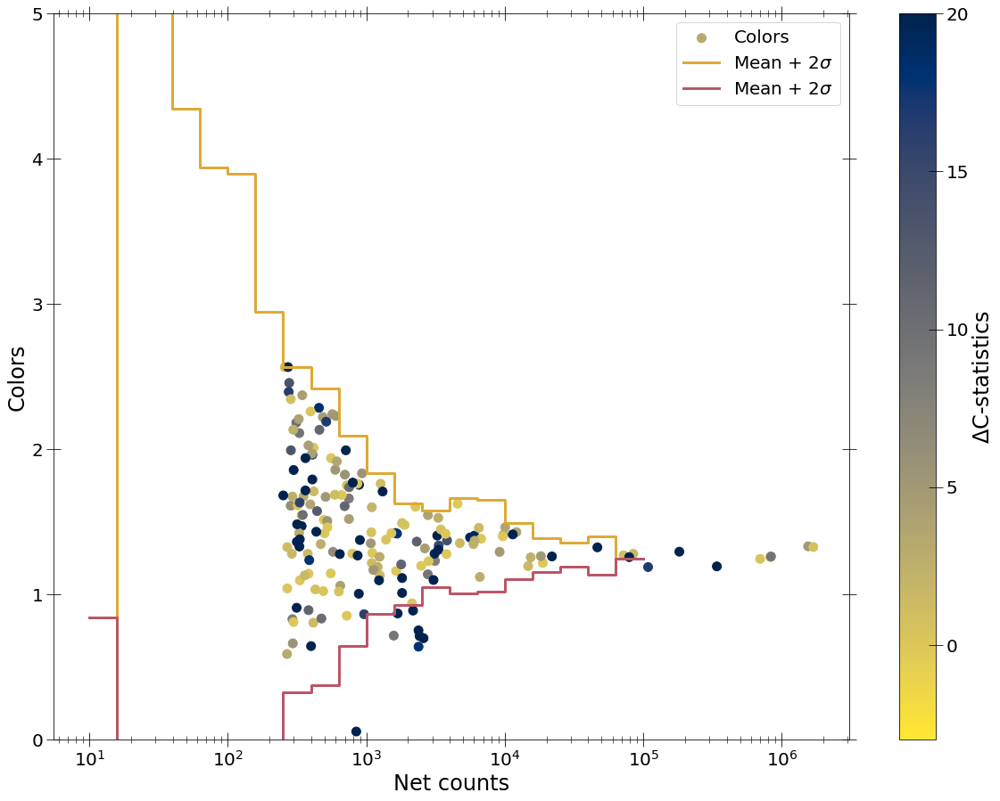

3:19: E127 continuation line over-indented for visual indent


In [127]:
mark_delta_cstat(sim_msps_color_dict_arr[0],
                 interested_msp_netcounts_pn, interested_msp_colors_pn,
                  color_param=(
                      np.array(pn_fit_stats_table_pl)[:, 1].astype(float) -
                      np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float)))

In [63]:
np.savetxt("Candidate_PN_sources2.txt", candidate_msps_pn, fmt='%s')
np.savetxt("Candidate_MOS_sources2.txt", candidate_msps_mos, fmt='%s')
np.savetxt("Candidate_ACIS_sources2.txt", candidate_msps_acis, fmt='%s')

84 84
56 56
79 79


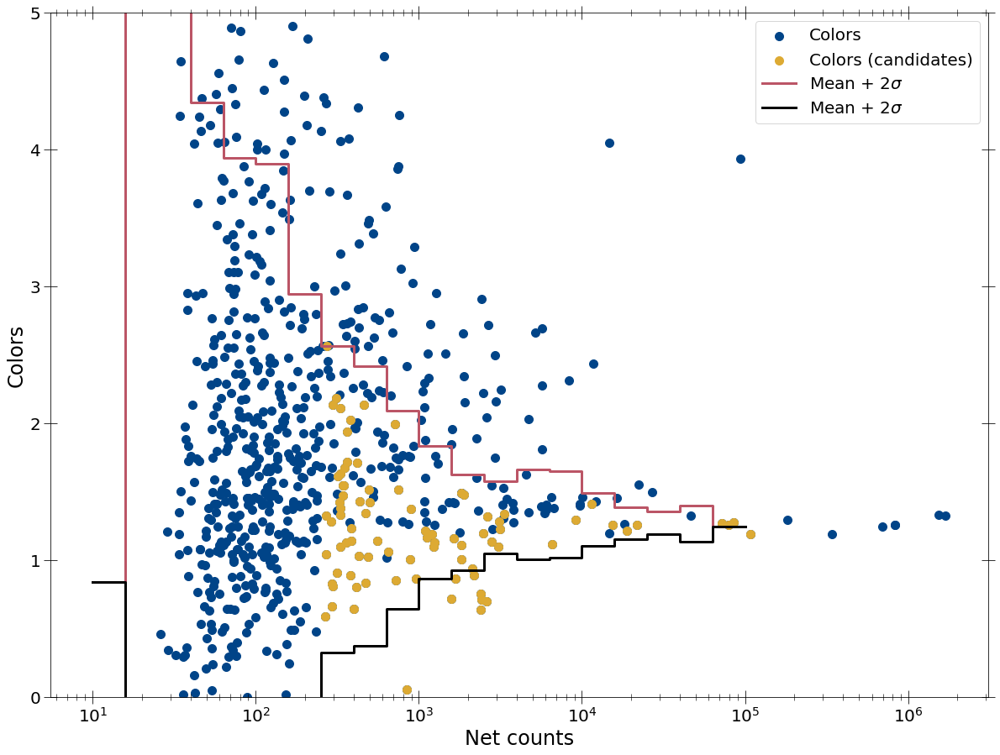

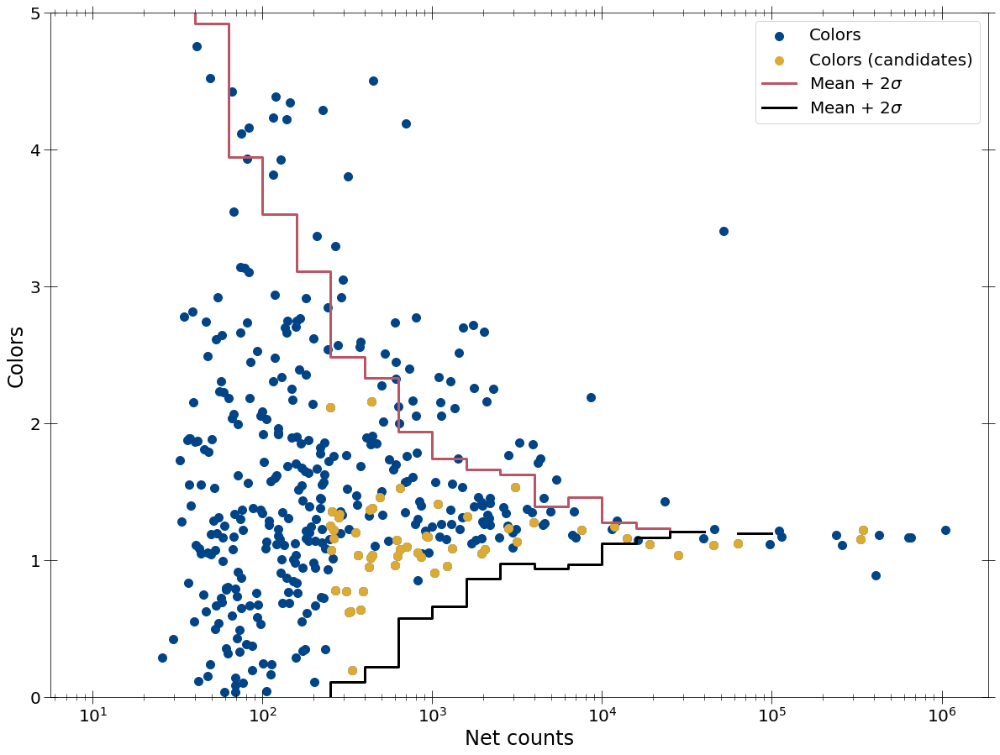

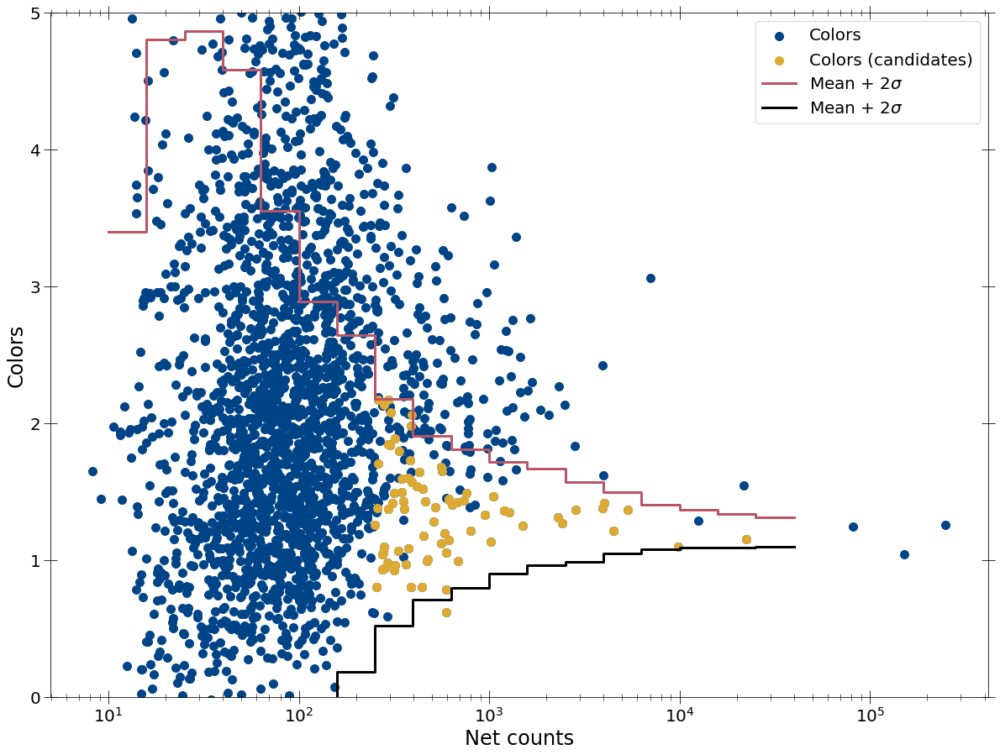

In [64]:
candidate_msp_colors_pn, candidate_msp_netcounts_pn = mark_interested_srcs(
    sim_msps_color_dict_arr[0], obs_color_dict_arr[0],
    spec_summary_msps['src_nums'][0], spec_summary_msps['spec_masks'][1][0],
    candidate_msps_pn)
candidate_msp_colors_mos, candidate_msp_netcounts_mos = mark_interested_srcs(
    sim_msps_color_dict_arr[1], obs_color_dict_arr[1],
    spec_summary_msps['src_nums'][0], spec_summary_msps['spec_masks'][1][1],
    candidate_msps_mos)
candidate_msp_colors_acis, candidate_msp_netcounts_acis = mark_interested_srcs(
    sim_msps_color_dict_arr[2], obs_color_dict_arr[2],
    spec_summary_msps['src_nums'][1], spec_summary_msps['spec_masks'][1][2],
    candidate_msps_acis)

(array([[26., 34., 10.,  7.,  1.,  0.,  1.,  0.,  0.,  0.],
        [ 0.,  1., 12., 19.,  7.,  8.,  4.,  0.,  2.,  3.],
        [ 0.,  2., 21., 15., 17., 19.,  5.,  0.,  4.,  1.]]),
 array([31.83728314, 32.33700378, 32.83672443, 33.33644508, 33.83616573,
        34.33588637, 34.83560702, 35.33532767, 35.83504831, 36.33476896,
        36.83448961]),
 <a list of 3 BarContainer objects>)

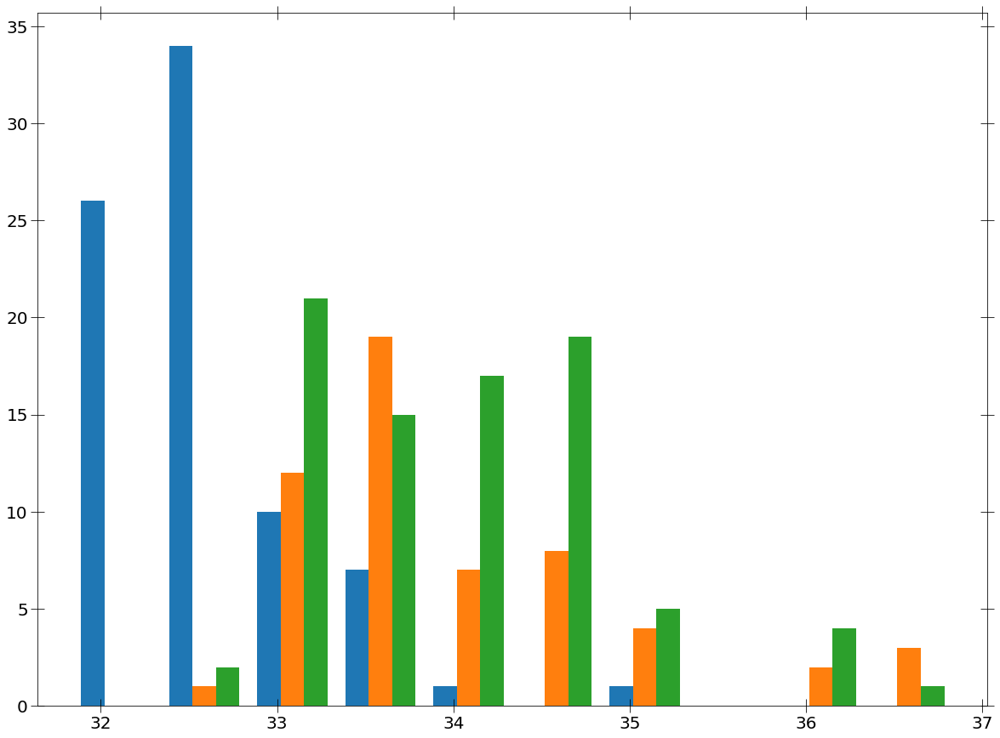

2:80: E501 line too long (97 > 79 characters)
4:5: E122 continuation line missing indentation or outdented
4:80: E501 line too long (95 > 79 characters)
6:5: E122 continuation line missing indentation or outdented


In [40]:
plt.hist([np.log10(np.array(
    acis_model_params_table_pl)[candidadate_msps_acis_args, -1].astype(float)*1.0E-12*7.659E+45),
          np.log10(np.array(
    mos_model_params_table_pl)[candidadate_msps_mos_args, -1].astype(float)*1.0E-12*7.659E+45),
          np.log10(np.array(
    pn_model_params_table_pl)[candidadate_msps_pn_args, -1].astype(float)*1.0E-12*7.659E+45)])

In [41]:
np.array(pn_model_params_table_pl)[:, -1]

array(['0.17775347039666198', '0.15741084535160457', '0.184916221634929',
       '0.15827113901941042', '0.2236002475847295', '0.08951046394205044',
       '0.14265592957726886', '0.1626556505674507', '0.151691544568419',
       '0.05853568131439508', '0.14208766163194325', '0.1483015342871929',
       '0.17915506454714364', '0.18059561287992698', '0.4972249272113047',
       '0.09935349974589852', '0.2892301045437417', '0.09958650593606125',
       '0.14983870965833504', '0.10191032244884844',
       '0.09547917849789156', '1.514468706406689', '2.386640098946292',
       '0.0695866798415962', '2.434338843992567', '2.653754452026149',
       '0.8073668171107404', '0.17373774483165227', '0.09894761001028098',
       '0.8797420859841123', '0.08134202489723485', '0.32472292336168684',
       '0.8776335127640109', '0.3198136926262305', '0.33445479886038176',
       '0.13148582008628226', '0.3577683026935588', '1.042938236836493',
       '0.42383678514598094', '0.8444880167700237', '0.71371

In [59]:
candidate_msps_xmm = np.array(
    list(set(candidate_msps_pn) | set(candidate_msps_mos)))

In [271]:
candidate_msps_xmm2 = np.array(
    list(set(candidate_msps_pn2) | set(candidate_msps_mos2)))

In [136]:
len(set(interested_msp_srcs_alldet[0]) &
         set(interested_msp_srcs_alldet[1]))

65

2:10: E127 continuation line over-indented for visual indent


In [123]:
print('Candidate XMM sources: ', len(candidate_msps_xmm))

Candidate XMM sources:  117


In [127]:
print('Candidate XMM sources: ', len(candidate_msps_acis))

Candidate XMM sources:  79


In [124]:
def arr_to_str(arr, delimiter=';', telescope='Chandra'):
    """Convert array to a string."""
    string = ''
    for elm in arr:
        if telescope == 'Chandra':
            string += '2CXO J' + elm.split('J')[1] + delimiter + ' '
        else:
            string += elm + delimiter + ' '
    return string[:-2]

In [126]:
arr_to_str(np.array(candidate_msps_xmm).astype(str), telescope='XMM')

'208624701010022; 206946401010013; 202039301010054; 207234103010061; 208441011010032; 207436309010072; 207901804010003; 201529201010011; 206946401010003; 201442201010001; 201129721010133; 201129707010057; 201129705010011; 207901804010064; 201113501010148; 205049406010006; 200305401015015; 207234104010049; 201129709010002; 201129718010002; 205110012015035; 201129704010056; 201129719010003; 205100104010002; 202026707015191; 204003401010003; 206946404010202; 201032613010001; 207242102015037; 202026707010170; 206586001010113; 201129704010031; 207901804010059; 202026707015146; 201129709010018; 208861209010009; 201529201010060; 208860108010001; 205110012010001; 206586001010073; 208441011010009; 208441011010211; 202026707010221; 208624703010003; 202026707010124; 207901804010033; 205110012010053; 202026707010181; 207901804010019; 205049406010002; 208016813010003; 204105804010001; 206586001010146; 201129705010002; 208441011010001; 206556701010043; 205110012010005; 206946416010014; 2069464100101

# IP analysis

## Selection of IPs within MSP colors

In [44]:
(interested_cv_args_alldet,
 interested_cv_srcs_alldet) = get_candidate_src_nums_alldet(
    spec_summary_msp_cvs, sim_msps2_color_dict_arr, sim_ips_color_dict_arr,
    min_count_arr=[150, 150, 150], min_counts2=250)

[1.00000000e+01 1.58489319e+01 2.51188643e+01 3.98107171e+01
 6.30957344e+01 1.00000000e+02 1.58489319e+02 2.51188643e+02
 3.98107171e+02 6.30957344e+02 1.00000000e+03 1.58489319e+03
 2.51188643e+03 3.98107171e+03 6.30957344e+03 1.00000000e+04
 1.58489319e+04 2.51188643e+04 3.98107171e+04 6.30957344e+04
 1.00000000e+05]
[0.8405164  2.03621255 1.63305682 1.56743663 1.5736705  1.66320801
 1.4331601  1.44713313 1.39609846 1.36984926 1.35086023 1.27893642
 1.31590127 1.33564778 1.334838   1.30071855 1.27144028 1.27383281
 1.26917868 1.24506393]
[0.         2.58517276 1.72972337 1.38681819 1.18129716 1.11575665
 0.75540094 0.56022382 0.51077116 0.36126324 0.24291962 0.17375792
 0.13254254 0.16428213 0.15864827 0.09633923 0.05725364 0.0421451
 0.0654287  0.        ]
250 1.4471331268500243 0.5602238243386048
5
251.18864315095823 1.4471331268500243 0.5602238243386048
386
398.1071705534973 1.396098460383752 0.5107711552472425
325
630.957344480193 1.3698492577015142 0.36126323889561407
197
1000.

In [45]:
print('Interested PN sources: ', len(interested_cv_srcs_alldet[0]))
print('Interested MOS sources: ', len(interested_cv_srcs_alldet[1]))
print('Interested ACIS sources: ', len(interested_cv_srcs_alldet[2]))

Interested PN sources:  1007
Interested MOS sources:  599
Interested ACIS sources:  1069


1007 1007
599 599
1069 1069


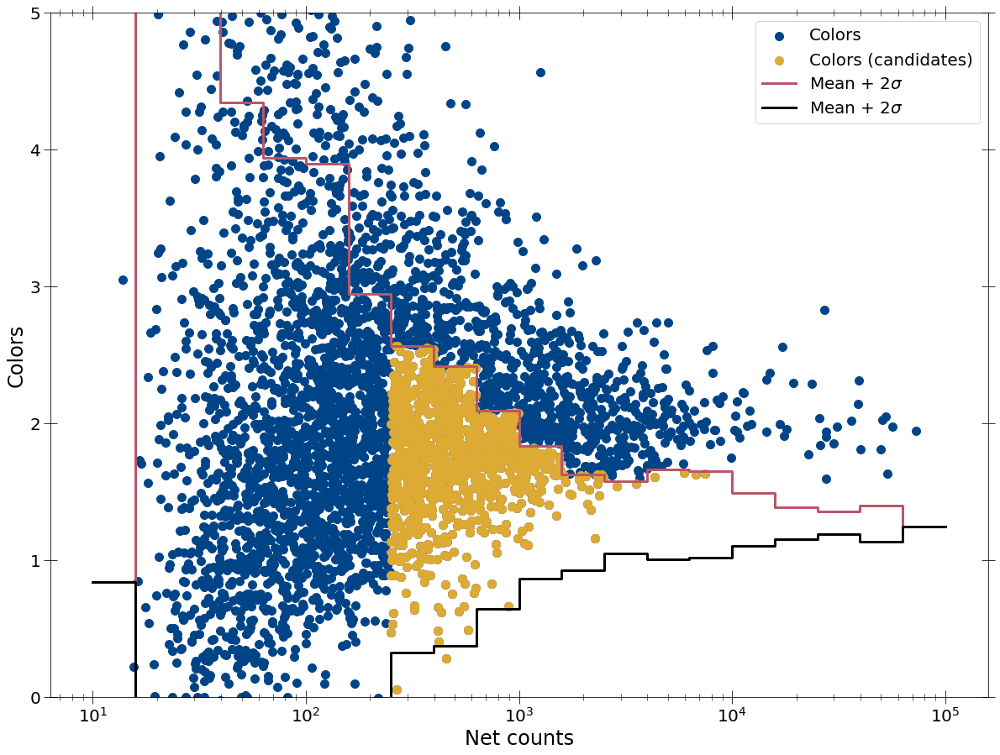

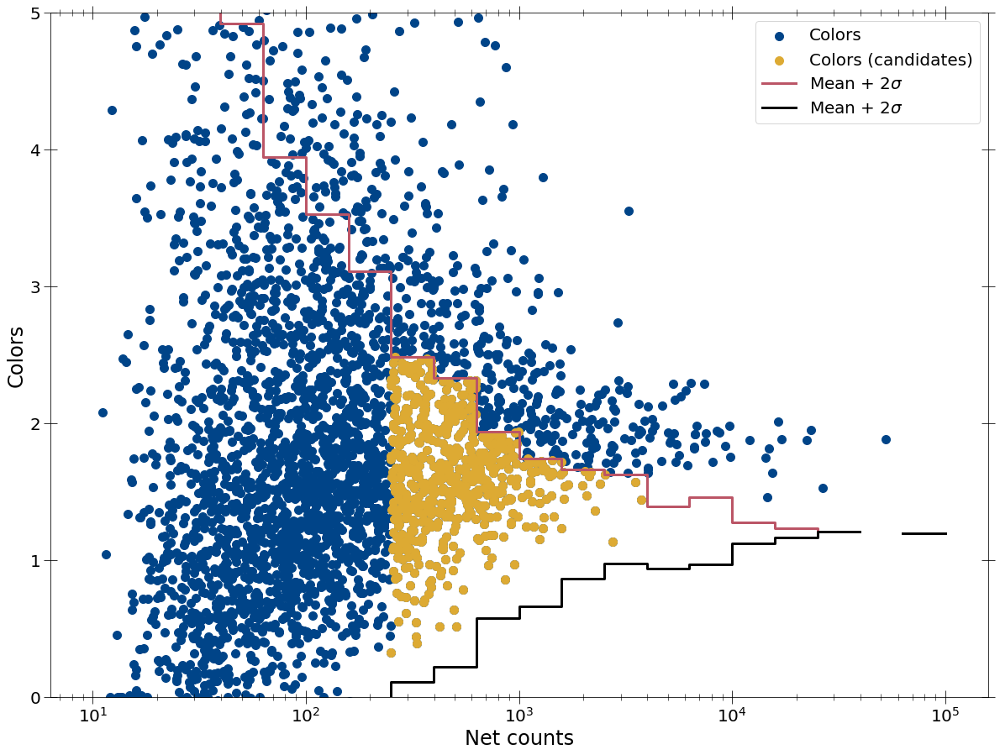

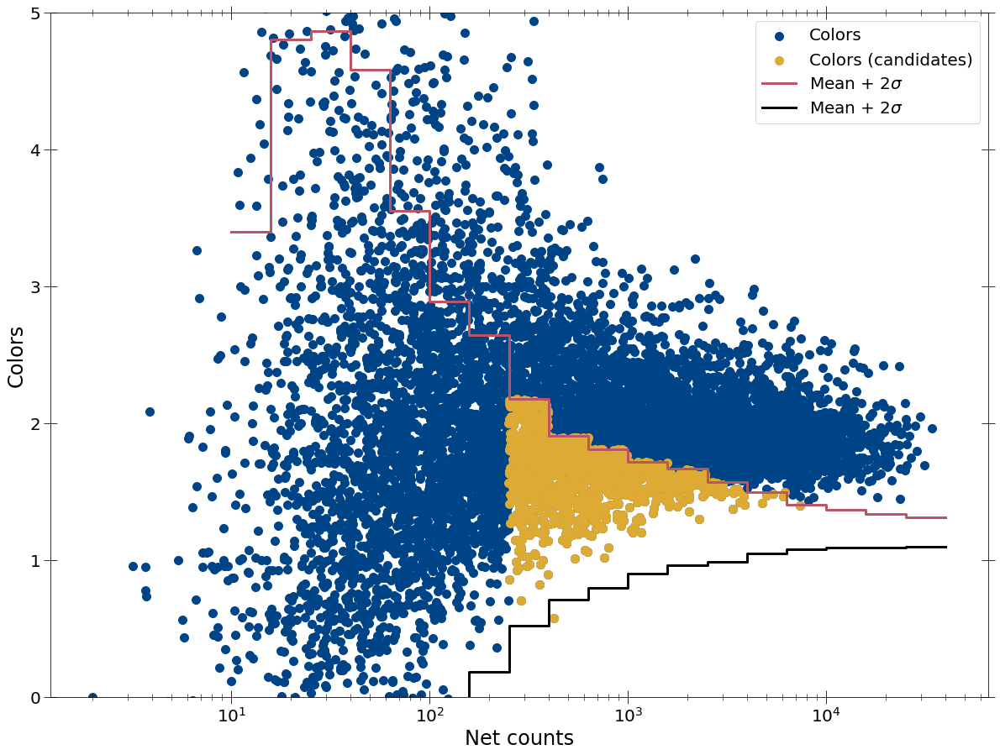

In [46]:
interested_cv_colors_pn, interested_cv_netcounts_pn = mark_interested_srcs(
    sim_msps_color_dict_arr[0], sim_ips_color_dict_arr[0],
    spec_summary_msp_cvs['src_nums'][0],
    spec_summary_msp_cvs['spec_masks'][1][0], interested_cv_srcs_alldet[0])
interested_cv_colors_mos, interested_cv_netcounts_mos = mark_interested_srcs(
    sim_msps_color_dict_arr[1], sim_ips_color_dict_arr[1],
    spec_summary_msp_cvs['src_nums'][0],
    spec_summary_msp_cvs['spec_masks'][1][1], interested_cv_srcs_alldet[1])
interested_cv_colors_acis, interested_cv_netcounts_acis = mark_interested_srcs(
    sim_msps_color_dict_arr[2], sim_ips_color_dict_arr[2],
    spec_summary_msp_cvs['src_nums'][1],
    spec_summary_msp_cvs['spec_masks'][1][2], interested_cv_srcs_alldet[2])

## Spectral analysis

In [47]:
def fit_src_pl_sim(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder + 'ip_' +
                                 str(source_num) + '_PN.fak')
        spec_mosfile = glob2.glob(src_folder + 'ip_' +
                                  str(source_num) + '_MOS.fak')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        #os.chdir(src_folder + '/' + source_num)
        spec_file = 'ip_' + str(source_num) + '.fak'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')

    model = xspec.Model('tbabs*pegpwrlw')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.perform()
    xspec.Fit.error('2.706 2')
    xspec.Fit.perform()
    print('Calculating goodness')
    #goodness = xspec.Fit.goodness(1000)
    print('Finished calculating goodness')
    goodness = 50.0
    print('Model params for ' + str(source_num) +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0])
    print('Fit stats for ' + str(source_num) + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    if telescope == 'Chandra':
        os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0]])

20:9: E265 block comment should start with '# '
38:5: E265 block comment should start with '# '
50:80: E501 line too long (80 > 79 characters)


In [48]:
def fit_src_pl_gauss_sim(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder + 'ip_' +
                                 str(source_num) + '_PN.fak')
        spec_mosfile = glob2.glob(src_folder + 'ip_' +
                                  str(source_num) + '_MOS.fak')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        #os.chdir(src_folder + '/' + source_num)
        spec_file = 'ip_' + str(source_num) + '.fak'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')
    
    model = xspec.Model('tbabs*(pegpwrlw+gauss)')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    model.pegpwrlw.eMin.values = '2.0'
    model.pegpwrlw.eMax.values = '10.0'
    model.gaussian.LineE.values = '6.7, 0.0001, 6.1, 6.1, 7.3, 7.3'
    model.gaussian.Sigma.values = '0.1 0'
    model.gaussian.norm.values = '1.0E-5, 0.001,,,,'
    
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.query = 'yes'
    xspec.Fit.perform()
    xspec.Fit.error('2.706 6')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 8')
    xspec.Fit.perform()
    #xspec.Fit.error('2.706 6')
    #xspec.Fit.error('2.706 8')
    #goodness = xspec.Fit.goodness(1000)
    goodness = 50.0
    line_pos_low = xspec.AllModels(1).gaussian.LineE.error[0]
    line_pos_high = xspec.AllModels(1).gaussian.LineE.error[1]
    line_norm_low = xspec.AllModels(1).gaussian.norm.error[0]
    line_norm_high = xspec.AllModels(1).gaussian.norm.error[1]
    print('Model params for ' + str(source_num) +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0],
          ' Fe_pos:', xspec.AllModels(1).gaussian.LineE.values[0],
          line_pos_low, line_pos_high,
          ' Fe_norm:', xspec.AllModels(1).gaussian.norm.values[0],
          line_norm_low, line_norm_high)
    print('Fit stats for ' + str(source_num) + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0],
             xspec.AllModels(1).gaussian.LineE.values[0], line_pos_low,
             line_pos_high,
             xspec.AllModels(1).gaussian.norm.values[0], line_norm_low,
             line_norm_high])


20:9: E265 block comment should start with '# '
27:1: W293 blank line contains whitespace
36:1: W293 blank line contains whitespace
46:5: E265 block comment should start with '# '
47:5: E265 block comment should start with '# '
48:5: E265 block comment should start with '# '
66:80: E501 line too long (80 > 79 characters)


In [49]:
def fit_src_pl_gauss2_sim(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder + 'ip_' +
                                 str(source_num) + '_PN.fak')
        spec_mosfile = glob2.glob(src_folder + 'ip_' +
                                  str(source_num) + '_MOS.fak')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        #os.chdir(src_folder + '/' + source_num)
        spec_file = 'ip_' + str(source_num) + '.fak'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')
    
    model = xspec.Model('tbabs*(pegpwrlw+gauss+gauss+gauss)')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    model.pegpwrlw.eMin.values = '2.0'
    model.pegpwrlw.eMax.values = '10.0'
    model.gaussian.LineE.values = '6.4 0'
    model.gaussian.Sigma.values = '0.0 0'
    model.gaussian.norm.values = '1.0E-5, 0.001,,,,'
    model.gaussian_4.LineE.values = '6.7 0'
    model.gaussian_4.Sigma.values = '0.0 0'
    model.gaussian_4.norm.values = '1.0E-5, 0.001,,,,'
    model.gaussian_5.LineE.values = '7.0 0'
    model.gaussian_5.Sigma.values = '0.0 0'
    model.gaussian_5.norm.values = '1.0E-5, 0.001,,,,'
    
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.query = 'yes'
    xspec.Fit.perform()
    xspec.Fit.error('2.706 8')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 11')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 14')
    # xspec.Fit.error('2.706 8')
    #goodness = xspec.Fit.goodness(1000)
    goodness = 50.0
    line_norm1_low = xspec.AllModels(1).gaussian.norm.error[0]
    line_norm1_high = xspec.AllModels(1).gaussian.norm.error[1]
    line_norm2_low = xspec.AllModels(1).gaussian_4.norm.error[0]
    line_norm2_high = xspec.AllModels(1).gaussian_4.norm.error[1]
    line_norm3_low = xspec.AllModels(1).gaussian_5.norm.error[0]
    line_norm3_high = xspec.AllModels(1).gaussian_5.norm.error[1]
    print('Model params for ' + str(source_num) +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0],
          ' Fe_norms:', xspec.AllModels(1).gaussian.norm.values[0],
          line_norm1_low, line_norm1_high,
          xspec.AllModels(1).gaussian_4.norm.values[0], line_norm2_low,
          line_norm2_high, xspec.AllModels(1).gaussian_5.norm.values[0],
          line_norm3_low, line_norm3_high)
    print('Fit stats for ' + str(source_num) + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0],
             xspec.AllModels(1).gaussian.norm.values[0],
             xspec.AllModels(1).gaussian_4.norm.values[0],
             xspec.AllModels(1).gaussian_5.norm.values[0], line_norm1_low,
             line_norm1_high, line_norm2_low, line_norm2_high, line_norm3_low,
             line_norm3_high])


20:9: E265 block comment should start with '# '
27:1: W293 blank line contains whitespace
42:1: W293 blank line contains whitespace
54:5: E265 block comment should start with '# '
75:80: E501 line too long (80 > 79 characters)


In [50]:
os.chdir('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_xu2016_twice_ew/')
xspec.AllData.clear()
fit_src_pl_sim(interested_cv_srcs_alldet[0][1], src_folder='./')

Calculating goodness
Finished calculating goodness
Model params for 2314: NH =  16.218350742551607  Gamma:  1.4792808377612598  norm:  0.16866262943222152
Fit stats for 2314:  444.68566791248804 -7.262602283733768 50.0 422




([2314, 444.68566791248804, -7.262602283733768, 50.0, 422],
 [2314, 16.218350742551607, 1.4792808377612598, 0.16866262943222152])

1:80: E501 line too long (99 > 79 characters)


In [51]:
pn_fit_stats_table_pl_cv = []
pn_model_params_table_pl_cv = []

for i, source_num in enumerate(interested_cv_srcs_alldet[0]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_sim(source_num)
    pn_fit_stats_table_pl_cv.append(fit_stats)
    pn_model_params_table_pl_cv.append(model_params)

0 1053
Calculating goodness
Finished calculating goodness
Model params for 1053: NH =  8.426546254042645  Gamma:  0.696878257660201  norm:  0.2640615137489303
Fit stats for 1053:  696.6533400656168 -6.6991863447334214 50.0 677


1 2314
Calculating goodness
Finished calculating goodness
Model params for 2314: NH =  16.218350742551607  Gamma:  1.4792808377612598  norm:  0.16866262943222152
Fit stats for 2314:  444.68566791248804 -7.262602283733768 50.0 422


2 4975
Calculating goodness
Finished calculating goodness
Model params for 4975: NH =  34.80810676735122  Gamma:  1.6547868183831644  norm:  0.7970294500612315
Fit stats for 4975:  500.56838353896495 -8.296106645940524 50.0 521


3 7000
Calculating goodness
Finished calculating goodness
Model params for 7000: NH =  8.797211481452258  Gamma:  0.7033262442551201  norm:  0.5995788353080425
Fit stats for 7000:  708.1936702003406 -8.805952877998777 50.0 562


4 7651
Calculating goodness
Finished calculating goodness
Model params for 7651:

Calculating goodness
Finished calculating goodness
Model params for 1048: NH =  63.234459296106515  Gamma:  2.4319962064451  norm:  1.670677227474241
Fit stats for 1048:  297.13202130714353 -7.721066393583697 50.0 260


37 1052
Calculating goodness
Finished calculating goodness
Model params for 1052: NH =  13.419429574722395  Gamma:  0.526985985643462  norm:  0.053655150048805486
Fit stats for 1052:  1967.3660155096763 -6.093275983695817 50.0 1929


38 1060
Calculating goodness
Finished calculating goodness
Model params for 1060: NH =  14.60705302620761  Gamma:  1.6242850324074298  norm:  0.143729353508781
Fit stats for 1060:  453.0430827884086 -7.176507815076671 50.0 430


39 1061
Calculating goodness
Finished calculating goodness
Model params for 1061: NH =  112.02886859079645  Gamma:  2.690908025786786  norm:  4.118738971902681
Fit stats for 1061:  386.84683764365667 -7.37712344375649 50.0 349


40 1140
Calculating goodness
Finished calculating goodness
Model params for 1140: NH =  

Calculating goodness
Finished calculating goodness
Model params for 1768: NH =  7.235001552692238  Gamma:  1.2810731694431843  norm:  0.04965768998512834
Fit stats for 1768:  889.0002247404252 -5.70283819511564 50.0 868


73 1787
Calculating goodness
Finished calculating goodness
Model params for 1787: NH =  66.41604263862243  Gamma:  1.738233638619359  norm:  0.4542079063105526
Fit stats for 1787:  927.8180560558279 -6.674091521385323 50.0 899


74 1788
Calculating goodness
Finished calculating goodness
Model params for 1788: NH =  113.23690512713483  Gamma:  2.6885436180878424  norm:  2.66461535671636
Fit stats for 1788:  346.9270320009002 -7.400533516057995 50.0 361


75 1789
Calculating goodness
Finished calculating goodness
Model params for 1789: NH =  101.8038545686193  Gamma:  3.241822788378039  norm:  1.2054049403492524
Fit stats for 1789:  588.5186373017841 -5.568243559600939 50.0 525


76 1821
Calculating goodness
Finished calculating goodness
Model params for 1821: NH =  10.

Calculating goodness
Finished calculating goodness
Model params for 2808: NH =  26.012888480887394  Gamma:  0.9611417175413239  norm:  0.4663001766979685
Fit stats for 2808:  2551.0495107436427 -8.513815270774716 50.0 2503


109 2825
Calculating goodness
Finished calculating goodness
Model params for 2825: NH =  17.601035247550126  Gamma:  1.4880542834283745  norm:  0.5490340812349971
Fit stats for 2825:  312.53685690022655 -7.677427352397851 50.0 278


110 2870
Calculating goodness
Finished calculating goodness
Model params for 2870: NH =  11.78723653456791  Gamma:  1.7336490317110462  norm:  0.24729807791851266
Fit stats for 2870:  903.2265696338656 -8.068036292159693 50.0 980


111 2878
Calculating goodness
Finished calculating goodness
Model params for 2878: NH =  7.873524815495642  Gamma:  0.9057126092951877  norm:  0.19865390651313158
Fit stats for 2878:  555.2911470441036 -7.169619966533473 50.0 444


112 2938
Calculating goodness
Finished calculating goodness
Model params for 2

Calculating goodness
Finished calculating goodness
Model params for 3871: NH =  48.879535403151664  Gamma:  1.691587797186619  norm:  1.0464941111035517
Fit stats for 3871:  699.2046454027793 -7.014801899318316 50.0 771


145 3887
Calculating goodness
Finished calculating goodness
Model params for 3887: NH =  9.016820050919439  Gamma:  0.8036454060172652  norm:  0.7615746528119489
Fit stats for 3887:  282.14528914689834 -9.00555085145577 50.0 238


146 3912
Calculating goodness
Finished calculating goodness
Model params for 3912: NH =  171.81691398696952  Gamma:  4.644058631787016  norm:  10.05614492782404
Fit stats for 3912:  2330.988225854069 -5.189953441601986 50.0 2526


147 3947
Calculating goodness
Finished calculating goodness
Model params for 3947: NH =  19.925081515996155  Gamma:  1.088045424990063  norm:  0.6744749700146958
Fit stats for 3947:  1570.485271668173 -8.944524562637834 50.0 1474


148 3963
Calculating goodness
Finished calculating goodness
Model params for 3963: N

Calculating goodness
Finished calculating goodness
Model params for 4842: NH =  9.01748661022264  Gamma:  1.3531778021330212  norm:  1.1308677690822602
Fit stats for 4842:  1433.5415196736715 -8.119582449128172 50.0 1345


181 4860
Calculating goodness
Finished calculating goodness
Model params for 4860: NH =  54.850312737395576  Gamma:  1.9668751630163346  norm:  0.3763613893439727
Fit stats for 4860:  1181.3888187694154 -5.676011920939934 50.0 1030


182 4888
Calculating goodness
Finished calculating goodness
Model params for 4888: NH =  5.075846903378484  Gamma:  0.8072665957759753  norm:  0.6468479456415275
Fit stats for 4888:  445.76338987451385 -7.581891533848545 50.0 407


183 4890
Calculating goodness
Finished calculating goodness
Model params for 4890: NH =  9.94177416091691  Gamma:  1.1884787371629852  norm:  0.11548194585211721
Fit stats for 4890:  1671.0935710826975 -8.821794456346597 50.0 1514


184 4991
Calculating goodness
Finished calculating goodness
Model params for 4

Calculating goodness
Finished calculating goodness
Model params for 5844: NH =  35.05125281401117  Gamma:  0.6572997524340946  norm:  0.16980531543799676
Fit stats for 5844:  645.0099445870201 -6.60765970982643 50.0 614


217 5847
Calculating goodness
Finished calculating goodness
Model params for 5847: NH =  37.03543341895497  Gamma:  1.328153659106616  norm:  0.49685836339578776
Fit stats for 5847:  1118.8481540714251 -6.957385789312953 50.0 1844


218 5866
Calculating goodness
Finished calculating goodness
Model params for 5866: NH =  23.88072949749297  Gamma:  0.8277622387437077  norm:  0.4776426169152872
Fit stats for 5866:  1787.1757740201485 -7.499804274082603 50.0 1743


219 5883
Calculating goodness
Finished calculating goodness
Model params for 5883: NH =  19.734732014926678  Gamma:  0.9686474865775546  norm:  0.847656391474808
Fit stats for 5883:  1037.1361630262206 -8.383340842089554 50.0 1070


220 5900
Calculating goodness
Finished calculating goodness
Model params for 59

Calculating goodness
Finished calculating goodness
Model params for 6621: NH =  76.22413036562914  Gamma:  2.158277532640498  norm:  2.5035432505189927
Fit stats for 6621:  406.86551395407173 -8.864220676338375 50.0 405


253 6626
Calculating goodness
Finished calculating goodness
Model params for 6626: NH =  13.74481640346739  Gamma:  1.243642673954048  norm:  0.5753121790282478
Fit stats for 6626:  201.00109335286868 -7.427140808099561 50.0 197


254 6647
Calculating goodness
Finished calculating goodness
Model params for 6647: NH =  39.196664781937955  Gamma:  1.7697124297391595  norm:  1.2405758136783642
Fit stats for 6647:  571.3298832663327 -8.690901028345753 50.0 568


255 6696
Calculating goodness
Finished calculating goodness
Model params for 6696: NH =  108.41747695889465  Gamma:  3.022688072534364  norm:  4.828370522954527
Fit stats for 6696:  309.9940348201065 -6.886230322231424 50.0 309


256 6718
Calculating goodness
Finished calculating goodness
Model params for 6718: NH

Calculating goodness
Finished calculating goodness
Model params for 7321: NH =  5.7264184702083485  Gamma:  0.6551512572880527  norm:  0.09225242168742315
Fit stats for 7321:  1099.195768695314 -8.142014553386863 50.0 982


289 7323
Calculating goodness
Finished calculating goodness
Model params for 7323: NH =  31.43585940673319  Gamma:  1.7276221615347607  norm:  0.2233764054091767
Fit stats for 7323:  844.2273435058546 -7.641881937521163 50.0 822


290 7344
Calculating goodness
Finished calculating goodness
Model params for 7344: NH =  8.388466564927954  Gamma:  1.3838528851284722  norm:  0.41139095542949383
Fit stats for 7344:  1015.9979269135016 -8.424951682981071 50.0 1306


291 7347
Calculating goodness
Finished calculating goodness
Model params for 7347: NH =  28.113174256583882  Gamma:  2.031171023461107  norm:  0.5468113002766901
Fit stats for 7347:  369.1382276726779 -8.77041226793518 50.0 362


292 7387
Calculating goodness
Finished calculating goodness
Model params for 7387

Calculating goodness
Finished calculating goodness
Model params for 8346: NH =  11.86672823229719  Gamma:  1.4988412440542485  norm:  0.5777124626296194
Fit stats for 8346:  476.24964939920716 -8.96560189019566 50.0 430


325 8374
Calculating goodness
Finished calculating goodness
Model params for 8374: NH =  55.2415987761617  Gamma:  0.9840941837180642  norm:  0.34216842373324186
Fit stats for 8374:  627.7250999039051 -6.2486025779660554 50.0 663


326 8411
Calculating goodness
Finished calculating goodness
Model params for 8411: NH =  33.586963428532414  Gamma:  1.344509005898159  norm:  0.7566936098426484
Fit stats for 8411:  632.495226642745 -6.191582207499772 50.0 801


327 8428
Calculating goodness
Finished calculating goodness
Model params for 8428: NH =  5.871499389302978  Gamma:  0.8666714066659396  norm:  0.34096403276966136
Fit stats for 8428:  135.36779101366886 -7.531517682957254 50.0 133


328 8435
Calculating goodness
Finished calculating goodness
Model params for 8435: 

Calculating goodness
Finished calculating goodness
Model params for 9103: NH =  114.00593115831411  Gamma:  2.2410086194735355  norm:  1.4012294931368616
Fit stats for 9103:  882.3926265972789 -6.728120207477378 50.0 778


361 9119
Calculating goodness
Finished calculating goodness
Model params for 9119: NH =  85.06493260026939  Gamma:  2.6852594435958457  norm:  0.8081240940384877
Fit stats for 9119:  1457.7619040915672 -6.57309160028586 50.0 1384


362 9190
Calculating goodness
Finished calculating goodness
Model params for 9190: NH =  69.66877535665759  Gamma:  1.6584145391580094  norm:  0.9962406810905534
Fit stats for 9190:  219.3575469729127 -7.5439178599794285 50.0 191


363 9194
Calculating goodness
Finished calculating goodness
Model params for 9194: NH =  11.619155990661769  Gamma:  1.0841601349066532  norm:  0.08212719002881948
Fit stats for 9194:  839.5579991554217 -7.621014768712469 50.0 757


364 9206
Calculating goodness
Finished calculating goodness
Model params for 920

Calculating goodness
Finished calculating goodness
Model params for 177: NH =  24.113199152196696  Gamma:  1.4758693376644882  norm:  1.342328885162563
Fit stats for 177:  347.53784990625934 -9.716725369007275 50.0 282


397 178
Calculating goodness
Finished calculating goodness
Model params for 178: NH =  6.709844375142932  Gamma:  1.1059358333743043  norm:  0.4412807859210018
Fit stats for 178:  1105.5864602987585 -8.948204273809203 50.0 1067


398 199
Calculating goodness
Finished calculating goodness
Model params for 199: NH =  12.722016274980971  Gamma:  1.1722891816012615  norm:  0.1477064138545295
Fit stats for 199:  1721.7466179879516 -8.5624122601786 50.0 1830


399 205
Calculating goodness
Finished calculating goodness
Model params for 205: NH =  18.976884753085475  Gamma:  1.3584710922138614  norm:  0.571590045794026
Fit stats for 205:  1531.947623096253 -8.54616075293002 50.0 1331


400 264
Calculating goodness
Finished calculating goodness
Model params for 264: NH =  8.758

Calculating goodness
Finished calculating goodness
Model params for 991: NH =  5.044846935694701  Gamma:  0.7756469600194834  norm:  0.12661607359957286
Fit stats for 991:  1028.4749575608337 -8.857726722791824 50.0 948


433 1016
Calculating goodness
Finished calculating goodness
Model params for 1016: NH =  9.728639501225185  Gamma:  1.2938361757817032  norm:  0.42535567086061826
Fit stats for 1016:  434.45078526036497 -7.85323440962915 50.0 409


434 1037
Calculating goodness
Finished calculating goodness
Model params for 1037: NH =  7.418337591097801  Gamma:  1.0969796120216635  norm:  0.09424815726326376
Fit stats for 1037:  988.9707883428159 -6.453344907154017 50.0 892


435 1038
Calculating goodness
Finished calculating goodness
Model params for 1038: NH =  13.167567966507605  Gamma:  1.2654569847491643  norm:  0.8152973163532954
Fit stats for 1038:  358.06734203712574 -8.758217426402547 50.0 344


436 1087
Calculating goodness
Finished calculating goodness
Model params for 1087

Calculating goodness
Finished calculating goodness
Model params for 2163: NH =  46.052277432069744  Gamma:  1.659547811389937  norm:  0.22603753778074395
Fit stats for 2163:  2274.0865155990577 -5.768268751231038 50.0 1990


469 2267
Calculating goodness
Finished calculating goodness
Model params for 2267: NH =  8.826459099260946  Gamma:  1.645848324328655  norm:  0.3348025507761392
Fit stats for 2267:  1722.2532042777418 -7.625839725672311 50.0 1645


470 2270
Calculating goodness
Finished calculating goodness
Model params for 2270: NH =  12.026181222714118  Gamma:  1.8049136882881673  norm:  0.9559428601211036
Fit stats for 2270:  893.7533740477584 -7.841281085035408 50.0 984


471 2278
Calculating goodness
Finished calculating goodness
Model params for 2278: NH =  77.79969072438422  Gamma:  1.8696895171965093  norm:  1.5830619186100132
Fit stats for 2278:  443.21419277207093 -7.731492421600391 50.0 411


472 2303
Calculating goodness
Finished calculating goodness
Model params for 23

Calculating goodness
Finished calculating goodness
Model params for 3427: NH =  31.366206084319682  Gamma:  1.28503365291877  norm:  0.43007648864419734
Fit stats for 3427:  833.8066467555749 -7.941933803469982 50.0 743


505 3447
Calculating goodness
Finished calculating goodness
Model params for 3447: NH =  43.21438284297912  Gamma:  1.8067885249217341  norm:  0.9377222468242731
Fit stats for 3447:  1655.6986109049865 -6.666334727071356 50.0 1520


506 3490
Calculating goodness
Finished calculating goodness
Model params for 3490: NH =  20.047740363336626  Gamma:  1.064526211907483e-06  norm:  0.11678428506708886
Fit stats for 3490:  3143.8774166048197 -7.500637710892752 50.0 2763


507 3697
Calculating goodness
Finished calculating goodness
Model params for 3697: NH =  19.200824761945384  Gamma:  0.849273679555205  norm:  0.34748713547121063
Fit stats for 3697:  1405.648169478065 -9.036108768646747 50.0 1219


508 3723
Calculating goodness
Finished calculating goodness
Model params f

Calculating goodness
Finished calculating goodness
Model params for 4608: NH =  9.16661611068849  Gamma:  0.4708519735762377  norm:  0.4538894025532449
Fit stats for 4608:  992.3884465485178 -7.228031749018572 50.0 879


541 4627
Calculating goodness
Finished calculating goodness
Model params for 4627: NH =  22.308070881146282  Gamma:  1.3570669367670625  norm:  0.07437481615219682
Fit stats for 4627:  2102.990779639622 -7.7521517643711375 50.0 1810


542 4645
Calculating goodness
Finished calculating goodness
Model params for 4645: NH =  15.847249473541222  Gamma:  1.2058775110356108  norm:  0.17775897131986604
Fit stats for 4645:  737.652781546774 -7.255593142142477 50.0 685


543 4701
Calculating goodness
Finished calculating goodness
Model params for 4701: NH =  16.612076026428888  Gamma:  0.234730315882427  norm:  0.046124927168194156
Fit stats for 4701:  2068.5854996868543 -4.9955395425652664 50.0 1960


544 4734
Calculating goodness
Finished calculating goodness
Model params for

Calculating goodness
Finished calculating goodness
Model params for 5683: NH =  33.77721711927463  Gamma:  1.3025819220521566  norm:  0.38823660709977437
Fit stats for 5683:  685.9149302884517 -7.603084085106662 50.0 647


577 5763
Calculating goodness
Finished calculating goodness
Model params for 5763: NH =  52.964750445144766  Gamma:  1.8495215440951025  norm:  0.8837138771742031
Fit stats for 5763:  556.6804033911745 -7.752707629308486 50.0 582


578 5838
Calculating goodness
Finished calculating goodness
Model params for 5838: NH =  46.05324855983152  Gamma:  2.2578625452598042  norm:  1.8737029299962216
Fit stats for 5838:  1465.8327866254065 -7.476614226089854 50.0 1338


579 5854
Calculating goodness
Finished calculating goodness
Model params for 5854: NH =  8.878461339192686  Gamma:  1.0253359644917428  norm:  0.6231109823786115
Fit stats for 5854:  195.47826136851262 -6.92982774692501 50.0 177


580 5859
Calculating goodness
Finished calculating goodness
Model params for 5859

Calculating goodness
Finished calculating goodness
Model params for 7014: NH =  27.209277765288622  Gamma:  1.3349820989621495  norm:  0.7297181100716997
Fit stats for 7014:  2310.468024334135 -8.575584340081813 50.0 1842


613 7069
Calculating goodness
Finished calculating goodness
Model params for 7069: NH =  60.220206010742295  Gamma:  2.178154756399165  norm:  0.2552202350284992
Fit stats for 7069:  2025.5555825306192 -6.450399507769838 50.0 1964


614 7215
Calculating goodness
Finished calculating goodness
Model params for 7215: NH =  71.76522681739972  Gamma:  1.6718104212435436  norm:  0.42889818319915946
Fit stats for 7215:  1206.0104940355936 -7.422633331830804 50.0 1018


615 7245
Calculating goodness
Finished calculating goodness
Model params for 7245: NH =  14.245930897539091  Gamma:  1.2255328687818592  norm:  1.133069807232951
Fit stats for 7245:  261.4303844912673 -8.038869570992645 50.0 235


616 7250
Calculating goodness
Finished calculating goodness
Model params for 7

Calculating goodness
Finished calculating goodness
Model params for 8076: NH =  11.960953380312366  Gamma:  1.1813525857658187  norm:  1.2467190852527155
Fit stats for 8076:  259.33672550763583 -9.69883996065892 50.0 265


649 8080
Calculating goodness
Finished calculating goodness
Model params for 8080: NH =  47.724867804773055  Gamma:  0.6133456815256197  norm:  0.4851778838453398
Fit stats for 8080:  423.1722280297943 -8.157324663377938 50.0 402


650 8088
Calculating goodness
Finished calculating goodness
Model params for 8088: NH =  118.79711078945643  Gamma:  3.3508376007282226  norm:  1.0661042923902744
Fit stats for 8088:  1842.3656427188391 -6.658028044444589 50.0 1654


651 8124
Calculating goodness
Finished calculating goodness
Model params for 8124: NH =  12.582849292981214  Gamma:  0.7328931313932874  norm:  0.19103252915328217
Fit stats for 8124:  626.7737239407561 -7.877004313257143 50.0 512


652 8138
Calculating goodness
Finished calculating goodness
Model params for 8

Calculating goodness
Finished calculating goodness
Model params for 9053: NH =  80.46396680754812  Gamma:  2.1016772295265755  norm:  0.8856954327200239
Fit stats for 9053:  995.1715326141667 -6.944843129453287 50.0 881


685 9070
Calculating goodness
Finished calculating goodness
Model params for 9070: NH =  106.33845084613378  Gamma:  1.3171176361742334  norm:  0.09336903632970416
Fit stats for 9070:  1945.707592318705 -6.96553768962594 50.0 1841


686 9077
Calculating goodness
Finished calculating goodness
Model params for 9077: NH =  76.2969715654434  Gamma:  2.653279087564664  norm:  3.5039769772558773
Fit stats for 9077:  800.0447398844202 -7.486873673442498 50.0 817


687 9094
Calculating goodness
Finished calculating goodness
Model params for 9094: NH =  15.051259528264664  Gamma:  0.8909279331347678  norm:  0.9880935425509436
Fit stats for 9094:  316.2644406004984 -8.925170614625745 50.0 272


688 9124
Calculating goodness
Finished calculating goodness
Model params for 9124: N

Calculating goodness
Finished calculating goodness
Model params for 169: NH =  17.020212375511118  Gamma:  0.9999638044690533  norm:  0.6040361063757455
Fit stats for 169:  478.34622503204673 -10.023941223925071 50.0 452


721 210
Calculating goodness
Finished calculating goodness
Model params for 210: NH =  7.389789535414094  Gamma:  0.9944321537890928  norm:  0.11510952280443623
Fit stats for 210:  847.5747319120017 -8.628907569854606 50.0 828


722 237
Calculating goodness
Finished calculating goodness
Model params for 237: NH =  25.62749312130709  Gamma:  1.2057740414138252  norm:  0.3600645549217286
Fit stats for 237:  529.168090756707 -8.189356468806762 50.0 489


723 344
Calculating goodness
Finished calculating goodness
Model params for 344: NH =  20.93277858382955  Gamma:  1.2479246464604488  norm:  0.3696175343304843
Fit stats for 344:  1664.4467766446287 -8.513023437863998 50.0 1514


724 373
Calculating goodness
Finished calculating goodness
Model params for 373: NH =  43.3

Calculating goodness
Finished calculating goodness
Model params for 2099: NH =  8.183104475307665  Gamma:  1.3393423792496775  norm:  0.7223954609484261
Fit stats for 2099:  1595.966601497501 -7.454483378262158 50.0 1510


757 2143
Calculating goodness
Finished calculating goodness
Model params for 2143: NH =  7.838748509707722  Gamma:  1.202849594651241  norm:  0.583481247748911
Fit stats for 2143:  1079.0705533219282 -8.36181284586401 50.0 965


758 2147
Calculating goodness
Finished calculating goodness
Model params for 2147: NH =  16.510074411319223  Gamma:  1.179034839176301  norm:  0.40120716969029646
Fit stats for 2147:  881.8374471116463 -9.276853118684249 50.0 846


759 2179
Calculating goodness
Finished calculating goodness
Model params for 2179: NH =  19.53355742498773  Gamma:  0.9628595888570214  norm:  0.22233458063397743
Fit stats for 2179:  1032.2963488142002 -8.797678489104836 50.0 1058


760 2201
Calculating goodness
Finished calculating goodness
Model params for 2201:

Calculating goodness
Finished calculating goodness
Model params for 3641: NH =  34.365765160288646  Gamma:  1.2317717911145225  norm:  1.2128257215232932
Fit stats for 3641:  431.9683276566508 -7.546859795964615 50.0 380


793 3676
Calculating goodness
Finished calculating goodness
Model params for 3676: NH =  24.748959930704345  Gamma:  1.0785500714375755  norm:  0.4628266621699938
Fit stats for 3676:  761.1096048348746 -7.990355355923356 50.0 684


794 3716
Calculating goodness
Finished calculating goodness
Model params for 3716: NH =  51.680435355524125  Gamma:  1.872092565890634  norm:  0.9856091278280047
Fit stats for 3716:  530.0466160151309 -7.644343489209242 50.0 477


795 3729
Calculating goodness
Finished calculating goodness
Model params for 3729: NH =  9.024651590638339  Gamma:  0.6690003420524796  norm:  0.0708911745526196
Fit stats for 3729:  1514.8084435984833 -7.894458760542439 50.0 1392


796 3746
Calculating goodness
Finished calculating goodness
Model params for 3746

Calculating goodness
Finished calculating goodness
Model params for 5441: NH =  8.410350142909364  Gamma:  0.8978690655848529  norm:  0.9320876693921574
Fit stats for 5441:  247.61170413585347 -8.310499077911826 50.0 189


829 5472
Calculating goodness
Finished calculating goodness
Model params for 5472: NH =  40.53329822194189  Gamma:  1.622762467915697  norm:  1.5737834703430507
Fit stats for 5472:  343.8162353569038 -9.352739449946412 50.0 358


830 5562
Calculating goodness
Finished calculating goodness
Model params for 5562: NH =  16.83239859275387  Gamma:  0.4845728043197107  norm:  0.20589441244330636
Fit stats for 5562:  928.6303617266838 -8.634621669211638 50.0 849


831 5569
Calculating goodness
Finished calculating goodness
Model params for 5569: NH =  34.50171987256929  Gamma:  1.3198502520186481  norm:  0.5862749034418153
Fit stats for 5569:  475.6637625509221 -8.478194667675293 50.0 422


832 5649
Calculating goodness
Finished calculating goodness
Model params for 5649: N

Calculating goodness
Finished calculating goodness
Model params for 7545: NH =  8.578860728975592  Gamma:  0.8002261303649327  norm:  0.366086771470004
Fit stats for 7545:  622.8198515620388 -8.942896660938366 50.0 546


865 7554
Calculating goodness
Finished calculating goodness
Model params for 7554: NH =  25.43078956453183  Gamma:  1.3303104437045614  norm:  0.3711830091497735
Fit stats for 7554:  1664.6002818271168 -7.58067871731326 50.0 1819


866 7564
Calculating goodness
Finished calculating goodness
Model params for 7564: NH =  54.009212183411094  Gamma:  2.2331387684592108  norm:  0.6392985377533581
Fit stats for 7564:  914.2806851884823 -9.855903414554726 50.0 845


867 7577
Calculating goodness
Finished calculating goodness
Model params for 7577: NH =  10.612868685660658  Gamma:  0.8758428290422074  norm:  0.6753495090725775
Fit stats for 7577:  1966.5325798139777 -9.758208720189499 50.0 1852


868 7599
Calculating goodness
Finished calculating goodness
Model params for 7599

Calculating goodness
Finished calculating goodness
Model params for 9510: NH =  21.875301332614406  Gamma:  1.8017445290974528  norm:  1.1343425230511122
Fit stats for 9510:  839.5995233795738 -10.18677090796608 50.0 764


901 9524
Calculating goodness
Finished calculating goodness
Model params for 9524: NH =  8.743242855157709  Gamma:  1.22509092679254  norm:  0.26611273585470413
Fit stats for 9524:  997.8064029203865 -8.461234780069603 50.0 974


902 9630
Calculating goodness
Finished calculating goodness
Model params for 9630: NH =  13.733828064913808  Gamma:  1.894912430804477  norm:  0.1629206749889215
Fit stats for 9630:  942.4242288233344 -8.657337709695879 50.0 843


903 9701
Calculating goodness
Finished calculating goodness
Model params for 9701: NH =  21.77360314505607  Gamma:  1.3078417390796004  norm:  0.4524195400691838
Fit stats for 9701:  525.503508590921 -8.641696453520332 50.0 536


904 9702
Calculating goodness
Finished calculating goodness
Model params for 9702: NH 

Calculating goodness
Finished calculating goodness
Model params for 3896: NH =  13.688235667690108  Gamma:  1.4654445205738709  norm:  0.7570657506690275
Fit stats for 3896:  596.3163371529793 -9.917499339463893 50.0 536


937 4057
Calculating goodness
Finished calculating goodness
Model params for 4057: NH =  6.214213837600553  Gamma:  0.6600232336535625  norm:  0.7635000790566331
Fit stats for 4057:  608.9181935450684 -9.845562939606623 50.0 547


938 4454
Calculating goodness
Finished calculating goodness
Model params for 4454: NH =  14.861536788923344  Gamma:  1.580360104827384  norm:  0.516443124048786
Fit stats for 4454:  1162.1893528544492 -8.331139844850162 50.0 1175


939 4490
Calculating goodness
Finished calculating goodness
Model params for 4490: NH =  30.385141552713247  Gamma:  2.3322951315159006  norm:  0.06141469959635769
Fit stats for 4490:  1733.4689668921426 -7.43161644418488 50.0 1737


940 4517
Calculating goodness
Finished calculating goodness
Model params for 451

Calculating goodness
Finished calculating goodness
Model params for 8069: NH =  11.429437542176478  Gamma:  1.1629956391023741  norm:  0.8167008021972689
Fit stats for 8069:  600.6523062645222 -8.326524281368526 50.0 609


973 8170
Calculating goodness
Finished calculating goodness
Model params for 8170: NH =  23.490287815821937  Gamma:  1.358611305363415  norm:  0.815178826578253
Fit stats for 8170:  504.9574126158334 -9.291374037862717 50.0 470


974 8702
Calculating goodness
Finished calculating goodness
Model params for 8702: NH =  17.992800597764013  Gamma:  1.297961665454451  norm:  0.984349157263144
Fit stats for 8702:  745.7397520957801 -9.10935064633396 50.0 653


975 8930
Calculating goodness
Finished calculating goodness
Model params for 8930: NH =  22.126788155403695  Gamma:  1.1065265715452577  norm:  1.3744399549361814
Fit stats for 8930:  514.9306586434463 -7.811653242490499 50.0 456


976 9032
Calculating goodness
Finished calculating goodness
Model params for 9032: NH 

In [52]:
pn_fit_stats_table_pl_g_cv = []
pn_model_params_table_pl_g_cv = []
pn_fit_stats_table_pl_g2_cv = []
pn_model_params_table_pl_g2_cv = []

for i, source_num in enumerate(interested_cv_srcs_alldet[0]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_gauss_sim(source_num)
    fit_stats2, model_params2 = fit_src_pl_gauss2_sim(source_num)
    pn_fit_stats_table_pl_g_cv.append(fit_stats)
    pn_model_params_table_pl_g_cv.append(model_params)
    pn_fit_stats_table_pl_g2_cv.append(fit_stats2)
    pn_model_params_table_pl_g2_cv.append(model_params2)

0 1053
Model params for 1053: NH =  9.811168428861913  Gamma:  1.0501000456626801  norm:  0.24950874919886892  Fe_pos: 6.7784708557357405 6.630253008619856 6.988629005769366  Fe_norm: 1.3473730644574096e-06 1.791283875500442e-07 2.7299883888784294e-06
Fit stats for 1053:  692.9709810958097 -6.76328874458939 50.0 675


Model params for 1053: NH =  10.402172954907005  Gamma:  1.2118795638373556  norm:  0.24370757390218326  Fe_norms: 5.733873393392406e-07 0.0 1.4988846308617257e-06 9.134434109143545e-07 7.264660061829838e-08 1.956320926422974e-06 4.198417450727566e-07 0.0 1.474227917524855e-06
Fit stats for 1053:  691.2689788332068 -6.824621174336479 50.0 674


1 2314
Model params for 2314: NH =  16.21637720664635  Gamma:  1.4790032335432328  norm:  0.16865356250630376  Fe_pos: 7.292731161149722 0.0 0.0  Fe_norm: 1.3350515659601537e-23 0.8224962005991274 0.0
Fit stats for 2314:  444.6856308849407 -7.262810733924271 50.0 420


Model params for 2314: NH =  17.43633406429455  Gamma:  1.75566

Model params for 396: NH =  21.63501455669121  Gamma:  2.124579569884203  norm:  0.12579436681144965  Fe_norms: 8.971155758441141e-08 0.0 4.116390000210528e-07 2.854869539352992e-07 0.0 6.667011004904768e-07 1.2390857610154351e-08 0.0 3.48936859040082e-07
Fit stats for 396:  631.9589583137599 -7.447943382094722 50.0 586


13 429
Model params for 429: NH =  14.68017332016604  Gamma:  1.693930050525763  norm:  0.16438689867909698  Fe_pos: 7.001914586383031 6.850275898418991 7.1494824932226075  Fe_norm: 6.600025044788027e-07 1.684237078709939e-07 1.2655876691888636e-06
Fit stats for 429:  262.96037455881935 -7.1817309199440675 50.0 274


Model params for 429: NH =  15.106598220523646  Gamma:  1.8561648303362832  norm:  0.1619317732132823  Fe_norms: 3.4114011997195056e-07 3.280153596094981e-08 7.415877791146661e-07 1.2325168735637567e-07 0.0 5.134910101078314e-07 5.536841865316647e-07 1.346023861489341e-07 1.0855447687501182e-06
Fit stats for 429:  260.41904938793084 -7.22221310724706 50.0

Model params for 756: NH =  6.7481506247768035  Gamma:  1.0402337336521539  norm:  0.6558589788195022  Fe_pos: 6.1000000094820015 0.0 6.280916576682666  Fe_norm: 1.9289018305415195e-06 3.0107927839211354e-07 3.937645579226191e-06
Fit stats for 756:  305.53936981582365 -6.636302089481134 50.0 316


Model params for 756: NH =  6.494246239015974  Gamma:  0.9315954148495573  norm:  0.6798946165358337  Fe_norms: 5.987750472891994e-07 0.0 2.244094871320947e-06 2.7537857603787147e-14 0.0 1.2994681511540937e-06 7.63776251490697e-08 0.0 1.6980299795263781e-06
Fit stats for 756:  308.94534457306656 -6.600099157841449 50.0 315


26 795
Model params for 795: NH =  92.32328930597731  Gamma:  2.4351923949968484  norm:  1.6310172495664335  Fe_pos: 6.435038578875654 6.336182955453673 6.5360930422994965  Fe_norm: 3.3605594106068762e-06 1.5821167010031209e-06 5.633390414820649e-06
Fit stats for 795:  459.6196051330927 -7.333436610349927 50.0 429


Model params for 795: NH =  89.24913214722207  Gamma:  2

Model params for 1060: NH =  15.512771133972446  Gamma:  1.972317155470848  norm:  0.1395503464001897  Fe_pos: 6.392941937708147 6.288701833522618 6.504153455708548  Fe_norm: 6.986628450336603e-07 2.8740686616315217e-07 1.1884060634010345e-06
Fit stats for 1060:  444.2566309762022 -7.467711617829055 50.0 428


Model params for 1060: NH =  15.869321656924708  Gamma:  2.0164812401268355  norm:  0.14193842510540047  Fe_norms: 5.741513618365283e-07 2.3067176455518868e-07 9.942632664772238e-07 7.946013745050272e-08 0.0 4.169434865663186e-07 7.93494340906223e-08 0.0 4.5143207709122225e-07
Fit stats for 1060:  444.21841230009125 -7.40250770913667 50.0 427


39 1061
Model params for 1061: NH =  99.90593855203186  Gamma:  2.5672736864001133  norm:  2.9907304232728418  Fe_pos: 6.827448292139319 6.680479251216275 7.007280312760121  Fe_norm: 4.267217991912821e-06 1.5325136006355584e-06 7.48856395390344e-06
Fit stats for 1061:  380.3320415662898 -7.615684911349857 50.0 347


Model params for 1061: 

Model params for 1345: NH =  22.651158149518164  Gamma:  2.4026235573011725  norm:  0.6016772362089765  Fe_norms: 1.7914687769498097e-06 7.497541315023991e-07 3.10557362000438e-06 2.126343709747193e-06 1.0405984240978016e-06 3.4999528077135337e-06 3.984508158989525e-07 0.0 1.4821582776211546e-06
Fit stats for 1345:  268.17753333409274 -8.584615029721418 50.0 312


51 1350
Model params for 1350: NH =  4.83728080695211  Gamma:  0.6908192925001432  norm:  0.26634275764880927  Fe_pos: 6.850741937006647 6.701591472984033 6.996529088932961  Fe_norm: 1.0624677784975425e-06 2.5751505243503436e-07 2.0135085038700565e-06
Fit stats for 1350:  599.7423149502943 -8.114630877219982 50.0 587


Model params for 1350: NH =  4.923907688686054  Gamma:  0.7271645853960774  norm:  0.2628141811100583  Fe_norms: 2.7914093350945495e-07 0.0 9.095177605709669e-07 4.5735916888826144e-07 0.0 1.159452312305816e-06 5.177843362177294e-07 0.0 1.3128655820277423e-06
Fit stats for 1350:  600.9649690230999 -8.1474522377

Model params for 1570: NH =  27.639649299884837  Gamma:  1.9118291255730355  norm:  0.6131452248881077  Fe_pos: 6.720627882540587 6.5789320098133635 6.858217713284637  Fe_norm: 1.9347647381498595e-06 6.379205881636425e-07 3.5431724833711928e-06
Fit stats for 1570:  434.46965854974286 -7.881055030789363 50.0 476


Model params for 1570: NH =  27.671469196960413  Gamma:  1.9850594719734151  norm:  0.6083172292820535  Fe_norms: 4.960839143480737e-07 0.0 1.5340798116759458e-06 1.5190424185532401e-06 5.006266923154192e-07 2.8266972493894124e-06 4.996096013009363e-07 0.0 1.6169699342989179e-06
Fit stats for 1570:  433.30222772886543 -7.856324345614409 50.0 475


64 1574
Model params for 1574: NH =  7.221805510224303  Gamma:  0.3670268455128893  norm:  0.14419766618816812  Fe_pos: 6.778959816346506 6.6360306159501095 6.921035554679238  Fe_norm: 6.464266125812128e-07 1.7367039136571027e-07 1.1911486360513441e-06
Fit stats for 1574:  675.5740297234787 -8.100217156470137 50.0 645


Model params 

Model params for 1789: NH =  52.07819715318994  Gamma:  2.1223008200632982  norm:  0.2586059446644952  Fe_norms: 3.394552691975963e-07 0.0 9.36885014536294e-07 1.2929034089321767e-06 7.267026719536467e-07 2.2984319742464803e-06 1.386363366378332e-07 0.0 6.551196167766389e-07
Fit stats for 1789:  571.4662874441146 -6.541675297076462 50.0 522


76 1821
Model params for 1821: NH =  12.146527673541275  Gamma:  1.4796139796045298  norm:  0.090939588076181  Fe_pos: 6.690152239251151 6.579974597886525 6.793254101776062  Fe_norm: 4.2534269416386525e-07 1.3598964514801273e-07 7.675510513648413e-07
Fit stats for 1821:  631.0547269509477 -6.816349195218108 50.0 614


Model params for 1821: NH =  11.555696342265081  Gamma:  1.359778438191648  norm:  0.09063179424490095  Fe_norms: 7.936559579465821e-14 0.0 1.4230204129737703e-07 3.7034934826689076e-07 1.3620691813481492e-07 6.50592887479687e-07 6.258318872030589e-17 0.0 1.8865812104906116e-07
Fit stats for 1821:  629.949964033204 -6.876701301771837

Model params for 2151: NH =  7.5142568164920664  Gamma:  1.0706933131520824  norm:  0.1255091230927878  Fe_pos: 6.322152688203127 6.167524813922557 6.457035878117201  Fe_norm: 3.9261415764873286e-07 1.4184874688650317e-08 8.285686694483525e-07
Fit stats for 2151:  981.4164251515996 -6.9945526082310705 50.0 925


Model params for 2151: NH =  8.212803518673995  Gamma:  1.216970312813184  norm:  0.12527819960196568  Fe_norms: 3.5000701274435536e-07 1.9080518201636255e-08 7.43096613310907e-07 1.7320816424259488e-13 0.0 2.723545029531613e-07 3.46007375774848e-07 3.302480996396017e-08 7.269993381895026e-07
Fit stats for 2151:  978.3416079616934 -7.010060703744855 50.0 924


89 2200
Model params for 2200: NH =  60.50733532497263  Gamma:  2.85715583173892  norm:  0.3154265969001992  Fe_pos: 6.488081790263543 6.4028267636868295 6.57963481177982  Fe_norm: 1.0850879935464722e-06 5.338711397540389e-07 1.8536388378699288e-06
Fit stats for 2200:  674.0410777740376 -6.018356217860165 50.0 722


Model

Model params for 2517: NH =  18.59485625972733  Gamma:  1.9653696494784219  norm:  0.09285458489220128  Fe_norms: 1.094255512222532e-07 0.0 3.268556281943983e-07 1.4078191389385822e-07 0.0 3.8572165691018017e-07 2.1268312688492508e-07 4.295016069377271e-09 4.708813795221165e-07
Fit stats for 2517:  718.9389755056994 -7.202005551795021 50.0 695


101 2568
Model params for 2568: NH =  26.58155335810238  Gamma:  1.8317029917476197  norm:  0.12410339868652655  Fe_pos: 7.299998640560176 7.093639286184606 0.0  Fe_norm: 4.935895036137743e-07 2.4109815132271328e-08 1.271441117080789e-06
Fit stats for 2568:  1215.2431910214427 -8.140386554099676 50.0 1180


Model params for 2568: NH =  21.97767296493218  Gamma:  1.3429702958191374  norm:  0.10910062623592279  Fe_norms: 1.3901046498892565e-16 0.0 2.0146484831223817e-07 8.988180077252936e-08 0.0 4.0478578186125506e-07 2.819922842903932e-17 0.0 2.0839034195655597e-07
Fit stats for 2568:  1217.9839940464444 -8.028452706221957 50.0 1179


102 2599
M

Model params for 2958: NH =  80.58834656466021  Gamma:  2.848246633803744  norm:  1.5430937887413843  Fe_pos: 6.527983446715666 0.0 0.0  Fe_norm: 1.2556941267813688e-06 0.0 3.2080613655692656e-06
Fit stats for 2958:  1306.7641691418526 -7.783001930015422 50.0 1396


Model params for 2958: NH =  81.7764905733854  Gamma:  2.871322293379152  norm:  1.6038052768331386  Fe_norms: 7.736828507179044e-07 0.0 2.459221531284336e-06 2.7446648887492957e-07 0.0 1.9048740771538437e-06 1.84460185241612e-22 0.8224962005991274 0.0
Fit stats for 2958:  1307.3037411042906 -7.784726146020386 50.0 1395


114 3002
Model params for 3002: NH =  12.889804471703705  Gamma:  1.1773028225808124  norm:  0.25363874633765415  Fe_pos: 6.756103125571172 6.493374333273769 6.921238659137392  Fe_norm: 1.0005177386621417e-06 3.7071475629666943e-07 1.7385050019775304e-06
Fit stats for 3002:  233.7722176709322 -8.303366363002404 50.0 252


Model params for 3002: NH =  12.95183347961166  Gamma:  1.2369082196512613  norm:  0.

Model params for 3367: NH =  19.29688588760308  Gamma:  0.07976518623824069  norm:  0.11891747884855625  Fe_norms: 2.8996783218014063e-07 0.0 8.565450122147277e-07 7.174834137234224e-07 1.8029226052585423e-07 1.4442668077807309e-06 1.1455211394958287e-15 0.0 5.776288231455364e-07
Fit stats for 3367:  2907.50958089717 -4.489732211447917 50.0 2465


126 3370
Model params for 3370: NH =  10.721976648650093  Gamma:  2.0802591726605053  norm:  0.09005718790174648  Fe_pos: 6.7000289235588655 6.5961969861691605 6.79421104941665  Fe_norm: 5.143229213978596e-07 1.6645908546932278e-07 9.350545729105369e-07
Fit stats for 3370:  885.140070466527 -5.954355533856851 50.0 814


Model params for 3370: NH =  10.13515564340842  Gamma:  1.9537832330426994  norm:  0.08853179097248864  Fe_norms: 2.7848769583279598e-14 0.0 1.1141884594571674e-07 4.504723432481653e-07 1.606102353604695e-07 7.975986638161181e-07 4.6922378721051815e-17 0.0 1.5510520028482382e-07
Fit stats for 3370:  884.2188959769325 -5.928461

Model params for 3747: NH =  10.571138946863417  Gamma:  1.9955119465452382  norm:  0.6187748528903203  Fe_pos: 6.497001775595066 6.409313739341242 6.597553659264523  Fe_norm: 3.584287429745677e-06 1.8337656049845565e-06 5.6400161647995466e-06
Fit stats for 3747:  150.3582353849111 -9.83481253980346 50.0 162


Model params for 3747: NH =  10.742358617553828  Gamma:  2.0427512876701903  norm:  0.6198959494258851  Fe_norms: 2.701352754748281e-06 1.1677582463153586e-06 4.508226931888559e-06 1.129875259981179e-06 0.0 2.7661436540760816e-06 8.365721482420789e-08 0.0 1.5682101351916362e-06
Fit stats for 3747:  152.09783455270411 -9.841785474498666 50.0 161


139 3809
Model params for 3809: NH =  13.683800690021277  Gamma:  1.5023596996586037  norm:  0.46690146646860686  Fe_pos: 6.889631871259618 6.78276261604778 6.99046280392769  Fe_norm: 1.7630048454201449e-06 6.424022822440262e-07 3.1226862844267174e-06
Fit stats for 3809:  233.69019498121673 -8.75858117652203 50.0 241


Model params for 3

Model params for 4045: NH =  29.911029035098505  Gamma:  2.4378017397044704  norm:  0.6524782184540991  Fe_norms: 1.541262990947282e-06 6.468863171323803e-07 2.6127264462422997e-06 4.7609125884430924e-07 0.0 1.3783095947020729e-06 5.539222313796974e-15 0.0 5.990812065576428e-07
Fit stats for 4045:  351.2858266841282 -8.186049294732365 50.0 301


151 4078
Model params for 4078: NH =  7.737725253703782  Gamma:  0.0004397892634105491  norm:  0.16657023409511942  Fe_pos: 6.4565024356992575 6.3573567491961205 6.558428069350825  Fe_norm: 1.315157505940842e-06 5.517057906064946e-07 2.2213957886095346e-06
Fit stats for 4078:  629.9418482513809 -6.995766528945601 50.0 558


Model params for 4078: NH =  8.15638386930118  Gamma:  1.4444068142561314e-06  norm:  0.17110163184755053  Fe_norms: 8.901195552554237e-07 2.708621937730531e-07 1.633803011126889e-06 1.547291691244785e-08 0.0 6.743868720239621e-07 2.7416392653355094e-07 0.0 9.65316576697266e-07
Fit stats for 4078:  632.1732143167247 -6.96797

Model params for 4394: NH =  66.07853915331988  Gamma:  1.909470842547227  norm:  1.6234859553937402  Fe_pos: 6.838995074311585 6.749844066526506 6.922854115584065  Fe_norm: 4.277579684051607e-06 2.6107701649240116e-06 6.130303716334672e-06
Fit stats for 4394:  453.4662528983029 -9.268315521427972 50.0 417


Model params for 4394: NH =  62.208476383868096  Gamma:  1.852542125180712  norm:  1.4269927587755662  Fe_norms: 1.444011597266105e-06 2.919816530040784e-07 2.719527160617583e-06 2.5645833388516966e-06 1.333650791914064e-06 3.957435345983392e-06 2.352911245466311e-06 1.1699255834493395e-06 3.7154243321006417e-06
Fit stats for 4394:  448.2819055809098 -9.675767400666686 50.0 416


164 4400
Model params for 4400: NH =  46.74428028248254  Gamma:  2.210948424627404  norm:  1.0617408239968376  Fe_pos: 6.983834828151755 6.864667801470184 7.10420968098266  Fe_norm: 3.4907966272523953e-06 1.690193737836208e-06 5.7077249541316316e-06
Fit stats for 4400:  541.1193059166944 -8.765912007462209

Model params for 4596: NH =  6.457574498064526  Gamma:  0.7411576177399813  norm:  0.23909425819516814  Fe_norms: 1.7457709294165535e-07 0.0 6.656495651906784e-07 3.5997054109905427e-07 0.0 9.011182768949492e-07 7.247808696362929e-11 0.0 5.283871265933909e-07
Fit stats for 4596:  907.6236482257284 -9.54533555086451 50.0 866


176 4600
Model params for 4600: NH =  56.736037148906384  Gamma:  1.2877454859607596  norm:  0.19031546060747678  Fe_pos: 6.505735733096927 6.369130893767239 6.652113138686824  Fe_norm: 8.45878045544771e-07 3.823966153953757e-07 1.4407461536212127e-06
Fit stats for 4600:  1261.4283749010258 -7.596726448313465 50.0 1133


Model params for 4600: NH =  50.488054084085306  Gamma:  1.1842736584986526  norm:  0.15881861668906522  Fe_norms: 5.709427742417993e-07 2.4927092837194025e-07 1.0046502542231503e-06 4.833327899117438e-07 1.7331128994709308e-07 8.763081222916955e-07 9.149835144114877e-08 0.0 3.899096288120615e-07
Fit stats for 4600:  1256.794986402663 -7.859349414

Model params for 5054: NH =  10.450757434938726  Gamma:  1.6309254802649136  norm:  0.04215322043870245  Fe_pos: 6.241104603593546 0.0 6.770552301796773  Fe_norm: 3.01593742930675e-07 4.172591339829219e-08 6.188362954405751e-07
Fit stats for 5054:  2065.9825740759184 -6.01002772186495 50.0 1778


Model params for 5054: NH =  10.566925023692262  Gamma:  1.591246772875597  norm:  0.043384162512776776  Fe_norms: 1.7115603321358445e-07 0.0 4.139005335550397e-07 4.494878918506524e-08 0.0 3.0240022548423664e-07 8.323522707811226e-08 0.0 3.415297722573429e-07
Fit stats for 5054:  2067.525166359305 -5.727073141132337 50.0 1777


189 5111
Model params for 5111: NH =  7.79547584487048  Gamma:  1.0895734410609805  norm:  0.3851122026353117  Fe_pos: 6.432252950055359 6.307117744271814 6.557817702649249  Fe_norm: 1.6543423918865552e-06 6.252418253160578e-07 2.880088980941197e-06
Fit stats for 5111:  337.2719415516839 -8.282523468159255 50.0 306


Model params for 5111: NH =  7.759807224508614  Gamm

Model params for 5491: NH =  35.606236926798346  Gamma:  1.5974090678181174  norm:  0.9485951312537554  Fe_norms: 6.728697233746524e-07 0.0 2.368895275294726e-06 2.529186013110357e-06 8.317605351567046e-07 4.565756614574127e-06 3.697181525266658e-17 0.0 7.94065716797491e-07
Fit stats for 5491:  448.0768785232264 -7.221280503808915 50.0 437


201 5504
Model params for 5504: NH =  7.235136720676412  Gamma:  1.155851151720572  norm:  0.20687316961017502  Fe_pos: 6.467653532872764 6.297770551922892 6.645435588381425  Fe_norm: 7.390138800759476e-07 2.0102196481056322e-07 1.383417835726896e-06
Fit stats for 5504:  176.0172201773467 -9.19321348704603 50.0 193


Model params for 5504: NH =  7.3369271617873  Gamma:  1.1857732770357543  norm:  0.20591771195592404  Fe_norms: 5.651085501610777e-07 1.2771748907461432e-07 1.101916823297349e-06 2.739004025943678e-07 0.0 7.826808596202396e-07 5.252614355585322e-15 0.0 3.9356404785288796e-07
Fit stats for 5504:  175.50158638142645 -9.273341164187112 50

Model params for 5831: NH =  15.38928042800773  Gamma:  0.987858706326613  norm:  0.6715382824018319  Fe_pos: 6.479385395499869 6.3820570802052 6.592000408948158  Fe_norm: 2.507666938276523e-06 1.0031855416834596e-06 4.233625425585124e-06
Fit stats for 5831:  285.7194047919256 -9.585851415765992 50.0 291


Model params for 5831: NH =  15.952879039755441  Gamma:  1.1243658759526678  norm:  0.6621824044823225  Fe_norms: 1.9871514389585783e-06 7.361510765259037e-07 3.4811860855320214e-06 7.594507171191016e-07 0.0 2.1521356104766643e-06 1.0877923113519633e-06 0.0 2.5653518506342715e-06
Fit stats for 5831:  283.5886131954254 -9.582265972144086 50.0 290


214 5836
Model params for 5836: NH =  23.078412476964058  Gamma:  1.0922987353640865  norm:  0.28215395245165303  Fe_pos: 6.434577820689235 6.353774668725932 6.517986067361628  Fe_norm: 1.090591609338019e-06 4.607532620764753e-07 1.8211982044314475e-06
Fit stats for 5836:  1851.947973310071 -7.93665735453306 50.0 1848


Model params for 583

Model params for 6022: NH =  25.533746359098213  Gamma:  1.4737375692510115  norm:  0.5953815215949253  Fe_norms: 1.0792720959531137e-06 3.0060216105884585e-07 1.986339504607215e-06 6.233389482937026e-07 0.0 1.4831784496697474e-06 2.571644308625081e-07 0.0 1.1134802496430526e-06
Fit stats for 6022:  393.8345583556063 -9.468792347195285 50.0 363


226 6032
Model params for 6032: NH =  9.42626432790344  Gamma:  1.0083222293700644  norm:  0.06548082996956946  Fe_pos: 6.30849614927519 0.0 0.0  Fe_norm: 1.4326968657437872e-07 0.0 4.5855198486848314e-07
Fit stats for 6032:  1504.391831798238 -6.8204848660089 50.0 1735


Model params for 6032: NH =  9.633248823648572  Gamma:  0.9959816548054775  norm:  0.06708531871064329  Fe_norms: 7.929401251690598e-08 0.0 3.355600433539719e-07 1.629096272801788e-18 0.0 1.4973437944020592e-07 1.569415858870931e-22 0.0 2.601264601534486e-07
Fit stats for 6032:  1504.7729395539757 -6.795375030691436 50.0 1734


227 6043
Model params for 6043: NH =  69.2687120

Model params for 6279: NH =  40.775730085271185  Gamma:  1.7210012956157648  norm:  0.5363573633457496  Fe_pos: 6.503221833690185 6.3967749662587385 6.6199456622313075  Fe_norm: 2.1866643755863562e-06 1.086368078592524e-06 3.4929292520574634e-06
Fit stats for 6279:  718.5534199310623 -9.109717007253256 50.0 744


Model params for 6279: NH =  39.763764637696504  Gamma:  1.7257716810264998  norm:  0.516530513156855  Fe_norms: 1.4774620946171088e-06 5.94791497910553e-07 2.547724535932046e-06 9.757987705971229e-07 1.371492272512252e-07 1.9885180704860256e-06 8.075092731660606e-08 0.0 9.19071138807151e-07
Fit stats for 6279:  718.5991709454596 -9.062679700164832 50.0 743


239 6309
Model params for 6309: NH =  36.94811202754614  Gamma:  1.4529168196636548  norm:  0.6549526294934505  Fe_pos: 6.5516579903903125 6.483316898709533 6.623742325839682  Fe_norm: 5.395515114587386e-06 3.6633791778109177e-06 7.476192844090669e-06
Fit stats for 6309:  215.46529808247539 -8.91090783682988 50.0 244


Mo

Model params for 6586: NH =  57.783549353624714  Gamma:  1.9351534211545534  norm:  1.0652344245028642  Fe_norms: 3.783479448665509e-06 2.5746304870723316e-06 5.267408976135346e-06 1.4706346137426878e-06 4.511400827571523e-07 2.6257498842869195e-06 1.398466524323032e-06 4.2958885730082376e-07 2.496929154191203e-06
Fit stats for 6586:  1816.577135577315 -8.384995823610087 50.0 1737


251 6611
Model params for 6611: NH =  39.13641614100925  Gamma:  2.1071347641928586  norm:  0.8164347322365848  Fe_pos: 6.461946287788783 6.350454740379942 6.5889406400013355  Fe_norm: 2.6539045803844752e-06 1.2219063759234159e-06 4.3580680805551455e-06
Fit stats for 6611:  339.7755883821299 -8.331241718719228 50.0 307


Model params for 6611: NH =  40.250476612154884  Gamma:  2.457429482392762  norm:  0.8616171120646634  Fe_norms: 2.256484953040196e-06 1.1079681824457818e-06 3.7110782107257313e-06 1.3959317888105031e-06 3.764035244733478e-07 2.691137170222634e-06 1.3137787864580076e-06 3.180729248951616e-0

Model params for 6860: NH =  55.85321434311305  Gamma:  1.9183649347718035  norm:  0.5484782490238884  Fe_pos: 6.801161875986206 0.0 0.0  Fe_norm: 6.544564609004767e-07 0.0 1.5726794445931807e-06
Fit stats for 6860:  582.7834904246578 -7.929577296541441 50.0 590


Model params for 6860: NH =  53.74102943179708  Gamma:  1.9138173905534535  norm:  0.512111769826352  Fe_norms: 2.9638054019665676e-07 0.0 9.696874658569358e-07 4.56840731097288e-07 0.0 1.1455367856958628e-06 3.6874285964440525e-07 0.0 1.0257191616331568e-06
Fit stats for 6860:  581.7067829650604 -8.003739726902584 50.0 589


264 6866
Model params for 6866: NH =  11.105431903738852  Gamma:  1.3897740945972772  norm:  1.0798639686635516  Fe_pos: 6.3873864987656175 6.295909220252857 6.501317019339657  Fe_norm: 2.282783417596408e-06 1.1803713534497742e-06 3.4702065768451872e-06
Fit stats for 6866:  709.1884640832666 -10.01841592110981 50.0 676


Model params for 6866: NH =  11.56600598439363  Gamma:  1.502727642795418  norm:  1.

Model params for 7151: NH =  4.053945444418288  Gamma:  0.32958797135148665  norm:  0.09726460235218498  Fe_norms: 6.699241459477592e-08 0.0 3.8779087772495206e-07 1.3440836737428613e-07 0.0 4.877882552906325e-07 8.648786486193853e-08 0.0 4.678245401329906e-07
Fit stats for 7151:  1485.0011413480302 -6.092635446079728 50.0 1582


276 7158
Model params for 7158: NH =  6.204156189245918  Gamma:  0.6101947517259244  norm:  0.3110575572198772  Fe_pos: 6.4815445669208716 6.3833364441480915 6.583431827059324  Fe_norm: 1.1788709809086758e-06 3.86578635020031e-07 2.088853148477416e-06
Fit stats for 7158:  590.1863069639268 -8.290360730137749 50.0 530


Model params for 7158: NH =  6.361589998109067  Gamma:  0.6401230997590418  norm:  0.3104856176240698  Fe_norms: 9.105986675949371e-07 2.570081835360832e-07 1.6767855182954895e-06 8.049014044339312e-09 0.0 6.817059811459629e-07 4.2074897202159604e-07 0.0 1.2298424065388048e-06
Fit stats for 7158:  590.3819548960266 -8.288508893720328 50.0 529




Model params for 7321: NH =  6.09824676094835  Gamma:  0.8215295295418251  norm:  0.08697643997566921  Fe_pos: 6.566765770515092 6.227912645600522 7.257552927503685  Fe_norm: 3.497653004616453e-07 1.3766202795822643e-08 7.346952089943304e-07
Fit stats for 7321:  1096.2263901520298 -8.554419815259234 50.0 980


Model params for 7321: NH =  6.779294961064145  Gamma:  1.023640205926858  norm:  0.08344979083059942  Fe_norms: 2.475986500286084e-07 1.1328268205404484e-09 5.373538346275256e-07 2.720962715717264e-07 8.523342379880433e-09 5.811236658454168e-07 1.49449712269325e-07 0.0 4.697530515660722e-07
Fit stats for 7321:  1093.4050658121423 -8.706711304025772 50.0 979


289 7323
Model params for 7323: NH =  31.23091655965702  Gamma:  1.9037184905966518  norm:  0.21653755659128715  Fe_pos: 6.544665266637515 6.2327944522858285 6.716253394146092  Fe_norm: 6.012540168774502e-07 2.181102358638772e-07 1.038268546406074e-06
Fit stats for 7323:  837.0081059749123 -7.768806913798771 50.0 820


Mode

Model params for 7758: NH =  28.911045073729063  Gamma:  1.1263695473935247  norm:  0.7731140477325987  Fe_norms: 2.1971865143494436e-12 0.0 1.3448380398913557e-06 1.7063018007440937e-06 0.0 3.857051542119254e-06 2.8858922825084344e-06 9.236182832493939e-07 5.34463022201571e-06
Fit stats for 7758:  590.5855665782565 -6.739700099757572 50.0 547


301 7830
Model params for 7830: NH =  183.32718098298977  Gamma:  4.999999999999928  norm:  0.6072659753852104  Fe_pos: 6.779150855387067 0.0 0.0  Fe_norm: 2.594082670165469e-06 0.0 0.0002697592802678004
Fit stats for 7830:  433.78666851291 -1.4379616670244197 50.0 1928


Model params for 7830: NH =  169.9981199008631  Gamma:  4.999999999999755  norm:  0.03690074776098835  Fe_norms: 1.7490282980258108e-06 0.0 0.0002357595447460411 1.5686495795912087e-06 0.0 0.00021547589958975682 1.52934293251182e-20 0.0 5.4008244766362135e-05
Fit stats for 7830:  433.81183463426584 -1.3495415421501264 50.0 1927


302 7841
Model params for 7841: NH =  12.216417

Model params for 8103: NH =  23.01938945775554  Gamma:  1.8207748485125685  norm:  0.8238173862850552  Fe_pos: 6.656990963493227 6.497056731777194 6.830288123332433  Fe_norm: 2.7162644697919927e-06 1.4153477793864357e-06 4.193741975650103e-06
Fit stats for 8103:  454.2975393509423 -8.221911307493666 50.0 410


Model params for 8103: NH =  24.62704806066923  Gamma:  2.1720041302149915  norm:  0.8587773162245755  Fe_norms: 1.6566607372710755e-06 6.631492902461136e-07 2.8050395891571917e-06 1.943803799502466e-06 9.453680518742419e-07 3.1137054628559836e-06 1.8214744525132356e-06 6.553363934193564e-07 3.1725299288138164e-06
Fit stats for 8103:  444.41757572955305 -8.262034988198463 50.0 409


314 8118
Model params for 8118: NH =  29.621300193293077  Gamma:  1.5095178844532842  norm:  0.24337286188294036  Fe_pos: 6.4876229785416895 6.42197131331481 6.553344962575873  Fe_norm: 1.0589402353716864e-06 6.224016108474815e-07 1.5615423533034496e-06
Fit stats for 8118:  1153.3752619468644 -9.70202

Model params for 8374: NH =  28.242489120861336  Gamma:  0.343965363374863  norm:  0.1771352187164908  Fe_norms: 8.356225123280599e-07 4.081867616816531e-07 1.4236626942449823e-06 1.1404091544769352e-07 0.0 5.450228951047243e-07 5.547189236758295e-07 1.2225917690273157e-07 1.1051393371924445e-06
Fit stats for 8374:  614.2864169054981 -6.953347971156173 50.0 660


326 8411
Model params for 8411: NH =  29.99403301829151  Gamma:  1.283919354085906  norm:  0.656843784228943  Fe_pos: 6.432409918658569 6.280976953702095 6.682447333541053  Fe_norm: 1.8016125683026592e-06 3.776958096732965e-07 3.4713232334740903e-06
Fit stats for 8411:  628.0735827686949 -6.269552529759104 50.0 799


Model params for 8411: NH =  30.095999843804496  Gamma:  1.3945244636158358  norm:  0.6467253223935748  Fe_norms: 1.8673704912950903e-06 5.201434614378727e-07 3.410868944185939e-06 2.9577179155385694e-11 0.0 1.3976770877167383e-06 9.15075306346983e-07 0.0 2.2548743848439832e-06
Fit stats for 8411:  625.62677502384

Model params for 8652: NH =  38.26803306659452  Gamma:  1.384618468997969  norm:  1.2223350608110644  Fe_pos: 6.488407561495491 6.428274777411392 6.541422772700845  Fe_norm: 5.615590732717841e-06 4.02278193630096e-06 7.336257862259028e-06
Fit stats for 8652:  1931.7417287301462 -9.101412737858116 50.0 1649


Model params for 8652: NH =  38.18295517883232  Gamma:  1.560490510226042  norm:  1.1854712591258867  Fe_norms: 3.98434835312025e-06 2.7849414080662376e-06 5.329701947206027e-06 2.505861659599055e-06 1.3746447502742416e-06 3.782546891120877e-06 2.173709188765141e-06 1.0944568139061054e-06 3.4123091075686933e-06
Fit stats for 8652:  1915.5287462892738 -9.191765942266764 50.0 1648


339 8725
Model params for 8725: NH =  8.973911471247176  Gamma:  1.4716016349434884  norm:  0.1364829151500656  Fe_pos: 6.922329099185172 0.0 0.0  Fe_norm: 2.5902771840855363e-07 0.0 8.127354273426838e-07
Fit stats for 8725:  511.2564138025047 -7.175668601037824 50.0 479


Model params for 8725: NH =  8.8

Model params for 8924: NH =  5.8528773438653525  Gamma:  1.1319092071847194  norm:  0.4648307165525339  Fe_norms: 8.645139271227638e-07 2.4722067622572886e-07 1.5842076517042684e-06 2.5747403220104043e-13 0.0 6.669575987825461e-07 1.6301616362327113e-07 0.0 9.057592491609452e-07
Fit stats for 8924:  438.82178768548954 -9.087621271784684 50.0 415


351 8946
Model params for 8946: NH =  67.64925418118625  Gamma:  1.3154636024664932  norm:  1.2771226140158727  Fe_pos: 7.3 6.15946340679432 0.0  Fe_norm: 2.7483933828369144e-06 0.0 8.588636903376323e-06
Fit stats for 8946:  869.3945599752017 -7.568429689328553 50.0 871


Model params for 8946: NH =  57.03665903404662  Gamma:  0.8512022198568517  norm:  1.0208072302439783  Fe_norms: 4.877010736475397e-07 0.0 2.3810770294747187e-06 3.462825804243207e-07 0.0 2.1532313813555355e-06 5.783225915582848e-08 0.0 1.8983312794240736e-06
Fit stats for 8946:  871.0739774249112 -7.369761680805918 50.0 870


352 8965
Model params for 8965: NH =  20.6234410

Model params for 9194: NH =  14.482173651301972  Gamma:  1.6852603947272318  norm:  0.08233864036443576  Fe_pos: 6.864724401660224 6.739818897250494 6.990597246816403  Fe_norm: 5.860531780994936e-07 2.2703115767265327e-07 1.0354334335714575e-06
Fit stats for 9194:  831.3499347610449 -7.894503592903932 50.0 755


Model params for 9194: NH =  15.319393004998819  Gamma:  1.8493228218105404  norm:  0.08362470394562184  Fe_norms: 6.521052277031413e-08 0.0 3.2917394746010004e-07 3.249704771927686e-07 5.6162474886699946e-08 6.668261548083688e-07 3.581405864328045e-07 9.607982912379732e-08 6.982166252722358e-07
Fit stats for 9194:  830.4094856997895 -7.8409775091297105 50.0 754


364 9206
Model params for 9206: NH =  49.98713738047034  Gamma:  1.8676079877677596  norm:  0.9986334568767743  Fe_pos: 6.476519976696497 6.273366779722837 6.9106387288424616  Fe_norm: 2.5253874753514437e-06 6.404330163975657e-07 4.690862203051618e-06
Fit stats for 9206:  764.6384470874423 -7.659605769344271 50.0 817


Model params for 9602: NH =  28.58331189394872  Gamma:  1.4828470099097046  norm:  0.4397478622662427  Fe_norms: 1.2489215597033454e-06 7.388955372586132e-07 1.8322707531061882e-06 4.018584554667381e-07 0.0 9.171918218781923e-07 2.852037183447012e-07 0.0 7.968554377049481e-07
Fit stats for 9602:  498.314208678255 -8.76975063069059 50.0 453


376 9606
Model params for 9606: NH =  13.521898353202015  Gamma:  1.1931312951960762  norm:  0.6137343467781793  Fe_pos: 6.863225358162622 6.28592145135632 7.053859902295155  Fe_norm: 1.2657730405884042e-06 4.4747073752045494e-07 2.165091753211659e-06
Fit stats for 9606:  1177.1884168890522 -8.509168635127946 50.0 1082


Model params for 9606: NH =  14.043013198647316  Gamma:  1.3428672831157542  norm:  0.6018269911602434  Fe_norms: 9.486086991096342e-07 3.790362080718549e-07 1.583819077785588e-06 8.587324300873361e-07 2.717378176393165e-07 1.5203304840581297e-06 9.47619347210494e-07 3.064701722280915e-07 1.676968937259461e-06
Fit stats for 9606:  

Model params for 9913: NH =  40.00413894315514  Gamma:  2.5741388846793805  norm:  0.22173810601904675  Fe_pos: 6.724718318559211 6.598774431087922 6.8473792181891975  Fe_norm: 5.525279568293976e-07 1.6912166490700523e-07 1.0488213666623444e-06
Fit stats for 9913:  1373.3852764146784 -6.998051866474355 50.0 1419


Model params for 9913: NH =  39.99270844567985  Gamma:  2.816091202698715  norm:  0.22749847370488777  Fe_norms: 2.869746143362865e-07 0.0 6.64203480362956e-07 5.096600183514824e-07 1.9709760907084954e-07 9.349380465273969e-07 1.3990426819394315e-07 0.0 4.890380938991361e-07
Fit stats for 9913:  1369.099827213614 -7.329281491943122 50.0 1418


389 9931
Model params for 9931: NH =  12.07623208163633  Gamma:  1.6826105507051696  norm:  0.11799690314105729  Fe_pos: 6.539205887388291 6.261059635351163 6.789958524219328  Fe_norm: 4.167107546883641e-07 5.190694819955105e-08 8.550811641749313e-07
Fit stats for 9931:  557.9797640647241 -7.291965515476422 50.0 620


Model params for 9

Model params for 264: NH =  10.171364860924085  Gamma:  1.2791278909761081  norm:  0.4100881428205983  Fe_norms: 1.1463027344677342e-06 4.1398921663182446e-07 2.001066200223714e-06 1.4659138041757165e-06 6.881340738843397e-07 2.376331944261133e-06 7.05627658513479e-07 0.0 1.6095478444817334e-06
Fit stats for 264:  455.8354574246835 -7.700473959714379 50.0 451


401 265
Model params for 265: NH =  62.6712243540814  Gamma:  2.1555084406480827  norm:  0.6817964008962661  Fe_pos: 6.55027593038671 6.351840498448534 6.771535236850204  Fe_norm: 1.8403651048988248e-06 7.028909184820684e-07 3.250074162893743e-06
Fit stats for 265:  571.1556524268665 -8.182384848948553 50.0 585


Model params for 265: NH =  54.41523560337485  Gamma:  2.031671913779157  norm:  0.5270602387552243  Fe_norms: 1.4273145582790099e-06 6.423021064455227e-07 2.4991807745778646e-06 1.3054386806389796e-06 5.586146844131247e-07 2.2899736937051196e-06 1.5066412995621613e-07 0.0 9.233566787486024e-07
Fit stats for 265:  562.4

Model params for 680: NH =  52.381308100132514  Gamma:  1.5204790745557384  norm:  0.32184040624783816  Fe_pos: 6.4342736735668975 6.323670462517753 6.586374538775867  Fe_norm: 8.618333993157183e-07 2.555388642146087e-07 1.5866264010762594e-06
Fit stats for 680:  1195.8567446559546 -7.870500223772587 50.0 1207


Model params for 680: NH =  48.63267180790976  Gamma:  1.5923300823011413  norm:  0.2868953043170628  Fe_norms: 8.424717976548059e-07 3.638318160151546e-07 1.4586231179891606e-06 4.5123467819947946e-07 0.0 9.8947970629701e-07 2.0115649129609068e-07 0.0 7.060034214704147e-07
Fit stats for 680:  1190.8779479033522 -7.685256420947557 50.0 1206


414 687
Model params for 687: NH =  13.778777483103376  Gamma:  0.971793691152468  norm:  0.6099068919803167  Fe_pos: 6.4511471417240935 6.252868044202728 6.737111519329719  Fe_norm: 1.5371354972670417e-06 3.825155727460428e-07 2.8436764092955512e-06
Fit stats for 687:  447.95957500747534 -8.450015973426668 50.0 389


Model params for 687:

Model params for 871: NH =  12.463311526894966  Gamma:  1.3247702506157712  norm:  0.1894994743678183  Fe_norms: 1.084131864669211e-07 0.0 4.34050950569354e-07 1.1297463140459908e-07 0.0 4.5481363117814233e-07 2.750525110741591e-07 0.0 6.687647254218124e-07
Fit stats for 871:  854.6637253943392 -8.04601471691108 50.0 780


426 892
Model params for 892: NH =  7.8251224198557985  Gamma:  1.14492503349067  norm:  0.3822712688291554  Fe_pos: 6.6286020406538855 6.5050167807523644 6.739129194230804  Fe_norm: 1.5972943239301798e-06 6.901340679813108e-07 2.636271850564653e-06
Fit stats for 892:  191.64084902194543 -8.475726833037237 50.0 165


Model params for 892: NH =  7.818890392287112  Gamma:  1.1542433820322973  norm:  0.3799150906548647  Fe_norms: 5.827165178497597e-07 0.0 1.5982876387382526e-06 1.1605764833920357e-06 3.9357787399884393e-07 2.0526295466488254e-06 8.589083277947657e-13 0.0 5.677455126494847e-07
Fit stats for 892:  192.81951998618996 -8.433076797152188 50.0 164


427 908
M

Model params for 1150: NH =  28.823232201594642  Gamma:  2.006179182807116  norm:  0.19649066325222922  Fe_pos: 7.093397042062249 6.9501412865049925 7.212602521041031  Fe_norm: 5.750449749612554e-07 1.1965235808741064e-07 1.2079696064314326e-06
Fit stats for 1150:  1078.4389945595303 -7.658618906507649 50.0 968


Model params for 1150: NH =  26.248732994472835  Gamma:  1.7008511875749568  norm:  0.17996041113702835  Fe_norms: 9.77518987690558e-24 0.0 2.494923582439416e-07 7.165391863079118e-23 0.0 9.580077338018081e-08 3.0362582828425614e-07 3.433211359048928e-10 6.796526400874182e-07
Fit stats for 1150:  1080.1115897146838 -7.603682107477922 50.0 967


439 1163
Model params for 1163: NH =  15.21238181899328  Gamma:  0.9417723118109046  norm:  1.0238929852066883  Fe_pos: 6.347738357301285 0.0 6.739966835139004  Fe_norm: 1.5741618607785156e-06 7.337893423951279e-08 3.271306543216439e-06
Fit stats for 1163:  311.9644827203706 -9.610879583798873 50.0 315


Model params for 1163: NH =  15.

Model params for 1565: NH =  8.549433286726313  Gamma:  2.456536671537964e-07  norm:  0.03664313140397993  Fe_norms: 3.316492720546902e-23 0.0 2.0436578915554735e-07 1.5816544709999022e-07 0.0 1.4505675678153386e-06 9.206335930548264e-25 0.8224962005991274 0.0
Fit stats for 1565:  1664.2073417406689 -4.6920880086375965 50.0 1800


451 1594
Model params for 1594: NH =  90.50287667531052  Gamma:  2.3285009999854216  norm:  1.5466885626288576  Fe_pos: 6.579696301559472 6.426313522627503 6.785458268442227  Fe_norm: 1.974390987262264e-06 5.726457684859983e-07 3.4423550465541315e-06
Fit stats for 1594:  742.1662433065823 -7.365651374725653 50.0 731


Model params for 1594: NH =  87.1514149118752  Gamma:  2.2850206062124476  norm:  1.4100562350218506  Fe_norms: 9.654833803710984e-07 0.0 2.0967466426117536e-06 1.0912278984149276e-06 4.4077204602323465e-08 2.197782404211132e-06 5.911469197647616e-07 0.0 1.5472131214368007e-06
Fit stats for 1594:  742.6431761425905 -7.374139785574792 50.0 730




Model params for 1961: NH =  16.479909974624814  Gamma:  1.6955479782253482  norm:  0.6538473332497967  Fe_pos: 6.73957646882431 6.6505508165802105 6.8325122330502  Fe_norm: 2.3811721500991534e-06 1.1385207468264044e-06 3.7951795721803262e-06
Fit stats for 1961:  1774.5958728766525 -8.54195068839752 50.0 1729


Model params for 1961: NH =  16.618119734262198  Gamma:  1.7667282003526361  norm:  0.646683128256884  Fe_norms: 8.663844154041696e-07 0.0 1.8813508862370754e-06 2.057400027422571e-06 9.860941446324872e-07 3.2926136644447135e-06 3.391193580201802e-07 0.0 1.3825378838100462e-06
Fit stats for 1961:  1771.2828897468917 -8.510984246358127 50.0 1728


464 1965
Model params for 1965: NH =  6.760867505042842  Gamma:  1.2656730447934947  norm:  0.1639584037243602  Fe_pos: 6.3889348009120015 6.319055306687565 6.456991790501283  Fe_norm: 1.0568423881877199e-06 5.914757271312377e-07 1.5932066843195338e-06
Fit stats for 1965:  507.3682739571408 -9.412420177210937 50.0 523


Model params for

Model params for 2414: NH =  7.112732791085195  Gamma:  1.2400663691580285  norm:  0.6508951455684089  Fe_norms: 2.5751020901283076e-06 1.3332739350574407e-06 4.010283345727126e-06 1.2156899199199737e-06 1.1049859172287307e-07 2.5434927572435497e-06 9.286534015524908e-07 0.0 2.49986235159867e-06
Fit stats for 2414:  227.6295412901496 -8.990280580801942 50.0 169


476 2475
Model params for 2475: NH =  9.085570317220105  Gamma:  1.7256515926498797  norm:  0.2426900504603087  Fe_pos: 6.380413980896032 6.272267146796847 6.486931596838809  Fe_norm: 1.1157196012250086e-06 5.330277664202294e-07 1.7748022665211856e-06
Fit stats for 2475:  443.443754611346 -7.953178686101617 50.0 415


Model params for 2475: NH =  9.67294908343537  Gamma:  1.855915687641897  norm:  0.24563333336940035  Fe_norms: 9.642983339795513e-07 4.652053736166997e-07 1.5394790217306691e-06 3.1184642326333086e-14 0.0 3.4035027340172114e-07 5.272028065124418e-07 2.345119217550517e-08 1.1143103414985274e-06
Fit stats for 2475

Model params for 2749: NH =  28.597707310822635  Gamma:  1.1786703625314823  norm:  0.7037526132788037  Fe_pos: 6.644832247121356 6.601748558387736 6.690532379863355  Fe_norm: 5.089916535404063e-06 3.932593510615521e-06 6.368619338737262e-06
Fit stats for 2749:  713.6921300944309 -8.26536441273972 50.0 683


Model params for 2749: NH =  29.008392725022834  Gamma:  1.3017737273386352  norm:  0.6960411358758226  Fe_norms: 1.6233359763725497e-06 8.996470773441056e-07 2.43530480974377e-06 3.6417741752366797e-06 2.7015188420080322e-06 4.692424313838861e-06 8.707429492301542e-07 1.421691716671786e-07 1.7075089614416952e-06
Fit stats for 2749:  714.0728829434418 -8.284939330849733 50.0 682


489 2844
Model params for 2844: NH =  16.015468867036002  Gamma:  1.4181968569500156  norm:  0.5692476945420205  Fe_pos: 6.969526124978802 6.905748447445534 7.034491954592591  Fe_norm: 1.8770034097918186e-06 1.1773956579233986e-06 2.6385842691306434e-06
Fit stats for 2844:  1969.5957068876533 -9.123268224

Model params for 3128: NH =  33.05464833894704  Gamma:  1.917622578644799  norm:  0.1589315065836893  Fe_pos: 6.564918076736789 6.45925943615793 6.662900712836118  Fe_norm: 7.066204256233795e-07 4.0197874014708715e-07 1.0623848392590213e-06
Fit stats for 3128:  1573.6882083506111 -8.588834049764127 50.0 1444


Model params for 3128: NH =  32.830085340755616  Gamma:  1.966443491241921  norm:  0.15679060197957487  Fe_norms: 3.726620003770051e-07 1.4889161362876662e-07 6.369714133288238e-07 4.468799405679426e-07 2.2256880800577285e-07 7.132084957936364e-07 1.1071329047597353e-08 0.0 2.3028208233722783e-07
Fit stats for 3128:  1571.0913086275887 -8.63312364717129 50.0 1443


501 3256
Model params for 3256: NH =  13.86146095727257  Gamma:  1.4727193034108936  norm:  0.361969094938099  Fe_pos: 6.337812668919502 0.0 0.0  Fe_norm: 4.549016734060613e-07 0.0 1.2247116443519047e-06
Fit stats for 3256:  225.3818983147518 -8.91238565755446 50.0 238


Model params for 3256: NH =  13.963095716261954 

Model params for 3864: NH =  31.46506023243265  Gamma:  1.5048500933134235  norm:  0.8781242588703927  Fe_norms: 2.491487917157669e-07 0.0 1.3117391941516949e-06 2.7617631445019187e-07 0.0 1.3844476237648884e-06 1.6261646823043933e-06 5.805463755438739e-07 2.8391954346517665e-06
Fit stats for 3864:  287.4827605185098 -10.000425819874186 50.0 293


513 3895
Model params for 3895: NH =  26.16405723559657  Gamma:  1.040524880424248  norm:  0.22959542406382097  Fe_pos: 6.3744890650908115 6.26920405124897 6.493997376665457  Fe_norm: 7.413666562028411e-07 3.6051494513272496e-07 1.155893269456634e-06
Fit stats for 3895:  1286.7288939473278 -9.262348225580988 50.0 1199


Model params for 3895: NH =  26.315570888049507  Gamma:  1.1721863412508104  norm:  0.22440447740109665  Fe_norms: 5.350213657205534e-07 2.2945550598193035e-07 8.779990022672471e-07 3.18866473856625e-07 4.053700162627429e-08 6.345468669964883e-07 3.9406442856211705e-07 1.038170541065633e-07 7.271078946592843e-07
Fit stats for 

Model params for 4181: NH =  20.18626590549485  Gamma:  1.7291558371673044  norm:  0.5996558412481965  Fe_norms: 1.5984287933424598e-06 8.691585659307586e-07 2.4236966341999985e-06 1.002368884676109e-06 3.139236019813778e-07 1.7914583302841393e-06 1.7261156202638937e-07 0.0 8.967322292424161e-07
Fit stats for 4181:  1916.1700794662788 -7.760897559503303 50.0 1943


525 4200
Model params for 4200: NH =  65.03775184658878  Gamma:  1.7345109794737583  norm:  0.5468590006273211  Fe_pos: 6.427371095629784 6.338217661840027 6.520258737234927  Fe_norm: 1.4452307216307995e-06 6.291430322998476e-07 2.3927084081431185e-06
Fit stats for 4200:  611.5486105006839 -8.033171610012102 50.0 574


Model params for 4200: NH =  58.30827745655811  Gamma:  1.6714268433745862  norm:  0.45478114418016297  Fe_norms: 1.2986531069720947e-06 6.668517302960156e-07 2.0902204779414873e-06 8.36437127963568e-08 0.0 6.748649064487765e-07 8.763043468090163e-07 3.077963656958388e-07 1.5551893646040538e-06
Fit stats for 4

Model params for 4506: NH =  17.074840643925413  Gamma:  1.6229626508971737  norm:  0.776438716711747  Fe_norms: 3.225508646282185e-06 1.8980642934876109e-06 4.742289925653039e-06 1.01685639226115e-06 0.0 2.2984963021626185e-06 7.543413829230049e-07 0.0 2.02759824207708e-06
Fit stats for 4506:  1055.2999002552858 -8.189998493168293 50.0 1051


537 4531
Model params for 4531: NH =  24.545056407226536  Gamma:  0.49572234747865085  norm:  0.4098857816318626  Fe_pos: 6.449446440980352 6.387646611415027 6.512398662455271  Fe_norm: 2.8557725670514208e-06 1.857058938451586e-06 4.0114108064018314e-06
Fit stats for 4531:  355.51344406634144 -9.049343661934756 50.0 319


Model params for 4531: NH =  24.41243638787182  Gamma:  0.5781737555798391  norm:  0.3965610246100246  Fe_norms: 2.2253665330237707e-06 1.3873867716736136e-06 3.2162932583513665e-06 7.841130340175034e-07 9.044472219678326e-08 1.609219286958276e-06 5.249356886943231e-07 0.0 1.3263537377099846e-06
Fit stats for 4531:  355.11666118

Model params for 4927: NH =  29.116358201526953  Gamma:  1.3602357961714209  norm:  1.1571899228365952  Fe_pos: 6.437754042649138 6.383841790211114 6.493165853011471  Fe_norm: 6.200919402294835e-06 4.450984419772055e-06 8.138268201547008e-06
Fit stats for 4927:  378.8212846459113 -9.368042597736995 50.0 359


Model params for 4927: NH =  29.43861012725208  Gamma:  1.3836386584455933  norm:  1.1713808802070131  Fe_norms: 4.419745748043539e-06 2.932116847618511e-06 6.0610522260142314e-06 1.69610760220477e-06 4.1929044515312293e-07 3.1125767821989735e-06 2.0833036604496243e-14 0.0 5.29095182746923e-07
Fit stats for 4927:  383.8568314648975 -9.38861689218348 50.0 358


550 4949
Model params for 4949: NH =  49.509366728876806  Gamma:  2.0069610582487143  norm:  0.8724607169342612  Fe_pos: 6.3867603784718625 6.301589294365113 6.484317503600929  Fe_norm: 2.1251980227476677e-06 1.265491703406824e-06 3.0698743716755786e-06
Fit stats for 4949:  677.2972645784025 -8.930703059829929 50.0 670


Mod

Model params for 5286: NH =  8.902276765661355  Gamma:  1.2141234497792754  norm:  0.8272335192047159  Fe_pos: 6.508515077839037 6.427775677038453 6.585000538125748  Fe_norm: 6.3658131946177414e-06 4.078606380967379e-06 8.948223703826574e-06
Fit stats for 5286:  2038.3301271929818 -7.736912333774623 50.0 1959


Model params for 5286: NH =  8.753371912371556  Gamma:  1.1623760783015176  norm:  0.8357326419196278  Fe_norms: 3.31750396216237e-06 1.6805310822674154e-06 5.190099406990217e-06 2.4519861845756777e-06 7.730910587767546e-07 4.383325718308635e-06 4.481060918497196e-16 0.0 8.038569539890181e-07
Fit stats for 5286:  2045.164912397408 -7.690126237424562 50.0 1958


562 5314
Model params for 5314: NH =  12.671656305293265  Gamma:  1.3414816130005398  norm:  0.9827741255163855  Fe_pos: 6.901519681177644 6.72395442112075 7.052175318040034  Fe_norm: 2.1520856602299963e-06 4.3162768555853985e-07 4.1769575400787035e-06
Fit stats for 5314:  284.3513942181975 -9.053989022419724 50.0 265


M

Model params for 5572: NH =  45.52777275419133  Gamma:  4.620793259212475  norm:  5.014376683259467  Fe_norms: 2.869321112028724e-06 5.043951051718284e-07 5.515434331903644e-06 1.4930318234977111e-06 0.0 4.2165999378444915e-06 2.934218568920105e-06 4.5945547828291797e-07 5.746876053843762e-06
Fit stats for 5572:  3058.139585845751 -6.8947666624985215 50.0 2899


574 5621
Model params for 5621: NH =  46.67099603247247  Gamma:  1.62739346360007  norm:  0.9744493824538613  Fe_pos: 7.295696760732551 6.85468153384736 0.0  Fe_norm: 2.2683343580421313e-06 3.417489197460909e-07 4.861181694281268e-06
Fit stats for 5621:  351.3152588986791 -8.142838180742116 50.0 378


Model params for 5621: NH =  39.43558001211665  Gamma:  1.2988045347706834  norm:  0.7783145138271841  Fe_norms: 1.4421509841163478e-06 4.036665127906298e-07 2.670244321090574e-06 5.483279421465548e-08 0.0 1.0658623093816527e-06 8.401345987435363e-07 0.0 2.0197810093643323e-06
Fit stats for 5621:  348.4412436446228 -8.495175295087

Model params for 6180: NH =  16.64162916901532  Gamma:  1.4556170735400575  norm:  0.17356477262620287  Fe_pos: 6.408358179646367 6.278891099656358 6.862293010072793  Fe_norm: 6.826871845137448e-07 2.78878912214031e-07 1.138303202460013e-06
Fit stats for 6180:  1466.9640414252776 -8.183708533922504 50.0 1614


Model params for 6180: NH =  17.28869197170348  Gamma:  1.7065169235821238  norm:  0.16970913891410533  Fe_norms: 5.970660486122053e-07 2.651357412186912e-07 9.822319044417357e-07 4.5975593679998107e-07 1.2667661509625838e-07 8.472007855235946e-07 4.045921979598096e-07 7.330185092047445e-08 7.97032942843186e-07
Fit stats for 6180:  1457.2846897185173 -8.92926711452651 50.0 1613


587 6278
Model params for 6278: NH =  7.4490692010095865  Gamma:  0.3327669728642372  norm:  0.17124551172007066  Fe_pos: 6.77439748030523 6.603641498100971 6.932957268713797  Fe_norm: 6.814260054085329e-07 1.8834715674004021e-07 1.2372779441820221e-06
Fit stats for 6278:  941.6309789308416 -8.5081581686

Model params for 6593: NH =  21.522458490594573  Gamma:  1.8491506287758797  norm:  1.1051737650456277  Fe_norms: 1.5472354357384773e-06 6.256835222228537e-07 2.5868523484967544e-06 1.404095089916167e-06 4.964494298631962e-07 2.4448524309852726e-06 7.604747850679588e-07 0.0 1.7841829783711598e-06
Fit stats for 6593:  394.99181750869127 -9.021872267169526 50.0 368


599 6602
Model params for 6602: NH =  12.606683845694944  Gamma:  1.323809760011363  norm:  0.9123581518908503  Fe_pos: 6.515373467087905 6.348751713562492 6.661048312183478  Fe_norm: 2.5181997847126172e-06 1.0210623612969033e-06 4.1881320504960324e-06
Fit stats for 6602:  189.57095131611794 -9.593409208250248 50.0 163


Model params for 6602: NH =  12.948329565758256  Gamma:  1.4000211889011513  norm:  0.9111779869638307  Fe_norms: 1.3158844499390474e-06 2.4348051419999053e-07 2.5724976544223324e-06 1.2869957665407746e-06 2.3923358879111485e-08 2.7127087926219352e-06 7.991278525058909e-07 0.0 2.3286444202375057e-06
Fit stat

Model params for 6977: NH =  12.788655914433718  Gamma:  1.5594204943921202  norm:  0.1444236987266706  Fe_pos: 6.408370805804134 6.320778453957268 6.4981488791326525  Fe_norm: 8.775606118917702e-07 4.580780490465511e-07 1.3605169775525027e-06
Fit stats for 6977:  826.3130100842118 -9.348771065169005 50.0 806


Model params for 6977: NH =  13.278929432747164  Gamma:  1.6565218074054193  norm:  0.1456699635576497  Fe_norms: 6.809942124494201e-07 3.354590293294909e-07 1.086385579932393e-06 2.8655404783192077e-07 0.0 6.419377008453434e-07 6.704536679812142e-08 0.0 4.134477833936396e-07
Fit stats for 6977:  825.7428977328527 -9.448920011947074 50.0 805


612 7014
Model params for 7014: NH =  26.199696231916743  Gamma:  1.4382798454490842  norm:  0.6802623752126895  Fe_pos: 6.616409373403103 6.577768940640315 6.65090388097502  Fe_norm: 2.3505021569809717e-06 2.0635217178330126e-06 2.6427210619792677e-06
Fit stats for 7014:  2090.187281965297 -10.480611183285513 50.0 1840


Model params for 

Model params for 7400: NH =  19.43323876240366  Gamma:  0.8745627118817407  norm:  0.21445925765285193  Fe_norms: 5.88783429474907e-07 4.0096482487479894e-07 7.90156324307167e-07 2.6842828787708473e-07 7.702670539233818e-08 4.7413775951555614e-07 1.8927751093747442e-07 0.0 4.105593590164227e-07
Fit stats for 7400:  2360.614980603207 -9.651370383592209 50.0 2192


624 7420
Model params for 7420: NH =  15.410065503934884  Gamma:  1.2813866814282833  norm:  0.7444435402109634  Fe_pos: 6.322860616651018 6.17438308249318 6.508614666501458  Fe_norm: 2.348058655811949e-06 1.016056396597271e-06 3.833301463129796e-06
Fit stats for 7420:  620.8299415062432 -9.619905193081735 50.0 585


Model params for 7420: NH =  16.232113614975052  Gamma:  1.4232572952004132  norm:  0.7523669967223765  Fe_norms: 1.5056654002236124e-06 4.490735213778854e-07 2.727314562835423e-06 1.3438678275128785e-06 3.10132735907883e-07 2.557770767269483e-06 4.5546521586302005e-07 0.0 1.6064062178344551e-06
Fit stats for 7420

Model params for 7818: NH =  31.84734791677651  Gamma:  2.265358719280171  norm:  0.6271524809456613  Fe_pos: 6.378362937580871 6.221547671463767 6.588267715034017  Fe_norm: 1.6948475357986288e-06 6.862085811995643e-07 2.846299451605614e-06
Fit stats for 7818:  483.2155110569869 -8.000880082280323 50.0 410


Model params for 7818: NH =  31.452952996302297  Gamma:  2.4448474481525437  norm:  0.6184426827056116  Fe_norms: 1.374167385546068e-06 5.44917233299251e-07 2.353692608459447e-06 7.565636191185453e-07 2.4261352147737807e-08 1.6283133804562399e-06 1.0986482373687203e-06 3.719165800381777e-07 1.977522303966057e-06
Fit stats for 7818:  475.0568101027253 -8.283544220962268 50.0 409


637 7833
Model params for 7833: NH =  29.265805212762455  Gamma:  1.6912008367638314  norm:  0.5908818395520107  Fe_pos: 6.4412637525395695 6.368609033171057 6.513052744123255  Fe_norm: 2.4962209764039345e-06 1.6169772917901511e-06 3.4746339751060056e-06
Fit stats for 7833:  842.6991304740031 -8.9131420805

Model params for 8076: NH =  13.192612781007961  Gamma:  1.517711696841648  norm:  1.2072222813553033  Fe_norms: 2.440656959417913e-06 9.296306927811034e-07 4.162655392503077e-06 2.7784475054329742e-06 1.3178743848653424e-06 4.472394184038515e-06 7.296177324030341e-07 0.0 2.8436358285232996e-06
Fit stats for 8076:  241.38096710329717 -9.720053706657206 50.0 262


649 8080
Model params for 8080: NH =  37.571310949623765  Gamma:  0.31083876903325697  norm:  0.3762473721256695  Fe_pos: 6.450221827791482 6.356368650704162 6.5442260219694335  Fe_norm: 1.308242125490873e-06 6.236426207082336e-07 2.078654322324302e-06
Fit stats for 8080:  413.09806238169267 -8.186365001919295 50.0 400


Model params for 8080: NH =  36.7213330432814  Gamma:  0.2982013979027479  norm:  0.3672817965933657  Fe_norms: 1.0214502767160924e-06 4.869041883633908e-07 1.651417359056314e-06 4.065896884579419e-07 0.0 9.586144429808835e-07 4.002743764930331e-08 0.0 5.646961868185718e-07
Fit stats for 8080:  411.53680220022

Model params for 8359: NH =  40.693579188816905  Gamma:  2.3631763198115157  norm:  0.03244474471023021  Fe_pos: 6.779827186050874 6.634362465381811 6.92102278080546  Fe_norm: 1.376535965722379e-07 4.435614123636638e-09 3.6398845123227026e-07
Fit stats for 8359:  2624.787955293598 -5.663101736336936 50.0 2640


Model params for 8359: NH =  36.38780164286068  Gamma:  1.812688890381717  norm:  0.026974849771895126  Fe_norms: 6.144574506041027e-15 0.0 5.831293685457055e-08 8.52558151819936e-08 0.0 2.574770356444201e-07 5.74690951298109e-17 0.0 5.879470509651223e-08
Fit stats for 8359:  2626.112514450659 -5.409111900143961 50.0 2639


662 8369
Model params for 8369: NH =  13.110857969370574  Gamma:  0.8285354698881522  norm:  0.6509495541819444  Fe_pos: 6.629236637038931 0.0 6.966416499500491  Fe_norm: 2.610921510918131e-06 8.204680752636802e-07 4.619504629549956e-06
Fit stats for 8369:  234.26714465722847 -8.124094470851762 50.0 221


Model params for 8369: NH =  13.14770016500964  Gamma:

Model params for 8570: NH =  14.090885014454269  Gamma:  1.1818404295596712  norm:  0.3489277376777938  Fe_norms: 7.437292456208227e-07 2.4789714702292083e-07 1.3198665643850676e-06 5.844835477566471e-07 7.01616665591805e-08 1.1850688012739022e-06 1.9565196460762204e-07 0.0 7.623542781026595e-07
Fit stats for 8570:  784.5965067125586 -7.6510877424989525 50.0 746


674 8588
Model params for 8588: NH =  15.66693771102608  Gamma:  0.9917798888576451  norm:  0.35392293815654874  Fe_pos: 6.899790171781039 6.4243493033983725 7.037981896020943  Fe_norm: 1.0666402395683746e-06 3.014077028299342e-07 1.9401048066240093e-06
Fit stats for 8588:  665.9949218754864 -8.42694345962221 50.0 606


Model params for 8588: NH =  16.1609895265217  Gamma:  1.14271038134181  norm:  0.34553793428810264  Fe_norms: 4.0052744019834e-07 0.0 1.0006343902717271e-06 5.428367090336795e-07 0.0 1.191691561414066e-06 8.613509159313474e-07 2.3129003786351746e-07 1.605202853911692e-06
Fit stats for 8588:  663.0097785292952

Model params for 9077: NH =  63.29118989858112  Gamma:  2.274089588479768  norm:  2.196878763003651  Fe_pos: 6.331666314244672 6.2358989049525615 6.430465035702034  Fe_norm: 5.6494599884838294e-06 2.8134724886817726e-06 8.959287849043321e-06
Fit stats for 9077:  789.279633081552 -7.919765894070506 50.0 815


Model params for 9077: NH =  62.655435294644214  Gamma:  2.34980275831754  norm:  2.198896265590612  Fe_norms: 3.7781919528436644e-06 1.4785100061858314e-06 6.479391348960862e-06 1.9226884496316377e-06 0.0 4.201550327516129e-06 7.466705080823972e-07 0.0 2.8153810721381097e-06
Fit stats for 9077:  791.1141182835356 -7.839454261016205 50.0 814


687 9094
Model params for 9094: NH =  15.019161827275795  Gamma:  0.9994604328115966  norm:  0.9411457566923226  Fe_pos: 6.54342131535686 6.386870141606627 6.74387688477416  Fe_norm: 2.6106884204405276e-06 1.0148964787105875e-06 4.414865588314645e-06
Fit stats for 9094:  308.2291705344365 -9.70874965453015 50.0 270


Model params for 9094: NH

Model params for 9477: NH =  16.824596347942713  Gamma:  1.4999480290760117  norm:  0.12702632698279764  Fe_norms: 1.1608358741855418e-07 0.0 4.2640979878146294e-07 5.557112301904696e-08 0.0 4.030118756333626e-07 9.63603010291305e-09 0.0 3.1042991191018365e-07
Fit stats for 9477:  1071.5673641229025 -7.635942889139167 50.0 979


699 9486
Model params for 9486: NH =  113.74547025732076  Gamma:  2.486841761231777  norm:  2.378779520844632  Fe_pos: 6.555190948898948 6.371893781738893 6.7210250480928355  Fe_norm: 2.8732881669969257e-06 5.279838580073721e-07 5.4823668751148225e-06
Fit stats for 9486:  2147.4090953446926 -7.952889696400068 50.0 1856


Model params for 9486: NH =  108.62377828273638  Gamma:  2.388906836561367  norm:  2.0683437462098277  Fe_norms: 1.788852000392852e-06 3.878922876516176e-08 3.8033479927520176e-06 1.6930754821242705e-06 1.4147834538306975e-07 3.4140768207245874e-06 1.755760220817735e-07 0.0 1.5224058426171305e-06
Fit stats for 9486:  2146.3376094626806 -7.97703

Model params for 9959: NH =  3.2650745634595415  Gamma:  0.1902660604920138  norm:  0.05434264809885829  Fe_pos: 6.963634769050424 6.850333243791061 7.092863660151554  Fe_norm: 5.751323688942092e-07 2.5293280232379325e-07 9.299433821935653e-07
Fit stats for 9959:  3088.876230566758 -5.781033257203109 50.0 2890


Model params for 9959: NH =  3.597208578683371  Gamma:  0.19463030269980347  norm:  0.05642629197961311  Fe_norms: 3.394233353213493e-15 0.0 1.0782609877871359e-07 5.760269573157765e-15 0.0 3.142142167158154e-07 4.112851307540815e-07 1.532797965687597e-07 6.910151287508624e-07
Fit stats for 9959:  3090.8950499152024 -5.880515143458476 50.0 2889


712 9962
Model params for 9962: NH =  40.460822899751285  Gamma:  1.598016323475721  norm:  0.5072292977849268  Fe_pos: 6.393911335978285 6.321078229281211 6.469676974023993  Fe_norm: 2.118979736708536e-06 1.2185694587540927e-06 3.1528512393254273e-06
Fit stats for 9962:  1502.761272576966 -8.923249663870081 50.0 1368


Model params fo

Model params for 344: NH =  22.36202817649793  Gamma:  1.6386970593144266  norm:  0.36249575661651007  Fe_norms: 8.433299045444801e-07 4.586850820901519e-07 1.2732305068191065e-06 2.720166525479285e-07 0.0 6.789074805761711e-07 6.2127211242112e-07 2.153915769694729e-07 1.079389124099297e-06
Fit stats for 344:  1643.9966297169735 -8.550880352134861 50.0 1511


724 373
Model params for 373: NH =  38.5399132760196  Gamma:  1.8662764971559513  norm:  0.6584766730311719  Fe_pos: 6.445700353675177 6.33502334801537 6.563273552840135  Fe_norm: 1.6363375711638606e-06 8.850111266897055e-07 2.4578540146796703e-06
Fit stats for 373:  720.1861886287869 -9.036562947334193 50.0 735


Model params for 373: NH =  38.162644893284  Gamma:  1.9125755544570022  norm:  0.6482111862793758  Fe_norms: 1.1313392655758552e-06 5.44044892676902e-07 1.7912346537948512e-06 6.473871716235579e-07 1.2067065962021705e-07 1.243260519171849e-06 3.667785244327649e-07 0.0 9.096199180514367e-07
Fit stats for 373:  719.098548

Model params for 681: NH =  13.465753300650048  Gamma:  1.7953542125361002  norm:  1.0692092677334206  Fe_norms: 2.3537126789892786e-06 1.1669093182553475e-06 3.726377496750223e-06 1.5318350386308491e-06 4.2294230898382364e-07 2.8474333502240827e-06 2.118261371583215e-06 8.045718039098959e-07 3.666208117722771e-06
Fit stats for 681:  995.8858631335916 -9.223100203996779 50.0 859


736 793
Model params for 793: NH =  10.380231997287765  Gamma:  1.7487221660814924  norm:  0.7451039629199127  Fe_pos: 6.45354212289618 6.334788357852361 6.609622875713504  Fe_norm: 1.5671412576301578e-06 3.9120163940502985e-07 2.8940280074635915e-06
Fit stats for 793:  406.3761329074949 -9.376909048623961 50.0 379


Model params for 793: NH =  10.594328927693061  Gamma:  1.7996842553268289  norm:  0.7471130587416553  Fe_norms: 1.245471531859651e-06 2.570313055255238e-07 2.3754757559176448e-06 3.108872637719712e-07 0.0 1.2789714184846418e-06 5.397009368671894e-07 0.0 1.5609602213037875e-06
Fit stats for 793: 

Model params for 1678: NH =  16.00221839179873  Gamma:  1.99005569037745  norm:  0.5329441099076484  Fe_pos: 6.241692964931763 0.0 6.766943129934107  Fe_norm: 9.442876822203846e-07 1.9457886736875103e-07 1.7911432901989327e-06
Fit stats for 1678:  1576.9111216662504 -8.48085574618077 50.0 1459


Model params for 1678: NH =  16.442935873735912  Gamma:  2.0699720276405977  norm:  0.5427443765158947  Fe_norms: 5.661045790322147e-07 2.1478884527271954e-08 1.210679837990748e-06 5.719451322720139e-07 0.0 1.2579640306873361e-06 1.4476309485821032e-07 0.0 8.160056101695219e-07
Fit stats for 1678:  1576.1533309019965 -8.564820189226946 50.0 1458


749 1711
Model params for 1711: NH =  7.946660340679351  Gamma:  1.1781385410709528  norm:  0.3700079248277229  Fe_pos: 6.341525410547227 0.0 0.0  Fe_norm: 5.637066932993592e-07 0.0 1.2853516263891444e-06
Fit stats for 1711:  460.10968562466644 -9.210832074597008 50.0 414


Model params for 1711: NH =  8.426540166177242  Gamma:  1.2965756621629234  no

Model params for 2201: NH =  11.723420104368355  Gamma:  1.6478356981887698  norm:  1.0912315430769155  Fe_norms: 2.507184017750515e-06 1.2054744558962256e-06 3.9889609968926565e-06 7.346171496747119e-07 0.0 2.079512435558581e-06 1.1692930623166266e-06 0.0 2.621047022045593e-06
Fit stats for 2201:  364.69465024627385 -8.931287454406792 50.0 338


761 2340
Model params for 2340: NH =  5.860287320957267  Gamma:  0.9327927527963552  norm:  0.5040682618724127  Fe_pos: 6.502229857331863 6.3228565386411555 6.642239052002939  Fe_norm: 1.705095002325563e-06 8.970121833887125e-07 2.6002911692730957e-06
Fit stats for 2340:  496.084558049343 -9.203265679873669 50.0 472


Model params for 2340: NH =  6.157281183738626  Gamma:  1.0201650387277017  norm:  0.4956899427384226  Fe_norms: 1.0733845303862605e-06 4.330094276068016e-07 1.7992507624904234e-06 8.684081224990792e-07 2.3718528904623427e-07 1.5912517486810575e-06 6.508727679010508e-07 2.8297182756397514e-08 1.3762929805348592e-06
Fit stats for 

Model params for 2702: NH =  20.69626952541349  Gamma:  1.4421965137345363  norm:  0.9335891407900747  Fe_norms: 6.290058018360727e-07 0.0 1.4276731829585332e-06 1.2054319497410322e-06 4.361343876700024e-07 2.0702204141652102e-06 1.2252804665625159e-06 3.9281591566081413e-07 2.1672921608473895e-06
Fit stats for 2702:  2096.04115401975 -9.475584785695355 50.0 1970


773 2732
Model params for 2732: NH =  7.449516169777808  Gamma:  1.2065416359845342  norm:  0.7867073345979494  Fe_pos: 6.371465839064769 6.315149470727733 6.425099637830191  Fe_norm: 4.381539700622018e-06 3.0744414570912954e-06 5.807938266309534e-06
Fit stats for 2732:  393.243598549254 -9.812207079503478 50.0 338


Model params for 2732: NH =  7.971446142155347  Gamma:  1.331246194308033  norm:  0.782705367608339  Fe_norms: 3.5245517060320073e-06 2.4147080766075263e-06 4.760451331177281e-06 1.0770896026656358e-06 1.2719554899562357e-07 2.182417480849466e-06 1.1710294089416678e-06 1.196241678701908e-07 2.38003090316133e-06


Model params for 3317: NH =  10.630183252698258  Gamma:  1.5529126045453425  norm:  0.31830787620661677  Fe_norms: 1.999792677436194e-07 0.0 6.284740368544156e-07 2.1786941776423128e-07 0.0 6.68534914410991e-07 3.071790031325705e-07 0.0 8.185377315656495e-07
Fit stats for 3317:  542.8360749401088 -9.11059316436769 50.0 566


785 3329
Model params for 3329: NH =  30.973407555220614  Gamma:  1.3039514905863763  norm:  1.2535882430893492  Fe_pos: 6.508699618450672 6.39318954885917 6.64062824697163  Fe_norm: 3.325154275513808e-06 1.8277919590066258e-06 4.970050340557592e-06
Fit stats for 3329:  735.8050644812713 -8.535980705484162 50.0 669


Model params for 3329: NH =  30.9609206003116  Gamma:  1.3351454355988852  norm:  1.2445392425921855  Fe_norms: 2.059144581625414e-06 9.93592796461345e-07 3.2730392759282203e-06 1.864638375547993e-06 7.734003206961094e-07 3.1113424690848316e-06 2.9435032747476717e-08 0.0 1.0859105976268542e-06
Fit stats for 3329:  732.1387735147706 -8.540109687668355 5

Model params for 3781: NH =  10.51885105385564  Gamma:  1.4384423634239265  norm:  0.6496058469091818  Fe_pos: 6.5985146663075716 6.48339937831917 6.72674159921689  Fe_norm: 1.8292574273184044e-06 6.162996759121686e-07 3.2056797523225996e-06
Fit stats for 3781:  419.76026881519186 -9.369711193988607 50.0 397


Model params for 3781: NH =  10.698394111054379  Gamma:  1.4790573735162418  norm:  0.6497452829361631  Fe_norms: 4.887246384726519e-07 0.0 1.5288743915315143e-06 1.1241027070242825e-06 2.0832183001003022e-07 2.2078245037189322e-06 5.862900484121374e-07 0.0 1.6451746241955314e-06
Fit stats for 3781:  420.6519669198489 -9.346951552802304 50.0 396


798 3801
Model params for 3801: NH =  8.919991562884045  Gamma:  0.9066927311551893  norm:  0.3692442470571843  Fe_pos: 6.637703720163161 6.5226999179278256 6.792412818191956  Fe_norm: 1.4554209926640512e-06 7.829285475194085e-07 2.2014098356598467e-06
Fit stats for 3801:  863.9528400212017 -9.60602181268692 50.0 760


Model params for 

Model params for 4460: NH =  9.445158051888814  Gamma:  1.491135388224995  norm:  0.6497106631851384  Fe_norms: 5.762132643637961e-07 0.0 1.3898645084852296e-06 8.597993366696857e-07 9.911173566801543e-08 1.7648234592674042e-06 1.7419111746583393e-06 7.647984816608748e-07 2.892327480702361e-06
Fit stats for 4460:  534.6717444448888 -9.441980293808895 50.0 512


810 4515
Model params for 4515: NH =  31.530345164390006  Gamma:  1.8282421787550993  norm:  1.3706746408513941  Fe_pos: 6.562731535450678 6.439230693765899 6.723788218819823  Fe_norm: 3.0984089048350245e-06 1.289374729818469e-06 5.132387661820109e-06
Fit stats for 4515:  247.03741062394352 -9.892661137925362 50.0 261


Model params for 4515: NH =  32.3393274392045  Gamma:  1.9994145169345776  norm:  1.399158429059081  Fe_norms: 1.8105614307376928e-06 4.0569118976519824e-07 3.441708285278303e-06 1.5120242654984722e-06 1.154106195239719e-07 3.1566958468369636e-06 1.8036420575437405e-06 3.029971597415918e-07 3.585941228675609e-06


Model params for 4942: NH =  20.358275818159562  Gamma:  1.7684828956097955  norm:  0.2578274511364487  Fe_norms: 3.2777787524093366e-07 1.7388181290789737e-08 6.87912784658694e-07 2.7630962429428868e-08 0.0 3.758320102510732e-07 3.475348109584753e-07 3.3547867437048326e-08 7.174977968933838e-07
Fit stats for 4942:  934.3299494243206 -8.843212868783072 50.0 860


822 5168
Model params for 5168: NH =  12.783367760833999  Gamma:  2.056414330235609  norm:  0.5209364866276996  Fe_pos: 6.4796962934759605 6.37939580111934 6.61314945127057  Fe_norm: 3.4322744141345384e-06 2.043088289583118e-06 4.956863261536917e-06
Fit stats for 5168:  1750.5511682771648 -7.676643642629808 50.0 1727


Model params for 5168: NH =  14.42634032487066  Gamma:  2.4121291904271827  norm:  0.5516977174495297  Fe_norms: 2.4197612297684084e-06 1.3451621628088155e-06 3.657549020056204e-06 2.29498494132826e-06 1.0559115181892367e-06 3.6489956082135763e-06 6.856269840799937e-07 0.0 1.8757192039095482e-06
Fit stats for 51

Model params for 5754: NH =  12.240290210734443  Gamma:  1.6093076911370905  norm:  0.5120908261445994  Fe_norms: 8.21729300414253e-07 1.467046621644959e-07 1.6087506740488562e-06 1.1879711747975348e-06 4.193180675957488e-07 2.0827100447350594e-06 4.6976523727055374e-07 0.0 1.2552808606168372e-06
Fit stats for 5754:  522.4119397370924 -8.191076790051916 50.0 494


834 5783
Model params for 5783: NH =  17.908350920223608  Gamma:  2.0197555944524725  norm:  1.0521908834483082  Fe_pos: 6.562773845414425 6.433759160904643 6.697078873720811  Fe_norm: 2.8701720409706437e-06 1.239166505114197e-06 4.710362811767048e-06
Fit stats for 5783:  1024.3153698250742 -7.756489018438142 50.0 916


Model params for 5783: NH =  18.807772455885573  Gamma:  2.204077634469005  norm:  1.0831820127465936  Fe_norms: 1.6269003885649966e-06 4.096470197384908e-07 3.043230258331711e-06 1.8204276348837409e-06 6.216862100675571e-07 3.2284152632044385e-06 1.1535377754294724e-06 0.0 2.5940301223390913e-06
Fit stats for

Model params for 6405: NH =  11.888964397042912  Gamma:  1.2736022543733194  norm:  0.5740348175172219  Fe_pos: 6.571993156292844 6.431726694711499 6.724794633731992  Fe_norm: 1.8248845601877402e-06 9.826932290914836e-07 2.7633120009431824e-06
Fit stats for 6405:  330.085148610748 -8.380781016414124 50.0 279


Model params for 6405: NH =  12.6250292511445  Gamma:  1.4540328420542066  norm:  0.5688685808102301  Fe_norms: 1.1799480463979343e-06 4.301353835074652e-07 2.0436128355021464e-06 7.764752014593131e-07 1.8412465403912173e-07 1.474871472125441e-06 1.198116154781243e-06 4.532558457264777e-07 2.0463194644426015e-06
Fit stats for 6405:  327.5382553456011 -8.406308599592103 50.0 278


847 6446
Model params for 6446: NH =  7.752217172728831  Gamma:  0.9149171057758161  norm:  0.32514604617133197  Fe_pos: 6.399071884220189 6.3064343720352065 6.495815101608496  Fe_norm: 1.2075139615789995e-06 6.157494740996583e-07 1.8634150813674037e-06
Fit stats for 6446:  873.7611258824326 -9.919932674

Model params for 7106: NH =  40.47216327308512  Gamma:  1.5592560867903689  norm:  1.4218625232369921  Fe_pos: 6.79689561563569 6.556301749172813 6.971210231330821  Fe_norm: 2.04467468256082e-06 8.433153945236984e-07 3.353148023546287e-06
Fit stats for 7106:  525.4023367828399 -10.105820199582602 50.0 500


Model params for 7106: NH =  39.89288479728483  Gamma:  1.6064379725320546  norm:  1.376885146442658  Fe_norms: 1.2470714579770218e-06 4.0273104610735247e-07 2.1802941646197995e-06 1.2415798782517595e-06 3.392508896928733e-07 2.244334581582334e-06 1.2225656425585151e-06 3.014190661406061e-07 2.258306859857206e-06
Fit stats for 7106:  519.6562807357384 -10.36538368376519 50.0 499


859 7258
Model params for 7258: NH =  11.367977282992058  Gamma:  1.2622495487764072  norm:  0.8492086859240137  Fe_pos: 6.663518269306704 6.612881934372772 6.717328076613809  Fe_norm: 5.281328714818258e-06 3.8035652061226695e-06 6.911278195091984e-06
Fit stats for 7258:  1491.4738896882236 -7.748925672352

Model params for 7859: NH =  25.51285301668624  Gamma:  2.2530808016425143  norm:  0.2630812251273702  Fe_pos: 6.375592939196247 6.2521723749287785 6.544225434967873  Fe_norm: 6.651487189362529e-07 2.3535699967233127e-07 1.148332592143812e-06
Fit stats for 7859:  1504.2852198622777 -7.846218336157472 50.0 1375


Model params for 7859: NH =  27.118042065569373  Gamma:  2.4942049497229495  norm:  0.28402289778583356  Fe_norms: 4.879620127926555e-07 1.2778233910244992e-07 9.051856943532114e-07 2.8854963983164494e-07 0.0 6.738021486532186e-07 2.643617895624844e-07 0.0 6.507171823115326e-07
Fit stats for 7859:  1503.2541596370802 -7.99225808558279 50.0 1374


871 7874
Model params for 7874: NH =  9.712976066612143  Gamma:  1.1360665227287419  norm:  0.40055703519807734  Fe_pos: 6.515434078255012 6.340046677715105 6.810706176371657  Fe_norm: 1.6178673005808236e-06 8.275941416548192e-07 2.485422059585922e-06
Fit stats for 7874:  416.1371362972384 -9.526314906797431 50.0 400


Model params for

Model params for 8449: NH =  15.213806339921428  Gamma:  1.4832207849271433  norm:  0.6268838972008942  Fe_pos: 6.646719383170881 6.559951887778893 6.743799945794736  Fe_norm: 2.969131970846507e-06 2.1033329204138644e-06 3.909575541884719e-06
Fit stats for 8449:  1605.9229837885825 -10.967833758002214 50.0 1395


Model params for 8449: NH =  15.929110973880716  Gamma:  1.6658245928809914  norm:  0.62370650560939  Fe_norms: 1.5939358554238615e-06 1.01211291113291e-06 2.2426032553416965e-06 1.962115324211506e-06 1.3205503764002145e-06 2.6787949957454053e-06 9.273467986445722e-07 3.5268761323034213e-07 1.5879271612904887e-06
Fit stats for 8449:  1587.1398112431993 -11.486938742410342 50.0 1394


883 8612
Model params for 8612: NH =  10.552823385372719  Gamma:  1.1190499360185813  norm:  0.010162501422376954  Fe_pos: 6.411692420489315 6.277941923141277 6.534349625708188  Fe_norm: 1.777624760135798e-07 7.112436719226196e-08 4.6732360345889643e-07
Fit stats for 8612:  1789.7679005139871 -5.8

Model params for 8982: NH =  67.2736681571458  Gamma:  2.4828760934758005  norm:  0.16999118863424253  Fe_pos: 6.677516527549709 6.621339074273046 6.7359463250927245  Fe_norm: 8.591001642082285e-07 5.174819711878256e-07 1.538959311243463e-06
Fit stats for 8982:  1658.3819964451375 -8.26922550150477 50.0 1648


Model params for 8982: NH =  69.52597291195785  Gamma:  2.3509280461065276  norm:  0.17663325829604865  Fe_norms: 9.687716836533893e-08 0.0 3.3676331755966285e-07 5.768224935307033e-07 3.3799134451013277e-07 9.746109028204062e-07 1.0222271669462487e-21 0.0 9.182095121723362e-08
Fit stats for 8982:  1664.0645985807507 -8.103967394865553 50.0 1647


895 9097
Model params for 9097: NH =  39.50221464282964  Gamma:  1.6256684107733719  norm:  1.0764493361007736  Fe_pos: 6.544763337384862 6.477722677295957 6.611119441792253  Fe_norm: 3.136028428848245e-06 2.28946727092568e-06 4.030484974375663e-06
Fit stats for 9097:  1492.1885600106928 -9.39994416936806 50.0 1395


Model params for 90

Model params for 9746: NH =  33.54210770377046  Gamma:  1.699408471919849  norm:  0.34997150253906556  Fe_norms: 1.8142950952280554e-07 0.0 5.808379491558021e-07 2.990588550605398e-07 0.0 7.393353056074593e-07 2.710142695972198e-07 0.0 7.004568729119321e-07
Fit stats for 9746:  749.0151239680991 -8.376605964993214 50.0 730


907 9756
Model params for 9756: NH =  23.23654529265855  Gamma:  1.6154818142303002  norm:  0.6259235008714668  Fe_pos: 6.506905816040054 6.414513489221025 6.604899702761618  Fe_norm: 2.3616262799862425e-06 1.3955759641818595e-06 3.4311548815836696e-06
Fit stats for 9756:  1209.2763766587866 -8.53656893355642 50.0 1460


Model params for 9756: NH =  23.775650230871797  Gamma:  1.8118528853846583  norm:  0.6215220199165772  Fe_norms: 1.7134997560637443e-06 9.121352888066234e-07 2.6156459860711657e-06 1.1560438588790323e-06 3.907938066415268e-07 2.034941860770226e-06 1.235552361360441e-06 4.787802193488206e-07 2.114793066230524e-06
Fit stats for 9756:  1200.959048177

Model params for 552: NH =  21.861783203387503  Gamma:  0.8947241874829647  norm:  0.03132694087706795  Fe_pos: 6.517496530608316 6.371285543939285 6.6875084228122  Fe_norm: 1.5281439831934063e-07 2.399384941336823e-08 2.937296329687425e-07
Fit stats for 552:  1782.4546485611595 -6.881895842398578 50.0 1850


Model params for 552: NH =  21.90763037809302  Gamma:  0.9303993984251493  norm:  0.031258746385425036  Fe_norms: 8.068122939817348e-08 0.0 1.8490299786416373e-07 4.035159382311974e-08 0.0 1.6205791497122443e-07 3.8098094171121545e-08 0.0 1.3918246950592192e-07
Fit stats for 552:  1783.7685717456316 -6.846503906849369 50.0 1849


920 745
Model params for 745: NH =  20.395377317931533  Gamma:  0.9908160222066578  norm:  1.0505123177486504  Fe_pos: 6.43274766772134 6.353956058717565 6.512288678694892  Fe_norm: 3.951896213428475e-06 2.6729362175420145e-06 5.322276166165894e-06
Fit stats for 745:  622.6987107303577 -8.732982750324792 50.0 521


Model params for 745: NH =  20.819629483

Model params for 2969: NH =  24.16625076991476  Gamma:  1.5017218571461695  norm:  0.378618738479925  Fe_pos: 6.632385367169758 6.499397702542403 6.9767732908139415  Fe_norm: 7.342287795946624e-07 3.120378956643789e-07 1.1935482563125588e-06
Fit stats for 2969:  800.4781208258131 -9.17028650290927 50.0 736


Model params for 2969: NH =  24.482718398344538  Gamma:  1.5978225752251325  norm:  0.3772745575152761  Fe_norms: 2.531618068097204e-07 0.0 5.924122545133763e-07 4.678800853389785e-07 1.3665765320356882e-07 8.386100402379475e-07 5.017846825888945e-07 1.6770314413174043e-07 8.793031330530683e-07
Fit stats for 2969:  796.5421884259085 -9.191892352438813 50.0 735


932 3169
Model params for 3169: NH =  8.709436662105919  Gamma:  1.1436364809893922  norm:  0.4384405779164548  Fe_pos: 6.674177326707495 6.463627897651439 6.825023934459256  Fe_norm: 1.3171481901596805e-06 6.304945342790829e-07 2.0736883291264473e-06
Fit stats for 3169:  645.456698733236 -8.3223730004552 50.0 571


Model p

Model params for 4812: NH =  53.23804208710016  Gamma:  1.598493748178923  norm:  0.9247229319856942  Fe_norms: 7.119816012535497e-07 0.0 1.5205230296777768e-06 1.2395565757336526e-06 4.590998898988811e-07 2.0938109170813265e-06 1.2580681182182487e-06 4.809293518210004e-07 2.123562376998293e-06
Fit stats for 4812:  968.4473716416685 -8.524477146978414 50.0 907


944 5010
Model params for 5010: NH =  17.394723961378418  Gamma:  1.502554414339205  norm:  1.245849810984452  Fe_pos: 6.476630764777689 6.38282913770206 6.576638923648214  Fe_norm: 3.527269625738334e-06 1.8987185615221778e-06 5.325807939736222e-06
Fit stats for 5010:  325.38161648278384 -8.549951867875977 50.0 344


Model params for 5010: NH =  17.735507554290887  Gamma:  1.5782578106057708  norm:  1.2475590892399733  Fe_norms: 2.475077050894556e-06 1.1850218149555896e-06 3.936965525643214e-06 1.3169516636740832e-06 1.1706845957169064e-07 2.714099942556517e-06 8.571362672402629e-07 0.0 2.245932494887851e-06
Fit stats for 5010:

Model params for 5929: NH =  10.037680727406949  Gamma:  1.2442467814124472  norm:  0.6481076371635819  Fe_norms: 2.503692015945441e-13 0.0 3.7028744974323353e-07 1.1709949318067923e-06 5.003081428317016e-07 1.935296334326492e-06 4.944146984922512e-07 0.0 1.2824326981210071e-06
Fit stats for 5929:  546.5220631211637 -10.045624526989986 50.0 533


956 6164
Model params for 6164: NH =  66.93724422949245  Gamma:  2.246144215790083  norm:  0.10837368652450037  Fe_pos: 7.20134006796763 7.049420581486629 0.0  Fe_norm: 3.529300939236001e-07 1.2948696384182782e-07 8.630837826339024e-07
Fit stats for 6164:  1758.01403215811 -6.309167965272008 50.0 1765


Model params for 6164: NH =  48.70184735547861  Gamma:  1.5684308997031153  norm:  0.0647225441124298  Fe_norms: 1.6958585580093492e-08 0.0 1.263975669415003e-07 1.0315893739949527e-07 0.0 2.1527488347631386e-07 1.0365568475403198e-07 8.957507907208634e-09 2.0694170621092898e-07
Fit stats for 6164:  1761.587397055734 -5.885857558531441 50.0 176

Model params for 7029: NH =  11.940482792317676  Gamma:  1.6715895418444464  norm:  0.9205289409200305  Fe_norms: 1.8961443432440899e-06 1.3832415762803694e-06 2.441852042476943e-06 1.4652472645689737e-06 9.370603040310302e-07 2.0309505622563924e-06 8.88221964759983e-07 3.9549471436902944e-07 1.4234881233155617e-06
Fit stats for 7029:  2329.390791456474 -10.354706243281314 50.0 2100


968 7243
Model params for 7243: NH =  23.07648452761016  Gamma:  1.4142623826843828  norm:  0.5418691840252718  Fe_pos: 6.495840696509375 6.3622020627073095 6.641062110763511  Fe_norm: 6.811057918186134e-07 1.6491933599665205e-07 1.2429985351148357e-06
Fit stats for 7243:  714.1042978950913 -8.62872972229864 50.0 644


Model params for 7243: NH =  23.394241360421773  Gamma:  1.4658586437861985  norm:  0.5445234001985166  Fe_norms: 4.362528381725259e-07 4.233562288746103e-08 8.757471684461928e-07 1.0517519022249822e-07 0.0 5.417713300081241e-07 3.9856831092234404e-07 0.0 8.688473056095709e-07
Fit stats for

Model params for 9619: NH =  10.678484964629343  Gamma:  1.5627345540010815  norm:  0.5175265628365757  Fe_norms: 1.3425166319325987e-06 8.247959263158232e-07 1.924863573670208e-06 8.666122437061642e-07 3.5839038806058657e-07 1.4465846380695804e-06 1.15318963084123e-06 6.119403776694197e-07 1.771569299391933e-06
Fit stats for 9619:  763.7977440125921 -8.456930607261452 50.0 672


980 173
Model params for 173: NH =  20.106897609756576  Gamma:  1.2395606110449244  norm:  0.21701020643099272  Fe_pos: 6.734605085722105 6.613411836745247 6.848972251757186  Fe_norm: 4.2395990610078307e-07 1.536660065952235e-07 7.161506156972516e-07
Fit stats for 173:  1456.7570257867158 -9.97163706009865 50.0 1355


Model params for 173: NH =  19.897285680194912  Gamma:  1.29926331416042  norm:  0.21075499126863406  Fe_norms: 2.6908869583073546e-07 7.233531722716318e-08 4.841464111508825e-07 3.665722688455658e-07 1.5332558152128856e-07 6.000730448533465e-07 1.2533526479491047e-07 0.0 3.4113257503095197e-07
F

Model params for 7263: NH =  17.85459669097657  Gamma:  1.7089977102991079  norm:  1.304977007260574  Fe_pos: 6.559476034141728 6.474878838723744 6.647536909794904  Fe_norm: 3.2765240170144085e-06 2.132161380710325e-06 4.506325199417285e-06
Fit stats for 7263:  370.81551132216237 -8.925759551495323 50.0 314


Model params for 7263: NH =  18.513012292347913  Gamma:  1.868354222534945  norm:  1.3130101376699819  Fe_norms: 1.991706314239718e-06 1.1194762858076051e-06 2.9479424472149614e-06 1.9258437525217005e-06 1.0358726143393075e-06 2.9076743400188395e-06 1.8292588700011487e-06 9.334372913124526e-07 2.8243051595125447e-06
Fit stats for 7263:  357.50478257151195 -9.079083979509543 50.0 313


993 7466
Model params for 7466: NH =  11.849025577218859  Gamma:  1.4331519651703732  norm:  0.3160792228494527  Fe_pos: 7.012547204775103 6.870122269375295 7.1575929157749245  Fe_norm: 8.60677606347693e-07 4.5879316895437685e-07 1.2866455081680863e-06
Fit stats for 7466:  2068.023151765516 -9.791946

Model params for 5140: NH =  9.88735457978927  Gamma:  1.383225435729054  norm:  0.9463348647693379  Fe_norms: 1.5764413524163823e-06 1.0546382680435798e-06 2.1347639626200038e-06 1.0654862960414759e-06 5.562015877488432e-07 1.6149815891707805e-06 9.159341505171402e-07 4.0407135348982023e-07 1.471753945291165e-06
Fit stats for 5140:  591.5824319747634 -10.757455182908007 50.0 602


1005 2090
Model params for 2090: NH =  31.557129112186935  Gamma:  1.452687550042018  norm:  0.37097632140684533  Fe_pos: 6.7759831646530175 6.681353413221167 6.908416976470262  Fe_norm: 5.696285434546036e-07 3.60916030826414e-07 7.855842219321201e-07
Fit stats for 2090:  2000.0976210280007 -10.292821430588196 50.0 1951


Model params for 2090: NH =  31.77148522259703  Gamma:  1.4987915392142706  norm:  0.3718718554298077  Fe_norms: 6.80791178922972e-10 0.0 1.445421496896312e-07 4.0681438621803735e-07 2.4578147056140344e-07 5.74883867940528e-07 3.278857108618017e-07 1.7271442691905307e-07 4.913507076172829e-

In [53]:
mos_fit_stats_table_pl_cv = []
mos_model_params_table_pl_cv = []

for i, source_num in enumerate(interested_cv_srcs_alldet[1]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_sim(source_num)
    mos_fit_stats_table_pl_cv.append(fit_stats)
    mos_model_params_table_pl_cv.append(model_params)

0 928
Calculating goodness
Finished calculating goodness
Model params for 928: NH =  23.461859854513676  Gamma:  1.5793997370808606  norm:  0.6296643498926641
Fit stats for 928:  649.0831685551987 -8.453089983224512 50.0 590


1 1782
Calculating goodness
Finished calculating goodness
Model params for 1782: NH =  37.499389542574626  Gamma:  1.9557627492082752  norm:  0.10676096059457862
Fit stats for 1782:  2069.6182486698 -6.331036711664839 50.0 1847


2 4514
Calculating goodness
Finished calculating goodness
Model params for 4514: NH =  14.578343649065193  Gamma:  1.0546598073178115  norm:  0.9471370701157468
Fit stats for 4514:  364.7056023024463 -9.365623471120813 50.0 350


3 4991
Calculating goodness
Finished calculating goodness
Model params for 4991: NH =  14.835927500090955  Gamma:  1.4675514699284116  norm:  0.5763008766661198
Fit stats for 4991:  510.09246148741477 -8.200346287121986 50.0 501


4 65
Calculating goodness
Finished calculating goodness
Model params for 65: NH = 

Calculating goodness
Finished calculating goodness
Model params for 891: NH =  22.907611073818597  Gamma:  1.4957405588963577  norm:  1.0817113495476876
Fit stats for 891:  291.1989091454506 -8.606836628842233 50.0 277


37 984
Calculating goodness
Finished calculating goodness
Model params for 984: NH =  22.01219847491783  Gamma:  1.3212608236318888  norm:  1.2007314361671886
Fit stats for 984:  575.498188903454 -9.000506169381627 50.0 467


38 991
Calculating goodness
Finished calculating goodness
Model params for 991: NH =  5.044846935694701  Gamma:  0.7756469600194834  norm:  0.12661607359957286
Fit stats for 991:  1028.4749575608337 -8.857726722791824 50.0 948


39 1112
Calculating goodness
Finished calculating goodness
Model params for 1112: NH =  22.370470579185213  Gamma:  1.227959148033278  norm:  0.9476474073795632
Fit stats for 1112:  1250.596271483011 -9.630945493716853 50.0 1096


40 1162
Calculating goodness
Finished calculating goodness
Model params for 1162: NH =  28.76

Calculating goodness
Finished calculating goodness
Model params for 2621: NH =  16.66190917565772  Gamma:  1.0060763079556407  norm:  1.016476180079151
Fit stats for 2621:  219.84715490770782 -7.191383915959381 50.0 207


73 2628
Calculating goodness
Finished calculating goodness
Model params for 2628: NH =  20.600723536457835  Gamma:  1.3546585076697057  norm:  0.731787876357048
Fit stats for 2628:  738.9539105512217 -7.307892928270765 50.0 663


74 2631
Calculating goodness
Finished calculating goodness
Model params for 2631: NH =  12.525974454021425  Gamma:  0.5555367609812446  norm:  0.14797020043757084
Fit stats for 2631:  1326.860355541767 -7.2200197946995734 50.0 1364


75 2686
Calculating goodness
Finished calculating goodness
Model params for 2686: NH =  16.95283894359844  Gamma:  0.9902733239298185  norm:  1.011164447791092
Fit stats for 2686:  385.21418957457274 -8.255099151469992 50.0 332


76 2754
Calculating goodness
Finished calculating goodness
Model params for 2754: NH

Calculating goodness
Finished calculating goodness
Model params for 4380: NH =  4.464999286718714  Gamma:  0.624217258028097  norm:  0.9864771821669386
Fit stats for 4380:  508.2926984442359 -8.645688586727333 50.0 463


109 4412
Calculating goodness
Finished calculating goodness
Model params for 4412: NH =  26.291115902404393  Gamma:  1.0010932112549333  norm:  0.40616592081456987
Fit stats for 4412:  457.25166442278135 -6.578305108946219 50.0 457


110 4588
Calculating goodness
Finished calculating goodness
Model params for 4588: NH =  21.13050506289524  Gamma:  0.8247697036949305  norm:  0.7420900125320528
Fit stats for 4588:  1986.8458135061228 -8.13175980210346 50.0 1970


111 4739
Calculating goodness
Finished calculating goodness
Model params for 4739: NH =  25.574684286505654  Gamma:  1.1728907983530668  norm:  0.6440566006064402
Fit stats for 4739:  1591.1385996611057 -8.16313046725627 50.0 1386


112 4822
Calculating goodness
Finished calculating goodness
Model params for 482

Calculating goodness
Finished calculating goodness
Model params for 6182: NH =  5.289007381719752  Gamma:  0.44725645215832355  norm:  0.3100441117260662
Fit stats for 6182:  682.9056160836985 -8.101890070081254 50.0 646


145 6190
Calculating goodness
Finished calculating goodness
Model params for 6190: NH =  9.78282588137389  Gamma:  1.253704739644877  norm:  0.9798176877375897
Fit stats for 6190:  3274.522199546516 -8.818981343618258 50.0 1795


146 6204
Calculating goodness
Finished calculating goodness
Model params for 6204: NH =  18.45264992336051  Gamma:  1.2911990444651376  norm:  0.6786240641396896
Fit stats for 6204:  1674.986196961264 -8.774868047142306 50.0 1608


147 6231
Calculating goodness
Finished calculating goodness
Model params for 6231: NH =  13.157659763373914  Gamma:  1.5165037677717792  norm:  0.11085509328603048
Fit stats for 6231:  628.5808991157875 -7.76281968325085 50.0 630


148 6310
Calculating goodness
Finished calculating goodness
Model params for 6310: 

Calculating goodness
Finished calculating goodness
Model params for 7597: NH =  47.39946579648629  Gamma:  1.5484023777692806  norm:  0.6400948770637446
Fit stats for 7597:  850.0365639400196 -7.663152461553926 50.0 715


181 7599
Calculating goodness
Finished calculating goodness
Model params for 7599: NH =  20.434812248807187  Gamma:  1.0502968632179486  norm:  0.25046549307865135
Fit stats for 7599:  1725.9478807539967 -8.215648176382091 50.0 1570


182 7651
Calculating goodness
Finished calculating goodness
Model params for 7651: NH =  8.320369366037625  Gamma:  1.1693405086931339  norm:  0.9268173641099172
Fit stats for 7651:  322.7767336553428 -8.499440406357675 50.0 318


183 7751
Calculating goodness
Finished calculating goodness
Model params for 7751: NH =  14.071032454727725  Gamma:  0.7792234403496417  norm:  0.22213698655118377
Fit stats for 7751:  663.1906889714714 -7.859715094200526 50.0 637


184 7782
Calculating goodness
Finished calculating goodness
Model params for 77

Calculating goodness
Finished calculating goodness
Model params for 8705: NH =  15.314124372847033  Gamma:  1.4433076088953671  norm:  1.0046890973372686
Fit stats for 8705:  207.2294419830761 -8.674397666127943 50.0 201


217 8717
Calculating goodness
Finished calculating goodness
Model params for 8717: NH =  55.15061010748584  Gamma:  2.584389384016431  norm:  0.3255042572162777
Fit stats for 8717:  2679.8733617474722 -5.035532845221468 50.0 2440


218 8723
Calculating goodness
Finished calculating goodness
Model params for 8723: NH =  25.10418320312544  Gamma:  2.4774016648387893  norm:  0.2971681870065423
Fit stats for 8723:  1324.7375383269866 -6.925226713763249 50.0 1423


219 8760
Calculating goodness
Finished calculating goodness
Model params for 8760: NH =  16.06105160511958  Gamma:  1.1985578803174675  norm:  0.7648898953545037
Fit stats for 8760:  796.533939072656 -8.427185393478965 50.0 659


220 8801
Calculating goodness
Finished calculating goodness
Model params for 8801:

Calculating goodness
Finished calculating goodness
Model params for 29: NH =  158.67616347328106  Gamma:  4.999817411890463  norm:  1.7626792727575982
Fit stats for 29:  3490.7955612479627 -5.467448628966283 50.0 3179


253 177
Calculating goodness
Finished calculating goodness
Model params for 177: NH =  24.113199152196696  Gamma:  1.4758693376644882  norm:  1.342328885162563
Fit stats for 177:  347.53784990625934 -9.716725369007275 50.0 282


254 317
Calculating goodness
Finished calculating goodness
Model params for 317: NH =  37.459212830909074  Gamma:  1.7983453845646489  norm:  1.0227209933433647
Fit stats for 317:  1010.4589595277025 -8.840663210948422 50.0 905


255 352
Calculating goodness
Finished calculating goodness
Model params for 352: NH =  17.788534298307187  Gamma:  0.9772089192084317  norm:  0.8614412569142554
Fit stats for 352:  311.1223719527819 -9.52313410183128 50.0 290


256 355
Calculating goodness
Finished calculating goodness
Model params for 355: NH =  40.556

Calculating goodness
Finished calculating goodness
Model params for 2345: NH =  22.567462317837336  Gamma:  1.2942072978794055  norm:  1.1871579803718089
Fit stats for 2345:  2598.9209700933616 -7.908354725336423 50.0 1702


289 2355
Calculating goodness
Finished calculating goodness
Model params for 2355: NH =  9.31662989191851  Gamma:  0.7680733895325105  norm:  0.5009653167854509
Fit stats for 2355:  700.672449507322 -7.451842118378193 50.0 757


290 2409
Calculating goodness
Finished calculating goodness
Model params for 2409: NH =  57.01818595063334  Gamma:  1.2956309440119533  norm:  0.7968152122958566
Fit stats for 2409:  833.2307313806679 -7.808410943794326 50.0 669


291 2494
Calculating goodness
Finished calculating goodness
Model params for 2494: NH =  47.06239305883508  Gamma:  1.2585283365482656  norm:  0.8199700218352444
Fit stats for 2494:  366.5154346641701 -8.221298546997673 50.0 297


292 2523
Calculating goodness
Finished calculating goodness
Model params for 2523: N

Calculating goodness
Finished calculating goodness
Model params for 3761: NH =  99.29448365633364  Gamma:  3.0946620611866775  norm:  0.5051915604354953
Fit stats for 3761:  1784.1286225334964 -6.661460047926573 50.0 1639


325 3780
Calculating goodness
Finished calculating goodness
Model params for 3780: NH =  16.461996238795532  Gamma:  1.1410252648587709  norm:  0.7438370007620474
Fit stats for 3780:  892.8479356692064 -8.88350048864874 50.0 750


326 3819
Calculating goodness
Finished calculating goodness
Model params for 3819: NH =  43.02162815543298  Gamma:  0.5950808854816367  norm:  0.151136730708462
Fit stats for 3819:  1931.6466968650072 -4.897406380464797 50.0 1882


327 3852
Calculating goodness
Finished calculating goodness
Model params for 3852: NH =  37.55400000535211  Gamma:  2.060149229340422  norm:  0.48018181168944424
Fit stats for 3852:  763.2431707172325 -8.66766883956675 50.0 691


328 3873
Calculating goodness
Finished calculating goodness
Model params for 3873: 

Calculating goodness
Finished calculating goodness
Model params for 5572: NH =  38.469996457675926  Gamma:  3.6582595292548583  norm:  2.7320905464395464
Fit stats for 5572:  3066.251041472041 -6.927874317742469 50.0 2902


361 5580
Calculating goodness
Finished calculating goodness
Model params for 5580: NH =  33.68562439725187  Gamma:  1.5036527042150238  norm:  0.2847333264967541
Fit stats for 5580:  1182.4566209358024 -5.756593371077815 50.0 1054


362 5777
Calculating goodness
Finished calculating goodness
Model params for 5777: NH =  8.628381733741456  Gamma:  1.4266867777038443  norm:  0.18235812169551005
Fit stats for 5777:  924.6127063735521 -7.911756045764983 50.0 826


363 5838
Calculating goodness
Finished calculating goodness
Model params for 5838: NH =  46.05324855983152  Gamma:  2.2578625452598042  norm:  1.8737029299962216
Fit stats for 5838:  1465.8327866254065 -7.476614226089854 50.0 1338


364 5859
Calculating goodness
Finished calculating goodness
Model params for 5

Calculating goodness
Finished calculating goodness
Model params for 7791: NH =  9.33582624026293  Gamma:  1.110479117989493  norm:  1.1723656523929575
Fit stats for 7791:  691.9055409860007 -8.950122550883465 50.0 590


397 7795
Calculating goodness
Finished calculating goodness
Model params for 7795: NH =  12.943192002087313  Gamma:  1.0014231934487088  norm:  0.4748753037630685
Fit stats for 7795:  429.2259176800784 -8.900041453661723 50.0 426


398 7897
Calculating goodness
Finished calculating goodness
Model params for 7897: NH =  12.067080526852788  Gamma:  0.8678605686266498  norm:  0.159966317138786
Fit stats for 7897:  757.252403362599 -8.600791257997836 50.0 722


399 7912
Calculating goodness
Finished calculating goodness
Model params for 7912: NH =  67.25662058204335  Gamma:  2.5397004686057225  norm:  0.48756489181436286
Fit stats for 7912:  3355.5268795656475 -7.611717739442296 50.0 3075


400 7985
Calculating goodness
Finished calculating goodness
Model params for 7985: N

Calculating goodness
Finished calculating goodness
Model params for 9717: NH =  36.40957869417312  Gamma:  1.3392009366153328  norm:  0.701725221292891
Fit stats for 9717:  1603.7306154531116 -7.540139609073616 50.0 1542


433 9867
Calculating goodness
Finished calculating goodness
Model params for 9867: NH =  36.173029547711074  Gamma:  1.1791099731946215  norm:  0.8764360742641146
Fit stats for 9867:  1244.7080229893268 -8.1589013294272 50.0 1152


434 9996
Calculating goodness
Finished calculating goodness
Model params for 9996: NH =  17.278887488015247  Gamma:  1.0777581700089722  norm:  1.1210422352757905
Fit stats for 9996:  1030.337866094166 -9.217141090778163 50.0 906


435 4
Calculating goodness
Finished calculating goodness
Model params for 4: NH =  11.620922970293591  Gamma:  0.727643765389173  norm:  0.8104914816968776
Fit stats for 4:  623.4372777446952 -9.30656980577281 50.0 566


436 30
Calculating goodness
Finished calculating goodness
Model params for 30: NH =  9.24189

Calculating goodness
Finished calculating goodness
Model params for 2297: NH =  10.14795745473651  Gamma:  1.0846210542449821  norm:  0.5852024660718281
Fit stats for 2297:  1757.0090914216185 -8.908620950682453 50.0 1590


469 2348
Calculating goodness
Finished calculating goodness
Model params for 2348: NH =  22.838934359521364  Gamma:  1.1315808405604137  norm:  0.14927809407097825
Fit stats for 2348:  1574.314170103362 -7.9905246017319635 50.0 1384


470 2354
Calculating goodness
Finished calculating goodness
Model params for 2354: NH =  49.35414163130161  Gamma:  1.8653909613155812  norm:  0.05394714413423397
Fit stats for 2354:  1778.336726901167 -5.410479254153813 50.0 1664


471 2412
Calculating goodness
Finished calculating goodness
Model params for 2412: NH =  39.175710396977514  Gamma:  1.3372629574464112  norm:  0.6241003213351475
Fit stats for 2412:  1134.20588509333 -7.8182179484461605 50.0 1055


472 2424
Calculating goodness
Finished calculating goodness
Model params fo

Calculating goodness
Finished calculating goodness
Model params for 5024: NH =  94.85868087627223  Gamma:  1.6618168696043856  norm:  0.955224100702244
Fit stats for 5024:  1590.1358445514027 -7.742759225713457 50.0 1357


505 5091
Calculating goodness
Finished calculating goodness
Model params for 5091: NH =  7.531815653840209  Gamma:  0.7509482761036187  norm:  1.1371928343456976
Fit stats for 5091:  1379.9248848284644 -8.50763868136579 50.0 1374


506 5185
Calculating goodness
Finished calculating goodness
Model params for 5185: NH =  8.051877987843591  Gamma:  1.3836296947281068  norm:  1.2242835570129773
Fit stats for 5185:  3056.966857412548 -10.610412022145109 50.0 2604


507 5197
Calculating goodness
Finished calculating goodness
Model params for 5197: NH =  18.204849473031945  Gamma:  0.8748860579884369  norm:  0.16405470406903977
Fit stats for 5197:  1491.627208439747 -7.6920656870780055 50.0 1382


508 5266
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 8887: NH =  32.49557807753918  Gamma:  0.7791706858522461  norm:  1.083498459300226
Fit stats for 8887:  441.75061645347876 -8.884599218923698 50.0 372


541 8924
Calculating goodness
Finished calculating goodness
Model params for 8924: NH =  5.502302684670577  Gamma:  1.022711344062903  norm:  0.47520984703599645
Fit stats for 8924:  444.5503804916156 -9.000651250588918 50.0 418


542 9272
Calculating goodness
Finished calculating goodness
Model params for 9272: NH =  7.162482110388735  Gamma:  0.9428679783998086  norm:  1.0319819397821872
Fit stats for 9272:  198.962112197979 -9.044481766043223 50.0 188


543 9399
Calculating goodness
Finished calculating goodness
Model params for 9399: NH =  7.860464109669394  Gamma:  1.0613082392953848  norm:  0.07732545194759237
Fit stats for 9399:  2332.9972602271905 -7.0647711853905575 50.0 2227


544 9454
Calculating goodness
Finished calculating goodness
Model params for 9454:

Calculating goodness
Finished calculating goodness
Model params for 6930: NH =  110.11962454819941  Gamma:  4.99999974925119  norm:  17.673445995589436
Fit stats for 6930:  3218.7398511252695 -5.709662557275656 50.0 3160


577 7128
Calculating goodness
Finished calculating goodness
Model params for 7128: NH =  15.726209078631983  Gamma:  0.804304892936711  norm:  0.5853055513781483
Fit stats for 7128:  1242.988672719283 -9.355684441410373 50.0 1025


578 7853
Calculating goodness
Finished calculating goodness
Model params for 7853: NH =  10.497058271105486  Gamma:  1.714541534747703  norm:  0.07980780649000684
Fit stats for 7853:  2283.8004081896293 -8.730075244843235 50.0 2243


579 7956
Calculating goodness
Finished calculating goodness
Model params for 7956: NH =  9.335771242972081  Gamma:  1.4279171667906791  norm:  0.6582946012166483
Fit stats for 7956:  408.63336049194487 -9.219384431209466 50.0 377


580 8242
Calculating goodness
Finished calculating goodness
Model params for 82

In [54]:
mos_fit_stats_table_pl_g_cv = []
mos_model_params_table_pl_g_cv = []
mos_fit_stats_table_pl_g2_cv = []
mos_model_params_table_pl_g2_cv = []

for i, source_num in enumerate(interested_cv_srcs_alldet[1]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_gauss_sim(source_num)
    fit_stats2, model_params2 = fit_src_pl_gauss2_sim(source_num)
    mos_fit_stats_table_pl_g_cv.append(fit_stats)
    mos_model_params_table_pl_g_cv.append(model_params)
    mos_fit_stats_table_pl_g2_cv.append(fit_stats2)
    mos_model_params_table_pl_g2_cv.append(model_params2)

0 928
Model params for 928: NH =  23.40756801653701  Gamma:  1.7742170871385787  norm:  0.6008129268418477  Fe_pos: 6.410402728942729 6.3073942308902655 6.58609269988655  Fe_norm: 2.094091946139284e-06 1.2672803990656826e-06 2.997920450088076e-06
Fit stats for 928:  629.1271486085063 -9.017060503841538 50.0 588


Model params for 928: NH =  24.769876676169613  Gamma:  2.0168746600054  norm:  0.6256983354123308  Fe_norms: 1.3677536578336055e-06 7.043639545374632e-07 2.1143153822062148e-06 1.0916679592944922e-06 4.3789366343849695e-07 1.8341195938246338e-06 8.954025198604511e-07 2.804834053780655e-07 1.6020699183998148e-06
Fit stats for 928:  623.112668678094 -9.584186940206758 50.0 587


1 1782
Model params for 1782: NH =  60.08305244395361  Gamma:  4.999979288565702  norm:  0.5473583585950166  Fe_pos: 6.397856213130736 6.304434529662447 6.49138574349769  Fe_norm: 1.0954543522288536e-06 3.6827261122676226e-07 1.8430090461300746e-06
Fit stats for 1782:  2062.869562776008 -6.1118003308502

Model params for 169: NH =  17.3459323020703  Gamma:  1.1683296076213763  norm:  0.5791521473027924  Fe_norms: 9.63975018991142e-07 3.416104341588498e-07 1.6756380281189145e-06 7.567447176303075e-07 1.3830054166597867e-07 1.4750625616032267e-06 1.26676884909666e-07 0.0 8.213704177144766e-07
Fit stats for 169:  469.48811499260745 -10.096718504356389 50.0 449


13 187
Model params for 187: NH =  49.14553850401537  Gamma:  2.03922624973195  norm:  1.0731954301813846  Fe_pos: 6.334222987224092 6.117798937131866 6.59933391469438  Fe_norm: 2.2780973044615586e-06 1.9941607889744478e-07 4.868261379060851e-06
Fit stats for 187:  268.68364043986287 -7.160620532664352 50.0 211


Model params for 187: NH =  51.830377925525234  Gamma:  2.238115901332916  norm:  1.1949772675036647  Fe_norms: 1.3977844260563245e-06 0.0 3.494103959429449e-06 5.2539184273811296e-15 0.0 1.3870126591143754e-06 1.2502690585854079e-06 0.0 3.675370763353707e-06
Fit stats for 187:  268.9441907372574 -7.129397963856803 50.0 2

Model params for 695: NH =  12.715427847433402  Gamma:  1.6282420235483728  norm:  0.09578512828507958  Fe_pos: 6.981849427101363 6.107353215628872 0.0  Fe_norm: 2.6448892416645047e-07 0.0 6.079737672881226e-07
Fit stats for 695:  1351.770815027996 -6.711742170347876 50.0 1247


Model params for 695: NH =  12.002326087771587  Gamma:  1.4811783273213321  norm:  0.09508280253825539  Fe_norms: 8.366659322399299e-10 0.0 2.1073812578224959e-07 7.585554246000723e-15 0.0 2.3506640012306292e-07 1.2163403180999375e-07 0.0 3.9113109125674074e-07
Fit stats for 695:  1353.2083299544993 -6.711999129321783 50.0 1246


26 700
Model params for 700: NH =  9.894313636419637  Gamma:  1.399775794308948  norm:  0.3832654252235906  Fe_pos: 6.531847372318291 6.455125993417567 6.609997381802044  Fe_norm: 1.2509009672711867e-06 8.184962731234449e-07 1.7067434922633204e-06
Fit stats for 700:  1808.326105930934 -9.908816707641716 50.0 1638


Model params for 700: NH =  10.396544201118727  Gamma:  1.5236627145046

Model params for 984: NH =  22.43917410034421  Gamma:  1.5895211722361595  norm:  1.1454634298760642  Fe_norms: 1.942076471786615e-06 1.07079553475518e-06 2.90784642436575e-06 1.5828749160131387e-06 7.117573431792543e-07 2.560388666944133e-06 1.789189259307723e-06 8.849314127555303e-07 2.8083264114536417e-06
Fit stats for 984:  542.8909497742726 -9.869923612940486 50.0 464


38 991
Model params for 991: NH =  5.132051700988475  Gamma:  0.8700962337146542  norm:  0.12032883059844521  Fe_pos: 6.2943924284573205 6.1466645446071535 6.446139361715784  Fe_norm: 4.3335518205881495e-07 1.8372555012293362e-07 7.095031755895818e-07
Fit stats for 991:  1019.5984743920862 -9.454688534610236 50.0 946


Model params for 991: NH =  5.234818636210804  Gamma:  0.8784515390559501  norm:  0.12133956894765151  Fe_norms: 3.022508697328578e-07 9.779214238698857e-08 5.342305379944001e-07 9.275535424080239e-08 0.0 3.0390504445079183e-07 1.4989207766098756e-08 0.0 2.206793552167463e-07
Fit stats for 991:  1021

Model params for 1602: NH =  23.275941486704824  Gamma:  1.3944228196814403  norm:  1.0163797526952367  Fe_pos: 6.408465133459705 6.362969327819438 6.448237287827653  Fe_norm: 4.88504792485945e-06 3.896207944974527e-06 5.930766740773019e-06
Fit stats for 1602:  654.825188019074 -10.717181535039273 50.0 613


Model params for 1602: NH =  23.689547078759357  Gamma:  1.475797005431698  norm:  1.0210493736794193  Fe_norms: 3.5252380396421778e-06 2.731653236557006e-06 4.383161493575993e-06 1.8251437396031642e-06 1.1253514876680453e-06 2.5892378957537764e-06 4.186278285462517e-07 0.0 1.0709208604578817e-06
Fit stats for 1602:  652.470633427792 -10.839039491144167 50.0 612


51 1604
Model params for 1604: NH =  29.275387320397645  Gamma:  2.1420497170199844  norm:  0.589902232715679  Fe_pos: 6.458491666167459 6.33004818853378 6.61137667837994  Fe_norm: 1.5502563584303312e-06 6.932217165843496e-07 2.520719495070531e-06
Fit stats for 1604:  438.01288025818303 -8.96464031798547 50.0 434


Model 

Model params for 2062: NH =  17.07243662008932  Gamma:  1.3680934870098804  norm:  0.4579427761132172  Fe_norms: 2.6008353414358293e-12 0.0 6.574627963367008e-07 4.7026740500093883e-07 0.0 1.6229173885140407e-06 1.5169513521675168e-06 3.3947977581776256e-07 2.9898660253301953e-06
Fit stats for 2062:  1659.1314438528282 -6.160137771015146 50.0 1601


63 2143
Model params for 2143: NH =  8.3176869106421  Gamma:  1.3722020789184792  norm:  0.5636357200379992  Fe_pos: 6.435455727381263 6.347399743373379 6.525028510881012  Fe_norm: 1.945360457916941e-06 9.45104220825344e-07 3.0628209478701624e-06
Fit stats for 2143:  1067.5403663815991 -8.47535939609157 50.0 963


Model params for 2143: NH =  8.347161779892751  Gamma:  1.3732204229180358  norm:  0.5653830283159057  Fe_norms: 1.4100266848412467e-06 6.161015260195651e-07 2.3221151365301126e-06 2.632319079583291e-07 0.0 1.088607156349353e-06 2.3582206913860108e-07 0.0 1.0618216069961783e-06
Fit stats for 2143:  1069.0718614806913 -8.4787313097

Model params for 2686: NH =  17.162117730614057  Gamma:  1.0752463295282866  norm:  0.9920357220580646  Fe_pos: 6.725216493510954 0.0 0.0  Fe_norm: 1.7117961454621405e-06 1.8798794117820803e-08 3.6615319808611894e-06
Fit stats for 2686:  382.4095255069791 -8.30852773317815 50.0 330


Model params for 2686: NH =  17.08353692291135  Gamma:  1.0700152413912414  norm:  0.9882898381662941  Fe_norms: 5.792273001944882e-07 0.0 1.922684592352459e-06 1.1568555846674759e-06 0.0 2.6892244194456446e-06 2.0497802906909504e-08 0.0 1.5036777430456141e-06
Fit stats for 2686:  382.503986700488 -8.297034772795882 50.0 329


76 2754
Model params for 2754: NH =  49.880267764068215  Gamma:  1.0888683771819747  norm:  1.0109594487385354  Fe_pos: 6.472388135125265 6.397190501052789 6.551607643936906  Fe_norm: 4.519067420237712e-06 2.4439686909310577e-06 6.9546754556320425e-06
Fit stats for 2754:  340.62406036914234 -8.725574918677754 50.0 299


Model params for 2754: NH =  50.2238471804387  Gamma:  1.1340523

Model params for 3261: NH =  31.936784107435223  Gamma:  1.9666011950323952  norm:  0.6863548715959268  Fe_norms: 1.4206997146832911e-06 4.971908393791668e-07 2.5504694522912075e-06 1.3575040092916588e-06 3.767489706151222e-07 2.560373832614651e-06 1.832565910788337e-06 7.19674499092409e-07 3.2036975437640673e-06
Fit stats for 3261:  275.2365280736291 -8.883675286750561 50.0 301


88 3295
Model params for 3295: NH =  12.941484821912649  Gamma:  1.3076172342322847  norm:  0.3425573487704282  Fe_pos: 6.485986160475177 6.408103493303239 6.572135567888444  Fe_norm: 1.4159339476124896e-06 6.34164520608115e-07 2.3185251144969163e-06
Fit stats for 3295:  181.81845286939668 -8.318581649489873 50.0 186


Model params for 3295: NH =  13.600043640152093  Gamma:  1.4189104963637114  norm:  0.3455934570753083  Fe_norms: 1.114142342074564e-06 3.7730011488531753e-07 1.9693008320746486e-06 1.914309416055993e-13 0.0 6.699621209432646e-07 6.364191917740268e-07 0.0 1.4973250414428883e-06
Fit stats for 32

Model params for 3895: NH =  26.16405723559657  Gamma:  1.040524880424248  norm:  0.22959542406382097  Fe_pos: 6.3744890650908115 6.26920405124897 6.493997376665457  Fe_norm: 7.413666562028411e-07 3.6051494513272496e-07 1.155893269456634e-06
Fit stats for 3895:  1286.7288939473278 -9.262348225580988 50.0 1199


Model params for 3895: NH =  26.315570888049507  Gamma:  1.1721863412508104  norm:  0.22440447740109665  Fe_norms: 5.350213657205534e-07 2.2945550598193035e-07 8.779990022672471e-07 3.18866473856625e-07 4.053700162627429e-08 6.345468669964883e-07 3.9406442856211705e-07 1.038170541065633e-07 7.271078946592843e-07
Fit stats for 3895:  1281.9452078639029 -9.238521390636333 50.0 1198


101 3896
Model params for 3896: NH =  14.273394478821704  Gamma:  1.6384547277383523  norm:  0.7472464192057255  Fe_pos: 6.540684382540065 6.430870958536056 6.65512463036785  Fe_norm: 1.8482294333256641e-06 9.159596159846388e-07 2.873908060563015e-06
Fit stats for 3896:  584.460376880408 -10.514385525

Model params for 4822: NH =  28.145588196577833  Gamma:  4.236781576248109  norm:  1.279881553706885  Fe_norms: 3.9686073835111494e-06 2.3016333133941915e-06 6.130562271301955e-06 4.516579438809061e-07 0.0 2.0597450975027856e-06 5.816572038202679e-08 0.0 1.357424101450546e-06
Fit stats for 4822:  658.1780750428817 -8.34564562833039 50.0 664


113 4928
Model params for 4928: NH =  11.067326112257184  Gamma:  1.561974136231854  norm:  0.29712528810633543  Fe_pos: 6.578030535971578 6.402406095026265 6.9065636221682825  Fe_norm: 1.5153156764282942e-06 3.7657613094042123e-07 2.8308351013024787e-06
Fit stats for 4928:  906.7043302918362 -6.321567387659167 50.0 888


Model params for 4928: NH =  12.05340348452923  Gamma:  1.7898084872434248  norm:  0.2990806368515239  Fe_norms: 8.261431129971961e-07 1.5824435136669652e-08 1.8053880940239468e-06 1.0016377467082534e-06 8.824086994692003e-08 2.084042030307057e-06 5.558857278541876e-07 0.0 1.6503491353277214e-06
Fit stats for 4928:  905.164702189

Model params for 5420: NH =  38.27771574993491  Gamma:  8.546772216814303e-07  norm:  0.3446441969023668  Fe_pos: 6.601289058452254 6.1649467870898125 6.922825711926258  Fe_norm: 1.2956951432879724e-06 3.854151061252751e-07 2.291288770226823e-06
Fit stats for 5420:  965.9701483389543 -8.623983071364178 50.0 901


Model params for 5420: NH =  65.87724576569597  Gamma:  1.6404015446250058  norm:  0.5943261798201698  Fe_norms: 7.734714761548707e-07 0.0 1.927813531822909e-06 9.964418057030653e-07 2.496885906883496e-08 2.1769548688914707e-06 9.85825400785923e-07 9.016550957742028e-08 2.1032181874800886e-06
Fit stats for 5420:  957.9877921013574 -8.290541566186251 50.0 900


126 5482
Model params for 5482: NH =  12.607171001643634  Gamma:  0.969089050122967  norm:  0.4242116639981025  Fe_pos: 6.557416855072956 6.45275284079103 6.66470985186522  Fe_norm: 2.171185714644212e-06 1.2479529269905064e-06 3.202290160600019e-06
Fit stats for 5482:  208.46282427618183 -8.411734195403216 50.0 184


Mod

Model params for 5929: NH =  9.981441360941044  Gamma:  1.2349583252455505  norm:  0.6473971971056252  Fe_pos: 6.737722073378862 6.6370530096623925 6.844102285553331  Fe_norm: 1.6190096995059584e-06 7.058867874567026e-07 2.6264093792299184e-06
Fit stats for 5929:  547.1159155506522 -10.027605933897188 50.0 534


Model params for 5929: NH =  10.037680727406949  Gamma:  1.2442467814124472  norm:  0.6481076371635819  Fe_norms: 2.503692015945441e-13 0.0 3.7028744974323353e-07 1.1709949318067923e-06 5.003081428317016e-07 1.935296334326492e-06 4.944146984922512e-07 0.0 1.2824326981210071e-06
Fit stats for 5929:  546.5220631211637 -10.045624526989986 50.0 533


138 6022
Model params for 6022: NH =  25.346876801712085  Gamma:  1.4314783232772303  norm:  0.595107172926594  Fe_pos: 6.481386235904819 6.348209498825918 6.6200145327379865  Fe_norm: 1.6524884984971612e-06 6.660927473701944e-07 2.7677552434366365e-06
Fit stats for 6022:  392.94676162561495 -9.454667800204216 50.0 364


Model params f

Model params for 6363: NH =  10.133362680648458  Gamma:  1.4559067807021793  norm:  0.4126617155097133  Fe_pos: 6.742436019457513 6.634306391172675 6.853208308911516  Fe_norm: 1.4053935606996639e-06 7.393163124506017e-07 2.1476326676600653e-06
Fit stats for 6363:  503.88953502561276 -8.715594354214018 50.0 469


Model params for 6363: NH =  10.548868712143028  Gamma:  1.5736517976989146  norm:  0.4089568719256134  Fe_norms: 5.10693961592152e-07 6.661434056622533e-08 1.022896763002675e-06 1.0254244350166836e-06 4.965221816679559e-07 1.6309660796658863e-06 5.560176905944921e-07 6.274109673652686e-08 1.1405806641398802e-06
Fit stats for 6363:  499.97555611108913 -8.811658169252091 50.0 468


150 6392
Model params for 6392: NH =  10.679187188196657  Gamma:  1.298033015998711  norm:  0.5788008052261455  Fe_pos: 6.713000400142086 6.69026402036467 6.7327078937491835  Fe_norm: 4.833394913784126e-06 4.284585900337684e-06 5.401658676763255e-06
Fit stats for 6392:  1180.6353460848134 -10.83371415

Model params for 6795: NH =  25.482788378788705  Gamma:  0.855919672904055  norm:  0.8614549454502896  Fe_pos: 6.384247436907847 6.288653032470914 6.496205412780373  Fe_norm: 2.284151369198069e-06 1.1319342318415864e-06 3.536219751568913e-06
Fit stats for 6795:  364.21867094885584 -8.449867147839518 50.0 330


Model params for 6795: NH =  25.64432733513828  Gamma:  1.0139079685929964  norm:  0.830318626737885  Fe_norms: 1.8871580424671829e-06 9.475158265250449e-07 2.9418253524038933e-06 1.0855784500648726e-06 1.8324706037428642e-07 2.108863132873066e-06 1.5493248607404462e-06 5.621869892275342e-07 2.6777414169927286e-06
Fit stats for 6795:  355.1262265520985 -8.761687943968294 50.0 329


162 6841
Model params for 6841: NH =  55.67989120111757  Gamma:  2.271242038065832  norm:  2.0333020865262177  Fe_pos: 6.972969858813916 6.911937130904653 7.039817089685292  Fe_norm: 7.084929822613581e-06 4.198733292866323e-06 1.0567124560390482e-05
Fit stats for 6841:  767.0610752151856 -9.03136730699

Model params for 7243: NH =  23.07648452761016  Gamma:  1.4142623826843828  norm:  0.5418691840252718  Fe_pos: 6.495840696509375 6.3622020627073095 6.641062110763511  Fe_norm: 6.811057918186134e-07 1.6491933599665205e-07 1.2429985351148357e-06
Fit stats for 7243:  714.1042978950913 -8.62872972229864 50.0 644


Model params for 7243: NH =  23.394241360421773  Gamma:  1.4658586437861985  norm:  0.5445234001985166  Fe_norms: 4.362528381725259e-07 4.233562288746103e-08 8.757471684461928e-07 1.0517519022249822e-07 0.0 5.417713300081241e-07 3.9856831092234404e-07 0.0 8.688473056095709e-07
Fit stats for 7243:  713.539030696843 -8.58901357956836 50.0 643


174 7323
Model params for 7323: NH =  31.23091655965702  Gamma:  1.9037184905966518  norm:  0.21653755659128715  Fe_pos: 6.544665266637515 6.2327944522858285 6.716253394146092  Fe_norm: 6.012540168774502e-07 2.181102358638772e-07 1.038268546406074e-06
Fit stats for 7323:  837.0081059749123 -7.768806913798771 50.0 820


Model params for 7323:

Model params for 7787: NH =  12.21760054976603  Gamma:  1.813880612763036  norm:  0.4266559973236277  Fe_norms: 8.385538240630514e-07 1.2544976042511385e-07 1.7157642536065683e-06 1.7904745090978487e-08 0.0 7.721519214390114e-07 7.77862325335593e-08 0.0 9.091250373742682e-07
Fit stats for 7787:  301.980391068896 -7.323821563434591 50.0 317


186 7790
Model params for 7790: NH =  17.312640496592426  Gamma:  0.87870775682178  norm:  1.1140936292988879  Fe_pos: 6.462548858868725 6.359223313579233 6.7493163528229365  Fe_norm: 2.3695663814371203e-06 1.055060320061682e-06 3.7803709507491605e-06
Fit stats for 7790:  659.8183772229712 -9.421631690212877 50.0 592


Model params for 7790: NH =  17.45383285419038  Gamma:  0.9558093216264818  norm:  1.091286280024343  Fe_norms: 1.977363416737353e-06 9.899907792509123e-07 3.0833694466687993e-06 1.7141384156683003e-06 7.203106158269191e-07 2.836056463243151e-06 2.4349079535439503e-07 0.0 1.3146008560784442e-06
Fit stats for 7790:  649.781127747302 -

Model params for 8347: NH =  12.71734285776441  Gamma:  1.2432840379428787  norm:  0.6366872904709621  Fe_pos: 6.392860592391894 6.297881568317532 6.498722710920798  Fe_norm: 3.7129415395820633e-06 2.412601352762647e-06 5.150538176564144e-06
Fit stats for 8347:  470.87647076894643 -8.120029391937033 50.0 423


Model params for 8347: NH =  13.037278264137584  Gamma:  1.310264044091473  norm:  0.6371491951820568  Fe_norms: 2.48734545490391e-06 1.4293409144716965e-06 3.68773645495033e-06 1.6026743259369024e-06 6.428330406038674e-07 2.7144145595209072e-06 1.462874400345226e-07 0.0 1.0944243736053434e-06
Fit stats for 8347:  471.22582085838945 -8.035588256616526 50.0 422


199 8351
Model params for 8351: NH =  39.08250740322677  Gamma:  1.953064825276481  norm:  0.07763111036609194  Fe_pos: 6.311131163314949 6.163952444489927 6.605195857242802  Fe_norm: 2.8174581129141183e-07 5.6413116317416135e-08 6.219398643544315e-07
Fit stats for 8351:  2531.3384652131026 -7.137703168494986 50.0 2400




Model params for 8594: NH =  23.842763909663557  Gamma:  1.6976143851202938  norm:  0.4698411080275143  Fe_norms: 3.709039898750574e-07 0.0 1.3635339311659908e-06 1.768059342366504e-06 7.634485760605531e-07 3.0227251280585854e-06 4.705895428318873e-07 0.0 1.6041705408850176e-06
Fit stats for 8594:  1342.8850523979281 -8.54923902607262 50.0 1316


211 8607
Model params for 8607: NH =  16.974815687567617  Gamma:  1.9636272058590352  norm:  0.2997528133460349  Fe_pos: 6.903857894069479 6.520972014043474 7.093537437656425  Fe_norm: 1.0841389732281207e-06 2.589953707742797e-07 2.0674986751807933e-06
Fit stats for 8607:  1181.457782981918 -8.117963207288872 50.0 1194


Model params for 8607: NH =  17.646441463165193  Gamma:  2.1218279670504425  norm:  0.30405003802991815  Fe_norms: 3.580228125859575e-07 0.0 1.0465099274446148e-06 2.411043099557784e-07 0.0 1.1776132941558106e-06 9.430045886547086e-07 1.0795861743878814e-07 1.9159882501007883e-06
Fit stats for 8607:  1180.2636295354541 -8.2056

Model params for 8836: NH =  74.98714366513975  Gamma:  2.1435932094070496  norm:  0.9743005968498006  Fe_pos: 6.4636689060308035 6.423878590578987 6.501084767711697  Fe_norm: 1.8045231102882023e-06 1.4345528412063528e-06 2.183736844540692e-06
Fit stats for 8836:  1882.5903743545625 -9.771461179679319 50.0 1820


Model params for 8836: NH =  67.45775401411456  Gamma:  2.0115687074128608  norm:  0.7914780393569367  Fe_norms: 1.3395924395185754e-06 1.0676035260212875e-06 1.6232277801607416e-06 6.246279927718767e-07 3.5510542445171254e-07 8.949903809256846e-07 6.964230200640712e-07 4.6864118501230633e-07 9.285434719324122e-07
Fit stats for 8836:  1862.5297029125377 -10.434101800622882 50.0 1819


224 8920
Model params for 8920: NH =  69.3443311787965  Gamma:  1.1480430202088807  norm:  0.43944964637121436  Fe_pos: 6.78561976081025 6.715407340916732 6.85770248777844  Fe_norm: 2.9112331387539113e-06 1.7541668143719059e-06 4.549919265490279e-06
Fit stats for 8920:  721.9596883801527 -6.19071

Model params for 9279: NH =  28.481444712521938  Gamma:  0.7927886841690616  norm:  0.6671125388051382  Fe_norms: 9.702845393155553e-07 0.0 2.5305356130657243e-06 0.0 0.0 1.1420276301333542e-06 1.1358631834424493e-06 0.0 2.869275388330015e-06
Fit stats for 9279:  533.646632586278 -8.223598093146443 50.0 504


236 9290
Model params for 9290: NH =  14.248229560533288  Gamma:  2.1785009343890027  norm:  0.24826142079003802  Fe_pos: 7.013699342557332 0.0 0.0  Fe_norm: 5.947136950738763e-07 0.0 1.4177740915258244e-06
Fit stats for 9290:  407.2817266531055 -7.424605605076632 50.0 384


Model params for 9290: NH =  14.84832366261652  Gamma:  2.3294580955253568  norm:  0.252913614306513  Fe_norms: 1.6825022833844585e-07 0.0 7.370676658990267e-07 2.630342056965292e-07 0.0 8.775547307674538e-07 5.250723554006387e-07 0.0 1.2168808406985016e-06
Fit stats for 9290:  406.0804948877376 -7.4392461955888916 50.0 383


237 9291
Model params for 9291: NH =  14.230534336700327  Gamma:  1.5782725180372712 

Model params for 9821: NH =  18.845024384953884  Gamma:  1.9489494723612641  norm:  0.59393084718166  Fe_norms: 3.2429843353040346e-06 1.666463869953219e-06 5.093356142966596e-06 4.6583517635715337e-07 0.0 1.9615407223329533e-06 6.702133659426791e-07 0.0 2.1416345685044267e-06
Fit stats for 9821:  1498.6430937474663 -7.721587768804299 50.0 1417


249 9895
Model params for 9895: NH =  7.691926453409474  Gamma:  0.24090912914363904  norm:  0.08402128492612768  Fe_pos: 6.151519840587247 0.0 0.0  Fe_norm: 4.276877212495224e-08 0.0 4.2042202275024956e-07
Fit stats for 9895:  1819.6439621841762 -6.1853280894174745 50.0 1698


Model params for 9895: NH =  7.707402915500695  Gamma:  0.1919488240278223  norm:  0.08654974276077554  Fe_norms: 1.299222147127497e-18 0.0 2.2339633822633057e-07 3.289420645287191e-17 0.0 2.7331541990355653e-07 2.3346513410086585e-18 0.0 3.0240761499480377e-07
Fit stats for 9895:  1819.7238879593672 -6.151264310859666 50.0 1697


250 9962
Model params for 9962: NH =  4

Model params for 1164: NH =  21.900856429017868  Gamma:  1.5882618920821872  norm:  1.1630328387555269  Fe_pos: 6.770223905174703 6.700167358702914 6.853122565914789  Fe_norm: 5.904849667026854e-06 4.127960273384245e-06 7.860643164409361e-06
Fit stats for 1164:  222.75075645320464 -8.217812249478134 50.0 187


Model params for 1164: NH =  23.019775398570918  Gamma:  1.8136554035701509  norm:  1.1826007046743228  Fe_norms: 1.161101073256703e-06 0.0 2.5448888115735753e-06 3.946450891232803e-06 2.5095426300269184e-06 5.550290004293237e-06 3.263796110386741e-06 1.910191826518236e-06 4.805065992410786e-06
Fit stats for 1164:  215.3748206547795 -8.274768269392371 50.0 186


262 1212
Model params for 1212: NH =  15.34301029470812  Gamma:  1.8340979143833345  norm:  0.38157116432963767  Fe_pos: 6.77190598089129 0.0 0.0  Fe_norm: 1.2376131382172735e-06 0.0 3.446885234434209e-06
Fit stats for 1212:  3018.5127519987527 -6.609910649194178 50.0 2915


Model params for 1212: NH =  15.406104402461706

Model params for 1862: NH =  9.537708265561733  Gamma:  1.4829293824758132  norm:  1.1893866478727932  Fe_pos: 6.4680639974824015 6.398675118501595 6.533577225663867  Fe_norm: 3.938757212416393e-06 2.562551760015716e-06 5.410591996595252e-06
Fit stats for 1862:  611.7402073869855 -10.458066380130042 50.0 519


Model params for 1862: NH =  10.373035096843287  Gamma:  1.7114032013705733  norm:  1.1774363390619345  Fe_norms: 3.3928568690939413e-06 2.262410696229299e-06 4.639641724360534e-06 1.6102160422665666e-06 5.865542499649283e-07 2.7668899062366413e-06 3.166581647152076e-06 1.941651766010771e-06 4.5361684686718295e-06
Fit stats for 1862:  583.7768183075663 -11.401964162863662 50.0 518


275 1885
Model params for 1885: NH =  14.622268303974028  Gamma:  0.9053895616751668  norm:  0.24285703670163547  Fe_pos: 6.247591372426276 6.161346876807472 6.329425379651324  Fe_norm: 1.2241246673733006e-06 6.336691658373798e-07 1.8941259513231511e-06
Fit stats for 1885:  521.0391354484686 -8.127146

Model params for 2267: NH =  9.500773470579873  Gamma:  1.8696988197304838  norm:  0.32814546082191026  Fe_norms: 1.069840170192905e-06 4.9125114172602e-07 1.7325438074277768e-06 3.233858915105971e-16 0.0 4.433606891692052e-07 2.431195318612603e-07 0.0 8.498934075066215e-07
Fit stats for 2267:  1711.4793970892742 -7.579138810319695 50.0 1642


287 2290
Model params for 2290: NH =  10.91603040093808  Gamma:  2.0585902553760542  norm:  0.1812962951388247  Fe_pos: 6.470885784579364 6.33355756762654 6.611683793982384  Fe_norm: 9.67425679175846e-07 2.1613766043758607e-07 1.8575662375852568e-06
Fit stats for 2290:  1165.9244854006786 -8.00285462390272 50.0 1108


Model params for 2290: NH =  12.573719721550663  Gamma:  2.4311069928709834  norm:  0.19277722309414386  Fe_norms: 7.537888289555164e-07 1.730406008845264e-07 1.459896589367173e-06 1.2879538254547508e-07 0.0 8.242718552943325e-07 8.814917382652649e-07 1.602037255253973e-07 1.7600573557519466e-06
Fit stats for 2290:  1162.30164262408

Model params for 2683: NH =  30.29121983852989  Gamma:  1.656718874008203  norm:  0.5292511976487932  Fe_norms: 8.382903947902779e-07 4.3958609004011594e-07 1.277200127077875e-06 1.9075408903117677e-06 1.4265337046552934e-06 2.436360077381912e-06 7.222456188103947e-07 3.1712708740486947e-07 1.1739816125648188e-06
Fit stats for 2683:  983.293358867177 -10.804173057950864 50.0 900


299 2689
Model params for 2689: NH =  10.259821114616862  Gamma:  1.8964756756523122  norm:  0.11437511111274613  Fe_pos: 6.445528059551485 6.310259385019385 6.576924284619452  Fe_norm: 6.080590646658747e-07 1.5502772630149163e-07 1.139958919066566e-06
Fit stats for 2689:  1115.7734311519796 -9.00978717122244 50.0 986


Model params for 2689: NH =  9.542775128935043  Gamma:  1.7214361663768125  norm:  0.11363488218030575  Fe_norms: 3.9793679361892003e-07 4.606405787950859e-08 8.23583212359063e-07 3.245192689210042e-17 0.0 3.445475771804018e-07 8.986967387358127e-16 0.0 2.4665441956141163e-07
Fit stats for 268

Model params for 3221: NH =  5.263412002975374  Gamma:  2.6846548332806752e-06  norm:  0.021863974619549174  Fe_pos: 6.445964385045781 0.0 0.0  Fe_norm: 6.666034357397638e-08 0.0 2.0499742972346663e-07
Fit stats for 3221:  1834.0051201350107 -6.70715268273013 50.0 1683


Model params for 3221: NH =  4.006417405486472  Gamma:  1.3698148972709372e-07  norm:  0.019938135484355746  Fe_norms: 7.80802120899222e-08 0.0 1.845539744794054e-07 2.1862723974955956e-08 0.0 1.3508350138418374e-07 9.739256051600899e-08 0.0 2.2042266223164396e-07
Fit stats for 3221:  1831.1404003476935 -7.038800001689277 50.0 1682


312 3237
Model params for 3237: NH =  85.88887522019205  Gamma:  2.5027799863225098  norm:  2.4129111980557827  Fe_pos: 6.692433583062545 6.5398102081778005 6.821118802075734  Fe_norm: 2.5440063674702215e-06 1.4856901676799528e-06 3.5883902710154103e-06
Fit stats for 3237:  2297.6929647626316 -9.359548953587055 50.0 2053


Model params for 3237: NH =  75.79849291482832  Gamma:  2.277110261

Model params for 3755: NH =  64.78543658655654  Gamma:  1.768018301775893  norm:  1.3078304516229662  Fe_pos: 6.696442361336685 6.631102264631052 6.7656245970870685  Fe_norm: 4.094488718153693e-06 2.7203093849169887e-06 5.637514278985675e-06
Fit stats for 3755:  488.2548545554573 -9.91144389599072 50.0 470


Model params for 3755: NH =  62.78078674809022  Gamma:  1.766191714607671  norm:  1.225733683670956  Fe_norms: 1.2994898717593487e-06 3.7740267023317496e-07 2.326246592249177e-06 2.9145019986605905e-06 1.8780046611759653e-06 4.109926131806188e-06 1.0422486565846277e-06 1.4652052371265245e-07 2.0637496831427337e-06
Fit stats for 3755:  485.77651612080354 -10.175278398635545 50.0 469


324 3761
Model params for 3761: NH =  112.39383930861368  Gamma:  4.0443840197489145  norm:  1.042365797933631  Fe_pos: 7.201442451088279 7.073414695803767 0.0  Fe_norm: 1.089404853088726e-06 2.635630936259876e-07 2.814650354159584e-06
Fit stats for 3761:  1779.6322603149135 -6.773225855003855 50.0 163

Model params for 4314: NH =  12.012733276623194  Gamma:  1.6059303719055995  norm:  1.1983499551066072  Fe_pos: 6.788333425440364 6.725468726616476 6.850745207434611  Fe_norm: 2.9130624941069936e-06 1.8619917554274568e-06 4.057629102444108e-06
Fit stats for 4314:  776.9641073467945 -10.384579466448178 50.0 758


Model params for 4314: NH =  12.049499124680576  Gamma:  1.6273813081857675  norm:  1.1919762436973251  Fe_norms: 9.717443104715675e-07 2.2366625925577523e-07 1.7892757453062333e-06 1.7902898479630042e-06 9.765514298284973e-07 2.680616876613547e-06 8.0843369150862e-07 4.792940350509584e-08 1.6565992499044098e-06
Fit stats for 4314:  779.916945337104 -10.45894976706403 50.0 757


336 4344
Model params for 4344: NH =  7.815906859229691  Gamma:  0.5666693769106818  norm:  0.06607266345933527  Fe_pos: 6.719344968295078 6.623358947376167 6.814527572537312  Fe_norm: 5.717896542761825e-07 2.3260708365617898e-07 9.635342986914454e-07
Fit stats for 4344:  1483.874496579805 -7.7937653557

Model params for 4857: NH =  12.818113097814361  Gamma:  1.5145326291507357  norm:  0.5846645814591627  Fe_norms: 2.1036615905446842e-08 0.0 7.787115207817598e-07 2.289417009536879e-06 1.4217890869982619e-06 3.287112489353184e-06 1.4054669625559267e-07 0.0 8.514147738696141e-07
Fit stats for 4857:  308.3403115806928 -8.219187827014206 50.0 269


348 4882
Model params for 4882: NH =  9.211732733692582  Gamma:  1.413357515545584  norm:  1.1373831254993116  Fe_pos: 6.520471964103441 6.465742643571182 6.5739808458513105  Fe_norm: 3.7286586412496818e-06 2.867813769109697e-06 4.633010701081087e-06
Fit stats for 4882:  986.626828804045 -10.441546441942595 50.0 872


Model params for 4882: NH =  9.538663170547157  Gamma:  1.5039858101574761  norm:  1.1298919799989562  Fe_norms: 2.2813554982631833e-06 1.6349418412602757e-06 2.972235841216158e-06 1.8514602748201618e-06 1.1881965971508273e-06 2.5634860491695097e-06 1.286770468749491e-06 6.540065242079489e-07 1.973120146253212e-06
Fit stats for 48

Model params for 5572: NH =  43.73644571319826  Gamma:  4.313064732906096  norm:  4.1683642192757056  Fe_pos: 6.876461421821581 6.762606123508436 6.990405744968006  Fe_norm: 4.935460825286093e-06 1.824885712546431e-06 8.582391569150553e-06
Fit stats for 5572:  3059.003199075213 -6.875127322735194 50.0 2900


Model params for 5572: NH =  45.52777275419133  Gamma:  4.620793259212475  norm:  5.014376683259467  Fe_norms: 2.869321112028724e-06 5.043951051718284e-07 5.515434331903644e-06 1.4930318234977111e-06 0.0 4.2165999378444915e-06 2.934218568920105e-06 4.5945547828291797e-07 5.746876053843762e-06
Fit stats for 5572:  3058.139585845751 -6.8947666624985215 50.0 2899


361 5580
Model params for 5580: NH =  30.982312427014815  Gamma:  1.6622778990381637  norm:  0.25041674998031804  Fe_pos: 6.5721317646309885 6.4854402473999535 6.664627750069515  Fe_norm: 1.230523347055953e-06 7.047232388184148e-07 1.848640722488398e-06
Fit stats for 5580:  1165.1806394387227 -5.85483867555271 50.0 1052


M

Model params for 6360: NH =  12.980907842058615  Gamma:  1.3501232133188295  norm:  1.0385696000368732  Fe_pos: 6.741523980127797 6.674958256076838 6.799813555149099  Fe_norm: 4.661881444420457e-06 3.3866669097291097e-06 6.026606385675523e-06
Fit stats for 6360:  273.1038345963242 -10.953577582642387 50.0 251


Model params for 6360: NH =  13.439304507619761  Gamma:  1.4680026414559846  norm:  1.0307330582359595  Fe_norms: 9.271477386408686e-07 1.1886497571285556e-07 1.831536707558191e-06 3.4714442940344606e-06 2.4370238377728647e-06 4.600703514167548e-06 1.9824527128438672e-06 9.883496437497875e-07 3.0865282084803548e-06
Fit stats for 6360:  265.465547256696 -11.076635516954912 50.0 250


373 6495
Model params for 6495: NH =  15.09978805449067  Gamma:  1.683668177305383  norm:  0.30345260885862413  Fe_pos: 6.873125297846858 6.795837681172098 6.946394861965184  Fe_norm: 1.6339841901718022e-06 9.0949240683086e-07 2.455765306037339e-06
Fit stats for 6495:  350.9186593535125 -8.7669824739

Model params for 7385: NH =  21.09441588262293  Gamma:  1.7057774387089522  norm:  1.0402975925238254  Fe_norms: 2.5336316357376825e-06 7.058986408511549e-07 4.806089285835855e-06 2.1278313758816133e-06 2.6549456737377163e-07 4.499462998762444e-06 1.7250121974583072e-06 0.0 4.224024492886013e-06
Fit stats for 7385:  275.0590503149857 -9.336481904480157 50.0 262


385 7410
Model params for 7410: NH =  6.439471812089482  Gamma:  0.8679345790300675  norm:  0.07757752121568603  Fe_pos: 6.570998241399603 0.0 0.0  Fe_norm: 2.0168777784057041e-07 0.0 6.958182868169125e-07
Fit stats for 7410:  1450.0399466361318 -8.029357887506068 50.0 1432


Model params for 7410: NH =  5.743737330682332  Gamma:  0.6833470304107798  norm:  0.08042168966023883  Fe_norms: 2.466868585814959e-16 0.0 2.8852070759816023e-07 9.00920791286444e-16 0.0 3.8189221142787987e-07 4.423910537333198e-08 0.0 4.822256562252808e-07
Fit stats for 7410:  1450.724175161829 -7.883377852852781 50.0 1431


386 7503
Model params for 75

Model params for 7791: NH =  10.067227500636246  Gamma:  1.3777002944983066  norm:  1.1086729291717625  Fe_norms: 2.241548479485133e-06 1.5764614580372786e-06 2.9572383096438033e-06 1.8018217208877029e-06 1.1419774294993657e-06 2.5171463281365463e-06 2.053174485861494e-06 1.3668068549850894e-06 2.7987400997666337e-06
Fit stats for 7791:  611.6945028355877 -10.229218788362173 50.0 587


397 7795
Model params for 7795: NH =  13.15110858411049  Gamma:  1.1271178841924905  norm:  0.45620694434402836  Fe_pos: 6.404902774468261 6.300008072236366 6.520267267554898  Fe_norm: 1.3424933943106174e-06 4.4809705374990315e-07 2.403123676123305e-06
Fit stats for 7795:  422.7421830128593 -8.933034221593495 50.0 424


Model params for 7795: NH =  13.307990891564407  Gamma:  1.1576166767980431  norm:  0.4560426928284931  Fe_norms: 1.2218645287722302e-06 4.7035366854880275e-07 2.1099840191223123e-06 1.4781043104729408e-07 0.0 9.491699060583335e-07 1.4820626186995365e-07 0.0 1.0311060245624913e-06
Fit sta

Model params for 8571: NH =  9.743843074631569  Gamma:  1.1802035207576351  norm:  0.26036011989321  Fe_pos: 6.712771213223827 0.0 0.0  Fe_norm: 4.6340031048890386e-07 0.0 1.1660124917165003e-06
Fit stats for 8571:  834.2961656690809 -9.430669625665233 50.0 810


Model params for 8571: NH =  9.972928461661544  Gamma:  1.2264391687628147  norm:  0.2602661023847788  Fe_norms: 1.4724596315745116e-14 0.0 3.925661875946803e-07 5.185862671370634e-07 3.022961367621266e-08 1.1067220710638587e-06 1.0756071504621946e-07 0.0 7.143928510951213e-07
Fit stats for 8571:  832.751516008113 -9.400410348564316 50.0 809


410 8606
Model params for 8606: NH =  15.901819541156595  Gamma:  1.3420719771538692  norm:  0.6228053416588767  Fe_pos: 6.8583354064067015 6.679703381578969 6.989874172884462  Fe_norm: 2.4039506724161604e-06 1.032601248620047e-06 3.966689002540808e-06
Fit stats for 8606:  933.9636392390228 -7.857639449346209 50.0 837


Model params for 8606: NH =  16.123645023397405  Gamma:  1.408656526

Model params for 9271: NH =  9.850057838340884  Gamma:  1.2038511586134464  norm:  0.3392082819719705  Fe_norms: 3.316171538532203e-14 0.0 3.591534865158838e-07 8.02362882404495e-07 1.8640303959750036e-07 1.544400877439093e-06 4.062233292103892e-19 0.0 5.175286685502243e-07
Fit stats for 9271:  1399.1792608828378 -8.21443932052389 50.0 1337


422 9403
Model params for 9403: NH =  29.32761469484101  Gamma:  1.6441070214112847  norm:  1.2517068427045817  Fe_pos: 6.505015790861459 6.466269084565079 6.534047443644361  Fe_norm: 4.6506428511699365e-06 3.982223618129495e-06 5.334208223732701e-06
Fit stats for 9403:  3476.4576042657554 -9.637139411832074 50.0 3142


Model params for 9403: NH =  29.06191614424974  Gamma:  1.7095456601793915  norm:  1.2239145243666547  Fe_norms: 3.099152456084904e-06 2.592804789105428e-06 3.6298053920084073e-06 2.448198359923008e-06 1.9542265804859726e-06 2.9668865111402985e-06 7.510364252686522e-07 3.2677889040392245e-07 1.2009619527420782e-06
Fit stats for 940

Model params for 9867: NH =  33.77710221249484  Gamma:  1.3283919590087325  norm:  0.7759924829568665  Fe_norms: 4.616685165074015e-07 0.0 1.0576674861504467e-06 1.2801176642115843e-06 6.562194766154137e-07 1.960440504418553e-06 1.7814676852915797e-06 1.1125735495803355e-06 2.517957863635055e-06
Fit stats for 9867:  1211.39951944235 -8.56605664320948 50.0 1149


434 9996
Model params for 9996: NH =  17.0690519438499  Gamma:  1.1772736512012618  norm:  1.0640178614292293  Fe_pos: 6.53067068495902 6.458071796572956 6.602192094109432  Fe_norm: 3.2149734684212215e-06 2.351008015249826e-06 4.123570723637065e-06
Fit stats for 9996:  986.3550578356405 -10.717408422120913 50.0 904


Model params for 9996: NH =  17.633447546960646  Gamma:  1.3454926449995208  norm:  1.0428255542332105  Fe_norms: 2.2313471979969465e-06 1.5551214523811795e-06 2.954364757927156e-06 1.8291498569508519e-06 1.155263086495911e-06 2.5534861756013546e-06 1.972245799669281e-06 1.2759374392816877e-06 2.724349099948881e-06

Model params for 838: NH =  9.204188547656438  Gamma:  1.1699357781122708  norm:  1.034672632572323  Fe_pos: 6.6005289155356 6.4902332533644085 6.6966245132694135  Fe_norm: 4.193008075684081e-06 3.1566451715154043e-06 5.298487340451961e-06
Fit stats for 838:  959.910313737908 -9.408361209521587 50.0 932


Model params for 838: NH =  9.658923153966127  Gamma:  1.3044015259645878  norm:  1.014583504819367  Fe_norms: 2.4016170260137666e-06 1.6631505634381229e-06 3.2051261552787612e-06 2.5980480333309743e-06 1.8200337855162058e-06 3.4471337624795865e-06 1.6105605625729451e-06 8.85546232947497e-07 2.415486512091519e-06
Fit stats for 838:  936.9311001433905 -9.674527238374083 50.0 931


447 864
Model params for 864: NH =  45.30811993089674  Gamma:  1.8608280512715212  norm:  0.7562587837468256  Fe_pos: 6.423853644013149 6.275457161550962 6.694592220488246  Fe_norm: 1.5384579037886303e-06 6.274651321344443e-07 2.5390409804102707e-06
Fit stats for 864:  1859.2564775725677 -8.546925816684578 50

Model params for 1402: NH =  101.51673352777603  Gamma:  1.969311901594886  norm:  0.4926688427827975  Fe_norms: 1.3931510782976902e-06 7.962709446896533e-07 2.475710398651511e-06 3.340876496814243e-07 0.0 9.484993890193704e-07 4.089225168955584e-07 0.0 9.728162963401454e-07
Fit stats for 1402:  2007.813748129327 -7.205993542157032 50.0 1885


459 1502
Model params for 1502: NH =  9.331970290835615  Gamma:  1.2530467192296986  norm:  0.8503731764824239  Fe_pos: 6.743217417956597 6.599211606832376 6.890102032050186  Fe_norm: 2.317246529686579e-06 9.968252355587314e-07 3.782942330219723e-06
Fit stats for 1502:  1967.68780238931 -9.546135873114016 50.0 1845


Model params for 1502: NH =  9.546516799171929  Gamma:  1.3134091436751898  norm:  0.8441120461287571  Fe_norms: 7.065605424756656e-07 0.0 1.6702076187023663e-06 1.5359104329326533e-06 5.234099681692432e-07 2.691202694878948e-06 8.457831458606975e-07 0.0 1.9921556741766548e-06
Fit stats for 1502:  1967.099709122788 -9.60856790913067 

Model params for 2412: NH =  35.960382444009525  Gamma:  1.4086824849744461  norm:  0.5443341935495379  Fe_pos: 6.55454538719024 6.471219135299408 6.638310171592455  Fe_norm: 2.077178585934397e-06 1.222180997282486e-06 3.0380777917514955e-06
Fit stats for 2412:  1116.220277230688 -7.823227857424692 50.0 1053


Model params for 2412: NH =  36.14622017473522  Gamma:  1.4887761921462739  norm:  0.5421296246145609  Fe_norms: 1.0390822508220085e-06 4.1596080825546667e-07 1.7514251638871948e-06 1.1241603863155965e-06 4.7335372375357127e-07 1.8716240186958427e-06 4.2329457472090566e-07 0.0 1.1003628039846732e-06
Fit stats for 2412:  1117.8068636296957 -7.795868380427966 50.0 1052


472 2424
Model params for 2424: NH =  18.151546297483133  Gamma:  1.1118761485677118  norm:  0.8158351059974733  Fe_pos: 6.654727770251291 6.368875900214905 6.786201488360454  Fe_norm: 2.5860055878081486e-06 1.2201551249046562e-06 4.101400589336673e-06
Fit stats for 2424:  259.434617014045 -9.257178728123233 50.0 2

Model params for 3448: NH =  14.907070327016907  Gamma:  1.4183459955780313  norm:  0.36622512106367255  Fe_pos: 6.8122445321635805 6.680545735495235 6.947049739995171  Fe_norm: 6.923194341649995e-07 2.548646315645255e-07 1.1734409876978198e-06
Fit stats for 3448:  1172.3098760178914 -8.904382454658233 50.0 1034


Model params for 3448: NH =  15.03995727757437  Gamma:  1.4524960404991702  norm:  0.36549348964948386  Fe_norms: 9.000337784472415e-08 0.0 4.0833440093931134e-07 4.137940793723988e-07 9.68973715280149e-08 7.725846041118295e-07 3.5044840054245794e-07 3.435612710492841e-08 7.138174455430778e-07
Fit stats for 3448:  1171.744517216347 -8.913543285266828 50.0 1033


484 3629
Model params for 3629: NH =  25.083665603563723  Gamma:  1.3720055383103986  norm:  0.5991438650055955  Fe_pos: 6.85525948295965 6.725583456251567 7.0243727540093674  Fe_norm: 2.031300773186795e-06 8.64954617056034e-07 3.3681851784508236e-06
Fit stats for 3629:  535.5129063418815 -7.96985104988589 50.0 539




Model params for 4630: NH =  23.432886476061405  Gamma:  1.4309792242951942  norm:  0.6040962751868472  Fe_norms: 1.214403968231082e-06 6.175876840737095e-07 1.883742879868164e-06 2.2604435792019887e-07 0.0 8.232660843265225e-07 1.0859776138032465e-06 4.6171409192718867e-07 1.8028623802765987e-06
Fit stats for 4630:  754.3471335224406 -9.068023763491457 50.0 712


496 4684
Model params for 4684: NH =  27.770568731403902  Gamma:  1.8812338713726386  norm:  0.5499610320761252  Fe_pos: 6.708662640537853 6.611468914232377 6.802545458776717  Fe_norm: 1.5345367955569992e-06 7.903256616814162e-07 2.3757923677502685e-06
Fit stats for 4684:  721.1291874823962 -8.85013217617369 50.0 643


Model params for 4684: NH =  27.927799794655392  Gamma:  1.9945490589943096  norm:  0.5451932138236596  Fe_norms: 8.410631512720503e-07 3.0491836212801044e-07 1.4648560018480872e-06 1.2059274363829383e-06 6.142219284546582e-07 1.8936551544908703e-06 3.5382628952938725e-07 0.0 9.519422209812591e-07
Fit stats for

Model params for 5266: NH =  14.278995923340673  Gamma:  1.079585309219433  norm:  0.5546927966098666  Fe_pos: 6.466229868799662 6.390340820700698 6.539850015547094  Fe_norm: 1.8822759816661888e-06 1.1961099505272708e-06 2.623495331948604e-06
Fit stats for 5266:  1643.7114161684406 -8.4641010783319 50.0 1450


Model params for 5266: NH =  14.635764055520415  Gamma:  1.1581600397989114  norm:  0.5521659853356423  Fe_norms: 1.2920034315332821e-06 7.838832235377694e-07 1.8565212956220002e-06 7.781428121603106e-07 2.826871077292349e-07 1.3348673631852834e-06 4.2592411473109445e-07 0.0 9.697407882783077e-07
Fit stats for 5266:  1639.8571894498295 -8.499762527710901 50.0 1449


509 5384
Model params for 5384: NH =  10.898677726482164  Gamma:  1.4944780500453962  norm:  0.5252038170218857  Fe_pos: 6.554733194355764 6.450375507540062 6.666359271382192  Fe_norm: 1.3213766101213513e-06 5.987945207582857e-07 2.1165349317392355e-06
Fit stats for 5384:  721.011655373865 -10.313975981831145 50.0 633

Model params for 6915: NH =  10.0729120196776  Gamma:  1.551749507595215  norm:  1.0519208157288997  Fe_pos: 6.679863183426855 6.509572635214022 6.819602555605067  Fe_norm: 4.346366262842234e-06 2.56275807324154e-06 6.313454717269462e-06
Fit stats for 6915:  517.9152400985116 -9.486082338748682 50.0 521


Model params for 6915: NH =  10.335641536733291  Gamma:  1.6261516880397369  norm:  1.0466533744997273  Fe_norms: 2.030994840295413e-06 8.039810064683842e-07 3.4229292456325375e-06 2.508277657636508e-06 1.1713376058676676e-06 4.031621440631246e-06 1.0956319465107698e-06 0.0 2.5290099661719017e-06
Fit stats for 6915:  517.2093793158773 -9.47747541554433 50.0 520


521 7021
Model params for 7021: NH =  8.457803320326432  Gamma:  1.1724263642656756  norm:  0.9062756173586752  Fe_pos: 6.464878455161453 6.399557072590282 6.531081308362215  Fe_norm: 4.443985097981972e-06 3.1204953784489723e-06 5.885339299991258e-06
Fit stats for 7021:  480.3729770309483 -10.094357702562252 50.0 406


Model 

Model params for 8076: NH =  12.753543309788974  Gamma:  1.4076429571698574  norm:  1.2132545185741521  Fe_pos: 6.592131373200029 6.474636390999582 6.703796424652186  Fe_norm: 4.192624060497494e-06 2.2829340223801015e-06 6.330338630093358e-06
Fit stats for 8076:  244.0374163818953 -9.761499507243276 50.0 263


Model params for 8076: NH =  13.192612781007961  Gamma:  1.517711696841648  norm:  1.2072222813553033  Fe_norms: 2.440656959417913e-06 9.296306927811034e-07 4.162655392503077e-06 2.7784475054329742e-06 1.3178743848653424e-06 4.472394184038515e-06 7.296177324030341e-07 0.0 2.8436358285232996e-06
Fit stats for 8076:  241.38096710329717 -9.720053706657206 50.0 262


533 8138
Model params for 8138: NH =  28.433200679825287  Gamma:  1.351619592954032  norm:  0.7852217988930215  Fe_pos: 6.798705468074341 6.695364542056566 6.892734640880962  Fe_norm: 1.6011383496846096e-06 6.295191154875272e-07 2.68190095871577e-06
Fit stats for 8138:  729.0670094290601 -8.479896883951339 50.0 662


Mod

Model params for 9454: NH =  10.646997717635736  Gamma:  1.465024517994365  norm:  0.4694667533150872  Fe_norms: 1.0665614716069357e-06 4.4123745310045496e-07 1.7747459861543672e-06 1.213586301818678e-07 0.0 7.422974277876618e-07 1.0847083959428426e-06 4.0164714741542247e-07 1.8710668672654512e-06
Fit stats for 9454:  581.5241574869004 -10.427641711087825 50.0 544


545 9771
Model params for 9771: NH =  15.545099519455128  Gamma:  1.4662221725273195  norm:  1.2408726171591256  Fe_pos: 6.622805197438727 6.558786819438063 6.687474099666064  Fe_norm: 4.738749439751715e-06 3.7783078307602194e-06 5.748702026446028e-06
Fit stats for 9771:  583.8807742541601 -10.259170954287923 50.0 570


Model params for 9771: NH =  15.90278759772261  Gamma:  1.6025218562309989  norm:  1.2177181118427722  Fe_norms: 2.766381284463107e-06 2.0445394736978052e-06 3.5354555607461285e-06 3.083963692130061e-06 2.334407458918493e-06 3.885096334382315e-06 1.9399153934874417e-06 1.2315325438397192e-06 2.70422886310075

Model params for 2471: NH =  19.380392119877055  Gamma:  1.2988706809283355  norm:  0.31597357525210573  Fe_norms: 1.7828774829808908e-07 0.0 5.72424214844818e-07 3.3315403080027037e-07 0.0 8.026993241683043e-07 2.8252165345323476e-07 0.0 7.252501348364213e-07
Fit stats for 2471:  1824.5207556759087 -8.888990758514538 50.0 1704


557 2473
Model params for 2473: NH =  13.028961703570797  Gamma:  1.7612015907220526  norm:  0.32185239883723615  Fe_pos: 6.437150428920954 0.0 0.0  Fe_norm: 3.3725576794079625e-07 0.0 7.828616571204157e-07
Fit stats for 2473:  938.1001966850404 -8.140100692926971 50.0 801


Model params for 2473: NH =  13.144270600264715  Gamma:  1.7896390678235823  norm:  0.3221422889299105  Fe_norms: 2.5629044983654373e-07 0.0 6.156023469913444e-07 2.144029543902226e-07 0.0 5.786258238560412e-07 3.8398928184633396e-16 0.0 2.7514493090052726e-07
Fit stats for 2473:  937.0794771868068 -8.121670094837933 50.0 800


558 2545
Model params for 2545: NH =  15.254396786214365  Gamm

Model params for 5410: NH =  24.562085969613587  Gamma:  2.631108749519701  norm:  1.1999606087052632  Fe_norms: 3.842808585285904e-06 2.218365482742643e-06 5.712327529555751e-06 3.0105768365118055e-06 1.383037861169901e-06 4.884247321400587e-06 6.875938721720488e-07 0.0 2.554251308134301e-06
Fit stats for 5410:  1902.2879879784298 -9.424398042705883 50.0 1670


569 5775
Model params for 5775: NH =  23.589081389981366  Gamma:  1.0799117744479163  norm:  0.32383733802009684  Fe_pos: 6.43522017715637 6.33749120632855 6.554259732589096  Fe_norm: 1.0321514359474476e-06 5.513912752500634e-07 1.5625972266602e-06
Fit stats for 5775:  1054.233389392227 -8.646670724333756 50.0 988


Model params for 5775: NH =  24.06240431325939  Gamma:  1.180418204402771  norm:  0.3227313914386396  Fe_norms: 7.350130593203975e-07 3.5844862355184955e-07 1.1601389083440066e-06 5.223032358521969e-07 1.5831809703440874e-07 9.367706375029321e-07 1.5377833241942615e-07 0.0 5.587446154735846e-07
Fit stats for 5775:  

Model params for 8242: NH =  60.112327572759966  Gamma:  1.633572529990852  norm:  1.3225763466926614  Fe_norms: 3.92915402354858e-16 0.0 7.254431532095103e-07 1.5525553972170101e-06 6.919252991584989e-07 2.521217838991163e-06 1.1797260111296538e-06 3.6969078872453226e-07 2.109834538928983e-06
Fit stats for 8242:  1761.8730939190732 -8.160848481487399 50.0 1693


581 8805
Model params for 8805: NH =  16.185260567831207  Gamma:  1.8914307801285093  norm:  0.7637178941425361  Fe_pos: 6.737447493986885 6.58078386187648 6.890019474309601  Fe_norm: 1.603419508563264e-06 6.613958834958221e-07 2.657990257125585e-06
Fit stats for 8805:  945.786541447128 -8.790076895651142 50.0 826


Model params for 8805: NH =  16.617583239164066  Gamma:  1.9879883546247468  norm:  0.7706294481803556  Fe_norms: 5.752413837104584e-07 0.0 1.3262215795553573e-06 1.107269668693237e-06 3.705021897955395e-07 1.952259873802417e-06 6.692170101652545e-07 0.0 1.4989420836484313e-06
Fit stats for 8805:  944.3526944017392

Model params for 6629: NH =  19.96292828287131  Gamma:  0.9951590158430736  norm:  0.6289979481547775  Fe_norms: 7.179924923399052e-07 3.151537569117037e-07 1.1521794267796649e-06 9.373810721327443e-07 4.911539902182637e-07 1.4185443320166693e-06 1.3177293278512724e-06 8.264964052432438e-07 1.848973033316328e-06
Fit stats for 6629:  1585.4097408685648 -10.469973193768741 50.0 1450


593 6866
Model params for 6866: NH =  11.105431903738852  Gamma:  1.3897740945972772  norm:  1.0798639686635516  Fe_pos: 6.3873864987656175 6.295909220252857 6.501317019339657  Fe_norm: 2.282783417596408e-06 1.1803713534497742e-06 3.4702065768451872e-06
Fit stats for 6866:  709.1884640832666 -10.01841592110981 50.0 676


Model params for 6866: NH =  11.56600598439363  Gamma:  1.502727642795418  norm:  1.0761439328819522  Fe_norms: 1.8054032396051414e-06 9.382600257363443e-07 2.7708949289392742e-06 1.4977552814120624e-06 6.378822560026214e-07 2.4680126319549997e-06 6.541585198149456e-07 0.0 1.627104213243808

In [55]:
os.chdir('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_twice_ew_chandra/sim_ips_highnh_twice_ew_chandra')
xspec.AllData.clear()
fit_src_pl_sim(interested_cv_srcs_alldet[2][-1], src_folder='.', telescope='Chandra')

Calculating goodness
Finished calculating goodness
Model params for 4743: NH =  24.658864382123387  Gamma:  4.4136328564700715  norm:  527.5437089785988
Fit stats for 4743:  771.48958614725 -7.85522031251621 50.0 546




([4743, 771.48958614725, -7.85522031251621, 50.0, 546],
 [4743, 24.658864382123387, 4.4136328564700715, 527.5437089785988])

1:80: E501 line too long (131 > 79 characters)


In [56]:
acis_fit_stats_table_pl_cv = []
acis_model_params_table_pl_cv = []

for i, source_num in enumerate(interested_cv_srcs_alldet[2]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_sim(source_num, src_folder='.',
                                             telescope='Chandra')
    acis_fit_stats_table_pl_cv.append(fit_stats)
    acis_model_params_table_pl_cv.append(model_params)

0 1879
Calculating goodness
Finished calculating goodness
Model params for 1879: NH =  95.87599846617498  Gamma:  4.999999898696009  norm:  293.6134802277624
Fit stats for 1879:  519.7463302139779 -6.1429171411997645 50.0 546


1 3192
Calculating goodness
Finished calculating goodness
Model params for 3192: NH =  60.47846481265553  Gamma:  4.999999991755018  norm:  53.77797624132293
Fit stats for 3192:  469.5951515167657 -7.342361519891019 50.0 546


2 3913
Calculating goodness
Finished calculating goodness
Model params for 3913: NH =  93.43089816447014  Gamma:  4.999997373525885  norm:  174.9809770058795
Fit stats for 3913:  547.9852880577843 -7.223115510012081 50.0 546


3 8789
Calculating goodness
Finished calculating goodness
Model params for 8789: NH =  50.03015533641944  Gamma:  4.999980140403509  norm:  44.3706030032124
Fit stats for 8789:  500.64600339093886 -7.76216108797565 50.0 546


4 32
Calculating goodness
Finished calculating goodness
Model params for 32: NH =  34.325504

Calculating goodness
Finished calculating goodness
Model params for 804: NH =  29.89681421079038  Gamma:  4.733957691225604  norm:  16.444517417434476
Fit stats for 804:  504.8803392974709 -8.686683887263504 50.0 546


38 822
Calculating goodness
Finished calculating goodness
Model params for 822: NH =  33.19938611686764  Gamma:  4.113308793054855  norm:  187.87651870865696
Fit stats for 822:  457.9632570593242 -8.908635357790141 50.0 546


39 903
Calculating goodness
Finished calculating goodness
Model params for 903: NH =  40.00160879647401  Gamma:  5.0  norm:  74.26012217323796
Fit stats for 903:  592.7264455891059 -7.374121612744962 50.0 546


40 905
Calculating goodness
Finished calculating goodness
Model params for 905: NH =  56.52946619868285  Gamma:  5.0  norm:  129.25285138945054
Fit stats for 905:  500.91370239439584 -6.942154947969918 50.0 546


41 957
Calculating goodness
Finished calculating goodness
Model params for 957: NH =  26.2179013938178  Gamma:  4.1404612494203725 

Calculating goodness
Finished calculating goodness
Model params for 2010: NH =  70.50300299799763  Gamma:  4.999999961456529  norm:  96.03539996748769
Fit stats for 2010:  489.3097731126862 -7.20844523675421 50.0 546


75 2062
Calculating goodness
Finished calculating goodness
Model params for 2062: NH =  45.17563662788318  Gamma:  5.0  norm:  1155.5181122249692
Fit stats for 2062:  463.6358259481137 -7.657022306192699 50.0 546


76 2074
Calculating goodness
Finished calculating goodness
Model params for 2074: NH =  93.04363215755697  Gamma:  4.999999992542336  norm:  2095.9328353803576
Fit stats for 2074:  431.6841448047062 -6.256631104866804 50.0 546


77 2078
Calculating goodness
Finished calculating goodness
Model params for 2078: NH =  110.12242985346177  Gamma:  5.0  norm:  523.1199836955104
Fit stats for 2078:  457.15569003911406 -6.351371579985679 50.0 546


78 2098
Calculating goodness
Finished calculating goodness
Model params for 2098: NH =  58.44503443934299  Gamma:  4.9999

Calculating goodness
Finished calculating goodness
Model params for 2802: NH =  43.158961847544894  Gamma:  5.0  norm:  70.42693516271525
Fit stats for 2802:  489.3754867453049 -7.837020181561412 50.0 546


112 2815
Calculating goodness
Finished calculating goodness
Model params for 2815: NH =  62.21089322000811  Gamma:  5.0  norm:  61.27651854435892
Fit stats for 2815:  526.6674086461458 -6.969313081275082 50.0 546


113 2819
Calculating goodness
Finished calculating goodness
Model params for 2819: NH =  60.83891038735555  Gamma:  4.9999969538659865  norm:  126.77743692868486
Fit stats for 2819:  489.4743691314159 -7.937793084302775 50.0 546


114 2853
Calculating goodness
Finished calculating goodness
Model params for 2853: NH =  47.63506992527456  Gamma:  5.0  norm:  45.86619897711319
Fit stats for 2853:  522.7230753472566 -7.405704973522832 50.0 546


115 2859
Calculating goodness
Finished calculating goodness
Model params for 2859: NH =  31.009574223849878  Gamma:  4.5515420674424

Calculating goodness
Finished calculating goodness
Model params for 3659: NH =  56.9720085782849  Gamma:  4.999999999999939  norm:  119.59514926743982
Fit stats for 3659:  505.5482041908627 -7.726605159673889 50.0 546


149 3668
Calculating goodness
Finished calculating goodness
Model params for 3668: NH =  37.11065255047043  Gamma:  5.0  norm:  1066.2855711298798
Fit stats for 3668:  392.48638356159336 -8.457979933804925 50.0 546


150 3669
Calculating goodness
Finished calculating goodness
Model params for 3669: NH =  50.44176045083842  Gamma:  4.999999999999808  norm:  100.47237445914256
Fit stats for 3669:  498.25391305568195 -7.912577173227716 50.0 546


151 3734
Calculating goodness
Finished calculating goodness
Model params for 3734: NH =  71.40689997293731  Gamma:  5.0  norm:  231.29055407354326
Fit stats for 3734:  420.3496999793063 -7.281247586989487 50.0 546


152 3761
Calculating goodness
Finished calculating goodness
Model params for 3761: NH =  59.86657343119568  Gamma:  

Calculating goodness
Finished calculating goodness
Model params for 4834: NH =  51.88366030303941  Gamma:  4.999999999999981  norm:  60.27604979287438
Fit stats for 4834:  578.1541206729191 -6.789427706927009 50.0 546


186 4839
Calculating goodness
Finished calculating goodness
Model params for 4839: NH =  24.78344784381455  Gamma:  4.040790998397902  norm:  19.72174918720401
Fit stats for 4839:  472.71493137873523 -7.74131686760724 50.0 546


187 4879
Calculating goodness
Finished calculating goodness
Model params for 4879: NH =  67.40204163366884  Gamma:  5.0  norm:  339.6705433721322
Fit stats for 4879:  485.38840492859225 -6.981885670932747 50.0 546


188 4921
Calculating goodness
Finished calculating goodness
Model params for 4921: NH =  61.500323885530435  Gamma:  4.999172873408365  norm:  140.48296104748462
Fit stats for 4921:  499.9960772769894 -7.4426551038442685 50.0 546


189 4924
Calculating goodness
Finished calculating goodness
Model params for 4924: NH =  92.35409274379

Calculating goodness
Finished calculating goodness
Model params for 5687: NH =  91.94269767149285  Gamma:  4.999999998911195  norm:  732.4773158632679
Fit stats for 5687:  508.4844128945245 -5.930951344641286 50.0 546


223 5693
Calculating goodness
Finished calculating goodness
Model params for 5693: NH =  40.98236212305035  Gamma:  4.999933670838812  norm:  38.944329687602256
Fit stats for 5693:  507.36650479353915 -8.174873861237643 50.0 546


224 5716
Calculating goodness
Finished calculating goodness
Model params for 5716: NH =  33.48231560354531  Gamma:  4.999999647827281  norm:  35.49214005807258
Fit stats for 5716:  447.80275829578505 -7.085036527253001 50.0 546


225 5786
Calculating goodness
Finished calculating goodness
Model params for 5786: NH =  24.712492692779733  Gamma:  3.7662514643051934  norm:  23.911140483748426
Fit stats for 5786:  490.06851848344587 -6.8976960087752754 50.0 546


226 5798
Calculating goodness
Finished calculating goodness
Model params for 5798: NH

Calculating goodness
Finished calculating goodness
Model params for 6837: NH =  16.54724574793061  Gamma:  3.5267432047393243  norm:  6.243307884912334
Fit stats for 6837:  625.3872889844351 -8.495521764089982 50.0 546


260 6891
Calculating goodness
Finished calculating goodness
Model params for 6891: NH =  51.455259044640975  Gamma:  4.99999999999767  norm:  95.66703749971995
Fit stats for 6891:  535.9478760369624 -8.196548127047073 50.0 546


261 6896
Calculating goodness
Finished calculating goodness
Model params for 6896: NH =  71.30075730590931  Gamma:  5.0  norm:  94.72001399743277
Fit stats for 6896:  519.9232673353664 -7.2168934838467464 50.0 546


262 6904
Calculating goodness
Finished calculating goodness
Model params for 6904: NH =  85.3064708594574  Gamma:  4.9999999999317755  norm:  139.9294434297007
Fit stats for 6904:  584.066638169467 -7.045235370068752 50.0 546


263 6927
Calculating goodness
Finished calculating goodness
Model params for 6927: NH =  43.41623407746131

Calculating goodness
Finished calculating goodness
Model params for 7332: NH =  24.653098945248782  Gamma:  4.172305064956482  norm:  13.376378517106076
Fit stats for 7332:  475.78699359287896 -7.785488964294904 50.0 546


297 7348
Calculating goodness
Finished calculating goodness
Model params for 7348: NH =  56.908526241373394  Gamma:  4.999999999999994  norm:  76.27510922736433
Fit stats for 7348:  514.3343937910446 -7.59584303008023 50.0 546


298 7356
Calculating goodness
Finished calculating goodness
Model params for 7356: NH =  60.14021715707899  Gamma:  5.0  norm:  80.63810603682704
Fit stats for 7356:  456.34637207239433 -6.9717425272499804 50.0 546


299 7388
Calculating goodness
Finished calculating goodness
Model params for 7388: NH =  26.61108389889415  Gamma:  3.9267268925854406  norm:  15.619475159630964
Fit stats for 7388:  493.4559756391435 -7.513504439976265 50.0 546


300 7402
Calculating goodness
Finished calculating goodness
Model params for 7402: NH =  36.67769620

Calculating goodness
Finished calculating goodness
Model params for 8422: NH =  31.5853405417513  Gamma:  4.739274030587546  norm:  19.07972558516389
Fit stats for 8422:  546.4087905056676 -7.9472958116582415 50.0 546


334 8494
Calculating goodness
Finished calculating goodness
Model params for 8494: NH =  51.25051790708416  Gamma:  5.0  norm:  61.8019756443668
Fit stats for 8494:  520.107264120938 -7.290659370916777 50.0 546


335 8519
Calculating goodness
Finished calculating goodness
Model params for 8519: NH =  64.6053091323887  Gamma:  4.999999974003651  norm:  129.91078248131723
Fit stats for 8519:  507.1295720763404 -7.040780267303371 50.0 546


336 8523
Calculating goodness
Finished calculating goodness
Model params for 8523: NH =  80.81305022136408  Gamma:  5.0  norm:  144.49829582524762
Fit stats for 8523:  449.0581565229935 -7.229735566739168 50.0 546


337 8546
Calculating goodness
Finished calculating goodness
Model params for 8546: NH =  34.69301571453658  Gamma:  5.0  n

Calculating goodness
Finished calculating goodness
Model params for 9356: NH =  54.59221814284587  Gamma:  4.923243429995226  norm:  100.96981874369955
Fit stats for 9356:  532.6148724575786 -6.931962854013044 50.0 546


371 9378
Calculating goodness
Finished calculating goodness
Model params for 9378: NH =  55.122484425425206  Gamma:  5.0  norm:  192.04258881530757
Fit stats for 9378:  473.5417473784526 -7.659295115047574 50.0 546


372 9410
Calculating goodness
Finished calculating goodness
Model params for 9410: NH =  30.25313220959848  Gamma:  4.754011894507282  norm:  17.62735113160103
Fit stats for 9410:  543.0655542451674 -7.651872543370785 50.0 546


373 9414
Calculating goodness
Finished calculating goodness
Model params for 9414: NH =  25.991624048994105  Gamma:  4.260731734089377  norm:  16.111703395946943
Fit stats for 9414:  547.5213464084997 -7.30071668411557 50.0 546


374 9437
Calculating goodness
Finished calculating goodness
Model params for 9437: NH =  48.36305279063

Calculating goodness
Finished calculating goodness
Model params for 211: NH =  55.7322214912884  Gamma:  4.958297290562333  norm:  128.85790465891566
Fit stats for 211:  545.8747125452609 -8.366322313003673 50.0 546


408 276
Calculating goodness
Finished calculating goodness
Model params for 276: NH =  73.28306900926522  Gamma:  5.0  norm:  272.6694914864814
Fit stats for 276:  499.67808565947604 -7.808573783829532 50.0 546


409 326
Calculating goodness
Finished calculating goodness
Model params for 326: NH =  17.77359664517332  Gamma:  3.759866675871385  norm:  141.49699851050897
Fit stats for 326:  513.6487697506029 -7.031209497757013 50.0 546


410 331
Calculating goodness
Finished calculating goodness
Model params for 331: NH =  21.35968232850793  Gamma:  4.113255716248482  norm:  24.477451145559243
Fit stats for 331:  572.0435484658907 -7.99049563815584 50.0 546


411 333
Calculating goodness
Finished calculating goodness
Model params for 333: NH =  40.45135824215012  Gamma:  4.

Calculating goodness
Finished calculating goodness
Model params for 1500: NH =  80.11632318986301  Gamma:  5.0  norm:  286.18532121296636
Fit stats for 1500:  534.2705144434855 -7.694865849403189 50.0 546


445 1573
Calculating goodness
Finished calculating goodness
Model params for 1573: NH =  47.04347396974546  Gamma:  4.999999999999932  norm:  88.9163028882125
Fit stats for 1573:  534.6383400684263 -7.8850619704289375 50.0 546


446 1576
Calculating goodness
Finished calculating goodness
Model params for 1576: NH =  28.222259596934954  Gamma:  4.619923285469436  norm:  45.49211492604216
Fit stats for 1576:  478.6053420256617 -8.042021800638892 50.0 546


447 1591
Calculating goodness
Finished calculating goodness
Model params for 1591: NH =  68.11854953094975  Gamma:  5.0  norm:  98.20201516689072
Fit stats for 1591:  530.484007441909 -7.839484186984162 50.0 546


448 1652
Calculating goodness
Finished calculating goodness
Model params for 1652: NH =  68.01092956868779  Gamma:  5.0 

Calculating goodness
Finished calculating goodness
Model params for 3093: NH =  58.479628133000546  Gamma:  5.0  norm:  88.81706498440006
Fit stats for 3093:  515.5080824246687 -8.153041268847513 50.0 546


482 3099
Calculating goodness
Finished calculating goodness
Model params for 3099: NH =  78.44007702961096  Gamma:  4.999999999999924  norm:  2385.8099882587726
Fit stats for 3099:  475.0693986066655 -7.670776949060098 50.0 546


483 3104
Calculating goodness
Finished calculating goodness
Model params for 3104: NH =  96.58821774466361  Gamma:  5.0  norm:  190.97044457444548
Fit stats for 3104:  541.9260669010655 -6.87332342716261 50.0 546


484 3128
Calculating goodness
Finished calculating goodness
Model params for 3128: NH =  63.24383107118343  Gamma:  5.0  norm:  340.79798704326
Fit stats for 3128:  524.8972176258256 -7.697512948399099 50.0 546


485 3154
Calculating goodness
Finished calculating goodness
Model params for 3154: NH =  61.89691136497328  Gamma:  4.999999890552176  

Calculating goodness
Finished calculating goodness
Model params for 4610: NH =  41.326121440390885  Gamma:  4.498003707829279  norm:  54.401375112255955
Fit stats for 4610:  586.4312673854029 -8.399859270017016 50.0 546


519 4648
Calculating goodness
Finished calculating goodness
Model params for 4648: NH =  37.821180981598594  Gamma:  4.871467771631032  norm:  44.917498748217135
Fit stats for 4648:  576.2677196870804 -8.395631517406548 50.0 546


520 4658
Calculating goodness
Finished calculating goodness
Model params for 4658: NH =  38.405357593655836  Gamma:  5.0  norm:  72.67898682952612
Fit stats for 4658:  482.8353453318609 -9.724524281926861 50.0 546


521 4735
Calculating goodness
Finished calculating goodness
Model params for 4735: NH =  69.7163132440147  Gamma:  5.0  norm:  138.36453654139302
Fit stats for 4735:  492.80883938260746 -7.745002849601339 50.0 546


522 4870
Calculating goodness
Finished calculating goodness
Model params for 4870: NH =  59.45063300963531  Gamma: 

Calculating goodness
Finished calculating goodness
Model params for 6000: NH =  68.20838486671003  Gamma:  5.0  norm:  1005.3253574481598
Fit stats for 6000:  571.2842603364527 -6.329020641513073 50.0 546


556 6007
Calculating goodness
Finished calculating goodness
Model params for 6007: NH =  32.765547238264624  Gamma:  4.417487318016426  norm:  321.2547464131805
Fit stats for 6007:  546.9394905623928 -7.587893431787335 50.0 546


557 6036
Calculating goodness
Finished calculating goodness
Model params for 6036: NH =  53.504956559478934  Gamma:  5.0  norm:  2661.061787759234
Fit stats for 6036:  512.4210498893427 -7.946614450267459 50.0 546


558 6047
Calculating goodness
Finished calculating goodness
Model params for 6047: NH =  57.43852460219203  Gamma:  5.0  norm:  131.21215893446828
Fit stats for 6047:  495.0884794518695 -7.41187977756684 50.0 546


559 6058
Calculating goodness
Finished calculating goodness
Model params for 6058: NH =  59.13215712538113  Gamma:  4.99999999996476

Calculating goodness
Finished calculating goodness
Model params for 7138: NH =  76.06765376184894  Gamma:  4.999999735257035  norm:  292.17077871933986
Fit stats for 7138:  582.031619987004 -7.641078300548532 50.0 546


593 7151
Calculating goodness
Finished calculating goodness
Model params for 7151: NH =  34.74531792136833  Gamma:  4.603819003194079  norm:  141.18206241936537
Fit stats for 7151:  490.1259349349527 -7.237749687060079 50.0 546


594 7242
Calculating goodness
Finished calculating goodness
Model params for 7242: NH =  55.86079307247242  Gamma:  5.0  norm:  100.07514073006304
Fit stats for 7242:  513.6282309213024 -7.042103191364044 50.0 546


595 7259
Calculating goodness
Finished calculating goodness
Model params for 7259: NH =  87.83925608130797  Gamma:  5.0  norm:  364.2376646449091
Fit stats for 7259:  537.2261775985463 -6.846900858200614 50.0 546


596 7341
Calculating goodness
Finished calculating goodness
Model params for 7341: NH =  71.00896118106326  Gamma:  4.9

Calculating goodness
Finished calculating goodness
Model params for 8854: NH =  70.67588212662933  Gamma:  5.0  norm:  1439.2638006429352
Fit stats for 8854:  538.9678031566572 -6.789949104941425 50.0 546


630 8862
Calculating goodness
Finished calculating goodness
Model params for 8862: NH =  73.2868803009591  Gamma:  4.999999999999183  norm:  240.28292105979438
Fit stats for 8862:  478.6947894530176 -7.33027817227142 50.0 546


631 8909
Calculating goodness
Finished calculating goodness
Model params for 8909: NH =  26.538538900735656  Gamma:  4.358209497565223  norm:  23.191212180024795
Fit stats for 8909:  517.9851393814795 -7.778659614029299 50.0 546


632 8957
Calculating goodness
Finished calculating goodness
Model params for 8957: NH =  56.591125372271414  Gamma:  5.0  norm:  169.94591861596874
Fit stats for 8957:  529.8905957959279 -7.381364735289236 50.0 546


633 9069
Calculating goodness
Finished calculating goodness
Model params for 9069: NH =  46.485448744048576  Gamma:  

Calculating goodness
Finished calculating goodness
Model params for 668: NH =  28.683376831141967  Gamma:  4.490327563598836  norm:  566.9945480617471
Fit stats for 668:  574.1637796608853 -8.390711658886797 50.0 546


667 819
Calculating goodness
Finished calculating goodness
Model params for 819: NH =  41.73230306333836  Gamma:  4.999986588486238  norm:  129.69079060669696
Fit stats for 819:  594.3359929873792 -7.898118296603428 50.0 546


668 864
Calculating goodness
Finished calculating goodness
Model params for 864: NH =  60.73265050924808  Gamma:  5.0  norm:  1189.9306628671177
Fit stats for 864:  503.21600814573316 -8.15264956418762 50.0 546


669 886
Calculating goodness
Finished calculating goodness
Model params for 886: NH =  36.48677875693284  Gamma:  4.610095835026976  norm:  90.9155183100669
Fit stats for 886:  551.578784441146 -8.237180211368686 50.0 546


670 918
Calculating goodness
Finished calculating goodness
Model params for 918: NH =  40.55864897652789  Gamma:  5.0

Calculating goodness
Finished calculating goodness
Model params for 2565: NH =  70.2271866521703  Gamma:  5.0  norm:  363.4354056447992
Fit stats for 2565:  568.1890964698065 -7.083635064815918 50.0 546


704 2618
Calculating goodness
Finished calculating goodness
Model params for 2618: NH =  40.34193075743664  Gamma:  4.999999254802335  norm:  192.44675924117453
Fit stats for 2618:  608.5140887007041 -8.037703523333809 50.0 546


705 2839
Calculating goodness
Finished calculating goodness
Model params for 2839: NH =  44.937696378592825  Gamma:  4.999999922611933  norm:  150.10937585533725
Fit stats for 2839:  561.1566341289779 -8.829666132185203 50.0 546


706 2895
Calculating goodness
Finished calculating goodness
Model params for 2895: NH =  40.205378469647556  Gamma:  4.977742719266125  norm:  103.7666843512729
Fit stats for 2895:  494.4766527536774 -8.624322740217087 50.0 546


707 2898
Calculating goodness
Finished calculating goodness
Model params for 2898: NH =  47.695525077045

Calculating goodness
Finished calculating goodness
Model params for 4627: NH =  34.09696451359101  Gamma:  4.703774830805627  norm:  73.53481016212389
Fit stats for 4627:  539.7346972543564 -7.7562266061221194 50.0 546


741 4671
Calculating goodness
Finished calculating goodness
Model params for 4671: NH =  47.49483621301539  Gamma:  4.999999999999169  norm:  204.31835207281154
Fit stats for 4671:  569.6674236137854 -8.306900437801245 50.0 546


742 4676
Calculating goodness
Finished calculating goodness
Model params for 4676: NH =  57.10369999062863  Gamma:  5.0  norm:  277.92420369000797
Fit stats for 4676:  527.7901631972388 -8.35736984940164 50.0 546


743 4723
Calculating goodness
Finished calculating goodness
Model params for 4723: NH =  41.992537726781556  Gamma:  5.0  norm:  103.30573823811245
Fit stats for 4723:  538.6586865110818 -7.4449042227455005 50.0 546


744 4779
Calculating goodness
Finished calculating goodness
Model params for 4779: NH =  56.63262294358046  Gamma:  

Calculating goodness
Finished calculating goodness
Model params for 6110: NH =  25.269714901036757  Gamma:  4.345421403362164  norm:  736.57639402707
Fit stats for 6110:  588.7419407214348 -7.919046529330169 50.0 546


778 6140
Calculating goodness
Finished calculating goodness
Model params for 6140: NH =  25.782717050449644  Gamma:  4.712400724034985  norm:  33.21730556262465
Fit stats for 6140:  601.8541228892371 -7.02918976117989 50.0 546


779 6148
Calculating goodness
Finished calculating goodness
Model params for 6148: NH =  40.48134557184422  Gamma:  5.0  norm:  145.26539608319396
Fit stats for 6148:  574.1851098602903 -8.387343030101077 50.0 546


780 6159
Calculating goodness
Finished calculating goodness
Model params for 6159: NH =  87.00585562614471  Gamma:  4.999999750344669  norm:  624.7962089266184
Fit stats for 6159:  633.1564741938503 -7.524846298984939 50.0 546


781 6236
Calculating goodness
Finished calculating goodness
Model params for 6236: NH =  72.76145362349712 

Calculating goodness
Finished calculating goodness
Model params for 8383: NH =  45.14999879955046  Gamma:  4.969558600005223  norm:  1226.931259657426
Fit stats for 8383:  635.2366117248052 -7.628097611337005 50.0 546


815 8416
Calculating goodness
Finished calculating goodness
Model params for 8416: NH =  43.83842602895043  Gamma:  4.756775195827011  norm:  1251.4646620924786
Fit stats for 8416:  490.17527937417367 -7.668137496293868 50.0 546


816 8442
Calculating goodness
Finished calculating goodness
Model params for 8442: NH =  23.11859780597626  Gamma:  4.192682313204766  norm:  57.43480756582793
Fit stats for 8442:  560.129050418745 -7.443073274037964 50.0 546


817 8482
Calculating goodness
Finished calculating goodness
Model params for 8482: NH =  42.74833304938432  Gamma:  4.999962939362371  norm:  502.7800883656564
Fit stats for 8482:  512.9576852160745 -8.229868916319573 50.0 546


818 8531
Calculating goodness
Finished calculating goodness
Model params for 8531: NH =  52.

Calculating goodness
Finished calculating goodness
Model params for 732: NH =  22.033384728534052  Gamma:  3.965211740668417  norm:  109.85153496881048
Fit stats for 732:  630.0348597639195 -8.237977461496254 50.0 546


852 986
Calculating goodness
Finished calculating goodness
Model params for 986: NH =  46.89934126651095  Gamma:  5.0  norm:  190.38670384703966
Fit stats for 986:  578.842187798952 -8.75010312655359 50.0 546


853 1073
Calculating goodness
Finished calculating goodness
Model params for 1073: NH =  22.049267201320564  Gamma:  4.114450380762964  norm:  169.3177824479034
Fit stats for 1073:  554.5631143831257 -8.284970222628518 50.0 546


854 1130
Calculating goodness
Finished calculating goodness
Model params for 1130: NH =  35.79014965918549  Gamma:  4.704867020681451  norm:  110.67539737111618
Fit stats for 1130:  546.1427666945049 -7.586206725733829 50.0 546


855 1314
Calculating goodness
Finished calculating goodness
Model params for 1314: NH =  26.151390858570437  

Calculating goodness
Finished calculating goodness
Model params for 3633: NH =  53.80958299956728  Gamma:  5.0  norm:  264.76495889232746
Fit stats for 3633:  552.8290447631258 -8.100630491184559 50.0 546


889 3722
Calculating goodness
Finished calculating goodness
Model params for 3722: NH =  20.04509728247979  Gamma:  3.7708646733954545  norm:  61.04325024945519
Fit stats for 3722:  556.4646666440078 -7.988675593531127 50.0 546


890 3729
Calculating goodness
Finished calculating goodness
Model params for 3729: NH =  36.459091171586024  Gamma:  4.667604617534667  norm:  116.46438738412768
Fit stats for 3729:  591.8502829493907 -7.9353290691767215 50.0 546


891 3807
Calculating goodness
Finished calculating goodness
Model params for 3807: NH =  47.88644053868047  Gamma:  4.999999999848359  norm:  187.75195180124976
Fit stats for 3807:  612.7541677316227 -8.194000439447084 50.0 546


892 3886
Calculating goodness
Finished calculating goodness
Model params for 3886: NH =  25.321303648

Calculating goodness
Finished calculating goodness
Model params for 6872: NH =  42.62203807764379  Gamma:  4.999998793241015  norm:  144.81875162121318
Fit stats for 6872:  552.4157219278187 -7.8484216103833075 50.0 546


926 6884
Calculating goodness
Finished calculating goodness
Model params for 6884: NH =  24.330381120532905  Gamma:  4.2632380720035  norm:  81.5702817453806
Fit stats for 6884:  640.3434967800213 -7.676175727143712 50.0 546


927 7133
Calculating goodness
Finished calculating goodness
Model params for 7133: NH =  39.74131516321829  Gamma:  4.503402688397907  norm:  97.78419003588259
Fit stats for 7133:  604.7887034690502 -8.059804959807215 50.0 546


928 7146
Calculating goodness
Finished calculating goodness
Model params for 7146: NH =  26.09607749908597  Gamma:  4.287771209978275  norm:  112.76039571649525
Fit stats for 7146:  550.5725079619127 -8.029591078558882 50.0 546


929 7155
Calculating goodness
Finished calculating goodness
Model params for 7155: NH =  47.

Calculating goodness
Finished calculating goodness
Model params for 9788: NH =  42.462264807924086  Gamma:  5.0  norm:  315.1696121212784
Fit stats for 9788:  552.2154161411936 -8.469165659697873 50.0 546


963 9816
Calculating goodness
Finished calculating goodness
Model params for 9816: NH =  22.854453313823843  Gamma:  3.988078949598225  norm:  117.71147153133623
Fit stats for 9816:  607.6479168061942 -7.660661329592667 50.0 546


964 9857
Calculating goodness
Finished calculating goodness
Model params for 9857: NH =  24.453624554318772  Gamma:  3.82389647379084  norm:  123.35098849812834
Fit stats for 9857:  587.913582661846 -7.912423125252707 50.0 546


965 9858
Calculating goodness
Finished calculating goodness
Model params for 9858: NH =  29.336943914413773  Gamma:  4.658381786784755  norm:  181.62931539502642
Fit stats for 9858:  593.3979380598036 -7.986268432654726 50.0 546


966 9866
Calculating goodness
Finished calculating goodness
Model params for 9866: NH =  50.7125366313

Calculating goodness
Finished calculating goodness
Model params for 3724: NH =  42.2158753312433  Gamma:  5.0  norm:  421.79652531492434
Fit stats for 3724:  589.6069315446081 -8.245108919133207 50.0 546


1000 3733
Calculating goodness
Finished calculating goodness
Model params for 3733: NH =  28.522695953940126  Gamma:  4.86097815898098  norm:  248.48862109946822
Fit stats for 3733:  610.9173749445351 -8.021126573820355 50.0 546


1001 4037
Calculating goodness
Finished calculating goodness
Model params for 4037: NH =  47.34308223553926  Gamma:  5.0  norm:  433.14182786624554
Fit stats for 4037:  567.7687531696159 -8.58405465291875 50.0 546


1002 4125
Calculating goodness
Finished calculating goodness
Model params for 4125: NH =  24.89816501834759  Gamma:  4.362500336000485  norm:  150.04334295597295
Fit stats for 4125:  647.8321192699115 -8.272504499181746 50.0 546


1003 4157
Calculating goodness
Finished calculating goodness
Model params for 4157: NH =  22.277532399590747  Gamma:

Calculating goodness
Finished calculating goodness
Model params for 9008: NH =  25.32418075751792  Gamma:  4.20382890035582  norm:  297.1201086075092
Fit stats for 9008:  689.7606594362237 -7.60901182124878 50.0 546


1036 9055
Calculating goodness
Finished calculating goodness
Model params for 9055: NH =  26.48865655206147  Gamma:  4.494360573323203  norm:  113.74529524397884
Fit stats for 9055:  641.7602437192168 -7.975810431653864 50.0 546


1037 9271
Calculating goodness
Finished calculating goodness
Model params for 9271: NH =  28.64955489944876  Gamma:  4.574809840741761  norm:  388.1291518896073
Fit stats for 9271:  544.8429748896144 -7.6618204146970035 50.0 546


1038 9303
Calculating goodness
Finished calculating goodness
Model params for 9303: NH =  31.176677635936542  Gamma:  4.389767599082035  norm:  242.63385705909417
Fit stats for 9303:  616.5432405840669 -7.755658705386157 50.0 546


1039 9885
Calculating goodness
Finished calculating goodness
Model params for 9885: NH =

In [57]:
acis_fit_stats_table_pl_g_sim = []
acis_model_params_table_pl_g_sim = []
acis_fit_stats_table_pl_g2_sim = []
acis_model_params_table_pl_g2_sim = []

for i, source_num in enumerate(interested_cv_srcs_alldet[2]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_gauss_sim(source_num, src_folder='.', telescope='Chandra')
    fit_stats2, model_params2 = fit_src_pl_gauss2_sim(source_num, src_folder='.', telescope='Chandra')
    acis_fit_stats_table_pl_g_sim.append(fit_stats)
    acis_model_params_table_pl_g_sim.append(model_params)
    acis_fit_stats_table_pl_g2_sim.append(fit_stats2)
    acis_model_params_table_pl_g2_sim.append(model_params2)

0 1879
Model params for 1879: NH =  81.6830913054524  Gamma:  4.999999999999913  norm:  198.3294605175265  Fe_pos: 6.785320182461597 6.690800371342732 6.883382943007762  Fe_norm: 0.00016023191634918264 8.981907277594884e-05 0.00023719819168948228
Fit stats for 1879:  503.8990561741624 -5.773688262403821 50.0 544


Model params for 1879: NH =  79.49867086293327  Gamma:  5.0  norm:  180.1542123160632  Fe_norms: 4.5233727488043167e-05 0.0 0.00010882437934456343 0.00011168231568020374 4.8151088407570754e-05 0.00018683026142652826 4.8336385264025956e-05 6.618130677154119e-06 9.784863819259305e-05
Fit stats for 1879:  503.844525239917 -5.787890064359322 50.0 543


1 3192
Model params for 3192: NH =  58.01881780106738  Gamma:  5.0  norm:  49.09482693837882  Fe_pos: 6.444453127427204 6.214668937143787 6.898241208976312  Fe_norm: 1.9611371845575475e-05 2.6369735617169207e-06 3.936338693083947e-05
Fit stats for 3192:  465.8471402860087 -7.157553949568625 50.0 544


Model params for 3192: NH =  5

Model params for 314: NH =  23.295432733502686  Gamma:  4.771588285758798  norm:  34.81561593313196  Fe_norms: 3.111981589320934e-05 8.721836325810932e-06 5.9336149842091144e-05 2.064850559134342e-14 0.0 1.685966463775313e-05 1.0417719748877738e-05 0.0 2.9866068191085904e-05
Fit stats for 314:  422.30760093017847 -8.342462229930666 50.0 543


14 323
Model params for 323: NH =  69.88317089912874  Gamma:  5.0  norm:  780.8710136459446  Fe_pos: 6.572281732883076 6.486540614605679 6.6559226777908025  Fe_norm: 0.0005558762004213386 0.00033105621048857463 0.0008089230918223278
Fit stats for 323:  421.51838603562425 -6.418626587945028 50.0 544


Model params for 323: NH =  69.36149681763577  Gamma:  4.999999999999888  norm:  772.6153541110209  Fe_norms: 0.00023751571683873693 3.951616363797396e-05 0.00046903808307801096 0.000321921271498255 0.00013418881634886954 0.0005293515480508712 6.48708664604302e-21 0.0 9.764998439007023e-05
Fit stats for 323:  426.3495285155175 -6.4416482841648985 50.0

Model params for 556: NH =  25.367344325801305  Gamma:  3.73971047604607  norm:  9.629512604139121  Fe_pos: 6.541802073526208 6.436187916531896 6.662955562309551  Fe_norm: 1.4423937473130385e-05 4.853252119814034e-06 2.6485220966222067e-05
Fit stats for 556:  543.7495942392836 -8.076885682734233 50.0 544


Model params for 556: NH =  26.729466310144392  Gamma:  3.973077682440749  norm:  10.928650421987493  Fe_norms: 7.188452269800263e-06 0.0 1.758327559963314e-05 1.91644827657214e-06 0.0 1.1351755218171837e-05 1.2300793608732779e-05 4.391890757014916e-06 2.242246787779518e-05
Fit stats for 556:  540.9633481051726 -8.083608017487888 50.0 543


28 564
Model params for 564: NH =  26.47586852358609  Gamma:  4.34576355661819  norm:  24.308300935535733  Fe_pos: 6.316841923695515 6.166007729018372 6.453125411201926  Fe_norm: 2.233456397613832e-05 4.673371403531394e-06 4.563680913247568e-05
Fit stats for 564:  474.9865497081052 -7.456930072363917 50.0 544


Model params for 564: NH =  27.20649

Model params for 905: NH =  49.473292196540186  Gamma:  5.0  norm:  93.55968221699018  Fe_pos: 6.245111052790529 6.147870136435038 6.3487634196986775  Fe_norm: 0.00011620061244735836 6.860195447546301e-05 0.00017063091510395473
Fit stats for 905:  482.0721812971268 -7.434966983803006 50.0 544


Model params for 905: NH =  50.9868060954094  Gamma:  5.0  norm:  101.42525304055063  Fe_norms: 6.851265993497445e-05 2.805619937443171e-05 0.0001155262284807326 2.8990639793560645e-05 0.0 6.778359681592177e-05 3.811794389558422e-21 0.8224962005991274 0.0
Fit stats for 905:  489.903500773124 -6.69899700295741 50.0 543


41 957
Model params for 957: NH =  27.000363285998606  Gamma:  4.433902462001669  norm:  32.01053229339141  Fe_pos: 6.48873207291111 6.328114277469633 6.639791981111763  Fe_norm: 3.866615834378081e-05 1.6198843415885285e-05 6.600901502081227e-05
Fit stats for 957:  495.9470308441741 -8.377134437404983 50.0 544


Model params for 957: NH =  27.352099760413793  Gamma:  4.5234006183

Model params for 1181: NH =  31.680963734732902  Gamma:  5.0  norm:  43.28606272114529  Fe_norms: 8.084724590373995e-06 0.0 2.9136174989915194e-05 3.63145050099926e-05 1.7659290708081226e-05 5.990208007329913e-05 8.48903153222852e-22 0.8224962005991274 0.0
Fit stats for 1181:  463.1566934533944 -7.894343441395246 50.0 543


54 1182
Model params for 1182: NH =  49.429553933927394  Gamma:  5.0  norm:  206.2949124365081  Fe_pos: 6.548982425610375 6.430199817665739 6.66471832878349  Fe_norm: 0.00011444009544600369 4.836394726751765e-05 0.00019150059729693687
Fit stats for 1182:  448.6634730247528 -8.550685285105322 50.0 544


Model params for 1182: NH =  49.51346037875666  Gamma:  5.0  norm:  207.24115345007178  Fe_norms: 5.1828422329973916e-05 0.0 0.0001210700781880117 5.7018946684852636e-05 3.6356094152664007e-06 0.00011999467939524158 4.534961367413185e-22 0.8224962005991274 0.0
Fit stats for 1182:  451.5253892711657 -8.523989131283011 50.0 543


55 1213
Model params for 1213: NH =  56.

Model params for 1662: NH =  52.74853254925496  Gamma:  5.0  norm:  112.6037113358613  Fe_norms: 1.7623418912831917e-05 0.0 5.391828612793673e-05 1.3544797492036172e-05 0.0 4.2789025696079785e-05 1.5459928273103003e-21 0.8224962005991274 0.0
Fit stats for 1662:  468.1214468909356 -6.912762465565742 50.0 543


67 1681
Model params for 1681: NH =  36.975654358033545  Gamma:  5.0  norm:  48.690310461284064  Fe_pos: 6.519184893269956 0.0 6.899970657661285  Fe_norm: 2.382600577036672e-05 1.191300288518336e-05 5.163172822452229e-05
Fit stats for 1681:  540.3399410890939 -7.477278616266994 50.0 544


Model params for 1681: NH =  37.32280094580438  Gamma:  5.0  norm:  50.114947323295304  Fe_norms: 1.5357612033366196e-05 0.0 4.0978056832702125e-05 7.291133032697321e-06 0.0 2.6549867949648147e-05 3.5968097707145253e-22 0.8224962005991274 0.0
Fit stats for 1681:  541.2174484490548 -7.426604559097343 50.0 543


68 1729
Model params for 1729: NH =  22.714588864957104  Gamma:  4.254786218400093  nor

Model params for 2115: NH =  35.88358922878965  Gamma:  5.0  norm:  57.72052064431889  Fe_norms: 1.5645565708727822e-21 0.0 9.499165416657754e-06 7.104746754309753e-06 0.0 2.4071989141259243e-05 1.7160893203937407e-06 0.0 1.5169548991811068e-05
Fit stats for 2115:  450.0961470380329 -7.889224175783523 50.0 543


80 2117
Model params for 2117: NH =  32.181145579861536  Gamma:  4.462619738986713  norm:  87.68002026830573  Fe_pos: 7.259568658162656 7.1518120571808295 0.0  Fe_norm: 9.18059501169437e-05 4.1659726231573e-05 0.00015544189075871964
Fit stats for 2117:  496.0350241850008 -7.4686833945661455 50.0 544


Model params for 2117: NH =  29.77036508275622  Gamma:  4.3047844029573925  norm:  71.8556093383665  Fe_norms: 7.600259662239889e-05 3.4185659218454495e-05 0.0001278931419444896 1.840678541326446e-06 0.0 4.021141720623778e-05 3.676968842670322e-05 4.04757706589287e-06 7.872453007495809e-05
Fit stats for 2117:  494.4364819734974 -7.98082196979885 50.0 543


81 2160
Model params for

Model params for 2387: NH =  81.30803930778899  Gamma:  4.999999765976074  norm:  160.05990097647253  Fe_pos: 6.499162147047058 6.294666839268799 6.641164610231905  Fe_norm: 7.376421373821142e-05 3.267603409153326e-05 0.00011750846465469772
Fit stats for 2387:  473.14915155320966 -7.419190155277505 50.0 544


Model params for 2387: NH =  81.86599642598813  Gamma:  4.999999999871947  norm:  162.35885838151503  Fe_norms: 4.4303318683153975e-05 9.462071657939617e-06 8.467190423682854e-05 2.8498885298582487e-05 3.5391347242779724e-07 6.361001375935278e-05 2.7989594425138904e-15 0.0 2.2721999259233367e-05
Fit stats for 2387:  474.95691050958595 -7.265864872365031 50.0 543


94 2388
Model params for 2388: NH =  78.82909936549589  Gamma:  5.0  norm:  175.2464359099782  Fe_pos: 6.529949923296007 0.0 6.904261822757329  Fe_norm: 4.9788304434873e-05 5.741063758601681e-06 0.00010330417700765215
Fit stats for 2388:  447.88798845775653 -6.572824481442114 50.0 544


Model params for 2388: NH =  76.63

Model params for 2671: NH =  79.87511553548735  Gamma:  5.0  norm:  1023.769160201755  Fe_pos: 6.190729418948275 0.0 6.352805317871125  Fe_norm: 0.0005673979063584737 0.00020457031702677734 0.0009808378754294987
Fit stats for 2671:  371.1346233179039 -8.008299180001329 50.0 544


Model params for 2671: NH =  77.92354658144241  Gamma:  5.0  norm:  962.0054211502102  Fe_norms: 0.0002518235619827988 0.0 0.0005553352352355109 0.00014255873610837267 0.0 0.00039655501604869177 0.00016208205116351884 0.0 0.0003768263404041782
Fit stats for 2671:  371.9838736672832 -6.988298565403861 50.0 543


107 2718
Model params for 2718: NH =  36.184295079751315  Gamma:  5.0  norm:  51.194410781508495  Fe_pos: 6.510252934960883 6.346085266710196 6.660862083833445  Fe_norm: 2.485040492216034e-05 4.4511580483374335e-06 4.995593554752704e-05
Fit stats for 2718:  464.7841035624009 -7.426897848266372 50.0 544


Model params for 2718: NH =  36.49627648753792  Gamma:  5.0  norm:  52.234589720193085  Fe_norms: 1.

Model params for 3063: NH =  36.36792728182316  Gamma:  4.999999512061388  norm:  28.74011789990415  Fe_pos: 6.560719262559412 6.416942299038269 6.732941639235943  Fe_norm: 2.5403537582417265e-05 1.2460378134333991e-05 4.000303786570484e-05
Fit stats for 3063:  481.3024052770999 -7.771986734068637 50.0 544


Model params for 3063: NH =  35.545102838521906  Gamma:  4.9999999691741435  norm:  27.366923961822504  Fe_norms: 1.5434009535697293e-05 5.627567436462117e-06 2.7490851923196717e-05 1.3690787181761292e-05 4.276950142513386e-06 2.5470290963422476e-05 4.39001781248219e-06 0.0 1.3471326917494493e-05
Fit stats for 3063:  477.2913059820479 -7.655432301466311 50.0 543


121 3071
Model params for 3071: NH =  71.64453999388091  Gamma:  5.0  norm:  260.56273689275736  Fe_pos: 6.349692408140429 0.0 0.0  Fe_norm: 5.0223729802916243e-05 0.0 0.00011678161555775739
Fit stats for 3071:  447.27707323696114 -8.18991397019786 50.0 544


Model params for 3071: NH =  70.57195682758793  Gamma:  5.0  no

Model params for 3371: NH =  26.8621847029383  Gamma:  4.680268829466613  norm:  16.9309632083793  Fe_pos: 6.10501563533195 0.0 6.388665777496097  Fe_norm: 1.7001098821363814e-05 4.742238497082843e-06 3.1120680839329955e-05
Fit stats for 3371:  458.4548281305087 -7.847565874859222 50.0 544


Model params for 3371: NH =  27.270611431967467  Gamma:  4.683891124059483  norm:  17.60839171703294  Fe_norms: 8.24965047164175e-06 0.0 1.931009763083563e-05 1.6343942589209252e-15 0.0 6.896142944336665e-06 2.4537323876346536e-06 0.0 1.0578681511204935e-05
Fit stats for 3371:  461.47773247250353 -7.62840011708542 50.0 543


134 3372
Model params for 3372: NH =  39.47047303574584  Gamma:  4.999999971390146  norm:  55.92169564857977  Fe_pos: 6.4464523558948805 0.0 6.720788667137602  Fe_norm: 1.6712178138612943e-05 0.0 4.173375429897211e-05
Fit stats for 3372:  581.62520424143 -7.958137669288697 50.0 544


Model params for 3372: NH =  39.24563339112052  Gamma:  5.0  norm:  54.765802773121955  Fe_norm

Model params for 3635: NH =  44.74080920636225  Gamma:  4.944186168967756  norm:  40.369308159227565  Fe_pos: 6.499587583401294 6.385245233438065 6.63003669078694  Fe_norm: 3.9860765453466394e-05 2.050836876860546e-05 6.21057327247845e-05
Fit stats for 3635:  511.43501011815425 -7.894861882802792 50.0 544


Model params for 3635: NH =  44.39779567384933  Gamma:  4.999998985099872  norm:  40.526346279291964  Fe_norms: 2.7392393121939578e-05 1.1093786896543558e-05 4.6629726038611465e-05 1.6385392913457256e-05 3.700792762261375e-06 3.223984711249239e-05 3.2068696850517336e-06 0.0 1.4874122516070778e-05
Fit stats for 3635:  511.08757886925326 -7.769364772724145 50.0 543


147 3654
Model params for 3654: NH =  45.98164304324766  Gamma:  4.999973948746775  norm:  67.88497280989503  Fe_pos: 6.450874670715652 6.291203288958299 6.606916402639696  Fe_norm: 3.598266163067135e-05 1.0383367384341714e-05 6.584679605449835e-05
Fit stats for 3654:  476.1164460358869 -8.072899462265783 50.0 544


Model

Model params for 4067: NH =  91.38316636834529  Gamma:  5.0  norm:  144.78276134916032  Fe_pos: 6.9216332553717805 6.380689435548153 7.094786345449064  Fe_norm: 4.5692438343925416e-05 1.5009559858378297e-05 8.083210191107295e-05
Fit stats for 4067:  462.4979620175383 -5.820573160361592 50.0 544


Model params for 4067: NH =  83.39763543256421  Gamma:  4.999999962616455  norm:  111.71547977218438  Fe_norms: 4.814234869653586e-05 1.6564472706439976e-05 8.279381612166418e-05 1.909364175333005e-05 0.0 4.808420808560285e-05 3.822691079830239e-05 1.5352119238116635e-05 6.445749270512997e-05
Fit stats for 4067:  454.43511961411826 -5.914696474107331 50.0 543


160 4076
Model params for 4076: NH =  41.93232920396189  Gamma:  4.999999999999989  norm:  449.92939835303093  Fe_pos: 6.830900843220719 6.261322674887754 7.0904302316769545  Fe_norm: 0.0001376070912170928 1.7060255930204278e-05 0.00029468556305025365
Fit stats for 4076:  462.1004252921579 -7.578557961615441 50.0 544


Model params for 

Model params for 4416: NH =  24.17457445529851  Gamma:  4.287559777904809  norm:  14.730002203455387  Fe_pos: 6.910137436642834 6.69903077300475 7.154229770803276  Fe_norm: 1.0954237084768232e-05 1.4689646406649983e-06 2.2995938094322836e-05
Fit stats for 4416:  555.0822730214852 -7.041516190031364 50.0 544


Model params for 4416: NH =  24.069829446373383  Gamma:  4.26461017226738  norm:  14.570151727873005  Fe_norms: 2.3891587727515285e-16 0.0 5.363499702307266e-06 2.849369895119555e-06 0.0 1.2508897307577997e-05 7.242728514302452e-06 0.0 1.7133065939342887e-05
Fit stats for 4416:  555.9789523843314 -7.050417023971916 50.0 543


173 4419
Model params for 4419: NH =  57.452992204486954  Gamma:  4.9999999999888285  norm:  66.65785990896464  Fe_pos: 6.597829637991398 6.339447784336234 6.893897360839927  Fe_norm: 2.913059639940897e-05 7.434290682745774e-06 4.761418140881754e-05
Fit stats for 4419:  423.68759330680643 -7.600874313591946 50.0 544


Model params for 4419: NH =  54.723965247

Model params for 4834: NH =  48.30587485472776  Gamma:  4.999999681466824  norm:  50.73983082371213  Fe_pos: 6.2520939117774965 6.13800410709654 6.360920186782426  Fe_norm: 4.2555998749494296e-05 2.0109275709139848e-05 6.731381540563526e-05
Fit stats for 4834:  566.7549083886267 -6.861160885476187 50.0 544


Model params for 4834: NH =  49.168549410890655  Gamma:  5.0  norm:  52.697694436108456  Fe_norms: 2.463472278721216e-05 8.253794223818623e-06 4.454879824193347e-05 3.379203781032347e-06 0.0 1.806635724191709e-05 6.371138667067616e-22 0.8224962005991274 0.0
Fit stats for 4834:  571.2333688544384 -6.6694166201368885 50.0 543


186 4839
Model params for 4839: NH =  26.681302680352896  Gamma:  4.524409044790597  norm:  24.61272343739965  Fe_pos: 6.801228459629505 6.6978174169244715 6.900470489877496  Fe_norm: 3.2455743151205186e-05 1.6507508304980887e-05 5.183942873564122e-05
Fit stats for 4839:  457.6022101690775 -7.678685328209415 50.0 544


Model params for 4839: NH =  26.896078707

Model params for 5127: NH =  15.81076257835248  Gamma:  3.7832617213695277  norm:  6.60821883545156  Fe_pos: 6.221429558153993 6.106652252680233 6.340146094063185  Fe_norm: 1.5340364363329654e-05 6.3694394510900985e-06 2.6171386437410823e-05
Fit stats for 5127:  510.7891664678587 -7.875054958454163 50.0 544


Model params for 5127: NH =  15.646519977633593  Gamma:  3.6704775401518557  norm:  6.546544151271305  Fe_norms: 6.520125738479914e-06 0.0 1.5836925208297747e-05 2.7710350227246765e-06 0.0 1.078323455200107e-05 5.148875580217903e-13 0.0 4.535731272829686e-06
Fit stats for 5127:  517.2726996052962 -7.891486082158927 50.0 543


199 5171
Model params for 5171: NH =  52.469507318081455  Gamma:  5.0  norm:  93.40333511190435  Fe_pos: 6.430843793677711 6.2755222007831355 6.587529284341955  Fe_norm: 5.387796074591994e-05 2.147561029370016e-05 9.143334604110582e-05
Fit stats for 5171:  424.77108800828233 -7.755483516714582 50.0 544


Model params for 5171: NH =  51.72596601841513  Gamma: 

Model params for 5424: NH =  54.76900827207685  Gamma:  5.0  norm:  119.25571184956365  Fe_pos: 6.360897147736578 6.241025437444403 6.486381607006324  Fe_norm: 7.347540159361935e-05 2.830503671080613e-05 0.00012672137602444042
Fit stats for 5424:  417.923711951245 -8.166793683095555 50.0 544


Model params for 5424: NH =  54.20759892232968  Gamma:  5.0  norm:  116.18995998705549  Fe_norms: 6.368632871877434e-05 2.547878587832365e-05 0.00011057610545951935 4.396147258381009e-06 0.0 3.8341486048474625e-05 1.2242201926797253e-05 0.0 4.075425037283215e-05
Fit stats for 5424:  416.568713159633 -7.82587384169892 50.0 543


212 5449
Model params for 5449: NH =  41.369923459653464  Gamma:  5.0  norm:  42.99092615744312  Fe_pos: 6.55903848348965 6.452164706235086 6.667219747987017  Fe_norm: 3.731230512882705e-05 1.723510344515706e-05 6.03966858446616e-05
Fit stats for 5449:  554.9418360508306 -6.254203873657997 50.0 544


Model params for 5449: NH =  41.32449503467203  Gamma:  4.999999991926552

Model params for 5716: NH =  32.81097914298883  Gamma:  4.999999778793332  norm:  34.25643773019493  Fe_pos: 6.590924559482653 0.0 0.0  Fe_norm: 5.541944588288464e-06 0.0 2.005778003535304e-05
Fit stats for 5716:  447.38037134888646 -6.988911946481174 50.0 544


Model params for 5716: NH =  33.655184914178875  Gamma:  5.0  norm:  35.78427650593417  Fe_norms: 1.281174562958748e-21 0.0 1.039363372076019e-05 1.3539637276463866e-06 0.0 1.4809582500416366e-05 1.017285079718861e-22 0.8224962005991274 0.0
Fit stats for 5716:  447.78582993312733 -7.024036313545676 50.0 543


225 5786
Model params for 5786: NH =  26.207507410681085  Gamma:  4.2262885820675935  norm:  28.3345640553655  Fe_pos: 6.725742447530429 6.62790305427566 6.820671726949475  Fe_norm: 5.798148673611171e-05 3.1557491507975605e-05 8.966736555084367e-05
Fit stats for 5786:  472.9632063625466 -7.123643049280424 50.0 544


Model params for 5786: NH =  26.463617217216765  Gamma:  4.28827292243936  norm:  29.173320119988684  Fe_nor

Model params for 6150: NH =  28.180760644303668  Gamma:  4.529116109989574  norm:  28.74545844892718  Fe_pos: 6.1 0.0 0.0  Fe_norm: 1.43887236897515e-05 0.0 3.751165872126208e-05
Fit stats for 6150:  473.6575487518885 -8.445561282176813 50.0 544


Model params for 6150: NH =  28.916034151172248  Gamma:  4.655153777016419  norm:  31.21854067535725  Fe_norms: 1.1632993794299215e-05 0.0 3.060428310667809e-05 1.442467486468413e-17 0.0 9.212005786733969e-06 7.568219586830939e-06 0.0 2.2764493723295948e-05
Fit stats for 6150:  472.54032074109955 -8.262346576602056 50.0 543


238 6184
Model params for 6184: NH =  58.09264526288446  Gamma:  4.9999995750452735  norm:  60.39130604778947  Fe_pos: 6.3945902325380555 6.289486924754567 6.49799887384828  Fe_norm: 5.600455741311824e-05 2.86441865209299e-05 8.743026160908191e-05
Fit stats for 6184:  586.5261004363115 -6.520825098414002 50.0 544


Model params for 6184: NH =  57.52438400340474  Gamma:  4.99998646525879  norm:  59.184808042938855  Fe_nor

Model params for 6552: NH =  42.30395728415865  Gamma:  5.0  norm:  21.782429157276713  Fe_norms: 1.5478986999910902e-05 5.223834958321462e-06 2.762104549687545e-05 1.6846294836035044e-21 0.8224962005991274 0.0 5.267611029838736e-22 0.8224962005991274 0.0
Fit stats for 6552:  542.8687032482186 -6.594757375951539 50.0 543


251 6594
Model params for 6594: NH =  32.6528912786164  Gamma:  5.0  norm:  48.721590712723675  Fe_pos: 6.519668238558866 6.37440524647397 6.673333495467129  Fe_norm: 3.141622352841187e-05 1.138006668035393e-05 5.582294279510492e-05
Fit stats for 6594:  463.20868380244053 -7.806118084744705 50.0 544


Model params for 6594: NH =  32.51084732571325  Gamma:  5.0  norm:  48.19570650368544  Fe_norms: 2.1018168191751746e-05 3.502129425778195e-06 4.344916036298726e-05 1.0832516129399831e-05 0.0 3.1126407938335564e-05 2.7657909952446315e-06 0.0 1.830080200673042e-05
Fit stats for 6594:  464.0768331039199 -7.727503193359137 50.0 543


252 6603
Model params for 6603: NH =  55

Model params for 6927: NH =  40.82264256777682  Gamma:  4.999999801965231  norm:  61.656464636114926  Fe_norms: 1.0828647961821069e-05 0.0 3.35287245857647e-05 1.2542795853652309e-05 0.0 3.416242957180466e-05 1.2122343035682715e-05 0.0 3.0117606878968564e-05
Fit stats for 6927:  482.35596111327527 -7.284175725365159 50.0 543


264 6932
Model params for 6932: NH =  44.73891096784328  Gamma:  4.623744566935681  norm:  79.43126216499077  Fe_pos: 6.319680636931938 6.159937114012004 6.477497604595302  Fe_norm: 5.300519001295525e-05 1.2516910271963444e-05 0.0001024379544026948
Fit stats for 6932:  515.8640996812459 -7.664917412395896 50.0 544


Model params for 6932: NH =  44.95029699673946  Gamma:  4.601726850185026  norm:  79.96253447539344  Fe_norms: 4.0796766955985856e-05 7.9352751633717e-06 8.281333597748274e-05 2.9312127828549947e-12 0.0 2.8895575526720713e-05 4.661631715078412e-12 0.0 2.604534029167281e-05
Fit stats for 6932:  516.3497186621021 -7.579928271317851 50.0 543


265 6937
M

Model params for 7084: NH =  59.88342578551622  Gamma:  4.999998042214408  norm:  105.63715320350906  Fe_norms: 2.5452207353224847e-05 0.0 5.69817457887743e-05 4.7745465135066644e-05 2.093543996442851e-05 7.931472919174681e-05 1.0516281765612738e-05 0.0 3.28782737368745e-05
Fit stats for 7084:  486.45349499633096 -7.905032148452599 50.0 543


277 7113
Model params for 7113: NH =  25.931881680450374  Gamma:  4.257698027869622  norm:  359.8761229995775  Fe_pos: 6.696911969597985 6.581147517373884 6.810896295316384  Fe_norm: 0.000425866340673615 0.00016042656546633388 0.0007646426875656032
Fit stats for 7113:  432.6847166746751 -7.689229511386213 50.0 544


Model params for 7113: NH =  25.80979273200439  Gamma:  4.2341337459491255  norm:  355.09005717560115  Fe_norms: 4.7195659615719485e-05 0.0 0.0002973253504541485 0.00037603982184068225 0.00014022320551500676 0.0006815648700442807 4.671562201279967e-13 0.0 0.0001746404106271608
Fit stats for 7113:  432.19405309139927 -7.735898827744773 

Model params for 7244: NH =  32.379650606154115  Gamma:  4.9999999354430384  norm:  60.89956312137765  Fe_norms: 9.593149437816938e-06 0.0 3.1366084282574454e-05 3.065126104237395e-15 0.0 1.6243219247161933e-05 1.3647622288762422e-05 0.0 3.1373475403014914e-05
Fit stats for 7244:  505.786056227338 -7.967511958022976 50.0 543


290 7267
Model params for 7267: NH =  85.93838178672983  Gamma:  4.999998113599987  norm:  2079.5085508969905  Fe_pos: 6.441293620605613 6.321064359460105 6.561749319811907  Fe_norm: 0.00063099827126742 0.00036290947476635103 0.0011720245074247977
Fit stats for 7267:  446.3904662071311 -5.9427641304951635 50.0 544


Model params for 7267: NH =  86.88650764866955  Gamma:  4.999997596917018  norm:  2138.048013698305  Fe_norms: 0.0005970561888829499 0.00017839150258503958 0.001098942022719133 2.281635039517449e-05 0.0 0.0003557782596852127 1.3251322137064812e-14 0.0 0.00018497091550765773
Fit stats for 7267:  444.5851531243539 -5.920121983780279 50.0 543


291 7284


Model params for 7489: NH =  30.787881199402747  Gamma:  4.999999556996699  norm:  36.3095617132458  Fe_pos: 6.407786736857534 6.319666289121281 6.497455042747479  Fe_norm: 3.9821285152779966e-05 2.1550047767795943e-05 6.058795107671469e-05
Fit stats for 7489:  480.02646035443956 -8.444364864062075 50.0 544


Model params for 7489: NH =  30.52120053209513  Gamma:  4.925655595138377  norm:  34.99120206026416  Fe_norms: 3.259777501390841e-05 1.6448383551557352e-05 5.2255406387418136e-05 2.8803103679674114e-09 0.0 1.3488383423986366e-05 7.222414575504309e-17 0.0 7.2082364509994935e-06
Fit stats for 7489:  482.23150411686686 -8.452692717391866 50.0 543


303 7575
Model params for 7575: NH =  72.95700947773172  Gamma:  5.0  norm:  109.48946390766513  Fe_pos: 6.4835493570884495 0.0 0.0  Fe_norm: 1.4835057858063663e-05 0.0 4.101355455577699e-05
Fit stats for 7575:  519.2200493570006 -6.074696049661507 50.0 544


Model params for 7575: NH =  72.54224774718637  Gamma:  5.0  norm:  107.740752373

Model params for 7953: NH =  42.22579002699692  Gamma:  4.999999996947892  norm:  57.81635442703503  Fe_pos: 6.548779039845279 0.0 6.765681284786254  Fe_norm: 2.0002989633201192e-05 0.0 4.369808120210436e-05
Fit stats for 7953:  549.8204984456494 -7.278678477290667 50.0 544


Model params for 7953: NH =  41.674845529250774  Gamma:  5.0  norm:  55.54830506990317  Fe_norms: 1.0795432244942498e-05 0.0 3.1669864736839695e-05 1.2646476299704717e-05 0.0 3.1847485913166226e-05 9.640815450396923e-22 0.8224962005991274 0.0
Fit stats for 7953:  549.1594044337819 -7.174596958438252 50.0 543


316 7987
Model params for 7987: NH =  37.35432428121025  Gamma:  4.999976990250325  norm:  71.26004470173233  Fe_pos: 6.478480014970955 6.346907681878674 6.6057854847319435  Fe_norm: 4.180353882285153e-05 1.4158557335419436e-05 7.386314829292557e-05
Fit stats for 7987:  505.01259623978433 -6.8478373803287536 50.0 544


Model params for 7987: NH =  37.889426253768754  Gamma:  4.987526273820833  norm:  73.0948

Model params for 8308: NH =  27.034765850734857  Gamma:  4.598366478477259  norm:  123.9151692443111  Fe_norms: 7.290498470356845e-05 8.786961924456735e-06 0.00015701562045854786 2.793377326108068e-05 0.0 9.034177439562196e-05 1.5768775877371125e-05 0.0 7.163642677085428e-05
Fit stats for 8308:  470.0099904309618 -8.269874591444168 50.0 543


329 8324
Model params for 8324: NH =  40.610465446166415  Gamma:  5.0  norm:  323.86871081074037  Fe_pos: 6.365077834868327 6.275415584919862 6.453846284095444  Fe_norm: 0.0003328315949956423 0.0001715132173491935 0.000523017242646371
Fit stats for 8324:  452.36249019838385 -6.954260523506927 50.0 544


Model params for 8324: NH =  40.87535427736678  Gamma:  5.0  norm:  329.60057556846573  Fe_norms: 0.0003039582642102789 0.00015679239004762264 0.00048166930015723424 3.1445752531453575e-21 0.8224962005991274 0.0 1.4762957946243237e-20 0.8224962005991274 0.0
Fit stats for 8324:  451.67003077025174 -6.9776118579429705 50.0 543


330 8333
Model params

Model params for 8626: NH =  39.028257215989186  Gamma:  4.891714817630381  norm:  33.10359469050907  Fe_pos: 6.694498245316856 6.505672910941943 7.171321850270697  Fe_norm: 1.4439154113632954e-05 9.393869887669295e-07 3.0691424604364806e-05
Fit stats for 8626:  538.1448772919641 -8.272868024367659 50.0 544


Model params for 8626: NH =  39.74133579620541  Gamma:  4.999999999999969  norm:  35.6651546792133  Fe_norms: 1.512678603712261e-15 0.0 7.154032240615057e-06 1.1082928619425708e-05 7.18640020442801e-08 2.4620929207419605e-05 8.097344330309342e-06 0.0 1.8869136244528556e-05
Fit stats for 8626:  535.7482390813506 -8.21906882640582 50.0 543


343 8629
Model params for 8629: NH =  44.725878030268554  Gamma:  4.979091248841062  norm:  61.643335845178385  Fe_pos: 6.654813104425715 6.450923247250143 6.8858497125530915  Fe_norm: 3.403619316811504e-05 1.0854411486948002e-05 6.0715883135106084e-05
Fit stats for 8629:  511.69445323383553 -8.58471599360707 50.0 544


Model params for 8629: NH

Model params for 8917: NH =  35.18778762003831  Gamma:  4.999999999999963  norm:  37.52448631015505  Fe_pos: 6.417102265556176 6.23606227575597 6.7063072590300346  Fe_norm: 1.9090224347917534e-05 4.311981493307977e-06 3.654135053805292e-05
Fit stats for 8917:  545.4754843304571 -6.984753050992588 50.0 544


Model params for 8917: NH =  34.652668065301114  Gamma:  5.0  norm:  35.86722736351422  Fe_norms: 1.318937259790964e-05 1.525133063721076e-06 2.80100168412119e-05 6.78811496184627e-06 0.0 1.9108868832088232e-05 4.573139484184991e-22 0.8224962005991274 0.0
Fit stats for 8917:  545.4223916080941 -6.950858211996525 50.0 543


356 8921
Model params for 8921: NH =  27.606922297686378  Gamma:  4.6107432521172775  norm:  23.137501168263295  Fe_pos: 6.376522313163753 6.2621293513918035 6.531895825709794  Fe_norm: 1.5817746148788166e-05 1.7451337081308347e-06 3.40200425237937e-05
Fit stats for 8921:  473.76437283555845 -7.917599584757984 50.0 544


Model params for 8921: NH =  27.73351544284

Model params for 9336: NH =  37.990477770356485  Gamma:  5.0  norm:  261.21982923635863  Fe_pos: 6.329907497942932 6.160225107069723 6.490659080606661  Fe_norm: 0.0002057027855761782 7.634695982164849e-05 0.0003569521256983674
Fit stats for 9336:  452.165217968731 -7.187508617964197 50.0 544


Model params for 9336: NH =  37.98526222101952  Gamma:  5.0  norm:  258.6118241273439  Fe_norms: 0.00016369950018734646 5.88941522174634e-05 0.0002926306953646012 1.5281374187885327e-20 0.8224962005991274 0.0 2.60144242144559e-21 0.8224962005991274 0.0
Fit stats for 9336:  452.82622914672805 -7.303377493413015 50.0 543


369 9337
Model params for 9337: NH =  26.332689680764837  Gamma:  4.9999999999505444  norm:  19.125404132521492  Fe_pos: 6.152839988186944 0.0 6.301359147980494  Fe_norm: 1.9792596042995718e-05 6.555279824261445e-06 3.495588950930376e-05
Fit stats for 9337:  504.99178852640284 -7.947130635669643 50.0 544


Model params for 9337: NH =  25.227782377852826  Gamma:  4.743118572340002

Model params for 9622: NH =  60.287216976055  Gamma:  5.0  norm:  1709.23807625979  Fe_pos: 6.426709546944507 6.35988657155961 6.494806878127517  Fe_norm: 0.0014281986794796558 0.000883380640116009 0.0020486162111915786
Fit stats for 9622:  420.7558618398146 -8.171081364807968 50.0 544


Model params for 9622: NH =  61.08587404596981  Gamma:  5.0  norm:  1776.987947006645  Fe_norms: 0.0011425462550628503 0.0006639924277655586 0.00170605177075254 6.0066383254038054e-05 0.0 0.0004189167368739593 1.326350068843831e-05 0.0 0.0002847040946427702
Fit stats for 9622:  423.88372658939784 -8.419496889265949 50.0 543


382 9635
Model params for 9635: NH =  95.54784094963163  Gamma:  4.9999990621366655  norm:  191.1959276257362  Fe_pos: 6.356081440898976 6.260984674861814 6.448220512072618  Fe_norm: 0.00012309328347138098 6.825371467080187e-05 0.00018073459356180647
Fit stats for 9635:  482.7763716067959 -6.814033072096168 50.0 544


Model params for 9635: NH =  97.3922297418402  Gamma:  4.999999

Model params for 9852: NH =  47.35226137382535  Gamma:  4.935086440722501  norm:  99.56896456185946  Fe_pos: 7.021795584054489 0.0 0.0  Fe_norm: 2.001762544600086e-05 0.0 5.0687759734452064e-05
Fit stats for 9852:  456.06757064613373 -7.473386428425688 50.0 544


Model params for 9852: NH =  47.096648985355536  Gamma:  4.975358887429307  norm:  99.19037018149476  Fe_norms: 1.7227368020558838e-05 0.0 5.0685298689822496e-05 5.823895882561698e-17 0.0 1.9301411045940087e-05 2.1850643204277125e-05 0.0 4.7671802959166576e-05
Fit stats for 9852:  454.4737600600365 -7.55593470424282 50.0 543


395 9883
Model params for 9883: NH =  75.36322176573788  Gamma:  5.0  norm:  142.16024798826314  Fe_pos: 6.903040475259273 6.465144193924013 7.1399973759623725  Fe_norm: 4.0717583336171274e-05 8.217212177267373e-06 7.951672708338825e-05
Fit stats for 9883:  512.2355050699439 -6.734583810121201 50.0 544


Model params for 9883: NH =  72.05364876932234  Gamma:  5.0  norm:  125.45470053483655  Fe_norms: 2.5

Model params for 211: NH =  53.75990009844394  Gamma:  4.999999999829064  norm:  121.14064164932927  Fe_pos: 6.627969282509053 6.523241365758609 6.731979304026168  Fe_norm: 4.8165668012954947e-05 2.0950055644271618e-05 7.7585901974311e-05
Fit stats for 211:  536.3827324008503 -9.221262556429748 50.0 544


Model params for 211: NH =  53.93211319886623  Gamma:  5.0  norm:  121.13051379007587  Fe_norms: 5.79492357266223e-06 0.0 3.1907089902205e-05 3.7075841642479275e-05 1.4264825791890514e-05 6.312264881887968e-05 8.496821728318411e-08 0.0 1.901080128081303e-05
Fit stats for 211:  537.4468284235531 -9.113736299587451 50.0 543


408 276
Model params for 276: NH =  69.36159433073229  Gamma:  5.0  norm:  234.7525541615512  Fe_pos: 6.619189540556234 6.445209663149632 7.0105297013307215  Fe_norm: 8.730895389031687e-05 3.603888698103074e-05 0.00014370779303709687
Fit stats for 276:  491.4438498923248 -7.874001557524909 50.0 544


Model params for 276: NH =  67.33001905562539  Gamma:  5.0  norm:

Model params for 615: NH =  41.03035934395289  Gamma:  5.0  norm:  72.24411275739757  Fe_pos: 6.785551084074742 6.644412322291484 6.94307337553264  Fe_norm: 3.6963939554054646e-05 1.4995174263744729e-05 6.290515146527748e-05
Fit stats for 615:  517.7289837053394 -7.986415934529513 50.0 544


Model params for 615: NH =  40.7196730803403  Gamma:  5.0  norm:  70.8270775806832  Fe_norms: 3.6260704415187297e-07 0.0 2.1237979369278814e-05 2.5897397337067582e-05 6.461148034489443e-06 4.931521467085414e-05 1.2026748823202227e-05 0.0 3.105974107121573e-05
Fit stats for 615:  518.3848613469685 -8.071865727827745 50.0 543


421 632
Model params for 632: NH =  28.340550170556458  Gamma:  4.737183522531959  norm:  29.262635545891847  Fe_pos: 6.321275229154656 6.178355012678487 6.446179767891257  Fe_norm: 1.852187984146935e-05 5.2684802021438105e-06 3.4986993350836706e-05
Fit stats for 632:  540.4224342237206 -6.909873278923106 50.0 544


Model params for 632: NH =  27.649548817742815  Gamma:  4.608

Model params for 1173: NH =  27.66498732348207  Gamma:  4.782104112597068  norm:  382.4205239325005  Fe_pos: 6.412980239453627 6.301890941541227 6.522217820098515  Fe_norm: 0.00032288535957058 0.0001380790189600557 0.0005461672203588534
Fit stats for 1173:  530.6250346550584 -7.681162852860893 50.0 544


Model params for 1173: NH =  27.362911117045545  Gamma:  4.702244343086125  norm:  367.74128487060125  Fe_norms: 0.0002508078768464836 9.060519490672629e-05 0.0004481775588600358 3.9160579325954954e-06 0.0 0.0001286089843542885 2.3813354018993342e-20 0.8224962005991274 0.0
Fit stats for 1173:  532.0408673051444 -7.740563526835864 50.0 543


434 1192
Model params for 1192: NH =  34.91661116868287  Gamma:  4.622722446046779  norm:  65.18795805432775  Fe_pos: 6.318366581435368 6.223249488020292 6.411529473525987  Fe_norm: 4.927904580464542e-05 2.3319783624224037e-05 7.964316928824104e-05
Fit stats for 1192:  571.272245086718 -8.314194280609774 50.0 544


Model params for 1192: NH =  36.49

Model params for 1576: NH =  29.477987193222543  Gamma:  4.946418431463335  norm:  53.65150658871741  Fe_pos: 6.639156038008905 6.4744616996274775 6.813216142913383  Fe_norm: 3.792353268317786e-05 1.5083833517522518e-05 6.412722452170362e-05
Fit stats for 1576:  470.12825752656573 -8.239539836450364 50.0 544


Model params for 1576: NH =  29.777061450576415  Gamma:  4.999998993487642  norm:  55.61841972555988  Fe_norms: 1.2604101633726915e-05 0.0 3.591210121397072e-05 2.1572357349161068e-05 1.876659555201616e-06 4.5493939907752045e-05 7.106158362138945e-06 0.0 2.4615394861440752e-05
Fit stats for 1576:  471.82819901695103 -8.212482242804558 50.0 543


447 1591
Model params for 1591: NH =  66.14277526208582  Gamma:  4.999999992022131  norm:  91.32909193441694  Fe_pos: 6.377387968540662 6.22647086279908 6.564937568222551  Fe_norm: 2.81832438997254e-05 8.60222006966276e-06 4.917887106460797e-05
Fit stats for 1591:  524.5998713673874 -8.120327745582436 50.0 544


Model params for 1591: NH 

Model params for 2213: NH =  36.20894276122635  Gamma:  4.999999997124476  norm:  77.75872774067359  Fe_pos: 6.359360369068142 6.247441515609721 6.4725987616820095  Fe_norm: 5.538580591951437e-05 2.6056590803505323e-05 8.844028301189945e-05
Fit stats for 2213:  533.1944973164827 -8.51973761915024 50.0 544


Model params for 2213: NH =  36.365141053923864  Gamma:  4.999999943773863  norm:  78.64402544643583  Fe_norms: 4.379767209136323e-05 1.8771714280949767e-05 7.228682457087964e-05 2.346707508238013e-14 0.0 1.6604359638852653e-05 5.158002271330996e-06 0.0 2.27434962872258e-05
Fit stats for 2213:  534.5116962899358 -8.453169214225264 50.0 543


460 2225
Model params for 2225: NH =  27.135501122997944  Gamma:  4.9161669304301485  norm:  173.78383392860263  Fe_pos: 6.35761297904564 6.209076067197391 6.509800084313878  Fe_norm: 8.30688745055907e-05 2.2082090753506872e-05 0.00015655015025021476
Fit stats for 2225:  512.4792725412328 -8.174799024493522 50.0 544


Model params for 2225: NH =

Model params for 2566: NH =  27.47253806209686  Gamma:  4.667196620875372  norm:  32.78092943379002  Fe_pos: 6.451865126856684 6.28433862146327 6.583420983363324  Fe_norm: 3.7893317521482426e-05 2.061732660751485e-05 5.813306228782032e-05
Fit stats for 2566:  550.8184084427572 -8.282688300891511 50.0 544


Model params for 2566: NH =  27.86412502397697  Gamma:  4.74524863384722  norm:  34.32532813024186  Fe_norms: 2.653479915634664e-05 1.1898588092413104e-05 4.420124519562451e-05 1.4499230291829463e-05 2.3630716097709636e-06 2.942562955799872e-05 1.0825232776543377e-06 0.0 1.1705333206973649e-05
Fit stats for 2566:  550.0133749068149 -8.171935456441883 50.0 543


473 2596
Model params for 2596: NH =  29.667244409186495  Gamma:  4.584361764977636  norm:  47.340980539078195  Fe_pos: 6.52105465308602 6.26576292448946 6.69150685024961  Fe_norm: 2.4272890553740642e-05 5.731341279858123e-06 4.621991804598867e-05
Fit stats for 2596:  565.8378872746744 -7.783375784124334 50.0 544


Model param

Model params for 3154: NH =  60.224838642195714  Gamma:  5.0  norm:  475.27122741244773  Fe_pos: 6.9751651241784645 6.813635621834302 7.136973635462827  Fe_norm: 0.00010483654730858693 3.075299176142387e-05 0.00019061278316719272
Fit stats for 3154:  471.9369271046023 -7.676853456297629 50.0 544


Model params for 3154: NH =  58.02081326111273  Gamma:  4.999999999999742  norm:  430.33599295797524  Fe_norms: 0.00012552442278222062 4.4225292327302086e-05 0.00021698614792319717 2.6695966907363733e-05 0.0 9.555867695410964e-05 9.18376031273331e-05 3.054953745779747e-05 0.00016146900738531395
Fit stats for 3154:  464.5556316702823 -7.484283327870103 50.0 543


486 3159
Model params for 3159: NH =  30.388266269681246  Gamma:  4.6583175500887855  norm:  1141.198003604841  Fe_pos: 6.392808339054156 6.271098210195076 6.523414242768608  Fe_norm: 0.000800334075393298 0.0003413086172246248 0.0013354633498157378
Fit stats for 3159:  473.8948581648684 -7.738228700280839 50.0 544


Model params for 3

Model params for 3532: NH =  36.700048889930166  Gamma:  5.0  norm:  111.57149965304498  Fe_pos: 6.394567442777082 6.117727124164015 6.567815787583442  Fe_norm: 5.398009637983592e-05 1.991810589194095e-05 9.289464761549797e-05
Fit stats for 3532:  471.88782496350683 -8.704403473369178 50.0 544


Model params for 3532: NH =  36.782244673245685  Gamma:  5.0  norm:  112.18281670696636  Fe_norms: 4.209331449957271e-05 1.2153323074827454e-05 7.736353459251649e-05 3.6508331203020233e-06 0.0 3.0225703189821495e-05 3.873148938325024e-06 0.0 2.5364104495575814e-05
Fit stats for 3532:  473.0888288301585 -8.637330388726346 50.0 543


499 3565
Model params for 3565: NH =  30.167570726471695  Gamma:  4.635611032470761  norm:  32.22559123914997  Fe_pos: 6.820416403745771 6.707029949295557 6.927078568503628  Fe_norm: 2.2632135448830516e-05 1.014543672065828e-05 3.7320116169269186e-05
Fit stats for 3565:  497.338051093764 -8.839217626789845 50.0 544


Model params for 3565: NH =  30.4520125942709  Gam

Model params for 4019: NH =  33.55103947998638  Gamma:  5.0  norm:  76.31327016916187  Fe_pos: 6.296461972376021 6.184699417824152 6.4294421309152465  Fe_norm: 5.1742454252971576e-05 2.6111142340345786e-05 8.100962850065359e-05
Fit stats for 4019:  515.9739101442432 -8.2462552263822 50.0 544


Model params for 4019: NH =  32.89189182295504  Gamma:  5.0  norm:  72.70322874696731  Fe_norms: 2.9638115341401326e-05 9.826714871876129e-06 5.351124167069258e-05 2.2798486510011857e-05 5.818870558624467e-06 4.360285273280656e-05 1.5814114018704632e-05 1.978206522020751e-06 3.329347670636895e-05
Fit stats for 4019:  511.578105390136 -7.678076274462179 50.0 543


512 4100
Model params for 4100: NH =  61.66165197118076  Gamma:  5.0  norm:  221.21032728510116  Fe_pos: 6.36469339884811 6.230041851852586 6.524932856986623  Fe_norm: 7.89121413691931e-05 2.0720662287047088e-05 0.00014257019807121341
Fit stats for 4100:  546.1418556053744 -7.194559904295424 50.0 544


Model params for 4100: NH =  60.792

Model params for 4911: NH =  44.62317358445164  Gamma:  4.999999999834455  norm:  696.3154587347034  Fe_pos: 6.3711323279221475 6.209890519086538 6.5381012023381  Fe_norm: 0.000276973266178285 7.096559219764976e-05 0.0005185611291291274
Fit stats for 4911:  508.04079005507515 -8.080207406415827 50.0 544


Model params for 4911: NH =  44.20138246496336  Gamma:  5.0  norm:  673.9805644760572  Fe_norms: 0.00025309443026289556 7.633712136842781e-05 0.0004605282515202662 1.8754694375947568e-06 0.0 0.00016215972903435618 2.8741937376566936e-05 0.0 0.00016390765505853219
Fit stats for 4911:  507.0034523400468 -8.034866940553336 50.0 543


525 4943
Model params for 4943: NH =  37.13916880556359  Gamma:  4.784823391378714  norm:  75.61506010816424  Fe_pos: 6.100000060904473 0.0 0.0  Fe_norm: 2.3884647072559455e-05 0.0 5.637182757154621e-05
Fit stats for 4943:  530.7385466929633 -7.694437496451131 50.0 544


Model params for 4943: NH =  37.885925813826674  Gamma:  4.876803374676216  norm:  81.51

Model params for 5433: NH =  76.02667586367434  Gamma:  4.9999922471526554  norm:  289.22139523218243  Fe_pos: 6.618779597430605 6.480799367865837 6.7346316972926745  Fe_norm: 6.124883646201244e-05 1.605815157716621e-05 0.00010886292248703084
Fit stats for 5433:  663.1026194935065 -7.568671627852245 50.0 544


Model params for 5433: NH =  74.79179029199335  Gamma:  4.999999997591838  norm:  275.875697287676  Fe_norms: 2.6524878726567228e-05 0.0 6.666157793964131e-05 4.773800581081591e-05 1.4521008416294075e-05 8.423901708949111e-05 1.1528833459944917e-18 0.0 1.566169766468721e-05
Fit stats for 5433:  661.3246430906668 -7.5737075981157576 50.0 543


538 5460
Model params for 5460: NH =  58.19508308597348  Gamma:  4.999999999085905  norm:  109.90317139283859  Fe_pos: 6.62772404574756 6.112631522642435 6.774558730122708  Fe_norm: 4.534576348408902e-05 1.3402976588883605e-05 7.997398038435402e-05
Fit stats for 5460:  557.7386714974396 -8.185119235890548 50.0 544


Model params for 5460: NH

Model params for 5804: NH =  58.03187066338929  Gamma:  5.0  norm:  92.6518346429262  Fe_pos: 6.232419460158819 0.0 6.597899200855313  Fe_norm: 3.6026757216405176e-05 1.089226378608273e-05 6.397899675607402e-05
Fit stats for 5804:  546.0180155362823 -7.913520606711618 50.0 544


Model params for 5804: NH =  58.028904893517435  Gamma:  5.0  norm:  92.91118069534345  Fe_norms: 1.7521390945319602e-05 3.107093508298607e-07 3.7805169364132346e-05 1.4116913506870564e-05 0.0 3.229287844837251e-05 1.877875403438133e-21 0.8224962005991274 0.0
Fit stats for 5804:  547.0248641378729 -7.485168484021739 50.0 543


551 5824
Model params for 5824: NH =  48.67032230970764  Gamma:  5.0  norm:  142.73038237578803  Fe_pos: 6.409854895823586 6.228599706987127 6.594582670331668  Fe_norm: 4.318271585596977e-05 5.2417020901403516e-06 8.565604708458299e-05
Fit stats for 5824:  569.3439354289467 -7.612585264824912 50.0 544


Model params for 5824: NH =  48.327884408937486  Gamma:  5.0  norm:  138.9185791919295

Model params for 6091: NH =  64.32245529584942  Gamma:  5.0  norm:  200.3059330945154  Fe_pos: 6.100000000000241 0.0 6.448433615081835  Fe_norm: 5.56988545310266e-05 2.2057788526673002e-06 0.00011459905856736781
Fit stats for 6091:  496.5469240691308 -8.130442940104848 50.0 544


Model params for 6091: NH =  63.86178149035177  Gamma:  5.0  norm:  196.96022435359126  Fe_norms: 3.764403271747058e-05 7.50910170311953e-07 8.103219085496241e-05 8.942743447422531e-22 0.8224962005991274 0.0 1.5697145224067552e-05 0.0 4.589506426505138e-05
Fit stats for 6091:  495.99349208252704 -7.635218694585193 50.0 543


564 6124
Model params for 6124: NH =  46.155309628530986  Gamma:  4.9999999993967394  norm:  78.09995784061493  Fe_pos: 6.6430988235706625 6.4975952151791265 6.774049707344941  Fe_norm: 3.263404802750621e-05 1.1695789637812032e-05 5.6062475142057135e-05
Fit stats for 6124:  456.2302337619198 -8.378905767684246 50.0 544


Model params for 6124: NH =  45.47897736875295  Gamma:  5.0  norm:  7

Model params for 6401: NH =  45.125941846884714  Gamma:  5.0  norm:  87.33638290372696  Fe_pos: 6.453990613432029 6.225691239504997 6.778608401289099  Fe_norm: 4.323325722917063e-05 1.6026696638049803e-05 7.435109625379268e-05
Fit stats for 6401:  492.7808463949493 -7.650547679364834 50.0 544


Model params for 6401: NH =  44.640470924040336  Gamma:  5.0  norm:  84.82904313829289  Fe_norms: 2.9751599221859595e-05 7.971564140226608e-06 5.727904020441725e-05 2.6141273478478405e-05 5.662697134295621e-06 4.894175338897265e-05 7.260437057070695e-22 0.8224962005991274 0.0
Fit stats for 6401:  488.7204871621302 -7.393941736998422 50.0 543


577 6432
Model params for 6432: NH =  39.64123768343147  Gamma:  5.0  norm:  87.12739715774514  Fe_pos: 6.725434481527774 6.542347506180663 6.919218309935268  Fe_norm: 3.140813089859827e-05 1.0470555010582882e-05 5.6388782608394806e-05
Fit stats for 6432:  550.234922509832 -7.527770018492994 50.0 544


Model params for 6432: NH =  39.638210084852616  Gamma

Model params for 7030: NH =  42.00033885514039  Gamma:  4.9999999881329495  norm:  58.41264131588947  Fe_pos: 7.003192101175192 0.0 0.0  Fe_norm: 6.9434825340732515e-06 0.0 2.20695677934858e-05
Fit stats for 7030:  616.5183636373512 -6.8211999169174 50.0 544


Model params for 7030: NH =  41.395780406303516  Gamma:  5.0  norm:  56.300146727543634  Fe_norms: 6.786743274149958e-06 0.0 2.3815997556320793e-05 1.675749003001349e-06 0.0 1.4911722915867949e-05 5.2767481089423905e-06 0.0 1.8171640877567574e-05
Fit stats for 7030:  616.1659496130472 -6.7877143684749255 50.0 543


590 7057
Model params for 7057: NH =  34.307524095753976  Gamma:  4.826665267109297  norm:  206.54607108892526  Fe_pos: 6.2713221353711335 6.104328911431233 6.415147043609401  Fe_norm: 0.0001279215427427477 4.9389919840131606e-05 0.0002200651118579597
Fit stats for 7057:  489.4231025313941 -7.573704009086486 50.0 544


Model params for 7057: NH =  34.4278874710988  Gamma:  4.815631555831471  norm:  208.05220440912865  

Model params for 7552: NH =  33.65455101790619  Gamma:  4.520334127204887  norm:  38.947351565938355  Fe_pos: 6.434879126080055 6.28051682056743 6.580662887187019  Fe_norm: 2.5629542748684295e-05 6.842656730414862e-06 4.7964601357515884e-05
Fit stats for 7552:  568.8184062067228 -7.386793772016137 50.0 544


Model params for 7552: NH =  33.52871863061876  Gamma:  4.46284532679771  norm:  38.09217332434487  Fe_norms: 1.9704554915109265e-05 2.3773489261031473e-06 4.038813043973766e-05 2.153264634997248e-14 0.0 1.3822980176678367e-05 2.431730716064113e-15 0.0 4.441234945764094e-06
Fit stats for 7552:  569.9914827570327 -7.458776383003172 50.0 543


603 7557
Model params for 7557: NH =  37.35831844059711  Gamma:  5.0  norm:  314.2308660372549  Fe_pos: 6.7376190735410475 0.0 7.101827581558577  Fe_norm: 9.415418013718756e-05 2.0976575090749297e-05 0.0001811094566331377
Fit stats for 7557:  469.69436501835247 -8.433144079512498 50.0 544


Model params for 7557: NH =  36.666026139958646  Gamma

Model params for 8180: NH =  32.005812519042216  Gamma:  4.900857604302683  norm:  53.10220343173058  Fe_norms: 3.4862606694654932e-06 0.0 1.8421102925553184e-05 2.0100610337103227e-06 0.0 1.596733490794685e-05 1.1459035870834169e-05 0.0 2.5705702623184486e-05
Fit stats for 8180:  538.4932870652625 -8.064682399042994 50.0 543


616 8181
Model params for 8181: NH =  49.329398863467546  Gamma:  5.0  norm:  88.10529951522106  Fe_pos: 7.083505486680896 6.867702361268911 7.2433579826104335  Fe_norm: 2.1794784622112774e-05 4.73114097715453e-06 4.297332815490898e-05
Fit stats for 8181:  495.5895682375342 -7.981260798645381 50.0 544


Model params for 8181: NH =  49.92168520240859  Gamma:  5.0  norm:  90.878572903768  Fe_norms: 5.7746451389841435e-22 0.0 1.4299169034187854e-05 2.1399695791579863e-22 0.8224962005991274 0.0 1.4091878000476813e-05 0.0 3.2538036294609116e-05
Fit stats for 8181:  497.67003813862516 -8.130377629940156 50.0 543


617 8187
Model params for 8187: NH =  29.6835084497207

Model params for 8777: NH =  20.618068366830855  Gamma:  3.947458637995707  norm:  110.67547345038463  Fe_norms: 8.183944572614577e-05 6.460134597329446e-06 0.0001756155237930633 8.40238736777276e-06 0.0 8.174022761549987e-05 3.0111473188696133e-05 0.0 0.00010202388666553347
Fit stats for 8777:  503.8045434493099 -7.053274861063512 50.0 543


629 8854
Model params for 8854: NH =  67.97861121116112  Gamma:  4.99999996812963  norm:  1286.8659464365512  Fe_pos: 6.5274146397471435 6.399060810040089 6.673779908290179  Fe_norm: 0.00047699341332700407 0.00023051548040620222 0.0007350944112893625
Fit stats for 8854:  527.844379767517 -6.596037476509122 50.0 544


Model params for 8854: NH =  67.20261226163356  Gamma:  5.0  norm:  1243.6976685234977  Fe_norms: 0.0003009180270882549 0.00010226937674575034 0.0005268953408175539 0.00023015631850894754 6.738539064090091e-05 0.00041948884360291775 1.1036909196691014e-05 0.0 0.0001495926639292316
Fit stats for 8854:  527.1478791640255 -6.579711437863

Model params for 9379: NH =  52.166491936022524  Gamma:  4.999999948505749  norm:  167.9460827351282  Fe_pos: 6.789973190921863 6.6141130237696855 6.955913836986109  Fe_norm: 7.493213682083813e-05 2.9329949381124303e-05 0.00012132062796872578
Fit stats for 9379:  492.4712928943067 -7.698463880422766 50.0 544


Model params for 9379: NH =  51.97097544159504  Gamma:  5.0  norm:  164.3002481013547  Fe_norms: 2.2489751433582446e-05 0.0 7.173167730105986e-05 3.7919138756506164e-05 0.0 8.64020958057773e-05 2.995415901730923e-05 0.0 6.967229630428328e-05
Fit stats for 9379:  493.7051771279726 -7.631509175052934 50.0 543


642 9380
Model params for 9380: NH =  38.78317109297766  Gamma:  4.859476891553924  norm:  70.32424757141591  Fe_pos: 6.505855689427186 6.417873081412415 6.5902274888460335  Fe_norm: 5.057829329711158e-05 2.71035575391904e-05 7.757684747122779e-05
Fit stats for 9380:  534.5368592192588 -9.051461217546002 50.0 544


Model params for 9380: NH =  39.14900748004961  Gamma:  4.91

Model params for 9820: NH =  39.535276874067364  Gamma:  5.0  norm:  56.99008131386779  Fe_pos: 7.100648911536791 0.0 0.0  Fe_norm: 4.914147335928933e-06 0.0 1.8241511683172755e-05
Fit stats for 9820:  524.7197888655433 -7.465351568201694 50.0 544


Model params for 9820: NH =  39.15196920222952  Gamma:  5.0  norm:  55.57641106254107  Fe_norms: 6.849953438697475e-06 0.0 2.044202439178226e-05 3.845438688713334e-22 0.8224962005991274 0.0 4.538079328871481e-06 0.0 1.5028131186428788e-05
Fit stats for 9820:  523.747236287904 -7.3732332066851765 50.0 543


655 9922
Model params for 9922: NH =  36.738960186362476  Gamma:  4.69792027785521  norm:  136.43094280062925  Fe_pos: 6.2016493701309985 0.0 6.383356146704218  Fe_norm: 6.081723253173238e-05 1.0194225978908279e-05 0.00012152810888515318
Fit stats for 9922:  479.64234402724827 -7.710788079342128 50.0 544


Model params for 9922: NH =  37.62264190156631  Gamma:  4.801804604743703  norm:  149.03116551882994  Fe_norms: 2.551824425461451e-05 

Model params for 819: NH =  40.147936521703166  Gamma:  5.0  norm:  117.66305762337396  Fe_pos: 6.5037954300113405 6.406187975525721 6.602805698275629  Fe_norm: 5.494160358433064e-05 2.93564065386308e-05 8.365421514887144e-05
Fit stats for 819:  580.0425444830034 -7.832853082672794 50.0 544


Model params for 819: NH =  40.097419878484786  Gamma:  4.999999526655348  norm:  117.64855786347862  Fe_norms: 3.858817122281923e-05 1.6815186478904503e-05 6.303017737456458e-05 1.2306176481215421e-05 0.0 3.247675764686551e-05 3.4660087090567064e-06 0.0 1.9485277487385514e-05
Fit stats for 819:  582.9954598737447 -7.831673193918816 50.0 543


668 864
Model params for 864: NH =  58.621911159352415  Gamma:  5.0  norm:  1075.251694721443  Fe_pos: 6.42403269455101 6.3009383910477474 6.554837713298243  Fe_norm: 0.0003823368473723755 0.00018696085210531888 0.0005964066489357987
Fit stats for 864:  492.03213024677154 -8.294329466094831 50.0 544


Model params for 864: NH =  57.127487647224655  Gamma:  5

Model params for 1327: NH =  78.60498820836621  Gamma:  5.0  norm:  205.97035728653833  Fe_pos: 6.424992846928357 6.339596633434486 6.504998431546261  Fe_norm: 0.00015052106621419185 0.00010496939485837766 0.00020049900051595775
Fit stats for 1327:  491.8662702396491 -8.2493305326375 50.0 544


Model params for 1327: NH =  78.06429075209645  Gamma:  4.999999999999998  norm:  205.0639915347443  Fe_norms: 0.0001073137826650532 6.800330088181024e-05 0.00014839875246994489 5.3133008874513836e-05 2.291365648095822e-05 8.688535296114692e-05 3.1675326239062497e-21 0.0 2.343471496402026e-05
Fit stats for 1327:  489.0806417758648 -7.854267639470096 50.0 543


681 1335
Model params for 1335: NH =  59.43212738958154  Gamma:  4.999999772188944  norm:  231.53496117027785  Fe_pos: 6.602720087505305 0.0 0.0  Fe_norm: 3.506871520686747e-05 0.0 7.107305087901468e-05
Fit stats for 1335:  629.1098249967787 -7.799406028903541 50.0 544


Model params for 1335: NH =  58.94494060387145  Gamma:  4.99999999732

Model params for 1930: NH =  32.047237757788146  Gamma:  5.0  norm:  177.14307559370863  Fe_pos: 6.698636477766123 0.0 0.0  Fe_norm: 2.1138247255076266e-05 0.0 6.174541948727051e-05
Fit stats for 1930:  545.7392390733404 -7.752362406967068 50.0 544


Model params for 1930: NH =  32.03114644868288  Gamma:  4.999999999973226  norm:  176.9272239356053  Fe_norms: 4.811014976088582e-10 0.0 3.499352637733525e-05 2.3378539523462543e-05 0.0 5.812850117264213e-05 5.645081131167567e-06 0.0 3.390230323860559e-05
Fit stats for 1930:  544.7194520520991 -7.763028512895574 50.0 543


694 2029
Model params for 2029: NH =  28.595437652991336  Gamma:  4.573832433375283  norm:  64.94363810029446  Fe_pos: 6.387170354157034 6.239149532258166 6.5372431371410284  Fe_norm: 4.187229286847634e-05 1.657690949819773e-05 7.087776006482455e-05
Fit stats for 2029:  571.7629307820766 -8.164782762627432 50.0 544


Model params for 2029: NH =  28.761889901748212  Gamma:  4.606795488148621  norm:  66.22629965063308  Fe_

Model params for 2895: NH =  40.11640966276324  Gamma:  4.9999999999999405  norm:  105.88068683289252  Fe_pos: 6.878830602281175 0.0 7.084444963128269  Fe_norm: 2.6461919723630933e-05 4.6580276093487216e-06 5.129586046546459e-05
Fit stats for 2895:  489.77484262526605 -8.558293231927252 50.0 544


Model params for 2895: NH =  38.98543886582166  Gamma:  4.999999999978802  norm:  96.55520816561396  Fe_norms: 1.9087333112358432e-05 1.4912168543642417e-06 3.950996253195097e-05 1.0388496287213295e-05 0.0 2.8754681475850132e-05 1.6222183234857095e-05 1.9797870315460772e-06 3.308345815422642e-05
Fit stats for 2895:  486.37638262198965 -8.517807713231615 50.0 543


707 2898
Model params for 2898: NH =  45.021967779479816  Gamma:  5.0  norm:  161.44448058619878  Fe_pos: 6.552027211783722 6.477099501873421 6.626481779199004  Fe_norm: 9.856815303784704e-05 6.236596936947966e-05 0.0001384777648458617
Fit stats for 2898:  536.2627421666953 -7.939952743151237 50.0 544


Model params for 2898: NH =  

Model params for 3514: NH =  23.859116087404608  Gamma:  4.544573491456998  norm:  43.88732797845104  Fe_pos: 6.566037142714872 0.0 6.716773641682229  Fe_norm: 2.9429418036545273e-05 1.1481890112305227e-05 5.027770155447429e-05
Fit stats for 3514:  555.2655057340683 -8.161803146635362 50.0 544


Model params for 3514: NH =  23.993084342112827  Gamma:  4.579123321975364  norm:  44.616191528381194  Fe_norms: 1.5216047818123474e-05 8.427350536630781e-07 3.265851516770603e-05 1.667892669034519e-05 2.7333162780431154e-06 3.3490799317164994e-05 1.6380451667853156e-06 0.0 1.358870609301554e-05
Fit stats for 3514:  556.0643470168302 -8.130007478470661 50.0 543


720 3527
Model params for 3527: NH =  30.31192041180739  Gamma:  4.9999987260482435  norm:  55.17729050863406  Fe_pos: 7.266241953199339 0.0 0.0  Fe_norm: 1.8530280729065842e-05 0.0 4.0360085944236137e-05
Fit stats for 3527:  533.5695309021244 -7.438831087499383 50.0 544


Model params for 3527: NH =  30.560168193053727  Gamma:  5.0  n

Model params for 4308: NH =  23.880459572876564  Gamma:  4.428578024456013  norm:  412.43629507572103  Fe_pos: 6.469757209198446 6.367878110488643 6.576725679054805  Fe_norm: 0.00028784168973560055 0.00011971918838937521 0.0004845152420733242
Fit stats for 4308:  525.7796707083693 -7.454332019222378 50.0 544


Model params for 4308: NH =  24.0840560752335  Gamma:  4.473347334190849  norm:  422.480680391308  Fe_norms: 0.00024597020849180713 9.318276649013796e-05 0.00042758108429331745 1.7342392133452172e-05 0.0 0.00015602790366279302 6.270874791593251e-05 0.0 0.00019074507852266036
Fit stats for 4308:  525.9628840484562 -7.4260875249174125 50.0 543


733 4322
Model params for 4322: NH =  82.51964600667465  Gamma:  5.0  norm:  447.0958933127915  Fe_pos: 6.558431079939333 6.433886696405909 6.683513758190388  Fe_norm: 0.00011606100200033281 4.81057514990044e-05 0.00018962923041905365
Fit stats for 4322:  583.0747004551007 -7.006285736253983 50.0 544


Model params for 4322: NH =  82.570219

Model params for 4801: NH =  69.60448864243742  Gamma:  5.0  norm:  442.210409644596  Fe_pos: 6.66305198115906 6.56258604111527 6.765270384436871  Fe_norm: 9.467109871381161e-05 3.248361853699007e-05 0.000163272536920011
Fit stats for 4801:  482.9291971901015 -6.564889857747119 50.0 544


Model params for 4801: NH =  69.88309262696382  Gamma:  5.0  norm:  447.42154864388226  Fe_norms: 1.7055858973137172e-20 0.8224962005991274 0.0 8.001660911521833e-05 2.836213589222666e-05 0.000138436297995022 7.775341190859661e-21 0.8224962005991274 0.0
Fit stats for 4801:  482.4704049937649 -6.5812954363960525 50.0 543


746 4837
Model params for 4837: NH =  54.42693578110879  Gamma:  5.0  norm:  218.05240256203643  Fe_pos: 6.54234101482459 6.430410958565871 6.645706665809421  Fe_norm: 7.874179647392736e-05 3.774442550138526e-05 0.00012330654681980892
Fit stats for 4837:  618.9763888046436 -7.093454098391399 50.0 544


Model params for 4837: NH =  54.755716648016204  Gamma:  5.0  norm:  221.324247258

Model params for 5241: NH =  88.81483460270958  Gamma:  5.0  norm:  421.1793708400431  Fe_pos: 6.518510618716539 6.43424950543053 6.605777484349905  Fe_norm: 0.00013208168701990373 6.140519029343936e-05 0.00020809753778502606
Fit stats for 5241:  580.4442152286341 -6.271505697131278 50.0 544


Model params for 5241: NH =  90.6939276245773  Gamma:  4.999999999999998  norm:  448.1309506125548  Fe_norms: 5.891982717334724e-05 0.0 0.0001235651452383187 1.48000174318772e-05 0.0 6.967550354851842e-05 1.2343893754663967e-05 0.0 5.606161303474386e-05
Fit stats for 5241:  587.8002965362542 -6.239115739687893 50.0 543


759 5299
Model params for 5299: NH =  60.62865063411259  Gamma:  4.999999999474452  norm:  156.3650748301396  Fe_pos: 6.338770773393677 6.232807085934759 6.442827763254579  Fe_norm: 5.8444272227868115e-05 2.7976283987092415e-05 8.942038738605988e-05
Fit stats for 5299:  565.2378628666443 -7.978192786024679 50.0 544


Model params for 5299: NH =  60.87836687466476  Gamma:  5.0  no

Model params for 5751: NH =  22.916575939955667  Gamma:  4.2563057426360675  norm:  42.97885512972567  Fe_pos: 6.408044432894373 0.0 6.861620820098472  Fe_norm: 2.3765983281769565e-05 3.986004745085247e-06 4.663772766224412e-05
Fit stats for 5751:  654.7694200121665 -8.106218557208969 50.0 544


Model params for 5751: NH =  23.191277700884484  Gamma:  4.322689065374292  norm:  44.35587830085875  Fe_norms: 1.7056080952192202e-05 1.2638129256675448e-06 3.612784525950044e-05 1.5552640393270852e-05 1.1612998390964882e-06 3.287237441591691e-05 1.3836864190805196e-16 0.0 9.012887471033668e-06
Fit stats for 5751:  652.3980102042563 -8.050020131696254 50.0 543


772 5795
Model params for 5795: NH =  48.44740721740516  Gamma:  4.999999968750116  norm:  244.32758808326588  Fe_pos: 6.327488777448137 6.212201337613234 6.426324627664771  Fe_norm: 0.00012933563889812682 7.46029786509362e-05 0.0001863038753750483
Fit stats for 5795:  514.0430204405195 -8.692329920246072 50.0 544


Model params for 57

Model params for 6320: NH =  37.78332493544469  Gamma:  5.0  norm:  847.9913285124794  Fe_pos: 6.8854992653573275 6.5002152135385804 7.081570522893654  Fe_norm: 0.00014977707378162374 2.4296208226895374e-05 0.00029610332161481695
Fit stats for 6320:  565.4355062614345 -8.272283623516488 50.0 544


Model params for 6320: NH =  37.6085533572975  Gamma:  5.0  norm:  837.8078878315133  Fe_norms: 2.371528332766881e-05 0.0 0.0001571049661861173 7.261590744262517e-05 0.0 0.00019070806788270612 0.00010466629540178676 1.2851359123956514e-05 0.00021592183333365888
Fit stats for 6320:  564.3019113782123 -8.198511402287549 50.0 543


785 6351
Model params for 6351: NH =  29.67825884974467  Gamma:  4.718269718828533  norm:  136.37821684446263  Fe_pos: 6.838648033394948 6.652201792038936 7.012107995352725  Fe_norm: 6.172501359441851e-05 1.713423865608816e-05 0.0001151272527449787
Fit stats for 6351:  492.4235429742092 -8.058818630088728 50.0 544


Model params for 6351: NH =  29.986009422976164  Gam

Model params for 6772: NH =  30.756980410330236  Gamma:  4.865183303792786  norm:  598.1971919435599  Fe_norms: 0.00024653887803620877 9.302574997416198e-05 0.0004315904761177035 2.656893913223973e-20 0.0 0.00010552923782995877 8.539294102108346e-05 0.0 0.000209648892957693
Fit stats for 6772:  506.21012846994995 -7.456436904495039 50.0 543


797 6885
Model params for 6885: NH =  40.823821081895794  Gamma:  5.0  norm:  288.831766014285  Fe_pos: 6.466359696740937 6.306307014375383 6.625157499838911  Fe_norm: 0.00010373580319041647 4.075983614304413e-05 0.0001736907631831824
Fit stats for 6885:  547.4117518139198 -8.591634963122116 50.0 544


Model params for 6885: NH =  40.5605469655903  Gamma:  5.0  norm:  282.5984075886667  Fe_norms: 7.604187180276057e-05 2.3299039861587e-05 0.0001375822421060342 3.473638846784606e-05 0.0 8.492528673136604e-05 1.5747814791569997e-21 0.8224962005991274 0.0
Fit stats for 6885:  547.1283952591305 -8.486245284475535 50.0 543


798 6905
Model params for 69

Model params for 8194: NH =  26.70109497561803  Gamma:  4.7799466819024685  norm:  735.6111300198158  Fe_pos: 6.406929603116903 6.328990490142712 6.485038853304138  Fe_norm: 0.0004133126054200413 0.00020487007177474604 0.000657675357884426
Fit stats for 8194:  578.461940537351 -7.239585642454286 50.0 544


Model params for 8194: NH =  26.62340053249344  Gamma:  4.754600331298073  norm:  727.665990375419  Fe_norms: 0.0003621545468918191 0.00017619056713665711 0.0005824472169672658 1.2873954698996315e-20 0.0 9.169908777714497e-05 1.9216392489092013e-15 0.0 0.00010938686083392774
Fit stats for 8194:  577.8317007052268 -7.252646400969759 50.0 543


810 8198
Model params for 8198: NH =  26.60887898299044  Gamma:  4.6907058334819896  norm:  79.31414037304046  Fe_pos: 6.463967888267358 6.301901844081478 6.638696995226997  Fe_norm: 4.454291223331743e-05 1.6993232410153942e-05 7.621122172895816e-05
Fit stats for 8198:  531.3786439036894 -8.803122232667379 50.0 544


Model params for 8198: NH = 

Model params for 8849: NH =  25.141377373913745  Gamma:  4.7251637490256115  norm:  32.734999561622026  Fe_norms: 1.6169082168904002e-05 3.2097481166850942e-06 3.171925500558037e-05 9.566209231962168e-06 0.0 2.402112113251833e-05 2.398027579858834e-06 0.0 1.1838355135929232e-05
Fit stats for 8849:  512.671002955983 -6.921219033906681 50.0 543


822 8872
Model params for 8872: NH =  49.85589453911499  Gamma:  4.999999686397955  norm:  157.85800641492864  Fe_pos: 6.626588924165654 6.515166263390123 6.73800411443811  Fe_norm: 6.206816556811997e-05 2.8585305157631184e-05 9.567095540701607e-05
Fit stats for 8872:  573.7333525893788 -8.582402969112556 50.0 544


Model params for 8872: NH =  49.54073079958935  Gamma:  5.0  norm:  154.17294613583175  Fe_norms: 1.650455668870818e-05 0.0 4.6811331661940136e-05 3.715956900552393e-05 1.1932819766898695e-05 6.52927216090459e-05 1.755925555465564e-05 0.0 3.9030679029968346e-05
Fit stats for 8872:  574.3141883962951 -8.37949417672168 50.0 543


823 8

Model params for 9429: NH =  75.22390489569865  Gamma:  5.0  norm:  162.37682211965048  Fe_pos: 6.96478088854301 6.702034471752633 7.1774452525443335  Fe_norm: 2.960710678351429e-05 8.303409668477738e-06 5.3218427903644095e-05
Fit stats for 9429:  545.3502618321321 -7.701886192558154 50.0 544


Model params for 9429: NH =  74.1281767897577  Gamma:  5.0  norm:  155.98921935189085  Fe_norms: 6.514407912699553e-06 0.0 3.177466211110276e-05 1.5354637128733082e-05 0.0 3.790094835930279e-05 2.232683330614716e-05 4.975015562290896e-06 4.1928519725464274e-05
Fit stats for 9429:  544.2964511683584 -7.6985089911231 50.0 543


835 9452
Model params for 9452: NH =  59.67816688296006  Gamma:  5.0  norm:  169.89008513782173  Fe_pos: 6.4304667002076155 0.0 0.0  Fe_norm: 2.9167923448511706e-05 0.0 6.347758890224265e-05
Fit stats for 9452:  582.7628281630055 -6.651839591553118 50.0 544


Model params for 9452: NH =  59.46574986523975  Gamma:  5.0  norm:  168.12574488617554  Fe_norms: 2.1699127840988057

Model params for 6: NH =  46.28507898317471  Gamma:  5.0  norm:  496.5458872514264  Fe_norms: 2.605689220637783e-05 0.0 9.741905494358786e-05 0.00010085204105923216 4.040556246518067e-05 0.00016802231608661347 1.6147559866925978e-20 0.8224962005991274 0.0
Fit stats for 6:  557.8843417376308 -8.009688616486645 50.0 543


848 56
Model params for 56: NH =  35.87190306557399  Gamma:  4.925909847457013  norm:  406.6114879898988  Fe_pos: 6.352666206569316 6.2758814631183455 6.427980028322642  Fe_norm: 0.0002678609515334321 0.0001663859762064996 0.00038033531093899003
Fit stats for 56:  575.1459509035437 -8.251891962591493 50.0 544


Model params for 56: NH =  36.25186978650474  Gamma:  4.999998595308024  norm:  426.2758238527483  Fe_norms: 0.0002200363291606593 0.00013313585897650932 0.0003159464200613515 4.512578858233184e-05 0.0 0.00011451676799162038 3.113328812627352e-05 0.0 9.125699290652564e-05
Fit stats for 56:  574.5237838064794 -8.105372079912755 50.0 543


849 244
Model params for 

Model params for 1739: NH =  26.957665623195524  Gamma:  4.999999999999999  norm:  127.51336353474268  Fe_pos: 6.761588943686711 6.674467013033355 6.847861551018228  Fe_norm: 5.197728482031606e-05 2.3101701108720943e-05 8.534896797048023e-05
Fit stats for 1739:  531.9166025299011 -7.863224715544692 50.0 544


Model params for 1739: NH =  26.772234537037296  Gamma:  5.0  norm:  125.2215784468925  Fe_norms: 1.7793436422325813e-05 0.0 4.294741158031174e-05 4.128485531503811e-05 1.8502834252485222e-05 6.785745465961699e-05 1.474853573197501e-21 0.8224962005991274 0.0
Fit stats for 1739:  532.2770067854804 -7.805667168542641 50.0 543


861 1759
Model params for 1759: NH =  36.228751315491735  Gamma:  5.0  norm:  88.79803055192431  Fe_pos: 6.389456805311001 6.236440846989452 6.54203593204043  Fe_norm: 3.9737354329775355e-05 1.9015731912415274e-05 6.18643976790213e-05
Fit stats for 1759:  633.4127300039678 -7.769988994672243 50.0 544


Model params for 1759: NH =  36.02874101922588  Gamma:  4

Model params for 2538: NH =  32.11153335587526  Gamma:  4.9823925471100425  norm:  281.2073474739695  Fe_pos: 6.784275866796522 6.648516517570739 6.905505498882162  Fe_norm: 8.640430075990877e-05 3.691489770007708e-05 0.0001404680518718514
Fit stats for 2538:  540.6064554319667 -8.110008784126135 50.0 544


Model params for 2538: NH =  32.04682659060134  Gamma:  5.0  norm:  280.7413884146134  Fe_norms: 2.8431844217402842e-05 0.0 7.739552515139458e-05 5.926790613965191e-05 1.79237218105239e-05 0.00010734108687483938 2.8822840503311633e-05 0.0 6.852858170414922e-05
Fit stats for 2538:  539.9059415131264 -8.150368539553568 50.0 543


874 2595
Model params for 2595: NH =  37.28175548595092  Gamma:  5.0  norm:  337.41901544185754  Fe_pos: 6.740134468096619 6.631269548485955 6.847495511604677  Fe_norm: 0.00012955556519306813 6.934848278242393e-05 0.0001962761378543281
Fit stats for 2595:  610.5223787247533 -8.840787339729397 50.0 544


Model params for 2595: NH =  36.96149217612189  Gamma:  

Model params for 3387: NH =  32.76546452150826  Gamma:  5.0  norm:  368.5703694610567  Fe_pos: 6.701392990341397 6.595062668087512 6.802729234183517  Fe_norm: 0.00015358279282575666 8.035282798799394e-05 0.00023665868218992756
Fit stats for 3387:  520.5867806079026 -7.7352779248237304 50.0 544


Model params for 3387: NH =  32.51153115305154  Gamma:  5.0  norm:  361.0209787885289  Fe_norms: 6.449815412877472e-05 3.934705536972175e-06 0.00013602860379810668 0.00012442142467778675 6.181381134036181e-05 0.00019785942043068703 1.210125573438389e-05 0.0 6.482028212085298e-05
Fit stats for 3387:  516.9366649506594 -7.707455735373151 50.0 543


887 3502
Model params for 3502: NH =  61.489679719177275  Gamma:  5.0  norm:  285.2574636009148  Fe_pos: 6.40112288382814 6.336999839729717 6.464024423070408  Fe_norm: 0.0001048461121445058 6.56858650380544e-05 0.0001469234013343383
Fit stats for 3502:  659.8292884557598 -6.830068423037304 50.0 544


Model params for 3502: NH =  61.243087023782664  Gam

Model params for 4538: NH =  40.5994969450435  Gamma:  5.0  norm:  1574.0336947228113  Fe_pos: 6.391707763472991 6.280975003668601 6.521978418313385  Fe_norm: 0.0006279306832831658 0.0003288651526866592 0.0009532189581673042
Fit stats for 4538:  558.5380451348063 -8.258615048889276 50.0 544


Model params for 4538: NH =  40.03419386388883  Gamma:  5.0  norm:  1508.9934143317703  Fe_norms: 0.00047125829757065665 0.00022997713551480226 0.0007424089750211404 0.00024018856093148563 3.6950734119069385e-05 0.0004727977103377532 5.5578594357411834e-05 0.0 0.00023717584085968625
Fit stats for 4538:  554.9239622863495 -8.02647280238234 50.0 543


900 4613
Model params for 4613: NH =  27.667249154998984  Gamma:  4.819991403737137  norm:  195.78732404912898  Fe_pos: 6.574890809777506 6.427942273524117 6.704073558721462  Fe_norm: 0.00012610865129239232 6.860394237379392e-05 0.00019207212794343953
Fit stats for 4613:  571.8673509372268 -8.084194012403273 50.0 544


Model params for 4613: NH =  28.2

Model params for 5520: NH =  39.453454483013715  Gamma:  4.877211935219949  norm:  153.92470362607347  Fe_norms: 2.623518998630797e-05 1.6227189127483787e-06 5.453970966913075e-05 5.495143836465595e-05 2.96780046630242e-05 8.375705497131837e-05 3.3828371678637244e-05 1.3017374735890258e-05 5.778581901442768e-05
Fit stats for 5520:  522.8692377600871 -8.234994812499234 50.0 543


912 5526
Model params for 5526: NH =  23.267962822777346  Gamma:  4.235238779147102  norm:  33.855451890372414  Fe_pos: 6.49591672976954 6.127737309909182 6.627535928620064  Fe_norm: 2.700527504448591e-05 1.2569359179609257e-05 4.375797194025962e-05
Fit stats for 5526:  590.1557049927276 -8.167899708813994 50.0 544


Model params for 5526: NH =  23.76672464655568  Gamma:  4.345592359030738  norm:  35.822841833600165  Fe_norms: 1.6890113613987158e-05 4.699660927754539e-06 3.121916690285062e-05 8.454825573896637e-06 0.0 2.0577128776818503e-05 1.095679447853892e-05 1.8721456930813125e-06 2.1913534618371896e-05
Fit

Model params for 6823: NH =  35.02325173605089  Gamma:  4.8991041812193865  norm:  106.11964495791425  Fe_pos: 6.267404438858787 6.170400112821954 6.365343796799646  Fe_norm: 9.118332749943688e-05 6.01755717151691e-05 0.0001259230898523227
Fit stats for 6823:  573.8220328348091 -8.572688336837457 50.0 544


Model params for 6823: NH =  35.19861151491005  Gamma:  5.0  norm:  110.40989374435898  Fe_norms: 5.393529846507392e-05 3.1126620937608995e-05 8.001238234264448e-05 2.8431283050279385e-05 1.0894674248413206e-05 4.908569509888104e-05 2.8953424811684357e-05 1.3132068449265586e-05 4.769104437613886e-05
Fit stats for 6823:  567.0111467182255 -8.121255654643303 50.0 543


925 6872
Model params for 6872: NH =  41.894025496985485  Gamma:  5.0  norm:  139.20053198107945  Fe_pos: 6.863563368585985 6.322389915092259 7.027883635278614  Fe_norm: 2.3184612844035763e-05 4.935198105924371e-06 4.3505664669215755e-05
Fit stats for 6872:  548.0118501720435 -7.628923876739697 50.0 544


Model params f

Model params for 7456: NH =  41.693453363118735  Gamma:  5.0  norm:  185.35996589247887  Fe_norms: 3.703596528941704e-05 9.031674053168643e-07 8.083253517174262e-05 4.18386228033302e-05 1.072488739510907e-05 8.200114689005061e-05 3.0008897594486142e-06 0.0 2.4019156034950065e-05
Fit stats for 7456:  539.4108304487874 -8.382945522066906 50.0 543


937 7513
Model params for 7513: NH =  38.66976781057154  Gamma:  4.989034345701941  norm:  267.5148451790008  Fe_pos: 6.588490582131309 6.509311263176872 6.665145620043276  Fe_norm: 0.00012720489168269576 8.014919656977492e-05 0.00017603498674791438
Fit stats for 7513:  566.8923052034463 -7.993747946673692 50.0 544


Model params for 7513: NH =  38.651558961581955  Gamma:  4.999999999995103  norm:  267.98139529184596  Fe_norms: 5.8070541209508556e-05 2.1170869944167487e-05 9.985542966537075e-05 7.177400920439393e-05 3.6567034041120756e-05 0.00011148708859925575 1.4149276261171562e-05 0.0 4.312943418793124e-05
Fit stats for 7513:  570.176766591

Model params for 8384: NH =  65.22504930564556  Gamma:  5.0  norm:  387.6915442863174  Fe_pos: 6.601903786146322 6.522960875634309 6.680188944078305  Fe_norm: 0.00016101697871291168 9.951726840089255e-05 0.00022657666241866184
Fit stats for 8384:  583.1435815122298 -7.424338934247811 50.0 544


Model params for 8384: NH =  64.36698192864603  Gamma:  4.999999979918026  norm:  376.53093463437995  Fe_norms: 6.726584700911362e-05 1.1160235484052486e-05 0.00012332446180213482 0.00011304187599161633 6.151239800807008e-05 0.00016443996378446107 1.8169467563480693e-13 0.0 3.409101456867105e-05
Fit stats for 8384:  583.9095701551163 -7.430677973043873 50.0 543


950 8428
Model params for 8428: NH =  26.48504167287525  Gamma:  4.69946759165135  norm:  447.0224910456179  Fe_pos: 6.410184272030496 6.278096428356542 6.5556956371669575  Fe_norm: 0.0002165675091009374 8.961174300430388e-05 0.0003620508916123297
Fit stats for 8428:  575.9584391455105 -7.932299256003352 50.0 544


Model params for 8428

Model params for 9632: NH =  35.55037420500324  Gamma:  5.0  norm:  92.81275466953235  Fe_norms: 2.1778446168823398e-05 4.608471716386964e-06 4.202353618358015e-05 2.3939778268710934e-05 7.554881661403806e-06 4.2154503706719886e-05 4.943268045052388e-22 0.8224962005991274 0.0
Fit stats for 9632:  550.1791891217661 -8.01843979834722 50.0 543


962 9788
Model params for 9788: NH =  41.58380336114751  Gamma:  5.0  norm:  298.50333511218116  Fe_pos: 6.360157969289504 6.181122906966276 6.511890659515581  Fe_norm: 7.800584544987554e-05 2.9500525419465205e-05 0.0001308740263251381
Fit stats for 9788:  544.8149956534667 -8.30016117770535 50.0 544


Model params for 9788: NH =  41.65772064371309  Gamma:  5.0  norm:  299.9651650208111  Fe_norms: 6.31392312158168e-05 2.1384175758986762e-05 0.00010952052384476314 6.287539053832026e-06 0.0 4.242382594993744e-05 4.2477624027974884e-21 0.8224962005991274 0.0
Fit stats for 9788:  545.2294396212714 -8.282627689416747 50.0 543


963 9816
Model params fo

Model params for 1053: NH =  26.146698234455567  Gamma:  4.537059613558205  norm:  247.98041480586582  Fe_pos: 6.50913437798661 6.404082551290256 6.607984863725402  Fe_norm: 0.00018853299376446874 0.00011984318970703072 0.0002636167119196608
Fit stats for 1053:  613.2702482614486 -7.5207258688697385 50.0 544


Model params for 1053: NH =  26.227783390216526  Gamma:  4.558103023899052  norm:  250.44560446080712  Fe_norms: 0.00011717077300971404 5.704079750853956e-05 0.00018572038083405397 8.607393359492839e-05 3.394164860018471e-05 0.00014492995029301005 2.788460045629003e-13 0.0 2.9997813005881287e-05
Fit stats for 1053:  615.4148131672971 -7.506942821124382 50.0 543


975 1251
Model params for 1251: NH =  29.74938205114372  Gamma:  4.739975762823669  norm:  156.60696561845555  Fe_pos: 6.673125764772624 6.543073926856457 6.782291385885756  Fe_norm: 5.871807723964827e-05 3.1163596293248895e-05 8.92582379550426e-05
Fit stats for 1251:  574.0303361492684 -8.049326888536806 50.0 544


Mode

Model params for 2598: NH =  29.984311584010207  Gamma:  5.0  norm:  282.61986146224496  Fe_norms: 8.173771523609681e-05 4.551392512067571e-05 0.0001220984671267278 3.7990488751211934e-05 8.61688828352587e-06 7.150147064028142e-05 2.311276344064509e-05 0.0 5.042949193826858e-05
Fit stats for 2598:  562.3412999267919 -8.323037174998976 50.0 543


987 2631
Model params for 2631: NH =  38.81058041008358  Gamma:  4.999999987512271  norm:  234.11571006802427  Fe_pos: 6.502663449584367 6.44300885242322 6.56383387601557  Fe_norm: 0.0001466950840142821 0.00010606616664406169 0.0001896641252497261
Fit stats for 2631:  601.6054577540575 -7.941600362544855 50.0 544


Model params for 2631: NH =  38.43592155933373  Gamma:  5.0  norm:  228.48237545655678  Fe_norms: 9.592787645640722e-05 6.15908080197101e-05 0.0001336186412819251 5.416742829178078e-05 2.5674323162756722e-05 8.604338544042086e-05 1.0081497271533906e-05 0.0 3.289102886048757e-05
Fit stats for 2631:  606.394370579128 -7.89223000278966 

Model params for 3724: NH =  41.07494392126639  Gamma:  5.0  norm:  391.60406001899906  Fe_pos: 6.379885383308913 6.281690915602768 6.49012772918405  Fe_norm: 0.0001463527754062325 8.822487012550081e-05 0.00020990612703843012
Fit stats for 3724:  570.0392554501395 -8.160819596654123 50.0 544


Model params for 3724: NH =  40.79184995817857  Gamma:  5.0  norm:  384.7371500026628  Fe_norms: 0.000103956461367415 5.771423910362638e-05 0.0001554714531528971 6.910761977631247e-05 3.074376559982837e-05 0.00011233349515751178 1.092919343772574e-21 0.8224962005991274 0.0
Fit stats for 3724:  563.1624160159029 -7.935035496152314 50.0 543


1000 3733
Model params for 3733: NH =  28.963021642668533  Gamma:  4.999999999999752  norm:  264.7905309559932  Fe_pos: 6.492541445197463 6.397753378690095 6.583616554309648  Fe_norm: 0.00010167714691606853 5.951409090642738e-05 0.00014831864423695188
Fit stats for 3733:  593.0931036249012 -7.993876967906522 50.0 544


Model params for 3733: NH =  28.911479357

Model params for 5396: NH =  21.645073166017955  Gamma:  4.155883490158808  norm:  77.22868233747575  Fe_norms: 2.6971375666328547e-05 8.843703154887387e-06 4.7498127428562465e-05 1.3351458025469543e-11 0.0 1.567073227401394e-05 2.27939848893374e-05 7.847610116874926e-06 3.9892627999013974e-05
Fit stats for 5396:  733.1265295150962 -7.428980901313277 50.0 543


1012 5474
Model params for 5474: NH =  24.065615006391944  Gamma:  4.502006546609012  norm:  134.2986751260121  Fe_pos: 6.42090293016308 6.342332404407274 6.497771501145448  Fe_norm: 0.00010525050737449407 6.880425961201968e-05 0.00014521659802572571
Fit stats for 5474:  584.8997696930311 -8.09566032612497 50.0 544


Model params for 5474: NH =  24.20992115385952  Gamma:  4.535199602869797  norm:  136.67917580183484  Fe_norms: 8.122085903721853e-05 5.023382080372662e-05 0.00011586657443204492 3.3199020723478054e-05 9.019020486943057e-06 6.075117629656466e-05 1.7011726452217856e-11 0.0 1.8720609657102986e-05
Fit stats for 5474:  

Model params for 7239: NH =  24.261600907283068  Gamma:  4.723327898243376  norm:  138.91543321888997  Fe_pos: 6.5766758480384695 6.417131606284877 6.713775152498735  Fe_norm: 6.531653965703234e-05 3.266123868627496e-05 0.00010197170777781616
Fit stats for 7239:  560.128601250839 -7.755467953092421 50.0 544


Model params for 7239: NH =  24.647935951110558  Gamma:  4.81397373761503  norm:  145.82487609772159  Fe_norms: 3.8913633923691316e-05 1.0678582679762294e-05 7.130787829446857e-05 3.67751711281424e-05 1.0938914832799266e-05 6.659912192525581e-05 1.53418103224973e-05 0.0 3.8856911190511886e-05
Fit stats for 7239:  557.8922979029875 -7.7020396209389705 50.0 543


1025 7508
Model params for 7508: NH =  23.645635439660207  Gamma:  4.302595310043713  norm:  98.87061767894374  Fe_pos: 6.400572425506464 6.325619136161357 6.477283329699493  Fe_norm: 7.870073883786959e-05 4.9147019877824954e-05 0.00011117302469118893
Fit stats for 7508:  639.5918980236942 -8.256249619504263 50.0 544


Mode

Model params for 9055: NH =  27.631828969538258  Gamma:  4.791334881970387  norm:  131.46634556503153  Fe_norms: 4.591545436089658e-05 2.5439745600870264e-05 6.910246268434188e-05 3.179793565405928e-05 1.3539453347863614e-05 5.270689669910057e-05 1.6102932391287496e-05 1.554767139543515e-06 3.316528824545211e-05
Fit stats for 9055:  615.0530645630906 -7.902892618103949 50.0 543


1037 9271
Model params for 9271: NH =  29.093813945025754  Gamma:  4.746281061985036  norm:  414.1362575140006  Fe_pos: 6.281433742320844 6.1214984487558235 6.458100125314079  Fe_norm: 0.0002470804086254668 0.0001471650946888941 0.00035823462801669136
Fit stats for 9271:  525.3744104910348 -7.841603502618698 50.0 544


Model params for 9271: NH =  29.785797489047045  Gamma:  4.876363332337717  norm:  450.2422687108673  Fe_norms: 0.0001650811639374257 8.563421285991443e-05 0.00025422391759853604 6.764856646404726e-05 3.585230217533134e-06 0.0001415405768679662 6.131875391677863e-05 5.420536986304834e-06 0.00012

Model params for 2878: NH =  23.051892880541214  Gamma:  4.232902441457363  norm:  160.48857578767453  Fe_pos: 6.443258871936492 6.367725886846859 6.520281487148528  Fe_norm: 0.00011661584047965696 7.484236960327568e-05 0.0001619357274099408
Fit stats for 2878:  610.6165672151407 -7.777559838685727 50.0 544


Model params for 2878: NH =  23.28681020494287  Gamma:  4.287019921818089  norm:  164.8823450530342  Fe_norms: 8.939314600195411e-05 5.359284009899056e-05 0.00012886765645898167 2.6447433889609015e-05 0.0 5.848092328895402e-05 2.3199595142478376e-05 0.0 5.116975604162798e-05
Fit stats for 2878:  610.6925623507612 -7.723409196216389 50.0 543


1050 3418
Model params for 3418: NH =  26.548706103548934  Gamma:  4.494380093941967  norm:  601.2761317170106  Fe_pos: 6.421292299530363 6.339000858323075 6.501356930221398  Fe_norm: 0.0002871373740859212 0.00018213382314842959 0.0004003579987364038
Fit stats for 3418:  678.4759645108026 -7.953667146617968 50.0 544


Model params for 3418: N

Model params for 9290: NH =  27.75053510776147  Gamma:  4.935464339183189  norm:  284.25975841166303  Fe_norms: 8.16055149003181e-05 4.5045413761532116e-05 0.00012183226271341664 6.212150916868167e-05 2.926337759677845e-05 9.85106518044787e-05 2.9455089750211872e-05 2.781088595819926e-06 5.928604289471884e-05
Fit stats for 9290:  639.8352967603035 -7.770942478575487 50.0 543


1062 9361
Model params for 9361: NH =  27.392058923183725  Gamma:  4.684854462809059  norm:  157.3116050104282  Fe_pos: 6.461175599072431 6.376784996711477 6.541082536007698  Fe_norm: 0.00010365965474748975 7.072658924761578e-05 0.00013907461046132073
Fit stats for 9361:  638.2227222845751 -7.810283603949197 50.0 544


Model params for 9361: NH =  27.78241159897193  Gamma:  4.764414394096915  norm:  164.82236421556797  Fe_norms: 7.321241029451365e-05 4.530621012452427e-05 0.00010390510999679636 3.06756996647402e-05 8.177631989934676e-06 5.5876544009653275e-05 1.9680358542419226e-05 1.378050696671351e-06 4.0389390

8:80: E501 line too long (99 > 79 characters)
9:80: E501 line too long (102 > 79 characters)


In [272]:
cvs_as_msps_pn_args, cvs_as_msps_pn = get_candidates(
    interested_cv_srcs_alldet[0], pn_fit_stats_table_pl_cv,
    pn_fit_stats_table_pl_g_cv, pn_fit_stats_table_pl_g2_cv,
    pn_model_params_table_pl_g_cv, pn_model_params_table_pl_g2_cv)
cvs_as_msps_mos_args, cvs_as_msps_mos = get_candidates(
    interested_cv_srcs_alldet[1], mos_fit_stats_table_pl_cv,
    mos_fit_stats_table_pl_g_cv, mos_fit_stats_table_pl_g2_cv,
    mos_model_params_table_pl_g_cv, mos_model_params_table_pl_g2_cv)
cvs_as_msps_acis_args, cvs_as_msps_acis = get_candidates(
    interested_cv_srcs_alldet[2], acis_fit_stats_table_pl_cv,
    acis_fit_stats_table_pl_g_sim, acis_fit_stats_table_pl_g2_sim,
    acis_model_params_table_pl_g_sim, acis_model_params_table_pl_g2_sim)

In [273]:
print('CVs detected as MSPs, PN: ', len(cvs_as_msps_pn))
print('CVs detected as MSPs, MOS: ', len(cvs_as_msps_mos))
print('CVs detected as MSPs, ACIS: ', len(cvs_as_msps_acis))

CVs detected as MSPs, PN:  161
CVs detected as MSPs, MOS:  75
CVs detected as MSPs, ACIS:  226


161 161
75 75
226 226


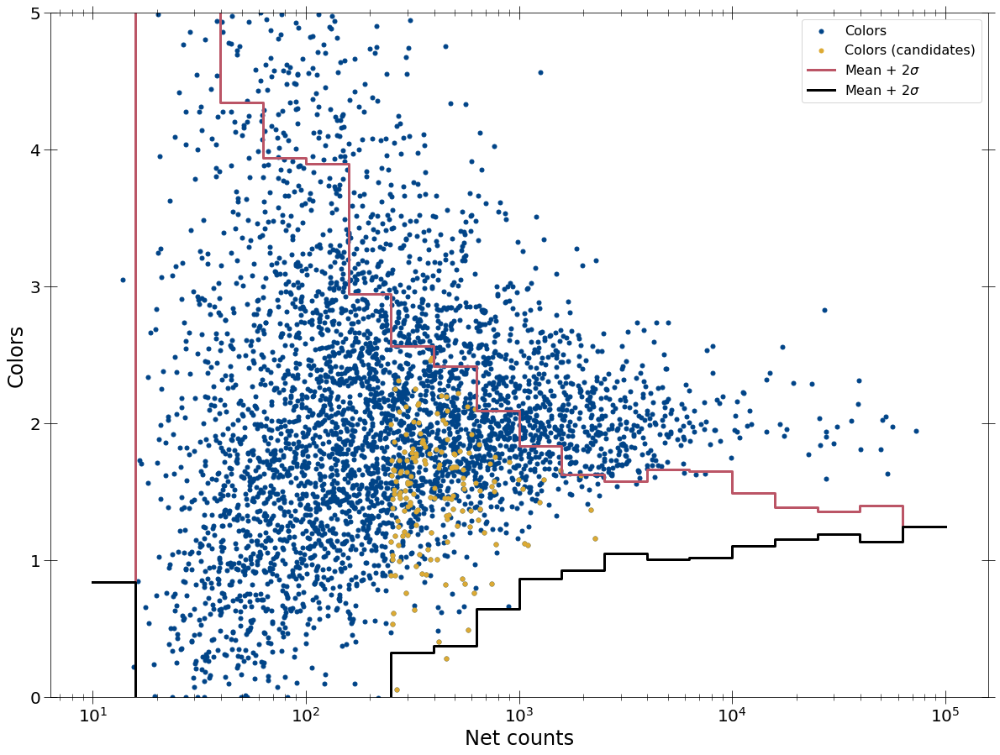

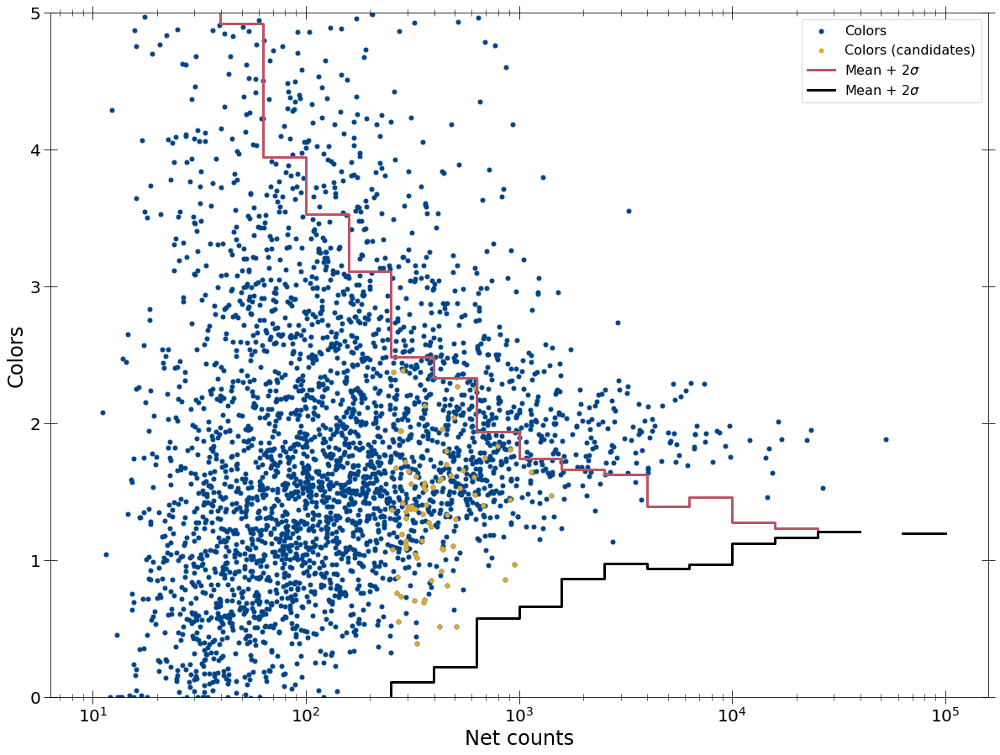

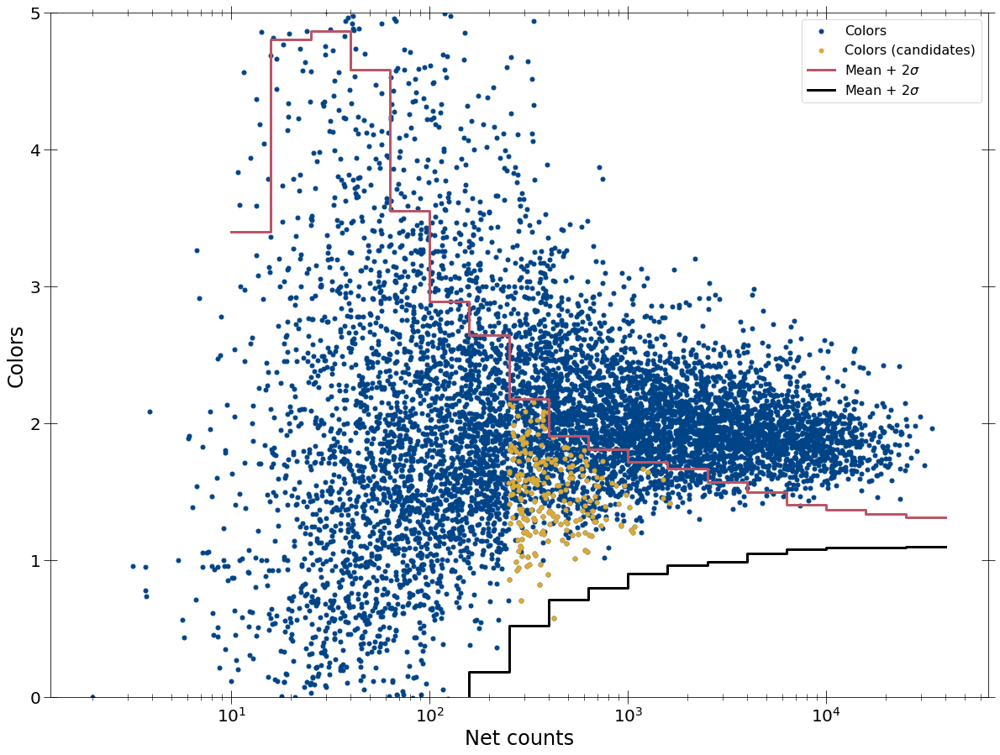

3:80: E501 line too long (82 > 79 characters)
7:80: E501 line too long (82 > 79 characters)
11:80: E501 line too long (82 > 79 characters)


In [274]:
cvs_as_msps_colors_pn, cvs_as_msps_netcounts_pn = mark_interested_srcs(
    sim_msps_color_dict_arr[0], sim_ips_color_dict_arr[0],
    spec_summary_msp_cvs['src_nums'][0], spec_summary_msp_cvs['spec_masks'][1][0],
    cvs_as_msps_pn)
cvs_as_msps_colors_mos, cvs_as_msps_netcounts_mos = mark_interested_srcs(
    sim_msps_color_dict_arr[1], sim_ips_color_dict_arr[1],
    spec_summary_msp_cvs['src_nums'][0], spec_summary_msp_cvs['spec_masks'][1][1],
    cvs_as_msps_mos)
cvs_as_msps_colors_acis, cvs_as_msps_netcounts_acis = mark_interested_srcs(
    sim_msps_color_dict_arr[2], sim_ips_color_dict_arr[2],
    spec_summary_msp_cvs['src_nums'][1], spec_summary_msp_cvs['spec_masks'][1][2],
    cvs_as_msps_acis)

In [275]:
spec_summary_cvs['src_nums'][0]

NameError: name 'spec_summary_cvs' is not defined

In [ ]:
fit_stats_arr = [[pn_fit_stats_table_pl_cv, pn_fit_stats_table_pl_g_cv,
                  pn_fit_stats_table_pl_g2_cv],
                 [mos_fit_stats_table_pl_cv, mos_fit_stats_table_pl_g_cv,
                  mos_fit_stats_table_pl_g2_cv],
                 [acis_fit_stats_table_pl_cv, acis_fit_stats_table_pl_g_sim,
                  acis_fit_stats_table_pl_g2_sim]]

model_params_arr = [[pn_model_params_table_pl_cv, pn_model_params_table_pl_g_cv,
                     pn_model_params_table_pl_g2_cv],
                    [mos_model_params_table_pl_cv,
                     mos_model_params_table_pl_g_cv,
                     mos_model_params_table_pl_g2_cv],
                    [acis_model_params_table_pl_cv,
                     acis_model_params_table_pl_g_sim,
                     acis_model_params_table_pl_g2_sim]]

det_names = ['PN', 'MOS', 'ACIS']
model_names = ['PL', 'PL_Gauss', 'PL_Gauss3']

for i in range(3):
    for j in range(3):
        fits_file_name = ('Fit_stats_CV_' + det_names[i] + '_' + model_names[j] +
                          '.txt')
        model_file_name = ('Model_params_CV_' + det_names[i] + '_' + model_names[j] +
                          '.txt')
        print(fits_file_name, model_file_name)
        np.savetxt(fits_file_name, fit_stats_arr[i][j], fmt='%s')
        np.savetxt(model_file_name, model_params_arr[i][j], fmt='%s')

# Checking for CVs detected as MSPs

In [276]:
def get_netcounthist_fraction(netcount_bins_arr, cand_netcounts_arr,
                              int_netcounts_arr, det_names_arr):
    """Get histogram of candidate sources based on a property."""
    interested_srcs_histogram = []
    candidate_srcs_histogram = []
    ratios = []
    err_ratios = []
    for i, netcount_bins in enumerate(netcount_bins_arr):
        print(netcount_bins)
        int_hist = np.histogram(int_netcounts_arr[i], bins=netcount_bins)[0]
        print(int_hist)
        cand_hist = np.histogram(cand_netcounts_arr[i], bins=netcount_bins)[0]
        print(cand_hist)
        ratio = cand_hist/int_hist
        err_ratio = (cand_hist**-0.5 + int_hist**-0.5)*ratio
        print(ratio[7:])
        print(err_ratio[7:])
        
        interested_srcs_histogram.append(int_hist)
        candidate_srcs_histogram.append(cand_hist)
        ratios.append(ratio)
        err_ratios.append(err_ratio)
        
    fig, ax1 = plt.subplots()
    ax1.set_xlabel('Net counts')
    ax1.set_xscale('log')
    ax1.set_xlim(250,1.0E+5)
    ax1.set_ylabel('# per net count bin')
    ax1.hist(int_netcounts_arr, bins=netcount_bins[7:])
    
    ax2 = ax1.twinx()
    ax2.set_ylabel('Fraction')
    ax2.set_ylim(0, 1.0)
    for i, netcount_bins in enumerate(netcount_bins_arr):
        ax2.errorbar(0.5*(netcount_bins[8:]+netcount_bins[7:-1]),
                     ratios[i][7:],
                     yerr=err_ratios[i][7:], capsize=15)
    return (interested_srcs_histogram, candidate_srcs_histogram, ratios,
            err_ratios)

18:1: W293 blank line contains whitespace
23:1: W293 blank line contains whitespace
27:21: E231 missing whitespace after ','
30:1: W293 blank line contains whitespace


[1.00000000e+01 1.58489319e+01 2.51188643e+01 3.98107171e+01
 6.30957344e+01 1.00000000e+02 1.58489319e+02 2.51188643e+02
 3.98107171e+02 6.30957344e+02 1.00000000e+03 1.58489319e+03
 2.51188643e+03 3.98107171e+03 6.30957344e+03 1.00000000e+04
 1.58489319e+04 2.51188643e+04 3.98107171e+04 6.30957344e+04
 1.00000000e+05]
[ 0  0  0  0  0  0  0 45 30 22 15 18 16  6  6  5  3  0  1  3]
[ 0  0  0  0  0  0  0 29 12  8  6 12  7  0  2  2  2  0  0  3]
[0.64444444 0.4        0.36363636 0.4        0.66666667 0.4375
 0.         0.33333333 0.4        0.66666667        nan 0.
 1.        ]
[0.21573843 0.18849973 0.2060924  0.26657887 0.34958493 0.27473446
        nan 0.37178502 0.46172815 0.8563047         nan        nan
 1.15470054]
[1.00000000e+01 1.58489319e+01 2.51188643e+01 3.98107171e+01
 6.30957344e+01 1.00000000e+02 1.58489319e+02 2.51188643e+02
 3.98107171e+02 6.30957344e+02 1.00000000e+03 1.58489319e+03
 2.51188643e+03 3.98107171e+03 6.30957344e+03 1.00000000e+04
 1.58489319e+04 2.51188643e+

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in power
  from ipykernel import kernelapp as app
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in multiply
  from ipykernel import kernelapp as app


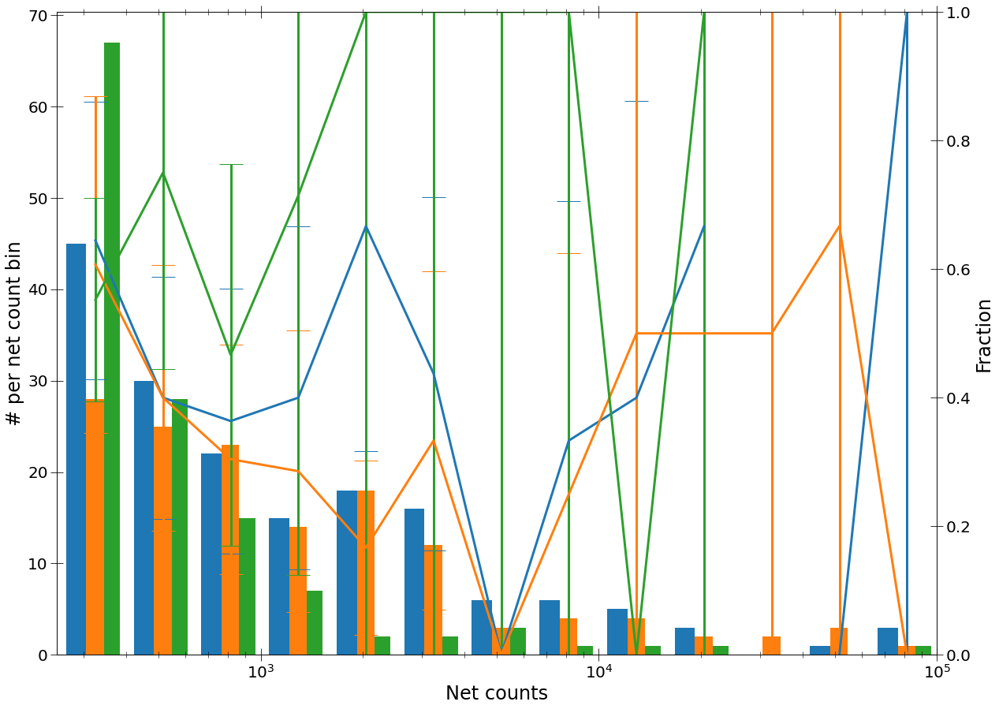

2:13: E127 continuation line over-indented for visual indent


In [277]:
(interested_msp_histogram, candidate_msp_histogram, ratios_msp,
            err_ratios_msp) = get_netcounthist_fraction(
    [sim_msps_color_dict_arr[0]['prop_bins'][0],
     sim_msps_color_dict_arr[1]['prop_bins'][0],
     sim_msps_color_dict_arr[2]['prop_bins'][0]],
    [candidate_msp_netcounts_pn, candidate_msp_netcounts_mos,
     candidate_msp_netcounts_acis],
    [interested_msp_netcounts_pn, interested_msp_netcounts_mos,
     interested_msp_netcounts_acis], ['PN', 'MOS', 'ACIS'])

[1.00000000e+01 1.58489319e+01 2.51188643e+01 3.98107171e+01
 6.30957344e+01 1.00000000e+02 1.58489319e+02 2.51188643e+02
 3.98107171e+02 6.30957344e+02 1.00000000e+03 1.58489319e+03
 2.51188643e+03 3.98107171e+03 6.30957344e+03 1.00000000e+04
 1.58489319e+04 2.51188643e+04 3.98107171e+04 6.30957344e+04
 1.00000000e+05]
[  0   0   0   0   0   0   5 386 325 197  67  21   2   2   2   0   0   0
   0   0]
[ 0  0  0  0  0  0  3 84 51 14  6  3  0  0  0  0  0  0  0  0]
[0.21761658 0.15692308 0.07106599 0.08955224 0.14285714 0.
 0.         0.                nan        nan        nan        nan
        nan]
[0.03482031 0.03067815 0.02405643 0.0475001  0.11365259        nan
        nan        nan        nan        nan        nan        nan
        nan]
[1.00000000e+01 1.58489319e+01 2.51188643e+01 3.98107171e+01
 6.30957344e+01 1.00000000e+02 1.58489319e+02 2.51188643e+02
 3.98107171e+02 6.30957344e+02 1.00000000e+03 1.58489319e+03
 2.51188643e+03 3.98107171e+03 6.30957344e+03 1.00000000e+04
 1.

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in power
  from ipykernel import kernelapp as app
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in multiply
  from ipykernel import kernelapp as app


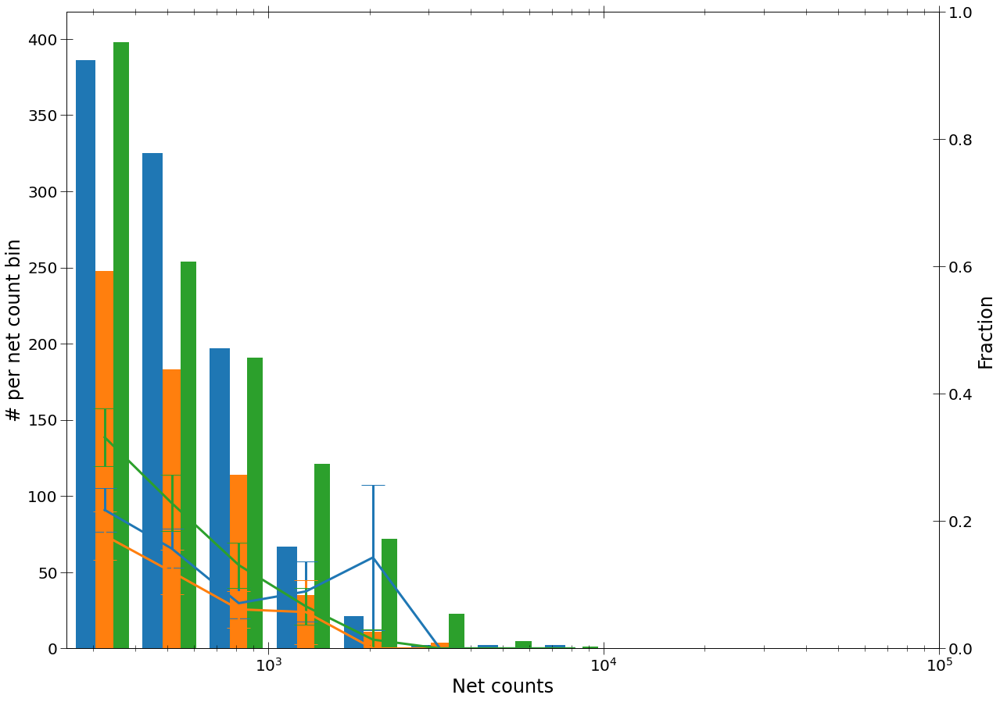

2:13: E127 continuation line over-indented for visual indent


In [278]:
(interested_cvs_histogram, cvs_as_msps_histogram, ratios_cv_as_msp,
            err_ratios_cv_as_msp) = get_netcounthist_fraction(
    [sim_msps_color_dict_arr[0]['prop_bins'][0],
     sim_msps_color_dict_arr[1]['prop_bins'][0],
     sim_msps_color_dict_arr[2]['prop_bins'][0]],
    [cvs_as_msps_netcounts_pn, cvs_as_msps_netcounts_mos,
     cvs_as_msps_netcounts_acis],
    [interested_cv_netcounts_pn, interested_cv_netcounts_mos,
     interested_cv_netcounts_acis], ['PN', 'MOS', 'ACIS'])

In [279]:
def get_const(yvals, err):
    nan_yvals = np.isnan(yvals)
    nan_errs = np.isnan(err)
    nan_vals = np.logical_or(nan_yvals, nan_errs)
    return np.sum((yvals/err**2)[~nan_vals])/np.sum((1.0/err**2)[~nan_vals])

In [280]:
get_const(ratios_msp[0][7:], err_ratios_msp[0][7:])

0.46035210474122834

In [281]:
get_const(ratios_msp[1][7:], err_ratios_msp[1][7:])

0.30648662594234566

In [282]:
get_const(ratios_msp[2][7:], err_ratios_msp[2][7:])

0.5913196988667956

[1.00000000e+01 1.58489319e+01 2.51188643e+01 3.98107171e+01
 6.30957344e+01 1.00000000e+02 1.58489319e+02 2.51188643e+02
 3.98107171e+02 6.30957344e+02 1.00000000e+03 1.58489319e+03
 2.51188643e+03 3.98107171e+03 6.30957344e+03 1.00000000e+04
 1.58489319e+04 2.51188643e+04 3.98107171e+04 6.30957344e+04
 1.00000000e+05]
[  6  20  44 108 150 125  77  66  47  32  25  26  22  12   7   7   5   1
   1   4]
[ 0  0  0  0  0  0  0 45 30 22 15 18 16  6  6  5  3  0  1  3]
[0.68181818 0.63829787 0.6875     0.6        0.69230769 0.72727273
 0.5        0.85714286 0.71428571 0.6        0.         1.
 0.75      ]
[0.18556547 0.20964203 0.26810947 0.27491933 0.2989512  0.33687325
 0.34846171 0.67389665 0.58941291 0.61473832        nan 2.
 0.8080127 ]
[1.00000000e+01 1.58489319e+01 2.51188643e+01 3.98107171e+01
 6.30957344e+01 1.00000000e+02 1.58489319e+02 2.51188643e+02
 3.98107171e+02 6.30957344e+02 1.00000000e+03 1.58489319e+03
 2.51188643e+03 3.98107171e+03 6.30957344e+03 1.00000000e+04
 1.58489319

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in power
  from ipykernel import kernelapp as app
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in multiply
  from ipykernel import kernelapp as app
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


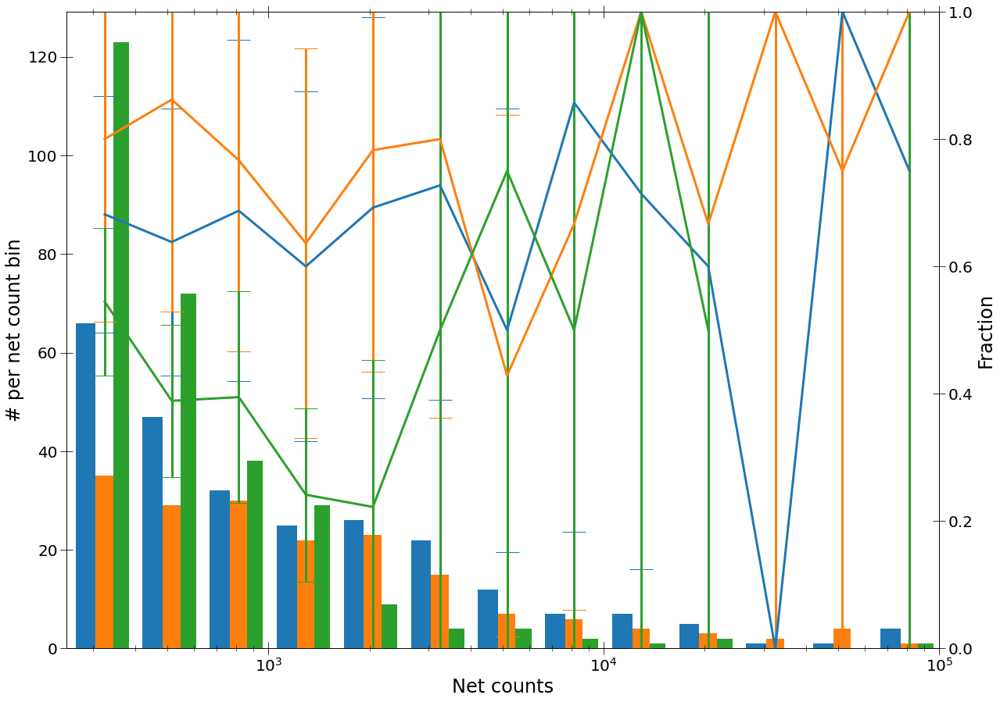

2:13: E127 continuation line over-indented for visual indent
8:80: E501 line too long (80 > 79 characters)


In [283]:
(netcount_obs_histogram, int_obs_histogram, ratios_int_obs,
            err_ratios_int_obs) = get_netcounthist_fraction(
    [sim_msps_color_dict_arr[0]['prop_bins'][0],
     sim_msps_color_dict_arr[1]['prop_bins'][0],
     sim_msps_color_dict_arr[2]['prop_bins'][0]],
    [interested_msp_netcounts_pn, interested_msp_netcounts_mos,
     interested_msp_netcounts_acis],
    [spec_summary_msps['counts'][0][0][1], spec_summary_msps['counts'][0][1][1],
     spec_summary_msps['counts'][0][2][1]], ['PN', 'MOS', 'ACIS'])

[1.00000000e+01 1.58489319e+01 2.51188643e+01 3.98107171e+01
 6.30957344e+01 1.00000000e+02 1.58489319e+02 2.51188643e+02
 3.98107171e+02 6.30957344e+02 1.00000000e+03 1.58489319e+03
 2.51188643e+03 3.98107171e+03 6.30957344e+03 1.00000000e+04
 1.58489319e+04 2.51188643e+04 3.98107171e+04 6.30957344e+04
 1.00000000e+05]
[740 773 790 691 705 666 612 540 439 335 226 159 102  57  21  13   7  11
   6   1]
[  0   0   0   0   0   0   5 386 325 197  67  21   2   2   2   0   0   0
   0   0]
[0.71481481 0.74031891 0.5880597  0.29646018 0.13207547 0.01960784
 0.03508772 0.0952381  0.         0.         0.         0.
 0.        ]
[0.06714385 0.076399   0.07402665 0.05593861 0.0392955  0.0158063
 0.02945825 0.08812616        nan        nan        nan        nan
        nan]
[1.00000000e+01 1.58489319e+01 2.51188643e+01 3.98107171e+01
 6.30957344e+01 1.00000000e+02 1.58489319e+02 2.51188643e+02
 3.98107171e+02 6.30957344e+02 1.00000000e+03 1.58489319e+03
 2.51188643e+03 3.98107171e+03 6.30957344e+0

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in power
  from ipykernel import kernelapp as app
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in multiply
  from ipykernel import kernelapp as app
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


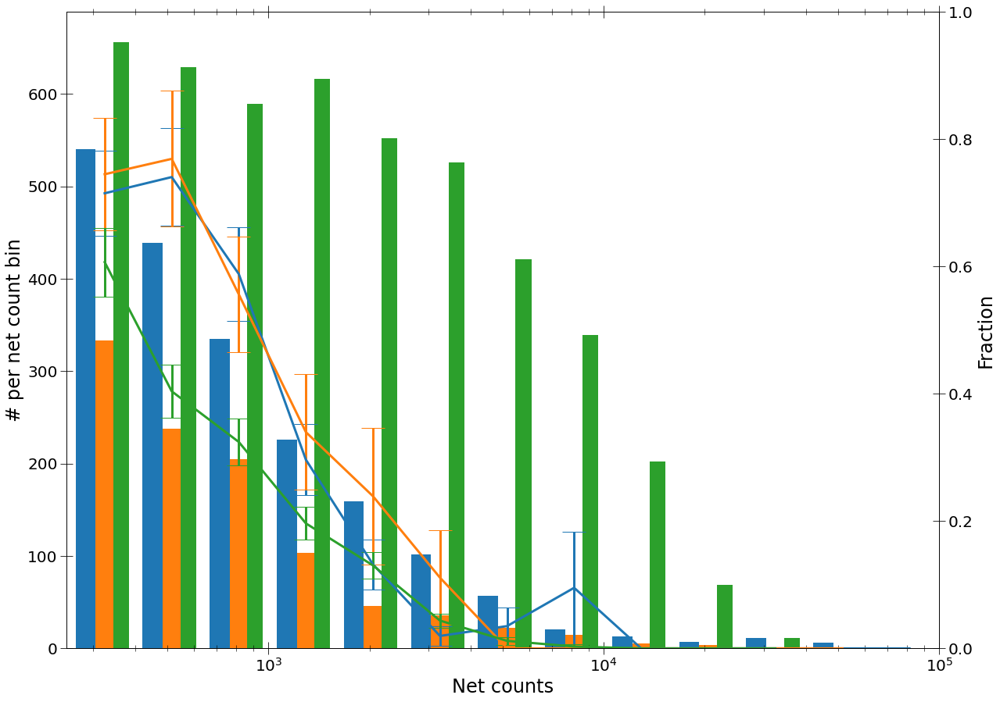

2:13: E127 continuation line over-indented for visual indent


In [285]:
(netcount_cvsim_histogram, int_cvsim_histogram, ratios_int_cvsim,
            err_ratios_int_cvsim) = get_netcounthist_fraction(
    [sim_msps_color_dict_arr[0]['prop_bins'][0],
     sim_msps_color_dict_arr[1]['prop_bins'][0],
     sim_msps_color_dict_arr[2]['prop_bins'][0]],
    [interested_cv_netcounts_pn, interested_cv_netcounts_mos,
     interested_cv_netcounts_acis],
    [spec_summary_msp_cvs['counts'][0][0][1],
     spec_summary_msp_cvs['counts'][0][1][1],
     spec_summary_msp_cvs['counts'][0][2][1]], ['PN', 'MOS', 'ACIS'])

In [93]:
def get_cvprob(p_nl_cvsim, p_nl_obs, p1_msp, p1_obs, p1_cv):
    p_nl_cvsim[np.isnan(p_nl_cvsim)] = 0.0
    p1_obs[np.isnan(p1_obs)] = 1.0
    p1_cv[np.isnan(p1_cv)] = 0.0
    return p_nl_cvsim/p_nl_obs*((p1_msp - p1_obs)/(p1_msp - p1_cv))

In [97]:
pn_cvprob1 = get_cvprob(ratios_cv_as_msp[0][7:], 0.46, 0.975, ratios_int_obs[0][7:],
                        ratios_int_cvsim[0][7:])

1:80: E501 line too long (84 > 79 characters)


In [98]:
pn_cvprob2 = get_cvprob(ratios_cv_as_msp[0][7:], ratios_msp[0][7:], 0.975,
                        ratios_int_obs[0][7:], ratios_int_cvsim[0][7:])

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """


In [106]:
mos_cvprob1 = get_cvprob(ratios_cv_as_msp[1][7:], 0.31, 0.975,
                         ratios_int_obs[1][7:], ratios_int_cvsim[1][7:])

In [107]:
mos_cvprob2 = get_cvprob(ratios_cv_as_msp[1][7:], ratios_msp[1][7:], 0.975,
           ratios_int_obs[1][7:], ratios_int_cvsim[1][7:])

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """
2:12: E128 continuation line under-indented for visual indent


In [105]:
acis_cvprob1 = get_cvprob(ratios_cv_as_msp[2][7:], 0.59, 0.975, ratios_int_obs[2][7:],
           ratios_int_cvsim[2][7:])

1:80: E501 line too long (86 > 79 characters)
2:12: E128 continuation line under-indented for visual indent


In [104]:
acis_cvprob2 = get_cvprob(ratios_cv_as_msp[2][7:], ratios_msp[2][7:], 0.975, ratios_int_obs[2][7:],
           ratios_int_cvsim[2][7:])

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """
1:80: E501 line too long (99 > 79 characters)
2:12: E128 continuation line under-indented for visual indent


In [109]:
pn_cvprob2*candidate_msp_histogram[0][7:]

array([11.03466021,  6.75422972,  1.16165824,  0.7423755 ,  0.86238216,
        0.        ,         nan,  0.        ,  0.        ,  0.        ,
               nan,         nan,  0.        ])

In [110]:
mos_cvprob2*candidate_msp_histogram[1][7:]

array([ 3.77561345,  1.6468834 ,  0.70237153,  0.42649807,  0.        ,
        0.        ,         nan,  0.        , -0.        ,  0.        ,
       -0.        ,  0.        ,         nan])

In [117]:
acis_cvprob2*candidate_msp_histogram[2][7:]

array([2.59614130e+01, 6.56078657e+00, 1.75076437e+00, 4.36089636e-01,
       2.47588859e-02, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
                  nan, 0.00000000e+00,            nan,            nan,
                  nan])

In [128]:
acis_cvprob1

array([ 0.65675216,  0.39714204,  0.19782648,  0.10559071,  0.02098211,
        0.        ,  0.        ,  0.        , -0.        ,  0.        ,
       -0.        , -0.        , -0.        ])

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Error in callback <bound method VarWatcher.auto_run_flake8 of <pycodestyle_magic.VarWatcher object at 0x7fd9ccc56750>> (for post_run_cell):
Traceback (most recent call last):
  File "/Users/pavanrh/anaconda3/lib/python3.7/site-packages/IPython/core/events.py", line 88, in trigger
    func(*args, **kwargs)
  File "/Users/pavanrh/anaconda3/lib/python3.7/site-packages/pycodestyle_magic.py", line 41, in auto_run_flake8
    flake8(1, result.info.raw_cell, auto=True)
  File "</Users/pavanrh/anaconda3/lib/python3.7/site-packages/decorator.py:decorator-gen-131>", line 2, in flake8
  File "/Users/pavanrh/anaconda3/lib/python3.7/site-packages/IPython/core/magic.py", line 220, in <lambda>
    call = lambda f, *a, **k: f(*a, **k)
  File "/Users/pavanrh/anaconda3/lib/python3.7/site-packages/pycodestyle_magic.py", line 213, in flake8
    max_line_length=max_line_length
  File "/Users/pavanrh/anaconda3/lib/python3.7/site-packages/flake8/api/legacy.py", line 34, in get_style_guide
    application.make

FileNotFoundError: [Errno 2] No such file or directory

In [120]:
candidate_msp_histogram

[array([ 0,  0,  0,  0,  0,  0,  0, 29, 12,  8,  6, 12,  7,  0,  2,  2,  2,
         0,  0,  3]),
 array([ 0,  0,  0,  0,  0,  0,  2, 17, 10,  7,  4,  3,  4,  0,  1,  2,  1,
         1,  2,  0]),
 array([ 0,  0,  0,  0,  0,  0,  0, 37, 21,  7,  5,  2,  2,  3,  1,  0,  1,
         0,  0,  0])]

In [122]:
37*0.7

25.9